In [1]:
# Importação de Bibliotecas
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import re
import requests, zipfile
import os
import shutil
from io import BytesIO
from os.path import exists

In [2]:
# Criação das variáveis de ambiente
sep = ';'
dec = ','
enc = 'latin1'
ufs = ['AC', 'AL', 'AM', 'AP', 'BA', 'CE', 'DF', 'ES', 'GO', 'MA', 'MG', 'MS', 'MT', 'PA', 'PB', 'PE', 'PI', 'PR', 'RJ', 'RN', 'RO', 'RR', 'RS', 'SC', 'SE', 'SP', 'TO', 'ZZ']
ufs_ne = ['MA', 'PI', 'CE', 'RN', 'PB', 'PE', 'AL', 'SE', 'BA']
ufs_n = ['AM', 'PA', 'AC', 'RO', 'RR', 'AP', 'TO']
ufs_co = ['MT', 'MS', 'GO']
ufs_se = ['SP', 'MG', 'RJ', 'ES']
ufs_s = ['PR', 'SC', 'RS']
turnos = [('1', '051020221321'), ('2', '311020221535')]
df_columns = ['DT_BU_RECEBIDO', 'CD_ELEICAO', 'NR_TURNO','SG_UF','CD_MUNICIPIO','NM_MUNICIPIO','NR_ZONA','NR_SECAO','NR_LOCAL_VOTACAO','QT_APTOS','QT_COMPARECIMENTO','QT_ABSTENCOES','CD_TIPO_URNA','DS_TIPO_URNA','NR_VOTAVEL','NM_VOTAVEL','QT_VOTOS','NR_URNA_EFETIVADA','CD_CARGA_1_URNA_EFETIVADA','CD_CARGA_2_URNA_EFETIVADA','CD_FLASHCARD_URNA_EFETIVADA','DT_CARGA_URNA_EFETIVADA','DS_AGREGADAS','DT_ABERTURA','DT_ENCERRAMENTO','QT_ELEITORES_BIOMETRIA_NH','DT_EMISSAO_BU','NR_JUNTA_APURADORA','NR_TURMA_APURADORA']
date_fmt = mdates.DateFormatter('%H:%M')
df1 = None
df2 = None

In [3]:
# Arrumação da pasta 'dados'

for uf in ufs_ne:
    for turno in turnos:
        arquivo = f'bweb_{turno[0]}t_{uf}_{turno[1]}'
        if exists(f'dados/{arquivo}/'):
            print(f'Existe dados/{arquivo}/')
            if exists(f'dados/{arquivo}/{arquivo}.csv'):
                print(f'Existe dados/{arquivo}/{arquivo}.csv')
                shutil.move(f'dados/{arquivo}/{arquivo}.csv', f'dados/{arquivo}.csv')
                shutil.rmtree(f'dados/{arquivo}/')
            

In [4]:
# Função para obter agrupamento de diferenças entre DataFrames por NM_VOTAVEL

def df_diff_group(df_main, df_urnas):
    df_soma = None

    for i in range(len(df_urnas)):
        cidade = df_urnas.iloc[i, df_urnas.columns.get_loc('CD_MUNICIPIO')]
        zona = df_urnas.iloc[i, df_urnas.columns.get_loc('NR_ZONA')]
        secao = df_urnas.iloc[i, df_urnas.columns.get_loc('NR_SECAO')]
        local = df_urnas.iloc[i, df_urnas.columns.get_loc('NR_LOCAL_VOTACAO')]

        df_temp = df_main[(df_main['CD_MUNICIPIO'] == cidade) &
                          (df_main['NR_ZONA'] == zona) &
                          (df_main['NR_SECAO'] == secao) &
                          (df_main['NR_LOCAL_VOTACAO'] == local)][['NM_VOTAVEL', 'QT_VOTOS']]

        if (df_soma is not None):
            df_soma = pd.concat([df_soma, df_temp], ignore_index=True)
        else:        
            df_soma = df_temp

    if df_soma is not None:
        df_soma = df_soma.groupby('NM_VOTAVEL', as_index=False).sum('QT_VOTOS')

    return df_soma

In [5]:
# Função para gerar grafico de totalização temporal

def gerar_grafico_temporal(df, titulo, uf):
    total = df['QT_VOTOS'].sum()

    df_13 = df[df['NR_VOTAVEL'] == 13][['data_hora', 'QT_VOTOS']]
    df_22 = df[df['NR_VOTAVEL'] == 22][['data_hora', 'QT_VOTOS']]

    df_13.set_index('data_hora', inplace=True)
    df_22.set_index('data_hora', inplace=True)

    df_13.sort_index(inplace=True)
    df_22.sort_index(inplace=True)

    df_13['acumulados'] = df_13['QT_VOTOS'].cumsum()
    df_22['acumulados'] = df_22['QT_VOTOS'].cumsum()

    df_13['acumulados'] = (df_13['acumulados'] / total) * 100
    df_22['acumulados'] = (df_22['acumulados'] / total) * 100

    # Grafico da apuração de votos por horário
    fig, ax = plt.subplots(figsize=(10,5))

    ax.plot(df_22.index, df_22['acumulados'], label=f"Bolsonaro ({df_22['acumulados'].iloc[-1]:.2f}%)")
    ax.plot(df_13.index, df_13['acumulados'], label=f"Lula ({df_13['acumulados'].iloc[-1]:.2f}%)")

    date_fmt = mdates.DateFormatter('%H:%M')
    ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
    ax.xaxis.set_major_formatter(date_fmt)
    ax.xaxis.set_tick_params(labelrotation=90)

    ax.set_title(f'{titulo} ({uf})')
    ax.legend()

In [6]:
# Função para gerar gráfico de porcentagem total

def gerar_grafico_porcentagem(df, titulo, uf_extenso):
    total = df['QT_VOTOS'].sum()

    df_order = df.groupby('NM_VOTAVEL', as_index=False)['QT_VOTOS'].sum()
    df_order['QT_VOTOS'] = (df_order['QT_VOTOS'] / total) * 100
    plt.figure(figsize=(10,5))
    ax = sns.barplot(x='NM_VOTAVEL', 
                    y='QT_VOTOS', 
                    data=df_order)

    ax.bar_label(ax.containers[0], fmt="%.2f%%")
    ax.set(title=f'{titulo} - {uf_extenso}')

    for item in ax.get_xticklabels():
        item.set_rotation(75)

In [7]:
# Função para gerar contagem de urnas suspeitas

def gerar_grafico_urnas_suspeitas(df_soma, df_urnas_22, uf_extenso):
    plt.figure(figsize=(10,5))
    ax = sns.barplot(x='NM_VOTAVEL', 
                    y='QT_VOTOS', 
                    data=df_soma)

    ax.bar_label(ax.containers[0])
    ax.set(title=f'Votos nas {df_urnas_22["NR_VOTAVEL"].count()} urnas que tiveram 1 voto no 22 - 1º Turno - {uf_extenso}')

    for item in ax.get_xticklabels():
        item.set_rotation(75)

# Estudo sobre Eleições Presidenciais

## Carga de Dados

### BAHIA

In [47]:
# Carga dos dados dos BUs - Bahia
arquivo1 = f'dados/bweb_{turnos[0][0]}t_BA_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_BA_{turnos[1][1]}.csv'

df1ba = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2ba = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1ba['data_hora'] = pd.to_datetime(df1ba['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2ba['data_hora'] = pd.to_datetime(df2ba['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1ba = df1ba[df1ba['CD_ELEICAO'] == 544]
df2ba = df2ba[df2ba['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_BA_051020221321.csv
Carregado: dados/bweb_2t_BA_311020221535.csv


### MARANHÃO

In [48]:
# Carga dos dados dos BUs - Maranhão
arquivo1 = f'dados/bweb_{turnos[0][0]}t_MA_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_MA_{turnos[1][1]}.csv'

df1ma = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2ma = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1ma['data_hora'] = pd.to_datetime(df1ma['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2ma['data_hora'] = pd.to_datetime(df2ma['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1ma = df1ma[df1ma['CD_ELEICAO'] == 544]
df2ma = df2ma[df2ma['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_MA_051020221321.csv
Carregado: dados/bweb_2t_MA_311020221535.csv


### PIAUI

In [49]:
# Carga dos dados dos BUs - Piaui
arquivo1 = f'dados/bweb_{turnos[0][0]}t_PI_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_PI_{turnos[1][1]}.csv'

df1pi = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2pi = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1pi['data_hora'] = pd.to_datetime(df1pi['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2pi['data_hora'] = pd.to_datetime(df2pi['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1pi = df1pi[df1pi['CD_ELEICAO'] == 544]
df2pi = df2pi[df2pi['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_PI_051020221321.csv
Carregado: dados/bweb_2t_PI_311020221535.csv


### CEARÁ

In [50]:
# Carga dos dados dos BUs - Ceará
arquivo1 = f'dados/bweb_{turnos[0][0]}t_CE_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_CE_{turnos[1][1]}.csv'

df1ce = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2ce = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1ce['data_hora'] = pd.to_datetime(df1ce['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2ce['data_hora'] = pd.to_datetime(df2ce['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1ce = df1ce[df1ce['CD_ELEICAO'] == 544]
df2ce = df2ce[df2ce['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_CE_051020221321.csv
Carregado: dados/bweb_2t_CE_311020221535.csv


### RIO GRANDE DO NORTE

In [51]:
# Carga dos dados dos BUs - Piaui
arquivo1 = f'dados/bweb_{turnos[0][0]}t_RN_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_RN_{turnos[1][1]}.csv'

df1rn = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2rn = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1rn['data_hora'] = pd.to_datetime(df1rn['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2rn['data_hora'] = pd.to_datetime(df2rn['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1rn = df1rn[df1rn['CD_ELEICAO'] == 544]
df2rn = df2rn[df2rn['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_RN_051020221321.csv
Carregado: dados/bweb_2t_RN_311020221535.csv


### PARAÍBA

In [52]:
# Carga dos dados dos BUs - Piaui
arquivo1 = f'dados/bweb_{turnos[0][0]}t_PB_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_PB_{turnos[1][1]}.csv'

df1pb = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2pb = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1pb['data_hora'] = pd.to_datetime(df1pb['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2pb['data_hora'] = pd.to_datetime(df2pb['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1pb = df1pb[df1pb['CD_ELEICAO'] == 544]
df2pb = df2pb[df2pb['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_PB_051020221321.csv
Carregado: dados/bweb_2t_PB_311020221535.csv


### PERNAMBUCO

In [60]:
# Carga dos dados dos BUs - Piaui
arquivo1 = f'dados/bweb_{turnos[0][0]}t_PE_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_PE_{turnos[1][1]}.csv'

df1pe = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2pe = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1pe['data_hora'] = pd.to_datetime(df1pe['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2pe['data_hora'] = pd.to_datetime(df2pe['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1pe = df1pe[df1pe['CD_ELEICAO'] == 544]
df2pe = df2pe[df2pe['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_PE_051020221321.csv
Carregado: dados/bweb_2t_PE_311020221535.csv


### ALAGOAS

In [23]:

# Carga dos dados dos BUs - Alagoas
arquivo1 = f'dados/bweb_{turnos[0][0]}t_AL_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_AL_{turnos[1][1]}.csv'

df1al = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2al = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1al['data_hora'] = pd.to_datetime(df1al['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2al['data_hora'] = pd.to_datetime(df2al['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1al = df1al[df1al['CD_ELEICAO'] == 544]
df2al = df2al[df2al['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_AL_051020221321.csv
Carregado: dados/bweb_2t_AL_311020221535.csv


### SERGIPE

In [24]:
# Carga dos dados dos BUs - Sergipe
arquivo1 = f'dados/bweb_{turnos[0][0]}t_SE_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_SE_{turnos[1][1]}.csv'

df1se = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2se = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1se['data_hora'] = pd.to_datetime(df1se['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2se['data_hora'] = pd.to_datetime(df2se['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1se = df1se[df1se['CD_ELEICAO'] == 544]
df2se = df2se[df2se['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_SE_051020221321.csv
Carregado: dados/bweb_2t_SE_311020221535.csv


### AMAZONAS


In [25]:
# Carga dos dados dos BUs - Amazonas
arquivo1 = f'dados/bweb_{turnos[0][0]}t_AM_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_AM_{turnos[1][1]}.csv'

df1am = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2am = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1am['data_hora'] = pd.to_datetime(df1am['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2am['data_hora'] = pd.to_datetime(df2am['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1am = df1am[df1am['CD_ELEICAO'] == 544]
df2am = df2am[df2am['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_AM_051020221321.csv
Carregado: dados/bweb_2t_AM_311020221535.csv


### PARÁ


In [26]:
# Carga dos dados dos BUs - Pará
arquivo1 = f'dados/bweb_{turnos[0][0]}t_PA_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_PA_{turnos[1][1]}.csv'

df1pa = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2pa = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1pa['data_hora'] = pd.to_datetime(df1pa['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2pa['data_hora'] = pd.to_datetime(df2pa['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1pa = df1pa[df1pa['CD_ELEICAO'] == 544]
df2pa = df2pa[df2pa['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_PA_051020221321.csv
Carregado: dados/bweb_2t_PA_311020221535.csv


### ACRE


In [27]:
# Carga dos dados dos BUs - Acre
arquivo1 = f'dados/bweb_{turnos[0][0]}t_AC_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_AC_{turnos[1][1]}.csv'

df1ac = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2ac = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1ac['data_hora'] = pd.to_datetime(df1ac['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2ac['data_hora'] = pd.to_datetime(df2ac['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1ac = df1ac[df1ac['CD_ELEICAO'] == 544]
df2ac = df2ac[df2ac['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_AC_051020221321.csv
Carregado: dados/bweb_2t_AC_311020221535.csv


### RONDÔNIA


In [28]:
# Carga dos dados dos BUs - Rondônia
arquivo1 = f'dados/bweb_{turnos[0][0]}t_RO_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_RO_{turnos[1][1]}.csv'

df1ro = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2ro = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1ro['data_hora'] = pd.to_datetime(df1ro['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2ro['data_hora'] = pd.to_datetime(df2ro['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1ro = df1ro[df1ro['CD_ELEICAO'] == 544]
df2ro = df2ro[df2ro['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_RO_051020221321.csv
Carregado: dados/bweb_2t_RO_311020221535.csv


### RORAIMA


In [29]:
# Carga dos dados dos BUs - Roraima
arquivo1 = f'dados/bweb_{turnos[0][0]}t_RR_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_RR_{turnos[1][1]}.csv'

df1rr = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2rr = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1rr['data_hora'] = pd.to_datetime(df1rr['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2rr['data_hora'] = pd.to_datetime(df2rr['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1rr = df1rr[df1rr['CD_ELEICAO'] == 544]
df2rr = df2rr[df2rr['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_RR_051020221321.csv
Carregado: dados/bweb_2t_RR_311020221535.csv


### AMAPÁ


In [30]:
# Carga dos dados dos BUs - Amapá
arquivo1 = f'dados/bweb_{turnos[0][0]}t_AP_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_AP_{turnos[1][1]}.csv'

df1ap = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2ap = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1ap['data_hora'] = pd.to_datetime(df1ap['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2ap['data_hora'] = pd.to_datetime(df2ap['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1ap = df1ap[df1ap['CD_ELEICAO'] == 544]
df2ap = df2ap[df2ap['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_AP_051020221321.csv
Carregado: dados/bweb_2t_AP_311020221535.csv


### TOCANTINS


In [31]:
# Carga dos dados dos BUs - Tocantins
arquivo1 = f'dados/bweb_{turnos[0][0]}t_TO_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_TO_{turnos[1][1]}.csv'

df1to = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2to = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1to['data_hora'] = pd.to_datetime(df1to['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2to['data_hora'] = pd.to_datetime(df2to['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1to = df1to[df1to['CD_ELEICAO'] == 544]
df2to = df2to[df2to['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_TO_051020221321.csv
Carregado: dados/bweb_2t_TO_311020221535.csv


### MATO GROSSO


In [32]:
# Carga dos dados dos BUs - Mato Grosso
arquivo1 = f'dados/bweb_{turnos[0][0]}t_MT_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_MT_{turnos[1][1]}.csv'

df1mt = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2mt = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1mt['data_hora'] = pd.to_datetime(df1mt['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2mt['data_hora'] = pd.to_datetime(df2mt['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1mt = df1mt[df1mt['CD_ELEICAO'] == 544]
df2mt = df2mt[df2mt['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_MT_051020221321.csv
Carregado: dados/bweb_2t_MT_311020221535.csv


### GOIAS


In [33]:
# Carga dos dados dos BUs - Goias
arquivo1 = f'dados/bweb_{turnos[0][0]}t_GO_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_GO_{turnos[1][1]}.csv'

df1go = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2go = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1go['data_hora'] = pd.to_datetime(df1go['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2go['data_hora'] = pd.to_datetime(df2go['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1go = df1go[df1go['CD_ELEICAO'] == 544]
df2go = df2go[df2go['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_GO_051020221321.csv
Carregado: dados/bweb_2t_GO_311020221535.csv


### MATO GROSSO DO SUL


In [34]:
# Carga dos dados dos BUs - Mato Grosso do Sul
arquivo1 = f'dados/bweb_{turnos[0][0]}t_MS_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_MS_{turnos[1][1]}.csv'

df1ms = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2ms = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1ms['data_hora'] = pd.to_datetime(df1ms['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2ms['data_hora'] = pd.to_datetime(df2ms['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1ms = df1ms[df1ms['CD_ELEICAO'] == 544]
df2ms = df2ms[df2ms['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_MS_051020221321.csv
Carregado: dados/bweb_2t_MS_311020221535.csv


### SÃO PAULO


In [35]:
# Carga dos dados dos BUs - São Paulo
arquivo1 = f'dados/bweb_{turnos[0][0]}t_SP_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_SP_{turnos[1][1]}.csv'

df1sp = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2sp = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1sp['data_hora'] = pd.to_datetime(df1sp['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2sp['data_hora'] = pd.to_datetime(df2sp['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1sp = df1sp[df1sp['CD_ELEICAO'] == 544]
df2sp = df2sp[df2sp['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_SP_051020221321.csv
Carregado: dados/bweb_2t_SP_311020221535.csv


### RIO DE JANEIRO


In [36]:
# Carga dos dados dos BUs - Rio de Janeiro
arquivo1 = f'dados/bweb_{turnos[0][0]}t_RJ_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_RJ_{turnos[1][1]}.csv'

df1rj = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2rj = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1rj['data_hora'] = pd.to_datetime(df1rj['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2rj['data_hora'] = pd.to_datetime(df2rj['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1rj = df1rj[df1rj['CD_ELEICAO'] == 544]
df2rj = df2rj[df2rj['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_RJ_051020221321.csv
Carregado: dados/bweb_2t_RJ_311020221535.csv


### ESPÍRITO SANTO


In [37]:
# Carga dos dados dos BUs - Espírito Santo
arquivo1 = f'dados/bweb_{turnos[0][0]}t_ES_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_ES_{turnos[1][1]}.csv'

df1es = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2es = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1es['data_hora'] = pd.to_datetime(df1es['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2es['data_hora'] = pd.to_datetime(df2es['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1es = df1es[df1es['CD_ELEICAO'] == 544]
df2es = df2es[df2es['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_ES_051020221321.csv
Carregado: dados/bweb_2t_ES_311020221535.csv


### MINAS GERAIS


In [38]:
# Carga dos dados dos BUs - Minas Gerais
arquivo1 = f'dados/bweb_{turnos[0][0]}t_MG_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_MG_{turnos[1][1]}.csv'

df1mg = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2mg = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1mg['data_hora'] = pd.to_datetime(df1mg['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2mg['data_hora'] = pd.to_datetime(df2mg['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1mg = df1mg[df1mg['CD_ELEICAO'] == 544]
df2mg = df2mg[df2mg['CD_ELEICAO'] == 545]

/var/folders/nv/lqyc8nv104gff5kns5mk9gcm0000gp/T/ipykernel_2520/3636097012.py:5: DtypeWarning: Columns (35) have mixed types. Specify dtype option on import or set low_memory=False.
  df1mg = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)


Carregado: dados/bweb_1t_MG_051020221321.csv
Carregado: dados/bweb_2t_MG_311020221535.csv


### PARANÁ


In [39]:
# Carga dos dados dos BUs - Paraná
arquivo1 = f'dados/bweb_{turnos[0][0]}t_PR_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_PR_{turnos[1][1]}.csv'

df1pr = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2pr = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1pr['data_hora'] = pd.to_datetime(df1pr['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2pr['data_hora'] = pd.to_datetime(df2pr['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1pr = df1pr[df1pr['CD_ELEICAO'] == 544]
df2pr = df2pr[df2pr['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_PR_051020221321.csv
Carregado: dados/bweb_2t_PR_311020221535.csv


### SANTA CATARINA


In [40]:
# Carga dos dados dos BUs - Santa Catarina
arquivo1 = f'dados/bweb_{turnos[0][0]}t_SC_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_SC_{turnos[1][1]}.csv'

df1sc = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2sc = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1sc['data_hora'] = pd.to_datetime(df1sc['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2sc['data_hora'] = pd.to_datetime(df2sc['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1sc = df1sc[df1sc['CD_ELEICAO'] == 544]
df2sc = df2sc[df2sc['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_SC_051020221321.csv
Carregado: dados/bweb_2t_SC_311020221535.csv


### RIO GRANDE DO SUL


In [41]:
# Carga dos dados dos BUs - Rio Grande do Sul
arquivo1 = f'dados/bweb_{turnos[0][0]}t_RS_{turnos[0][1]}.csv'
arquivo2 = f'dados/bweb_{turnos[1][0]}t_RS_{turnos[1][1]}.csv'

df1rs = pd.read_csv(arquivo1, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo1}')
df2rs = pd.read_csv(arquivo2, usecols=df_columns, encoding=enc, sep=sep)
print(f'Carregado: {arquivo2}')

# Criação do campo 'data_hora' para conter os dados de recebimento do BU
df1rs['data_hora'] = pd.to_datetime(df1rs['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')
df2rs['data_hora'] = pd.to_datetime(df2rs['DT_BU_RECEBIDO'], format='%d/%m/%Y %H:%M:%S')

# Separação dos votos para Presidente
df1rs = df1rs[df1rs['CD_ELEICAO'] == 544]
df2rs = df2rs[df2rs['CD_ELEICAO'] == 545]

Carregado: dados/bweb_1t_RS_051020221321.csv
Carregado: dados/bweb_2t_RS_311020221535.csv


## 1 - PRIMEIRO TURNO

### 1.1 - Região NORDESTE

#### 1.1.1 - Estados

##### 1.1.1.1 - BAHIA

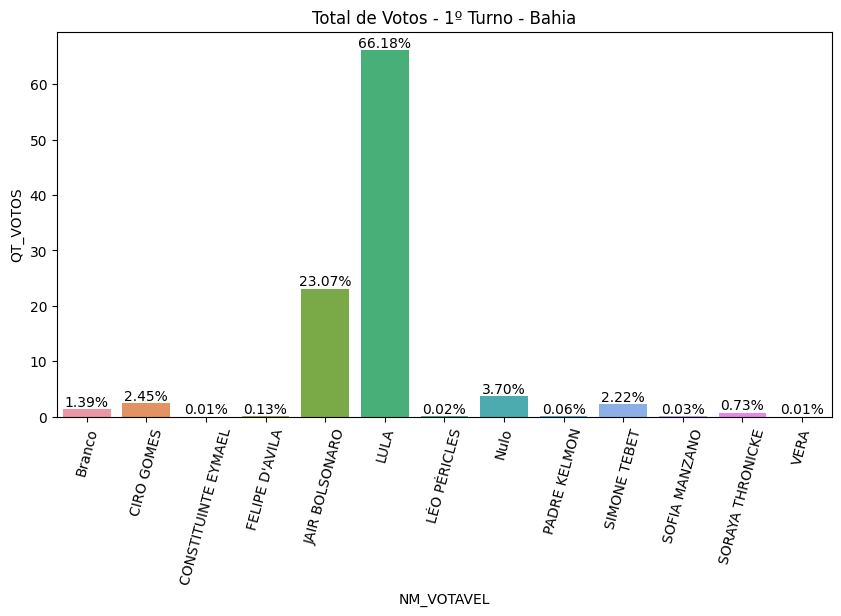

In [42]:
# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1ba, 'Total de Votos - 1º Turno', 'Bahia')

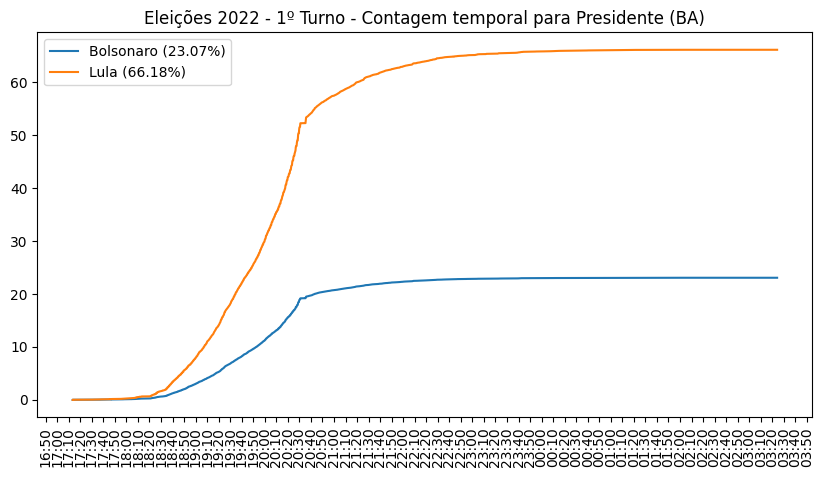

In [43]:
# Total de votos acumulados

gerar_grafico_temporal(df1ba, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'BA')

Quantidade de urnas com 1 voto - Primeiro Turno

In [44]:
df1ba_urnas = df1ba[df1ba['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1ba_urnas[df1ba_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1ba_urnas[df1ba_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")

Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 45


Quais as seções eleitorais que apresentaram urnas com 1 voto no 22?

In [45]:

df1ba_urnas_22 = df1ba_urnas[df1ba_urnas['NR_VOTAVEL'] == 22]
df1ba_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']]

,NM_MUNICIPIO,NR_ZONA,NR_SECAO,NR_LOCAL_VOTACAO
283320,SALVADOR,5,800,1805
1140031,SALVADOR,19,800,1490
1172982,MANOEL VITORINO,22,160,1139
1690456,ITABERABA,42,288,1570
1705199,CASTRO ALVES,43,132,1376
1746978,SENHOR DO BONFIM,45,310,1872
1748071,SENHOR DO BONFIM,45,322,1937
1861118,MONTE SANTO,50,310,1945
2035534,LAGOA REAL,63,111,1210
2036042,CAETITÉ,63,120,1791


Das urnas em que o 22 recebeu 1 voto, qual a quantidade de votos totais?

In [46]:

df_soma = df_diff_group(df1ba, df1ba_urnas_22)

gerar_grafico_votos_suspeitos(df_soma, df1ba_urnas_22, 'Bahia')

NameError: name 'gerar_grafico_votos_suspeitos' is not defined

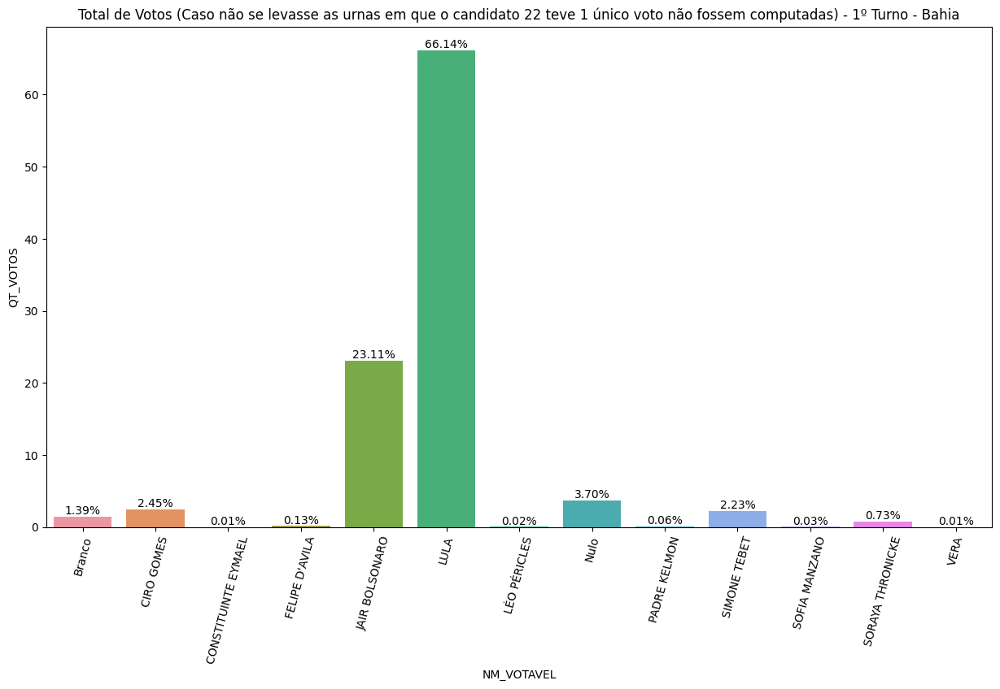

In [ ]:
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas

df1ba_sub = df1ba[~((df1ba['CD_MUNICIPIO'].isin(df1ba_urnas_22['CD_MUNICIPIO'])) & 
                    (df1ba['NR_ZONA'].isin(df1ba_urnas_22['NR_ZONA'])) & 
                    (df1ba['NR_SECAO'].isin(df1ba_urnas_22['NR_SECAO'])) & 
                    (df1ba['NR_LOCAL_VOTACAO'].isin(df1ba_urnas_22['NR_LOCAL_VOTACAO'])))]

gerar_grafico_porcentagem(df1ba_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Bahia')

In [ ]:
#*********************************
df1ba.shape, df1ba_sub.shape

((246105, 30), (244888, 30))

In [ ]:
df_sub = None
df_urnas = df1ba[df1ba['QT_VOTOS'] == 1]

cidade = df_urnas.loc[df1ba_urnas_22.index]['CD_MUNICIPIO']
zona = df_urnas.loc[df1ba_urnas_22.index]['NR_ZONA']
secao = df_urnas.loc[df1ba_urnas_22.index]['NR_SECAO']
local = df_urnas.loc[df1ba_urnas_22.index]['NR_LOCAL_VOTACAO']

df_temp = df1ba[~(df1ba['CD_MUNICIPIO'].isin(cidade) &
                  df1ba['NR_ZONA'].isin(zona) &
                  df1ba['NR_SECAO'].isin(secao) &
                  df1ba['NR_LOCAL_VOTACAO'].isin(local))]

if (df_soma is not None):
    df_soma = pd.concat([df_soma, df_temp], ignore_index=True)
else:        
    df_soma = df_temp

In [ ]:
df1ba.shape, df1ba_sub.shape, df_soma.shape

((246105, 30), (244888, 30), (119355595, 30))

Caso não se computasse as urnas em que o candidato 22 teve 1 único voto, qual seria o resultado?

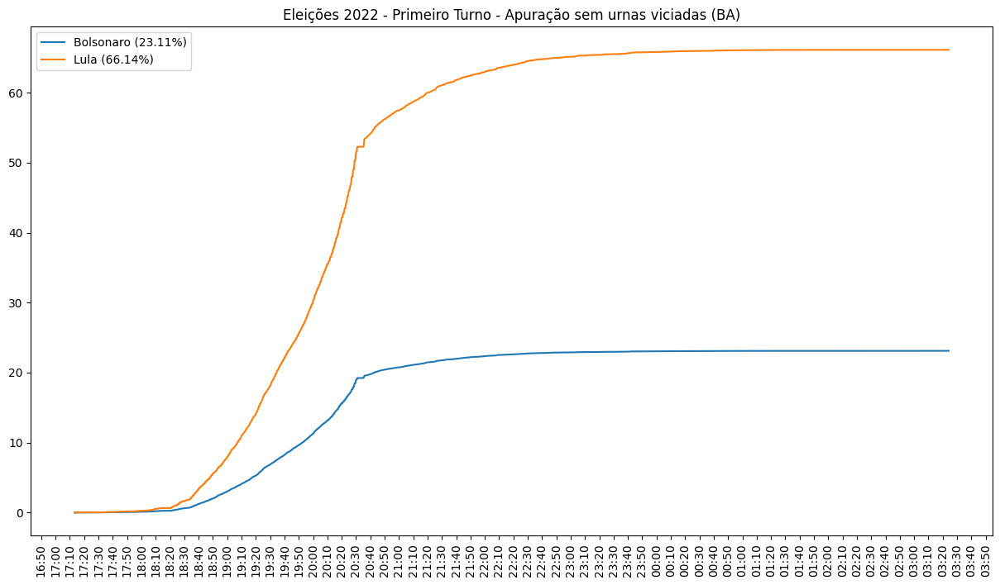

In [ ]:
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas

gerar_grafico_total(df1ba_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'BA')

##### 1.1.1.2 - PIAUI

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


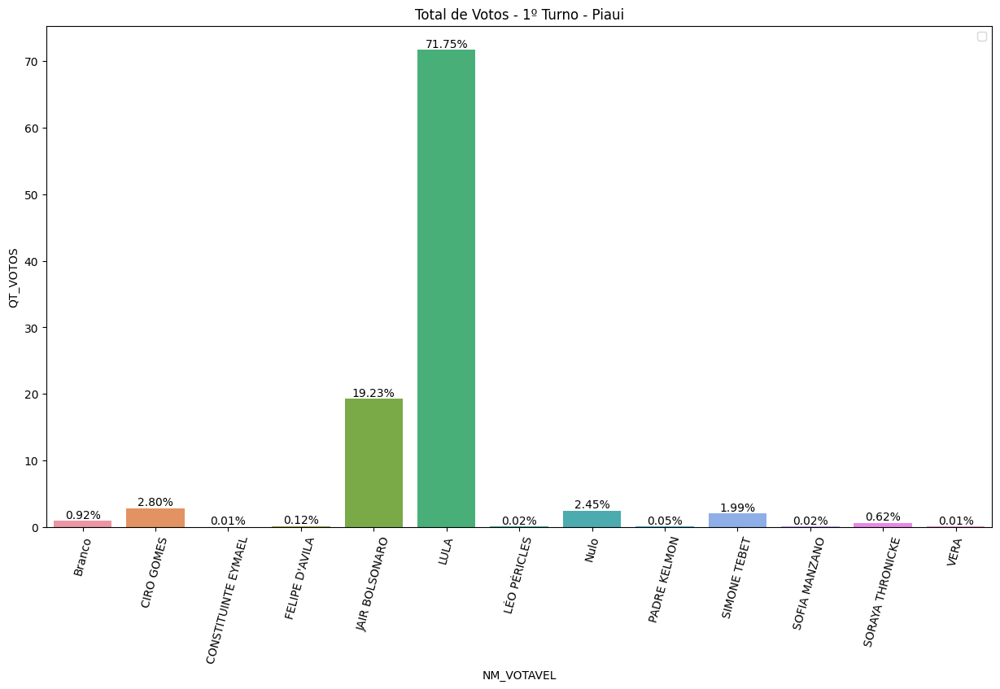

In [ ]:
# Graficos - Total no 1º turno
total1pi = df1pi['QT_VOTOS'].sum()

df1pi_order = df1pi.groupby('NM_VOTAVEL', as_index=False)['QT_VOTOS'].sum()
df1pi_order['QT_VOTOS'] = (df1pi_order['QT_VOTOS'] / total1pi) * 100
plt.figure(figsize=(15,8))
ax = sns.barplot(x='NM_VOTAVEL', 
                 y='QT_VOTOS', 
                 data=df1pi_order)

ax.bar_label(ax.containers[0], fmt="%.2f%%")
ax.set(title=f'Total de Votos - 1º Turno - Piaui')

for item in ax.get_xticklabels():
    item.set_rotation(75)

ax.legend()

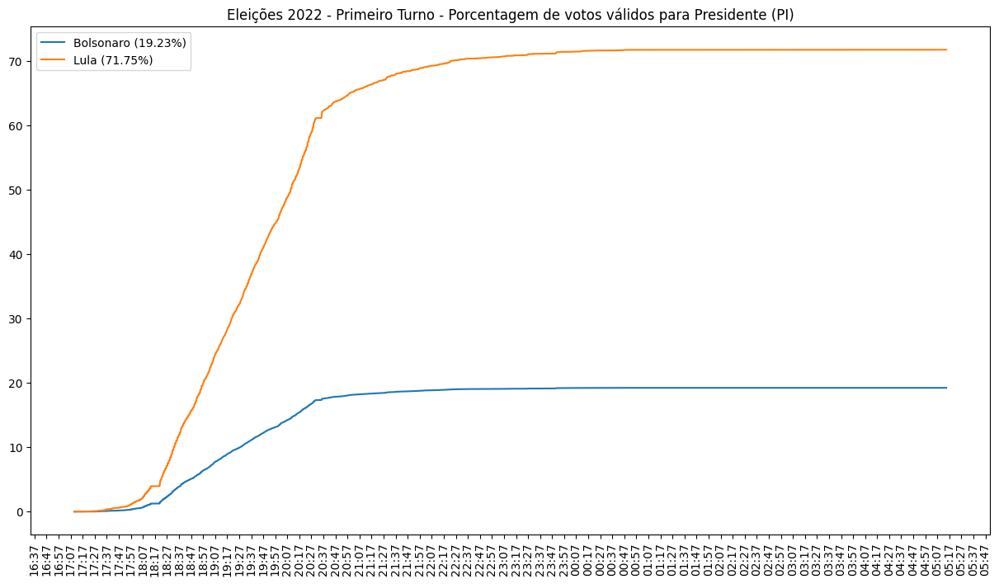

In [ ]:
# Total de votos acumulados

df1pi_13 = df1pi[df1pi['NR_VOTAVEL'] == 13][['data_hora', 'QT_VOTOS']]
df1pi_22 = df1pi[df1pi['NR_VOTAVEL'] == 22][['data_hora', 'QT_VOTOS']]

df1pi_13.set_index('data_hora', inplace=True)
df1pi_22.set_index('data_hora', inplace=True)

df1pi_13.sort_index(inplace=True)
df1pi_22.sort_index(inplace=True)

df1pi_13['acumulados'] = df1pi_13['QT_VOTOS'].cumsum()
df1pi_22['acumulados'] = df1pi_22['QT_VOTOS'].cumsum()

df1pi_13['acumulados'] = (df1pi_13['acumulados'] / total1pi) * 100
df1pi_22['acumulados'] = (df1pi_22['acumulados'] / total1pi) * 100

fig, ax = plt.subplots(figsize=(15,8))

ax.plot(df1pi_22.index, df1pi_22['acumulados'], label=f"Bolsonaro ({df1pi_22['acumulados'].iloc[-1]:.2f}%)")
ax.plot(df1pi_13.index, df1pi_13['acumulados'], label=f"Lula ({df1pi_13['acumulados'].iloc[-1]:.2f}%)")

date_fmt = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
ax.xaxis.set_major_formatter(date_fmt)
ax.xaxis.set_tick_params(labelrotation=90)

ax.set_title('Eleições 2022 - Primeiro Turno - Porcentagem de votos válidos para Presidente (PI)')
ax.legend()

Quantidade de urnas com 1 voto - Primeiro Turno

In [ ]:

df1pi_urnas = df1pi[df1pi['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1pi_urnas[df1pi_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1pi_urnas[df1pi_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")

Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 26


In [ ]:

df1pi_urnas = df1pi[df1pi['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1pi_urnas[df1pi_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1pi_urnas[df1pi_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")

Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 26


Quais as seções eleitorais que apresentaram urnas com 1 voto no 22?

In [ ]:

df1pi_urnas_22 = df1pi_urnas[df1pi_urnas['NR_VOTAVEL'] == 22]
df1pi_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']]

,NM_MUNICIPIO,NR_ZONA,NR_SECAO,NR_LOCAL_VOTACAO
187892,AMARANTE,8,31,1252
188301,AMARANTE,8,40,1341
189256,AMARANTE,8,112,1414
193907,PALMEIRAIS,8,200,1260
262732,CORONEL JOSÉ DIAS,13,242,1163
267678,URUÇUÍ,14,44,1163
306841,VALENÇA DO PIAUÍ,18,94,1112
307366,NOVO ORIENTE DO PIAUÍ,18,104,1082
315315,JAICÓS,19,119,1368
355751,RIACHO FRIO,26,35,1058


Das urnas em que o 22 recebeu 1 voto, qual a quantidade de votos totais?

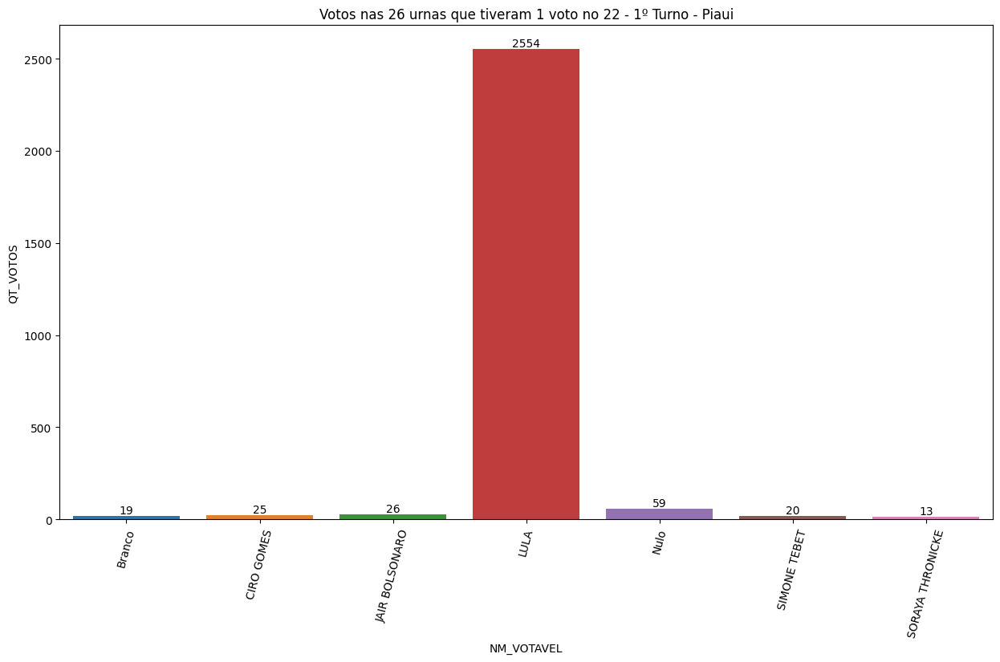

In [ ]:

df_soma = None

for i in range(len(df1pi_urnas_22)):
    cidade = df1pi_urnas_22.iloc[i, df1pi_urnas_22.columns.get_loc('CD_MUNICIPIO')]
    zona = df1pi_urnas_22.iloc[i, df1pi_urnas_22.columns.get_loc('NR_ZONA')]
    secao = df1pi_urnas_22.iloc[i, df1pi_urnas_22.columns.get_loc('NR_SECAO')]
    local = df1pi_urnas_22.iloc[i, df1pi_urnas_22.columns.get_loc('NR_LOCAL_VOTACAO')]

    df_temp = df1pi[(df1pi['CD_MUNICIPIO'] == cidade) &
                    (df1pi['NR_ZONA'] == zona) &
                    (df1pi['NR_SECAO'] == secao) &
                    (df1pi['NR_LOCAL_VOTACAO'] == local)][['NM_VOTAVEL', 'QT_VOTOS']]

    if (df_soma is not None):
        df_soma = pd.concat([df_soma, df_temp], ignore_index=True)
    else:        
        df_soma = df_temp

df_soma = df_soma.groupby('NM_VOTAVEL', as_index=False).sum('QT_VOTOS')

plt.figure(figsize=(15,8))
ax = sns.barplot(x='NM_VOTAVEL', 
                 y='QT_VOTOS', 
                 data=df_soma)

ax.bar_label(ax.containers[0])
ax.set(title=f'Votos nas {df1pi_urnas_22["NR_VOTAVEL"].count()} urnas que tiveram 1 voto no 22 - 1º Turno - Piaui')

for item in ax.get_xticklabels():
    item.set_rotation(75)

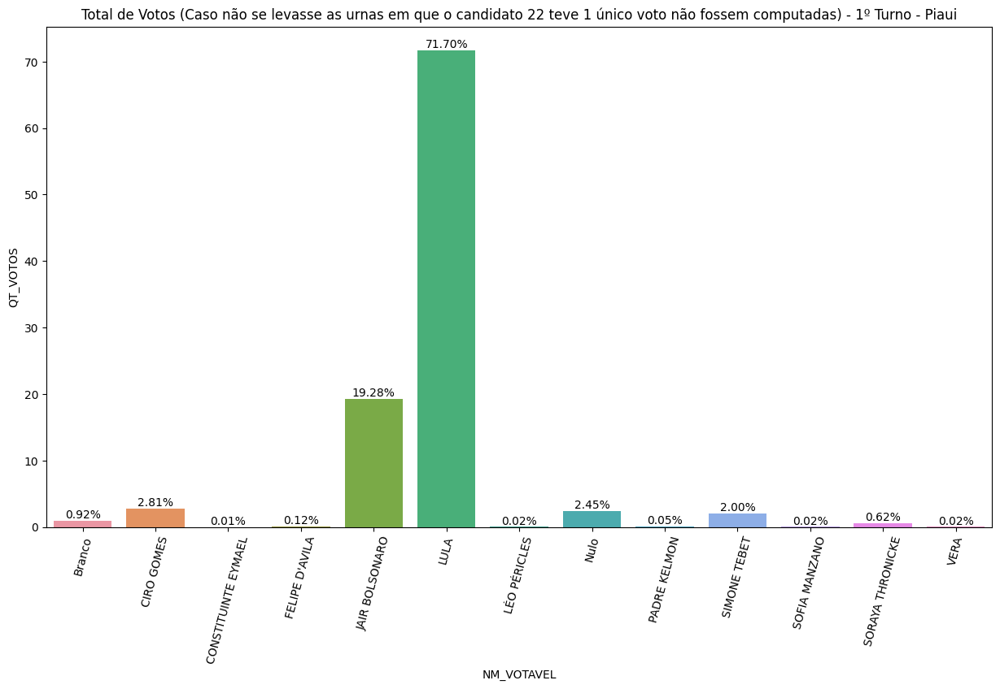

In [ ]:
# Total de votos, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas

df1pi_sub = df1pi[~((df1pi['CD_MUNICIPIO'].isin(df1pi_urnas_22['CD_MUNICIPIO'])) & 
                    (df1pi['NR_ZONA'].isin(df1pi_urnas_22['NR_ZONA'])) & 
                    (df1pi['NR_SECAO'].isin(df1pi_urnas_22['NR_SECAO'])) & 
                    (df1pi['NR_LOCAL_VOTACAO'].isin(df1pi_urnas_22['NR_LOCAL_VOTACAO'])))]

total1pi_sub = df1pi_sub['QT_VOTOS'].sum()

df1pi_sub_order = df1pi_sub.groupby('NM_VOTAVEL', as_index=False)['QT_VOTOS'].sum()
df1pi_sub_order['QT_VOTOS'] = (df1pi_sub_order['QT_VOTOS'] / total1pi_sub) * 100

plt.figure(figsize=(15,8))
ax = sns.barplot(x='NM_VOTAVEL', 
                 y='QT_VOTOS', 
                 data=df1pi_sub_order)

ax.bar_label(ax.containers[0], fmt="%.2f%%")
ax.set(title=f'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno - Piaui')

for item in ax.get_xticklabels():
    item.set_rotation(75)

Caso não se computasse as urnas em que o candidato 22 teve 1 único voto, qual seria o resultado?

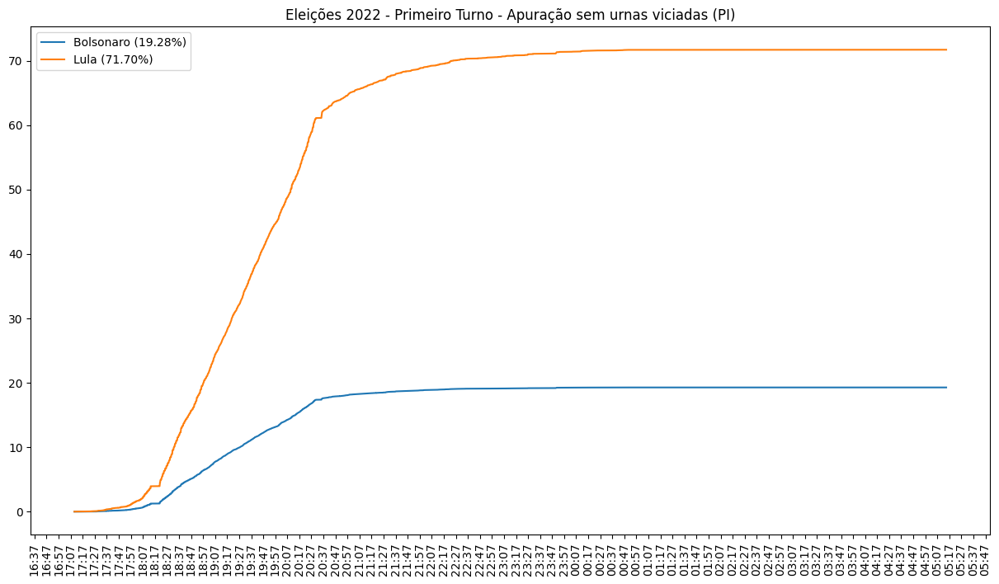

In [ ]:
total1pi_sub = df1pi_sub['QT_VOTOS'].sum()

df1pi_sub_13 = df1pi_sub[df1pi_sub['NR_VOTAVEL'] == 13][['data_hora', 'QT_VOTOS']]
df1pi_sub_22 = df1pi_sub[df1pi_sub['NR_VOTAVEL'] == 22][['data_hora', 'QT_VOTOS']]

df1pi_sub_13.set_index('data_hora', inplace=True)
df1pi_sub_22.set_index('data_hora', inplace=True)

df1pi_sub_13.sort_index(inplace=True)
df1pi_sub_22.sort_index(inplace=True)

df1pi_sub_13['acumulados'] = df1pi_sub_13['QT_VOTOS'].cumsum()
df1pi_sub_22['acumulados'] = df1pi_sub_22['QT_VOTOS'].cumsum()

df1pi_sub_13['acumulados'] = (df1pi_sub_13['acumulados'] / total1pi_sub) * 100
df1pi_sub_22['acumulados'] = (df1pi_sub_22['acumulados'] / total1pi_sub) * 100
total1pi_sub = df1pi_sub['QT_VOTOS'].sum()

df1pi_sub_13 = df1pi_sub[df1pi_sub['NR_VOTAVEL'] == 13][['data_hora', 'QT_VOTOS']]
df1pi_sub_22 = df1pi_sub[df1pi_sub['NR_VOTAVEL'] == 22][['data_hora', 'QT_VOTOS']]

df1pi_sub_13.set_index('data_hora', inplace=True)
df1pi_sub_22.set_index('data_hora', inplace=True)

df1pi_sub_13.sort_index(inplace=True)
df1pi_sub_22.sort_index(inplace=True)

df1pi_sub_13['acumulados'] = df1pi_sub_13['QT_VOTOS'].cumsum()
df1pi_sub_22['acumulados'] = df1pi_sub_22['QT_VOTOS'].cumsum()

df1pi_sub_13['acumulados'] = (df1pi_sub_13['acumulados'] / total1pi_sub) * 100
df1pi_sub_22['acumulados'] = (df1pi_sub_22['acumulados'] / total1pi_sub) * 100

fig, ax = plt.subplots(figsize=(15,8))

ax.plot(df1pi_sub_22.index, df1pi_sub_22['acumulados'], label=f"Bolsonaro ({df1pi_sub_22['acumulados'].iloc[-1]:.2f}%)")
ax.plot(df1pi_sub_13.index, df1pi_sub_13['acumulados'], label=f"Lula ({df1pi_sub_13['acumulados'].iloc[-1]:.2f}%)")

# date_fmt = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
ax.xaxis.set_major_formatter(date_fmt)
ax.xaxis.set_tick_params(labelrotation=90)

ax.set_title('Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas (PI)')
ax.legend()

##### 1.1.1.3 - MARANHÃO

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


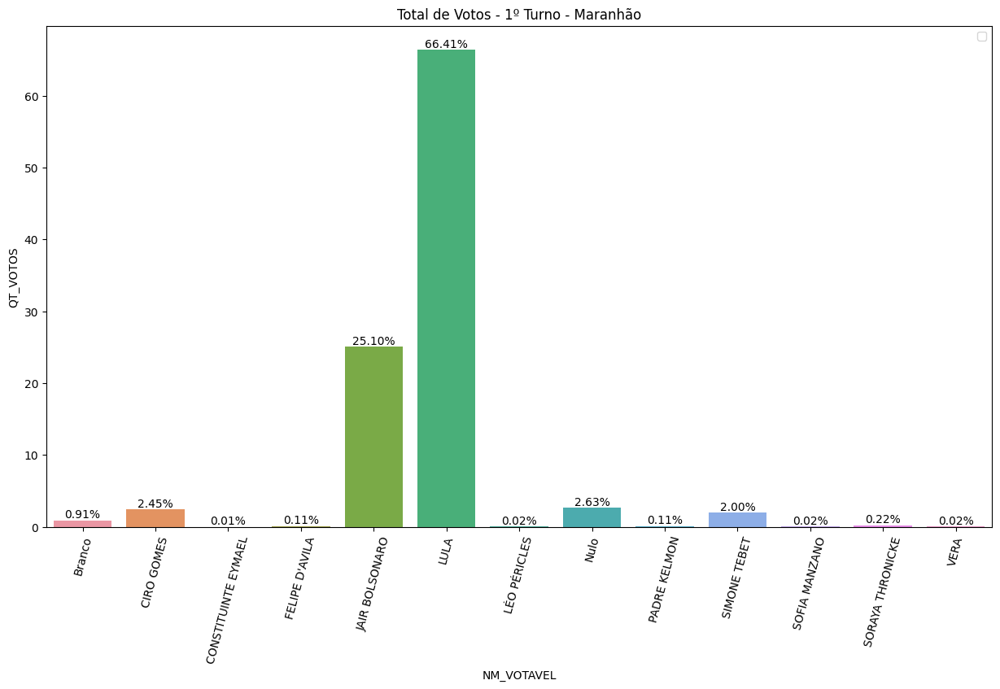

In [ ]:
# Graficos - Total no 1º turno
total1ma = df1ma['QT_VOTOS'].sum()

df1ma_order = df1ma.groupby('NM_VOTAVEL', as_index=False)['QT_VOTOS'].sum()
df1ma_order['QT_VOTOS'] = (df1ma_order['QT_VOTOS'] / total1ma) * 100
plt.figure(figsize=(15,8))
ax = sns.barplot(x='NM_VOTAVEL', 
                 y='QT_VOTOS', 
                 data=df1ma_order)

ax.bar_label(ax.containers[0], fmt="%.2f%%")
ax.set(title=f'Total de Votos - 1º Turno - Maranhão')

for item in ax.get_xticklabels():
    item.set_rotation(75)

ax.legend()

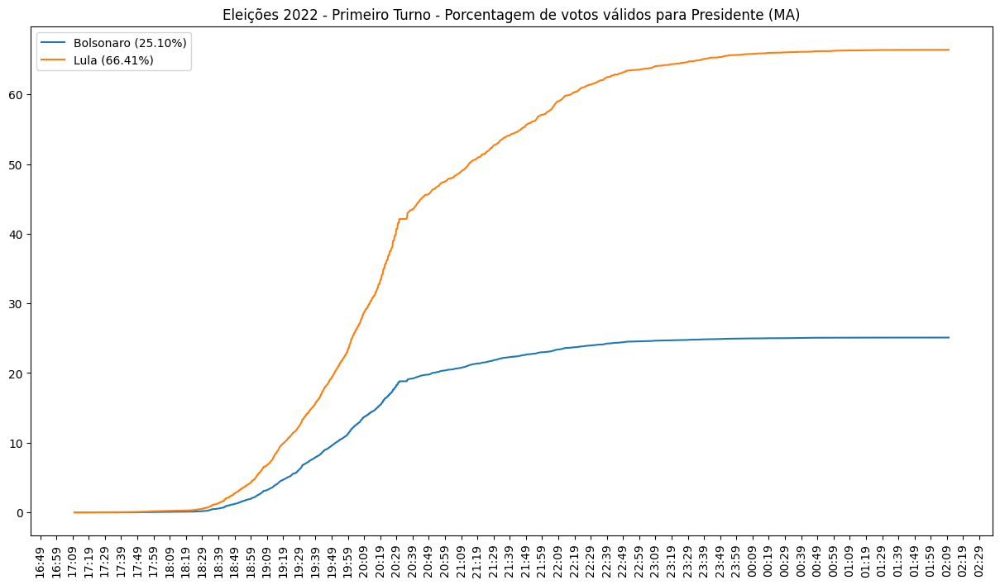

In [ ]:
# Total de votos acumulados

df1ma_13 = df1ma[df1ma['NR_VOTAVEL'] == 13][['data_hora', 'QT_VOTOS']]
df1ma_22 = df1ma[df1ma['NR_VOTAVEL'] == 22][['data_hora', 'QT_VOTOS']]

df1ma_13.set_index('data_hora', inplace=True)
df1ma_22.set_index('data_hora', inplace=True)

df1ma_13.sort_index(inplace=True)
df1ma_22.sort_index(inplace=True)

df1ma_13['acumulados'] = df1ma_13['QT_VOTOS'].cumsum()
df1ma_22['acumulados'] = df1ma_22['QT_VOTOS'].cumsum()

df1ma_13['acumulados'] = (df1ma_13['acumulados'] / total1ma) * 100
df1ma_22['acumulados'] = (df1ma_22['acumulados'] / total1ma) * 100


fig, ax = plt.subplots(figsize=(15,8))

ax.plot(df1ma_22.index, df1ma_22['acumulados'], label=f"Bolsonaro ({df1ma_22['acumulados'].iloc[-1]:.2f}%)")
ax.plot(df1ma_13.index, df1ma_13['acumulados'], label=f"Lula ({df1ma_13['acumulados'].iloc[-1]:.2f}%)")

date_fmt = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
ax.xaxis.set_major_formatter(date_fmt)
ax.xaxis.set_tick_params(labelrotation=90)

ax.set_title('Eleições 2022 - Primeiro Turno - Porcentagem de votos válidos para Presidente (MA)')
ax.legend()

Quantidade de urnas com 1 voto - Primeiro Turno

In [ ]:

df1ma_urnas = df1ma[df1ma['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1ma_urnas[df1ma_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1ma_urnas[df1ma_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")

Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 49


Quais as seções eleitorais que apresentaram urnas com 1 voto no 22?

In [ ]:

df1ma_urnas_22 = df1ma_urnas[df1ma_urnas['NR_VOTAVEL'] == 22]
df1ma_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']]

,NM_MUNICIPIO,NR_ZONA,NR_SECAO,NR_LOCAL_VOTACAO
284282,TIMBIRAS,7,362,1180
300743,COROATÁ,8,146,1317
385062,SÃO LUÍS,10,844,2054
401863,ARAIOSES,12,129,1660
434520,CURURUPU,14,78,1384
451174,ITAIPAVA DO GRAJAÚ,15,314,1279
546326,TIMON,19,570,1945
563822,CAJARI,20,213,1309
570371,SÃO FRANCISCO DO MARANHÃO,21,64,1236
588089,BARRA DO CORDA,23,19,1082


Das urnas em que o 22 recebeu 1 voto, qual a quantidade de votos totais?

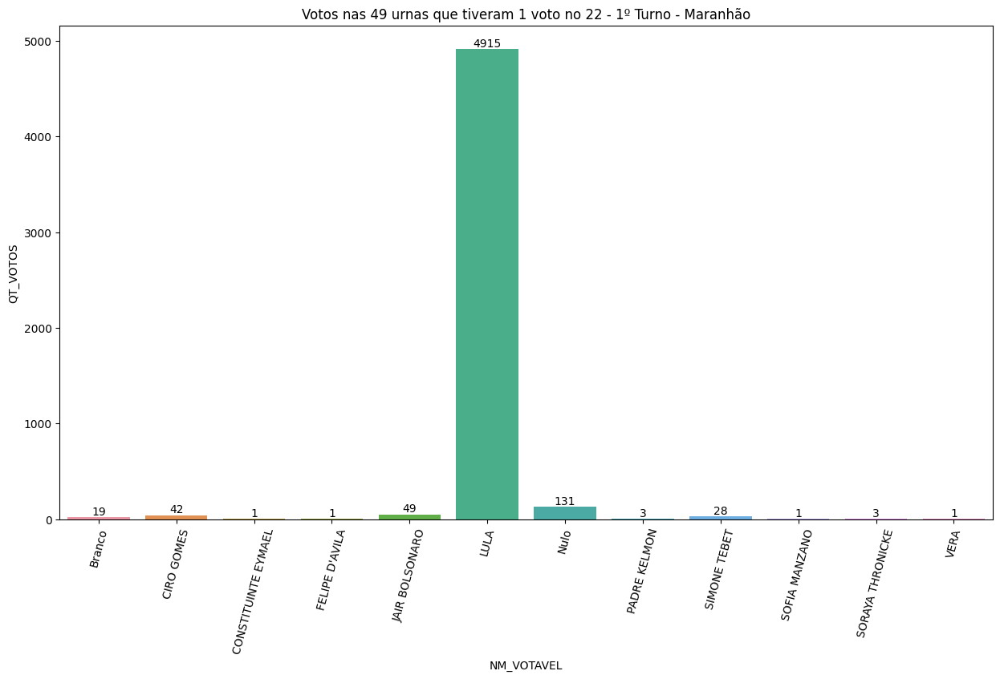

In [ ]:

df_soma = None

for i in range(len(df1ma_urnas_22)):
    cidade = df1ma_urnas_22.iloc[i, df1ma_urnas_22.columns.get_loc('CD_MUNICIPIO')]
    zona = df1ma_urnas_22.iloc[i, df1ma_urnas_22.columns.get_loc('NR_ZONA')]
    secao = df1ma_urnas_22.iloc[i, df1ma_urnas_22.columns.get_loc('NR_SECAO')]
    local = df1ma_urnas_22.iloc[i, df1ma_urnas_22.columns.get_loc('NR_LOCAL_VOTACAO')]

    df_temp = df1ma[(df1ma['CD_MUNICIPIO'] == cidade) &
                    (df1ma['NR_ZONA'] == zona) &
                    (df1ma['NR_SECAO'] == secao) &
                    (df1ma['NR_LOCAL_VOTACAO'] == local)][['NM_VOTAVEL', 'QT_VOTOS']]

    if (df_soma is not None):
        df_soma = pd.concat([df_soma, df_temp], ignore_index=True)
    else:        
        df_soma = df_temp

df_soma = df_soma.groupby('NM_VOTAVEL', as_index=False).sum('QT_VOTOS')

plt.figure(figsize=(15,8))
ax = sns.barplot(x='NM_VOTAVEL', 
                 y='QT_VOTOS', 
                 data=df_soma)

ax.bar_label(ax.containers[0])
ax.set(title=f'Votos nas {df1ma_urnas_22["NR_VOTAVEL"].count()} urnas que tiveram 1 voto no 22 - 1º Turno - Maranhão')

for item in ax.get_xticklabels():
    item.set_rotation(75)

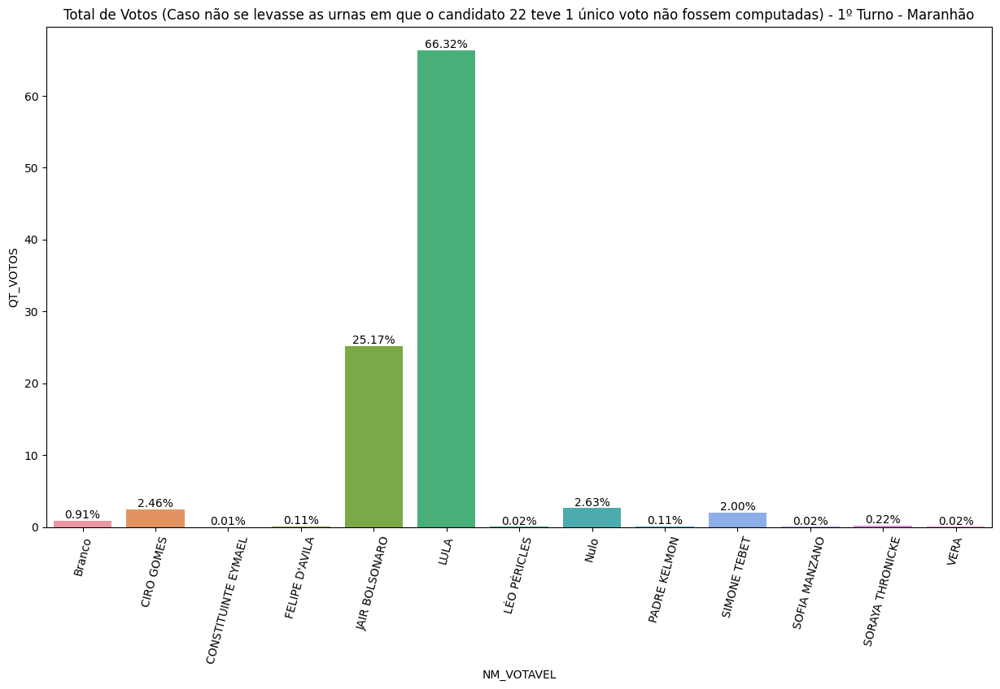

In [ ]:
# Total de votos, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas

df1ma_sub = df1ma[~((df1ma['CD_MUNICIPIO'].isin(df1ma_urnas_22['CD_MUNICIPIO'])) & 
                    (df1ma['NR_ZONA'].isin(df1ma_urnas_22['NR_ZONA'])) & 
                    (df1ma['NR_SECAO'].isin(df1ma_urnas_22['NR_SECAO'])) & 
                    (df1ma['NR_LOCAL_VOTACAO'].isin(df1ma_urnas_22['NR_LOCAL_VOTACAO'])))]


total1ma_sub = df1ma_sub['QT_VOTOS'].sum()

df1ma_sub_order = df1ma_sub.groupby('NM_VOTAVEL', as_index=False)['QT_VOTOS'].sum()
df1ma_sub_order['QT_VOTOS'] = (df1ma_sub_order['QT_VOTOS'] / total1ma_sub) * 100

plt.figure(figsize=(15,8))
ax = sns.barplot(x='NM_VOTAVEL', 
                 y='QT_VOTOS', 
                 data=df1ma_sub_order)

ax.bar_label(ax.containers[0], fmt="%.2f%%")
ax.set(title=f'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno - Maranhão')

for item in ax.get_xticklabels():
    item.set_rotation(75)

Caso não se computasse as urnas em que o candidato 22 teve 1 único voto, qual seria o resultado?

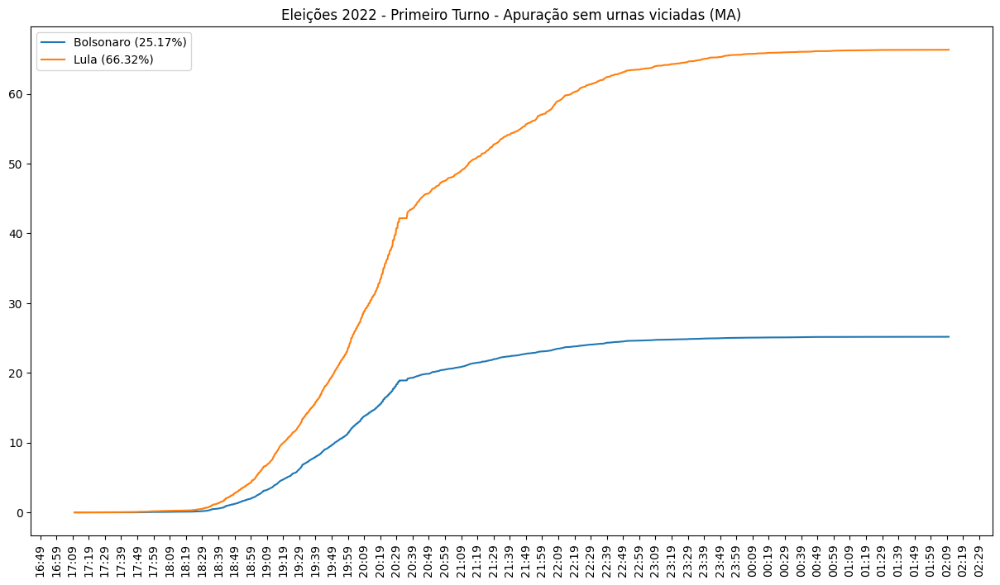

In [ ]:

total1ma_sub = df1ma_sub['QT_VOTOS'].sum()

df1ma_sub_13 = df1ma_sub[df1ma_sub['NR_VOTAVEL'] == 13][['data_hora', 'QT_VOTOS']]
df1ma_sub_22 = df1ma_sub[df1ma_sub['NR_VOTAVEL'] == 22][['data_hora', 'QT_VOTOS']]

df1ma_sub_13.set_index('data_hora', inplace=True)
df1ma_sub_22.set_index('data_hora', inplace=True)

df1ma_sub_13.sort_index(inplace=True)
df1ma_sub_22.sort_index(inplace=True)

df1ma_sub_13['acumulados'] = df1ma_sub_13['QT_VOTOS'].cumsum()
df1ma_sub_22['acumulados'] = df1ma_sub_22['QT_VOTOS'].cumsum()

df1ma_sub_13['acumulados'] = (df1ma_sub_13['acumulados'] / total1ma_sub) * 100
df1ma_sub_22['acumulados'] = (df1ma_sub_22['acumulados'] / total1ma_sub) * 100

fig, ax = plt.subplots(figsize=(15,8))

ax.plot(df1ma_sub_22.index, df1ma_sub_22['acumulados'], label=f"Bolsonaro ({df1ma_sub_22['acumulados'].iloc[-1]:.2f}%)")
ax.plot(df1ma_sub_13.index, df1ma_sub_13['acumulados'], label=f"Lula ({df1ma_sub_13['acumulados'].iloc[-1]:.2f}%)")

# date_fmt = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
ax.xaxis.set_major_formatter(date_fmt)
ax.xaxis.set_tick_params(labelrotation=90)

ax.set_title('Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas (MA)')
ax.legend()

##### 1.1.1.4 - CEARÁ

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


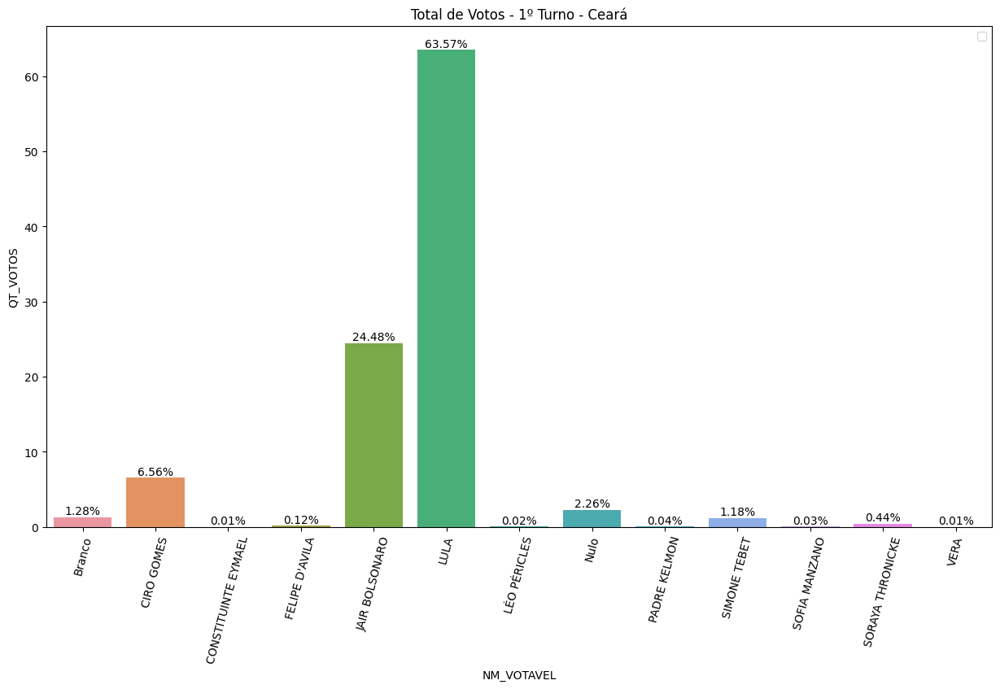

In [ ]:
# Graficos - Total no 1º turno
total1ce = df1ce['QT_VOTOS'].sum()

df1ce_order = df1ce.groupby('NM_VOTAVEL', as_index=False)['QT_VOTOS'].sum()
df1ce_order['QT_VOTOS'] = (df1ce_order['QT_VOTOS'] / total1ce) * 100
plt.figure(figsize=(15,8))
ax = sns.barplot(x='NM_VOTAVEL', 
                 y='QT_VOTOS', 
                 data=df1ce_order)

ax.bar_label(ax.containers[0], fmt="%.2f%%")
ax.set(title=f'Total de Votos - 1º Turno - Ceará')

for item in ax.get_xticklabels():
    item.set_rotation(75)

ax.legend()

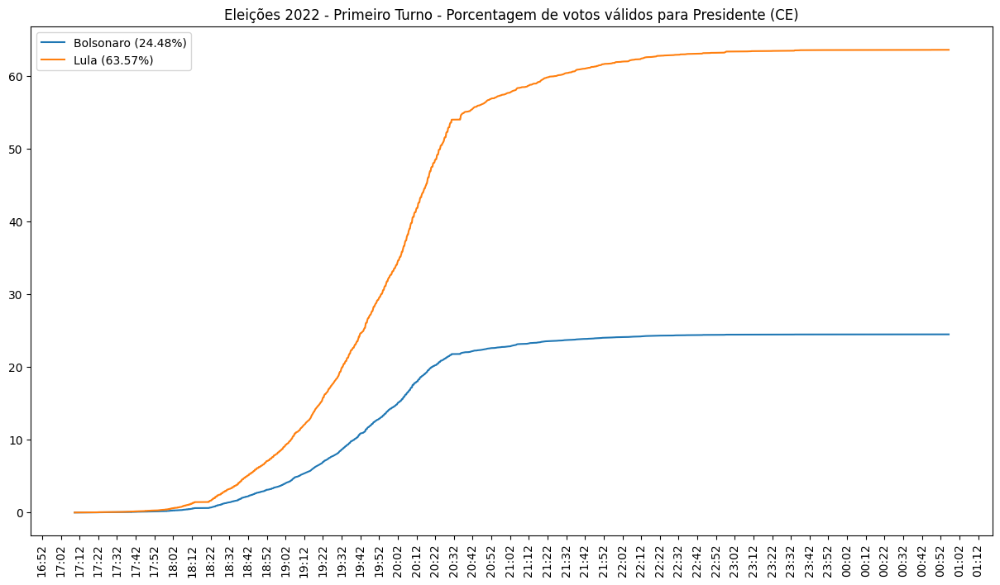

In [ ]:
# Total de votos acumulados

df1ce_13 = df1ce[df1ce['NR_VOTAVEL'] == 13][['data_hora', 'QT_VOTOS']]
df1ce_22 = df1ce[df1ce['NR_VOTAVEL'] == 22][['data_hora', 'QT_VOTOS']]

df1ce_13.set_index('data_hora', inplace=True)
df1ce_22.set_index('data_hora', inplace=True)

df1ce_13.sort_index(inplace=True)
df1ce_22.sort_index(inplace=True)

df1ce_13['acumulados'] = df1ce_13['QT_VOTOS'].cumsum()
df1ce_22['acumulados'] = df1ce_22['QT_VOTOS'].cumsum()

df1ce_13['acumulados'] = (df1ce_13['acumulados'] / total1ce) * 100
df1ce_22['acumulados'] = (df1ce_22['acumulados'] / total1ce) * 100


fig, ax = plt.subplots(figsize=(15,8))

ax.plot(df1ce_22.index, df1ce_22['acumulados'], label=f"Bolsonaro ({df1ce_22['acumulados'].iloc[-1]:.2f}%)")
ax.plot(df1ce_13.index, df1ce_13['acumulados'], label=f"Lula ({df1ce_13['acumulados'].iloc[-1]:.2f}%)")

date_fmt = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
ax.xaxis.set_major_formatter(date_fmt)
ax.xaxis.set_tick_params(labelrotation=90)

ax.set_title('Eleições 2022 - Primeiro Turno - Porcentagem de votos válidos para Presidente (CE)')
ax.legend()

Quantidade de urnas com 1 voto - Primeiro Turno

In [ ]:

df1ce_urnas = df1ce[df1ce['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1ce_urnas[df1ce_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1ce_urnas[df1ce_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")

Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 21


Quais as seções eleitorais que apresentaram urnas com 1 voto no 22?

In [ ]:

df1ce_urnas_22 = df1ce_urnas[df1ce_urnas['NR_VOTAVEL'] == 22]
df1ce_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']]

,NM_MUNICIPIO,NR_ZONA,NR_SECAO,NR_LOCAL_VOTACAO
362842,QUIXERAMOBIM,11,64,1538
374945,QUIXERAMOBIM,11,259,2887
520841,TAUÁ,19,236,2097
643530,MARTINÓPOLE,25,233,1120
687497,CRATO,27,360,1872
896988,SALITRE,38,132,1201
905571,INDEPENDÊNCIA,39,215,1953
918373,PORANGA,40,208,1368
1022200,NOVA RUSSAS,48,201,1970
1160606,PEDRA BRANCA,59,114,1821


Das urnas em que o 22 recebeu 1 voto, qual a quantidade de votos totais?

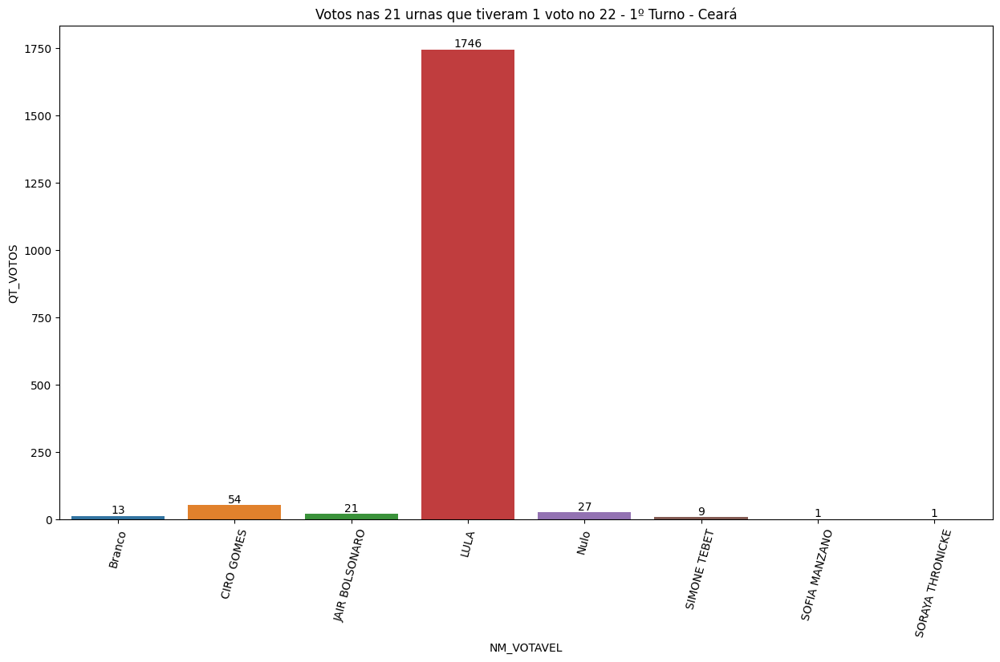

In [ ]:

df_soma = None

for i in range(len(df1ce_urnas_22)):
    cidade = df1ce_urnas_22.iloc[i, df1ce_urnas_22.columns.get_loc('CD_MUNICIPIO')]
    zona = df1ce_urnas_22.iloc[i, df1ce_urnas_22.columns.get_loc('NR_ZONA')]
    secao = df1ce_urnas_22.iloc[i, df1ce_urnas_22.columns.get_loc('NR_SECAO')]
    local = df1ce_urnas_22.iloc[i, df1ce_urnas_22.columns.get_loc('NR_LOCAL_VOTACAO')]

    df_temp = df1ce[(df1ce['CD_MUNICIPIO'] == cidade) &
                    (df1ce['NR_ZONA'] == zona) &
                    (df1ce['NR_SECAO'] == secao) &
                    (df1ce['NR_LOCAL_VOTACAO'] == local)][['NM_VOTAVEL', 'QT_VOTOS']]

    if (df_soma is not None):
        df_soma = pd.concat([df_soma, df_temp], ignore_index=True)
    else:        
        df_soma = df_temp

df_soma = df_soma.groupby('NM_VOTAVEL', as_index=False).sum('QT_VOTOS')

plt.figure(figsize=(15,8))
ax = sns.barplot(x='NM_VOTAVEL', 
                 y='QT_VOTOS', 
                 data=df_soma)

ax.bar_label(ax.containers[0])
ax.set(title=f'Votos nas {df1ce_urnas_22["NR_VOTAVEL"].count()} urnas que tiveram 1 voto no 22 - 1º Turno - Ceará')

for item in ax.get_xticklabels():
    item.set_rotation(75)

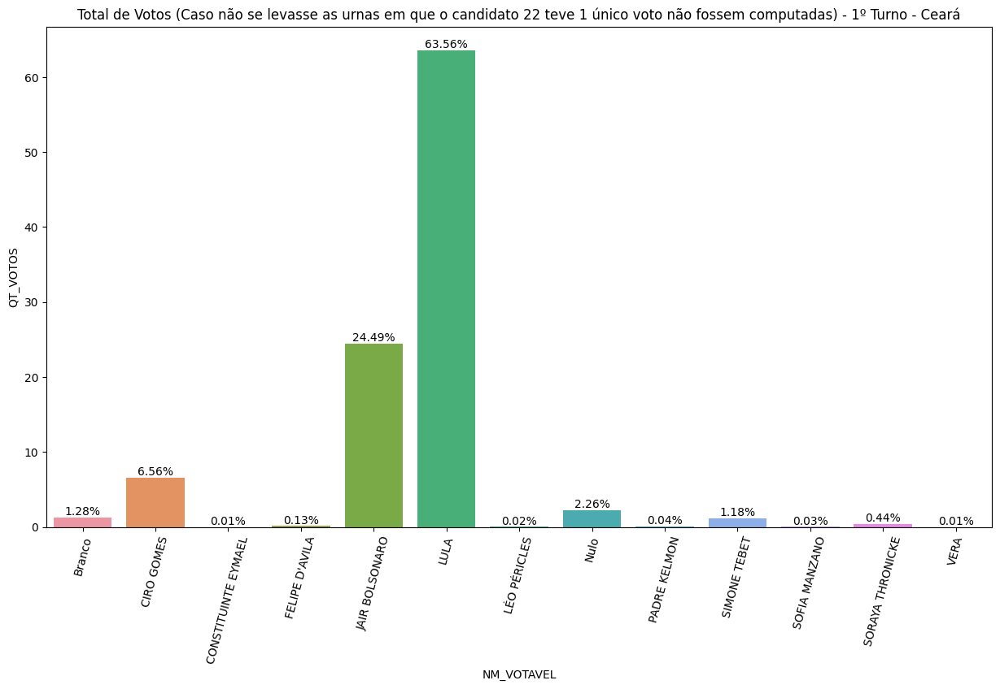

In [ ]:
# Total de votos, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas

df1ce_sub = df1ce[~((df1ce['CD_MUNICIPIO'].isin(df1ce_urnas_22['CD_MUNICIPIO'])) & 
                    (df1ce['NR_ZONA'].isin(df1ce_urnas_22['NR_ZONA'])) & 
                    (df1ce['NR_SECAO'].isin(df1ce_urnas_22['NR_SECAO'])) & 
                    (df1ce['NR_LOCAL_VOTACAO'].isin(df1ce_urnas_22['NR_LOCAL_VOTACAO'])))]


total1ce_sub = df1ce_sub['QT_VOTOS'].sum()

df1ce_sub_order = df1ce_sub.groupby('NM_VOTAVEL', as_index=False)['QT_VOTOS'].sum()
df1ce_sub_order['QT_VOTOS'] = (df1ce_sub_order['QT_VOTOS'] / total1ce_sub) * 100

plt.figure(figsize=(15,8))
ax = sns.barplot(x='NM_VOTAVEL', 
                 y='QT_VOTOS', 
                 data=df1ce_sub_order)

ax.bar_label(ax.containers[0], fmt="%.2f%%")
ax.set(title=f'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno - Ceará')

for item in ax.get_xticklabels():
    item.set_rotation(75)

Caso não se computasse as urnas em que o candidato 22 teve 1 único voto, qual seria o resultado?

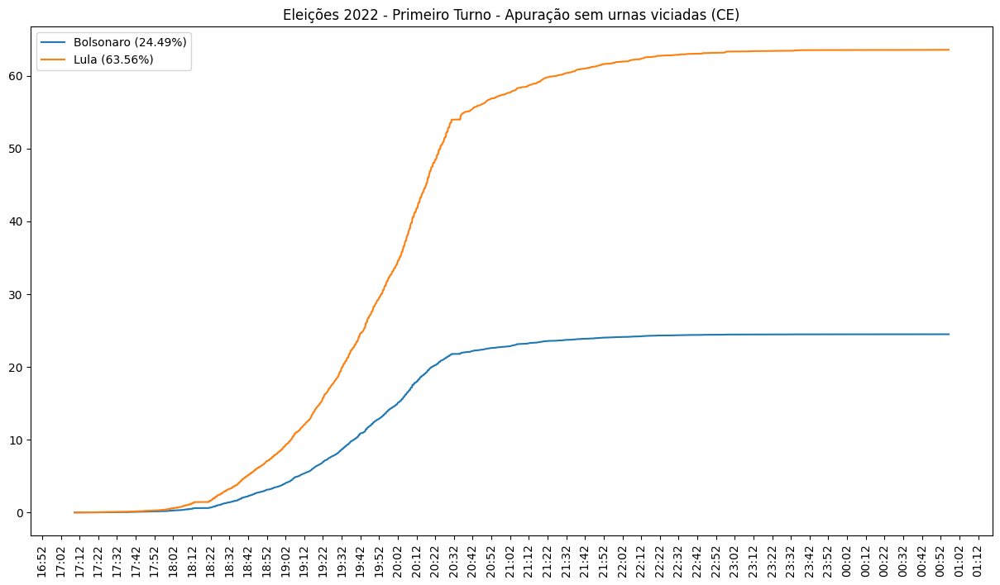

In [ ]:
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas

total1ce_sub = df1ce_sub['QT_VOTOS'].sum()

df1ce_sub_13 = df1ce_sub[df1ce_sub['NR_VOTAVEL'] == 13][['data_hora', 'QT_VOTOS']]
df1ce_sub_22 = df1ce_sub[df1ce_sub['NR_VOTAVEL'] == 22][['data_hora', 'QT_VOTOS']]

df1ce_sub_13.set_index('data_hora', inplace=True)
df1ce_sub_22.set_index('data_hora', inplace=True)

df1ce_sub_13.sort_index(inplace=True)
df1ce_sub_22.sort_index(inplace=True)

df1ce_sub_13['acumulados'] = df1ce_sub_13['QT_VOTOS'].cumsum()
df1ce_sub_22['acumulados'] = df1ce_sub_22['QT_VOTOS'].cumsum()

df1ce_sub_13['acumulados'] = (df1ce_sub_13['acumulados'] / total1ce_sub) * 100
df1ce_sub_22['acumulados'] = (df1ce_sub_22['acumulados'] / total1ce_sub) * 100

fig, ax = plt.subplots(figsize=(15,8))

ax.plot(df1ce_sub_22.index, df1ce_sub_22['acumulados'], label=f"Bolsonaro ({df1ce_sub_22['acumulados'].iloc[-1]:.2f}%)")
ax.plot(df1ce_sub_13.index, df1ce_sub_13['acumulados'], label=f"Lula ({df1ce_sub_13['acumulados'].iloc[-1]:.2f}%)")

# date_fmt = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
ax.xaxis.set_major_formatter(date_fmt)
ax.xaxis.set_tick_params(labelrotation=90)

ax.set_title('Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas (CE)')
ax.legend()

##### 1.1.1.5 - RIO GRANDE DO NORTE

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


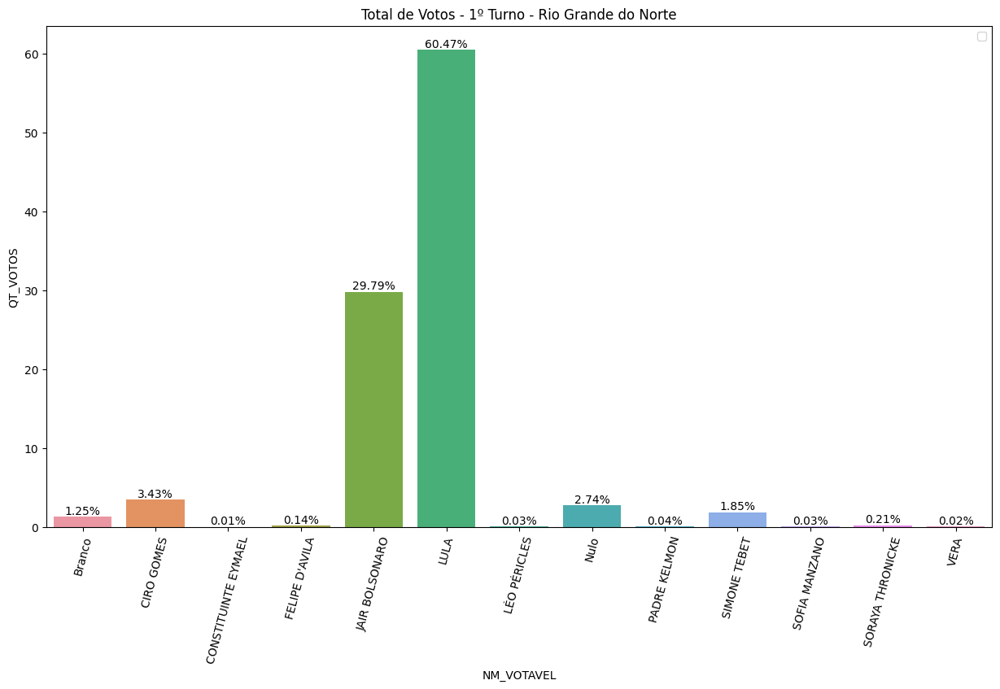

In [ ]:
# Graficos - Total no 1º turno
total1rn = df1rn['QT_VOTOS'].sum()

df1rn_order = df1rn.groupby('NM_VOTAVEL', as_index=False)['QT_VOTOS'].sum()
df1rn_order['QT_VOTOS'] = (df1rn_order['QT_VOTOS'] / total1rn) * 100
plt.figure(figsize=(15,8))
ax = sns.barplot(x='NM_VOTAVEL', 
                 y='QT_VOTOS', 
                 data=df1rn_order)

ax.bar_label(ax.containers[0], fmt="%.2f%%")
ax.set(title=f'Total de Votos - 1º Turno - Rio Grande do Norte')

for item in ax.get_xticklabels():
    item.set_rotation(75)

ax.legend()

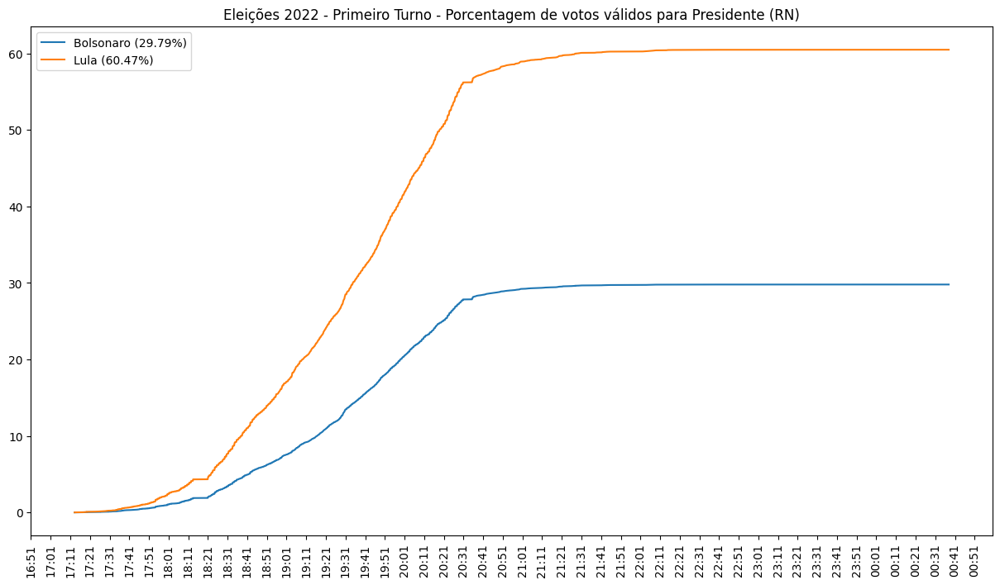

In [ ]:
# Total de votos acumulados

df1rn_13 = df1rn[df1rn['NR_VOTAVEL'] == 13][['data_hora', 'QT_VOTOS']]
df1rn_22 = df1rn[df1rn['NR_VOTAVEL'] == 22][['data_hora', 'QT_VOTOS']]

df1rn_13.set_index('data_hora', inplace=True)
df1rn_22.set_index('data_hora', inplace=True)

df1rn_13.sort_index(inplace=True)
df1rn_22.sort_index(inplace=True)

df1rn_13['acumulados'] = df1rn_13['QT_VOTOS'].cumsum()
df1rn_22['acumulados'] = df1rn_22['QT_VOTOS'].cumsum()

df1rn_13['acumulados'] = (df1rn_13['acumulados'] / total1rn) * 100
df1rn_22['acumulados'] = (df1rn_22['acumulados'] / total1rn) * 100


fig, ax = plt.subplots(figsize=(15,8))

ax.plot(df1rn_22.index, df1rn_22['acumulados'], label=f"Bolsonaro ({df1rn_22['acumulados'].iloc[-1]:.2f}%)")
ax.plot(df1rn_13.index, df1rn_13['acumulados'], label=f"Lula ({df1rn_13['acumulados'].iloc[-1]:.2f}%)")

date_fmt = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
ax.xaxis.set_major_formatter(date_fmt)
ax.xaxis.set_tick_params(labelrotation=90)

ax.set_title('Eleições 2022 - Primeiro Turno - Porcentagem de votos válidos para Presidente (RN)')
ax.legend()

Quantidade de urnas com 1 voto - Primeiro Turno

In [ ]:

df1rn_urnas = df1rn[df1rn['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1rn_urnas[df1rn_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1rn_urnas[df1rn_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")

Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 0


##### 1.1.1.6 - PARAÍBA

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


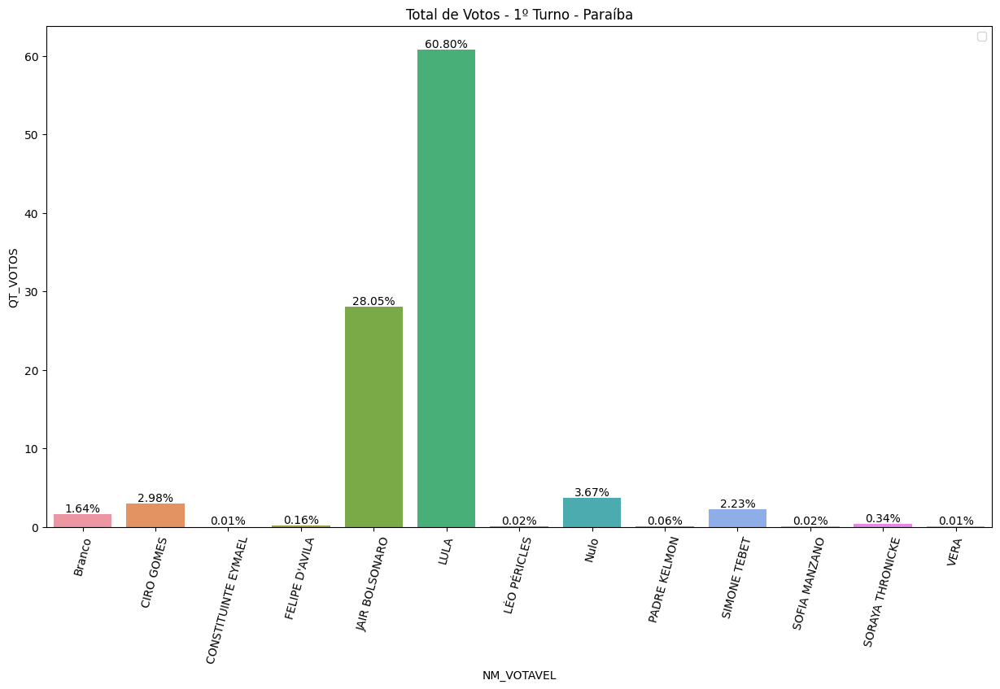

In [ ]:
# Graficos - Total no 1º turno
total1pb = df1pb['QT_VOTOS'].sum()

df1pb_order = df1pb.groupby('NM_VOTAVEL', as_index=False)['QT_VOTOS'].sum()
df1pb_order['QT_VOTOS'] = (df1pb_order['QT_VOTOS'] / total1pb) * 100
plt.figure(figsize=(15,8))
ax = sns.barplot(x='NM_VOTAVEL', 
                 y='QT_VOTOS', 
                 data=df1pb_order)

ax.bar_label(ax.containers[0], fmt="%.2f%%")
ax.set(title=f'Total de Votos - 1º Turno - Paraíba')

for item in ax.get_xticklabels():
    item.set_rotation(75)

ax.legend()

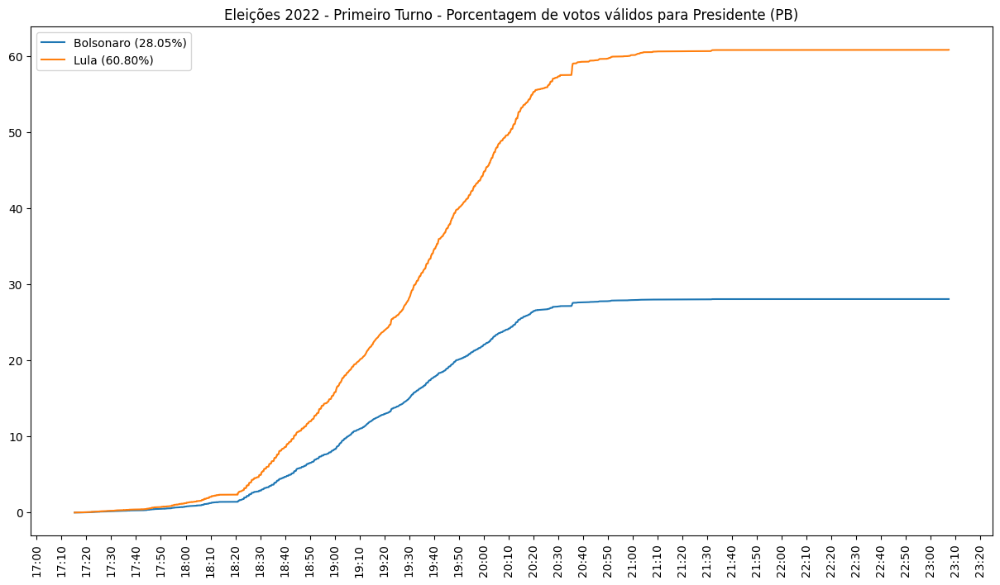

In [ ]:
# Total de votos acumulados

df1pb_13 = df1pb[df1pb['NR_VOTAVEL'] == 13][['data_hora', 'QT_VOTOS']]
df1pb_22 = df1pb[df1pb['NR_VOTAVEL'] == 22][['data_hora', 'QT_VOTOS']]

df1pb_13.set_index('data_hora', inplace=True)
df1pb_22.set_index('data_hora', inplace=True)

df1pb_13.sort_index(inplace=True)
df1pb_22.sort_index(inplace=True)

df1pb_13['acumulados'] = df1pb_13['QT_VOTOS'].cumsum()
df1pb_22['acumulados'] = df1pb_22['QT_VOTOS'].cumsum()

df1pb_13['acumulados'] = (df1pb_13['acumulados'] / total1pb) * 100
df1pb_22['acumulados'] = (df1pb_22['acumulados'] / total1pb) * 100


fig, ax = plt.subplots(figsize=(15,8))

ax.plot(df1pb_22.index, df1pb_22['acumulados'], label=f"Bolsonaro ({df1pb_22['acumulados'].iloc[-1]:.2f}%)")
ax.plot(df1pb_13.index, df1pb_13['acumulados'], label=f"Lula ({df1pb_13['acumulados'].iloc[-1]:.2f}%)")

date_fmt = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
ax.xaxis.set_major_formatter(date_fmt)
ax.xaxis.set_tick_params(labelrotation=90)

ax.set_title('Eleições 2022 - Primeiro Turno - Porcentagem de votos válidos para Presidente (PB)')
ax.legend()

Quantidade de urnas com 1 voto - Primeiro Turno

In [ ]:

df1pb_urnas = df1pb[df1pb['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1pb_urnas[df1pb_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1pb_urnas[df1pb_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")

Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 3


Quais as seções eleitorais que apresentaram urnas com 1 voto no 22?

In [ ]:

df1pb_urnas_22 = df1pb_urnas[df1pb_urnas['NR_VOTAVEL'] == 22]
df1pb_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']]

,NM_MUNICIPIO,NR_ZONA,NR_SECAO,NR_LOCAL_VOTACAO
491588,TAVARES,34,237,1120
959137,CAMPINA GRANDE,72,384,1597
1041213,JOÃO PESSOA,76,389,1864


Das urnas em que o 22 recebeu 1 voto, qual a quantidade de votos totais?

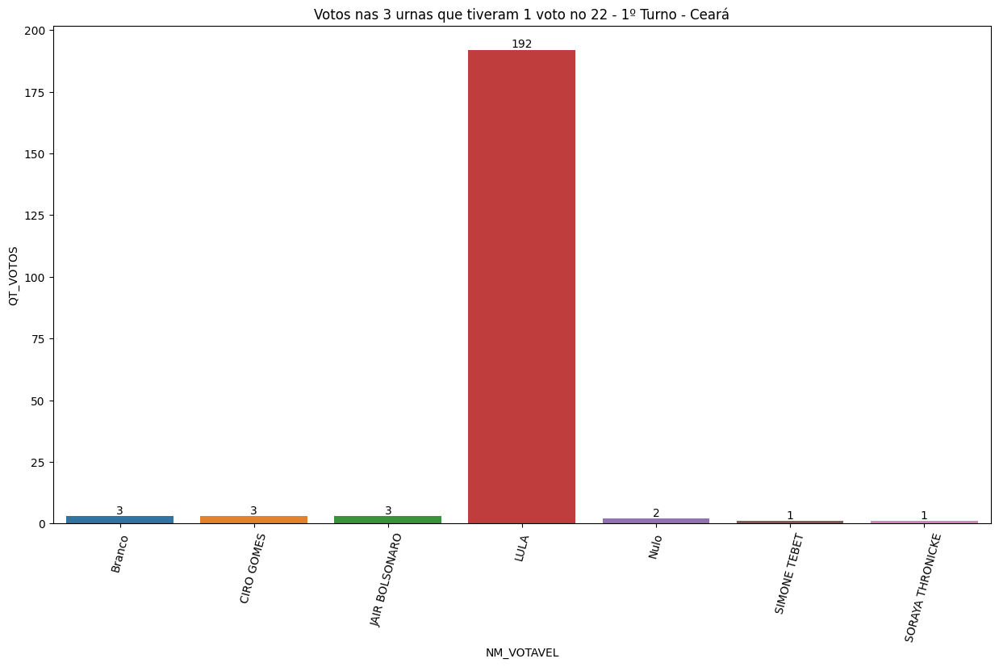

In [ ]:

df_soma = None

for i in range(len(df1pb_urnas_22)):
    cidade = df1pb_urnas_22.iloc[i, df1pb_urnas_22.columns.get_loc('CD_MUNICIPIO')]
    zona = df1pb_urnas_22.iloc[i, df1pb_urnas_22.columns.get_loc('NR_ZONA')]
    secao = df1pb_urnas_22.iloc[i, df1pb_urnas_22.columns.get_loc('NR_SECAO')]
    local = df1pb_urnas_22.iloc[i, df1pb_urnas_22.columns.get_loc('NR_LOCAL_VOTACAO')]

    df_temp = df1pb[(df1pb['CD_MUNICIPIO'] == cidade) &
                    (df1pb['NR_ZONA'] == zona) &
                    (df1pb['NR_SECAO'] == secao) &
                    (df1pb['NR_LOCAL_VOTACAO'] == local)][['NM_VOTAVEL', 'QT_VOTOS']]

    if (df_soma is not None):
        df_soma = pd.concat([df_soma, df_temp], ignore_index=True)
    else:        
        df_soma = df_temp

df_soma = df_soma.groupby('NM_VOTAVEL', as_index=False).sum('QT_VOTOS')

plt.figure(figsize=(15,8))
ax = sns.barplot(x='NM_VOTAVEL', 
                 y='QT_VOTOS', 
                 data=df_soma)

ax.bar_label(ax.containers[0])
ax.set(title=f'Votos nas {df1pb_urnas_22["NR_VOTAVEL"].count()} urnas que tiveram 1 voto no 22 - 1º Turno - Ceará')

for item in ax.get_xticklabels():
    item.set_rotation(75)

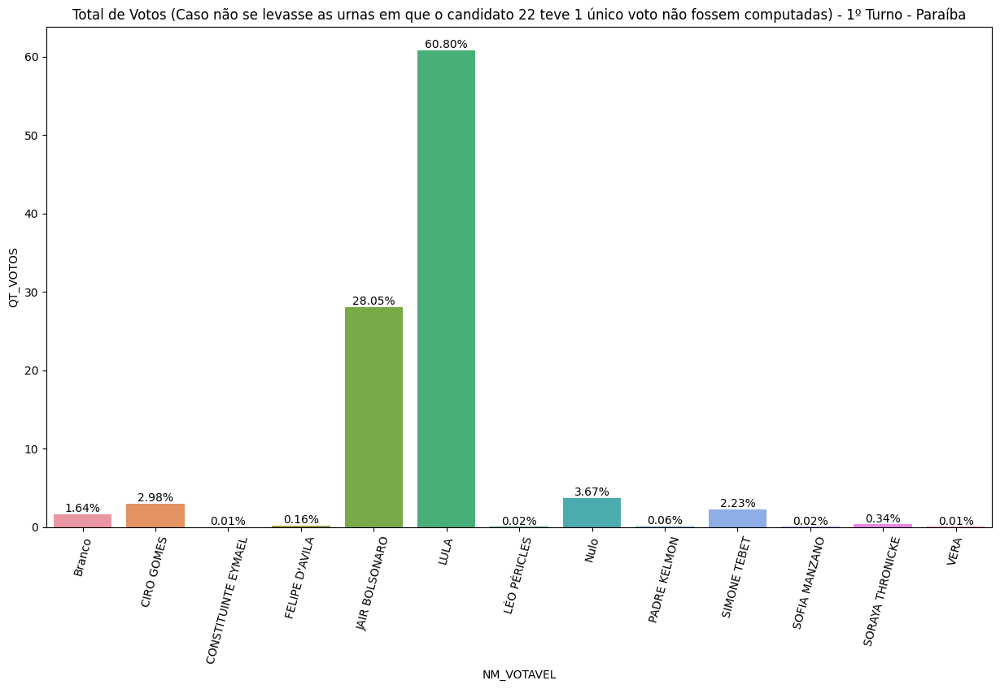

In [ ]:
# Total de votos, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas

df1pb_sub = df1pb[~((df1pb['CD_MUNICIPIO'].isin(df1ce_urnas_22['CD_MUNICIPIO'])) & 
                    (df1pb['NR_ZONA'].isin(df1ce_urnas_22['NR_ZONA'])) & 
                    (df1pb['NR_SECAO'].isin(df1ce_urnas_22['NR_SECAO'])) & 
                    (df1pb['NR_LOCAL_VOTACAO'].isin(df1ce_urnas_22['NR_LOCAL_VOTACAO'])))]


total1pb_sub = df1pb_sub['QT_VOTOS'].sum()

df1pb_sub_order = df1pb_sub.groupby('NM_VOTAVEL', as_index=False)['QT_VOTOS'].sum()
df1pb_sub_order['QT_VOTOS'] = (df1pb_sub_order['QT_VOTOS'] / total1pb_sub) * 100

plt.figure(figsize=(15,8))
ax = sns.barplot(x='NM_VOTAVEL', 
                 y='QT_VOTOS', 
                 data=df1pb_sub_order)

ax.bar_label(ax.containers[0], fmt="%.2f%%")
ax.set(title=f'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno - Paraíba')

for item in ax.get_xticklabels():
    item.set_rotation(75)

Caso não se computasse as urnas em que o candidato 22 teve 1 único voto, qual seria o resultado?

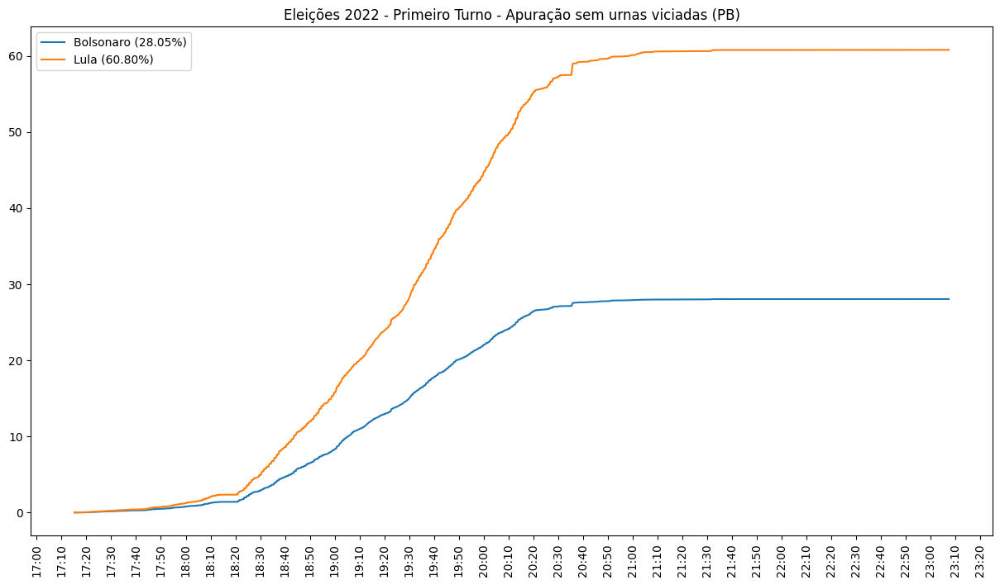

In [ ]:
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas

total1pb_sub = df1pb_sub['QT_VOTOS'].sum()

df1pb_sub_13 = df1pb_sub[df1pb_sub['NR_VOTAVEL'] == 13][['data_hora', 'QT_VOTOS']]
df1pb_sub_22 = df1pb_sub[df1pb_sub['NR_VOTAVEL'] == 22][['data_hora', 'QT_VOTOS']]

df1pb_sub_13.set_index('data_hora', inplace=True)
df1pb_sub_22.set_index('data_hora', inplace=True)

df1pb_sub_13.sort_index(inplace=True)
df1pb_sub_22.sort_index(inplace=True)

df1pb_sub_13['acumulados'] = df1pb_sub_13['QT_VOTOS'].cumsum()
df1pb_sub_22['acumulados'] = df1pb_sub_22['QT_VOTOS'].cumsum()

df1pb_sub_13['acumulados'] = (df1pb_sub_13['acumulados'] / total1pb_sub) * 100
df1pb_sub_22['acumulados'] = (df1pb_sub_22['acumulados'] / total1pb_sub) * 100

fig, ax = plt.subplots(figsize=(15,8))

ax.plot(df1pb_sub_22.index, df1pb_sub_22['acumulados'], label=f"Bolsonaro ({df1pb_sub_22['acumulados'].iloc[-1]:.2f}%)")
ax.plot(df1pb_sub_13.index, df1pb_sub_13['acumulados'], label=f"Lula ({df1pb_sub_13['acumulados'].iloc[-1]:.2f}%)")

# date_fmt = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
ax.xaxis.set_major_formatter(date_fmt)
ax.xaxis.set_tick_params(labelrotation=90)

ax.set_title('Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas (PB)')
ax.legend()

##### 1.1.1.7 - PERNAMBUCO

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


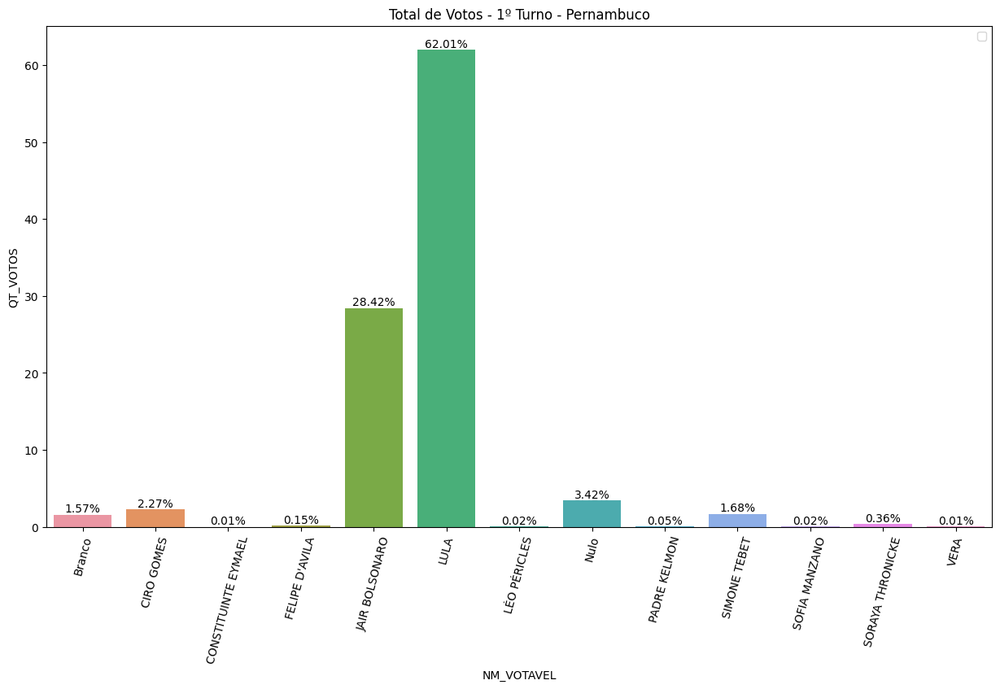

In [ ]:
# Graficos - Total no 1º turno
total1pe = df1pe['QT_VOTOS'].sum()

df1pe_order = df1pe.groupby('NM_VOTAVEL', as_index=False)['QT_VOTOS'].sum()
df1pe_order['QT_VOTOS'] = (df1pe_order['QT_VOTOS'] / total1pe) * 100
plt.figure(figsize=(15,8))
ax = sns.barplot(x='NM_VOTAVEL', 
                 y='QT_VOTOS', 
                 data=df1pe_order)

ax.bar_label(ax.containers[0], fmt="%.2f%%")
ax.set(title=f'Total de Votos - 1º Turno - Pernambuco')

for item in ax.get_xticklabels():
    item.set_rotation(75)

ax.legend()

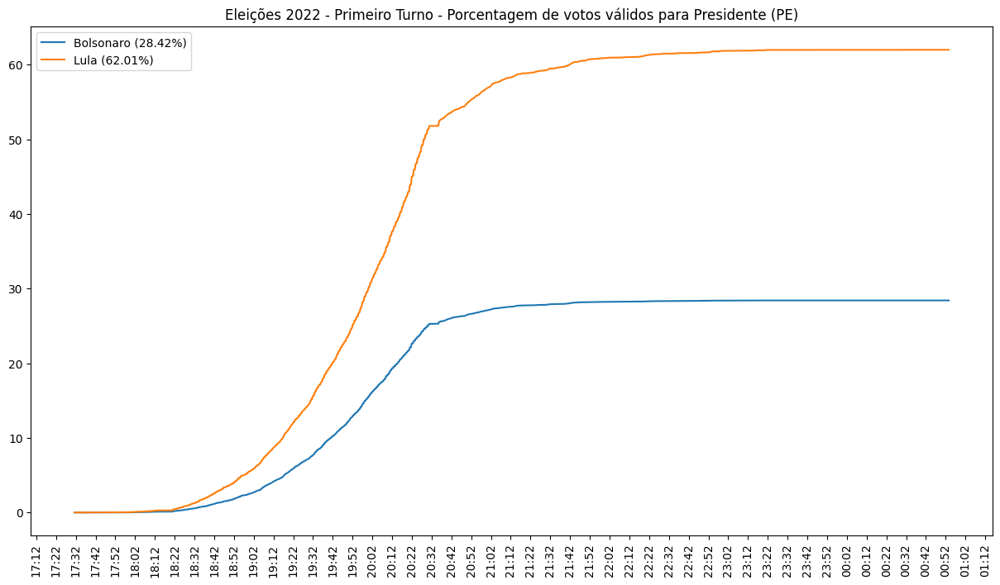

In [ ]:
# Total de votos acumulados
df1pe_13 = df1pe[df1pe['NR_VOTAVEL'] == 13][['data_hora', 'QT_VOTOS']]
df1pe_22 = df1pe[df1pe['NR_VOTAVEL'] == 22][['data_hora', 'QT_VOTOS']]

df1pe_13.set_index('data_hora', inplace=True)
df1pe_22.set_index('data_hora', inplace=True)

df1pe_13.sort_index(inplace=True)
df1pe_22.sort_index(inplace=True)

df1pe_13['acumulados'] = df1pe_13['QT_VOTOS'].cumsum()
df1pe_22['acumulados'] = df1pe_22['QT_VOTOS'].cumsum()

df1pe_13['acumulados'] = (df1pe_13['acumulados'] / total1pe) * 100
df1pe_22['acumulados'] = (df1pe_22['acumulados'] / total1pe) * 100


fig, ax = plt.subplots(figsize=(15,8))

ax.plot(df1pe_22.index, df1pe_22['acumulados'], label=f"Bolsonaro ({df1pe_22['acumulados'].iloc[-1]:.2f}%)")
ax.plot(df1pe_13.index, df1pe_13['acumulados'], label=f"Lula ({df1pe_13['acumulados'].iloc[-1]:.2f}%)")

ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
ax.xaxis.set_major_formatter(date_fmt)
ax.xaxis.set_tick_params(labelrotation=90)

ax.set_title('Eleições 2022 - Primeiro Turno - Porcentagem de votos válidos para Presidente (PE)')
ax.legend()

Quantidade de urnas com 1 voto - Primeiro Turno

In [ ]:

df1pe_urnas = df1pe[df1pe['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1pe_urnas[df1pe_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1pe_urnas[df1pe_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")

Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 3


Quais as seções eleitorais que apresentaram urnas com 1 voto no 22?

In [ ]:

df1pe_urnas_22 = df1pe_urnas[df1pe_urnas['NR_VOTAVEL'] == 22]
df1pe_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']]

,NM_MUNICIPIO,NR_ZONA,NR_SECAO,NR_LOCAL_VOTACAO
1403913,GARANHUNS,56,524,1902
1624940,TERRA NOVA,78,49,1384
1625009,TERRA NOVA,78,50,1376


Das urnas em que o 22 recebeu 1 voto, qual a quantidade de votos totais?

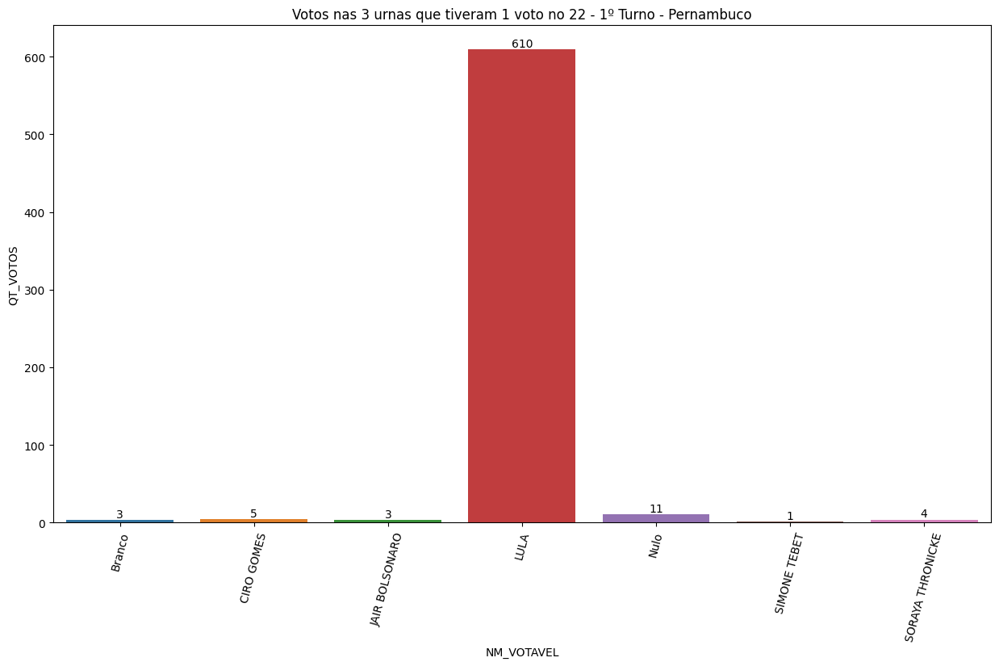

In [ ]:
df_soma = None

for i in range(len(df1pe_urnas_22)):
    cidade = df1pe_urnas_22.iloc[i, df1pe_urnas_22.columns.get_loc('CD_MUNICIPIO')]
    zona = df1pe_urnas_22.iloc[i, df1pe_urnas_22.columns.get_loc('NR_ZONA')]
    secao = df1pe_urnas_22.iloc[i, df1pe_urnas_22.columns.get_loc('NR_SECAO')]
    local = df1pe_urnas_22.iloc[i, df1pe_urnas_22.columns.get_loc('NR_LOCAL_VOTACAO')]

    df_temp = df1pe[(df1pe['CD_MUNICIPIO'] == cidade) &
                    (df1pe['NR_ZONA'] == zona) &
                    (df1pe['NR_SECAO'] == secao) &
                    (df1pe['NR_LOCAL_VOTACAO'] == local)][['NM_VOTAVEL', 'QT_VOTOS']]

    if (df_soma is not None):
        df_soma = pd.concat([df_soma, df_temp], ignore_index=True)
    else:        
        df_soma = df_temp

df_soma = df_soma.groupby('NM_VOTAVEL', as_index=False).sum('QT_VOTOS')

plt.figure(figsize=(15,8))
ax = sns.barplot(x='NM_VOTAVEL', 
                 y='QT_VOTOS', 
                 data=df_soma)

ax.bar_label(ax.containers[0])
ax.set(title=f'Votos nas {df1pe_urnas_22["NR_VOTAVEL"].count()} urnas que tiveram 1 voto no 22 - 1º Turno - Pernambuco')

for item in ax.get_xticklabels():
    item.set_rotation(75)

Total de votos, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas

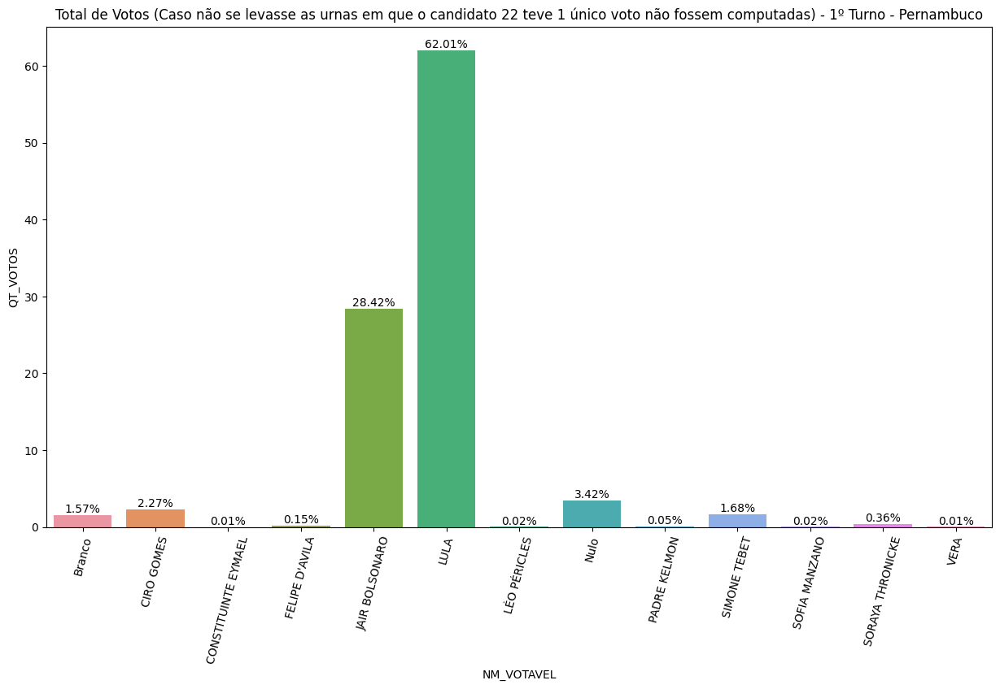

In [ ]:
df1pe_sub = df1pe[~((df1pe['CD_MUNICIPIO'].isin(df1ce_urnas_22['CD_MUNICIPIO'])) & 
                    (df1pe['NR_ZONA'].isin(df1ce_urnas_22['NR_ZONA'])) & 
                    (df1pe['NR_SECAO'].isin(df1ce_urnas_22['NR_SECAO'])) & 
                    (df1pe['NR_LOCAL_VOTACAO'].isin(df1ce_urnas_22['NR_LOCAL_VOTACAO'])))]


total1pe_sub = df1pe_sub['QT_VOTOS'].sum()

df1pe_sub_order = df1pe_sub.groupby('NM_VOTAVEL', as_index=False)['QT_VOTOS'].sum()
df1pe_sub_order['QT_VOTOS'] = (df1pe_sub_order['QT_VOTOS'] / total1pe_sub) * 100

plt.figure(figsize=(15,8))
ax = sns.barplot(x='NM_VOTAVEL', 
                 y='QT_VOTOS', 
                 data=df1pe_sub_order)

ax.bar_label(ax.containers[0], fmt="%.2f%%")
ax.set(title=f'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno - Pernambuco')

for item in ax.get_xticklabels():
    item.set_rotation(75)

Caso não se computasse as urnas em que o candidato 22 teve 1 único voto, qual seria o resultado?

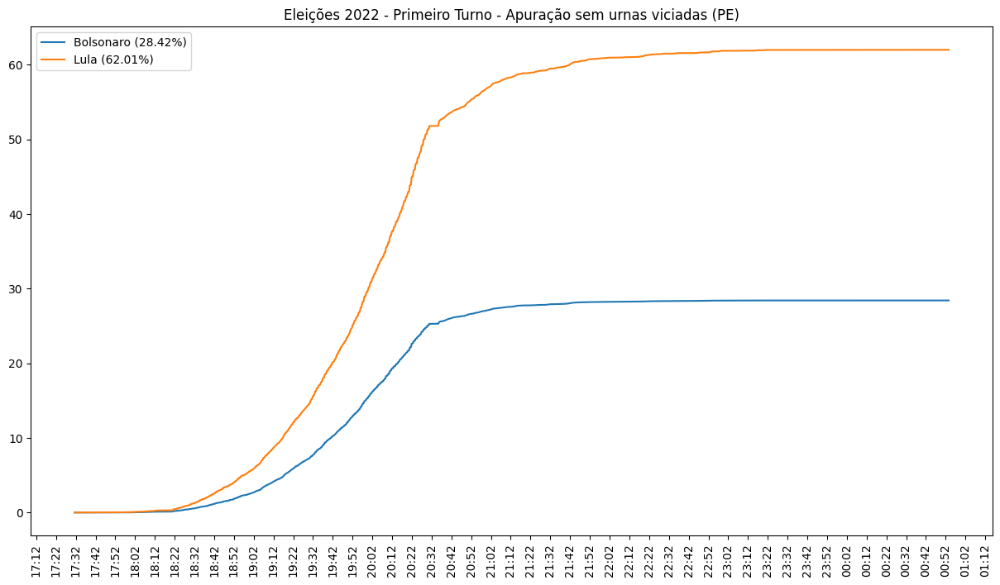

In [ ]:
total1pe_sub = df1pe_sub['QT_VOTOS'].sum()

df1pe_sub_13 = df1pe_sub[df1pe_sub['NR_VOTAVEL'] == 13][['data_hora', 'QT_VOTOS']]
df1pe_sub_22 = df1pe_sub[df1pe_sub['NR_VOTAVEL'] == 22][['data_hora', 'QT_VOTOS']]

df1pe_sub_13.set_index('data_hora', inplace=True)
df1pe_sub_22.set_index('data_hora', inplace=True)

df1pe_sub_13.sort_index(inplace=True)
df1pe_sub_22.sort_index(inplace=True)

df1pe_sub_13['acumulados'] = df1pe_sub_13['QT_VOTOS'].cumsum()
df1pe_sub_22['acumulados'] = df1pe_sub_22['QT_VOTOS'].cumsum()

df1pe_sub_13['acumulados'] = (df1pe_sub_13['acumulados'] / total1pe_sub) * 100
df1pe_sub_22['acumulados'] = (df1pe_sub_22['acumulados'] / total1pe_sub) * 100

fig, ax = plt.subplots(figsize=(15,8))

ax.plot(df1pe_sub_22.index, df1pe_sub_22['acumulados'], label=f"Bolsonaro ({df1pe_sub_22['acumulados'].iloc[-1]:.2f}%)")
ax.plot(df1pe_sub_13.index, df1pe_sub_13['acumulados'], label=f"Lula ({df1pe_sub_13['acumulados'].iloc[-1]:.2f}%)")

ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
ax.xaxis.set_major_formatter(date_fmt)
ax.xaxis.set_tick_params(labelrotation=90)

ax.set_title('Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas (PE)')
ax.legend()

##### 1.1.1.8 - ALAGOAS

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


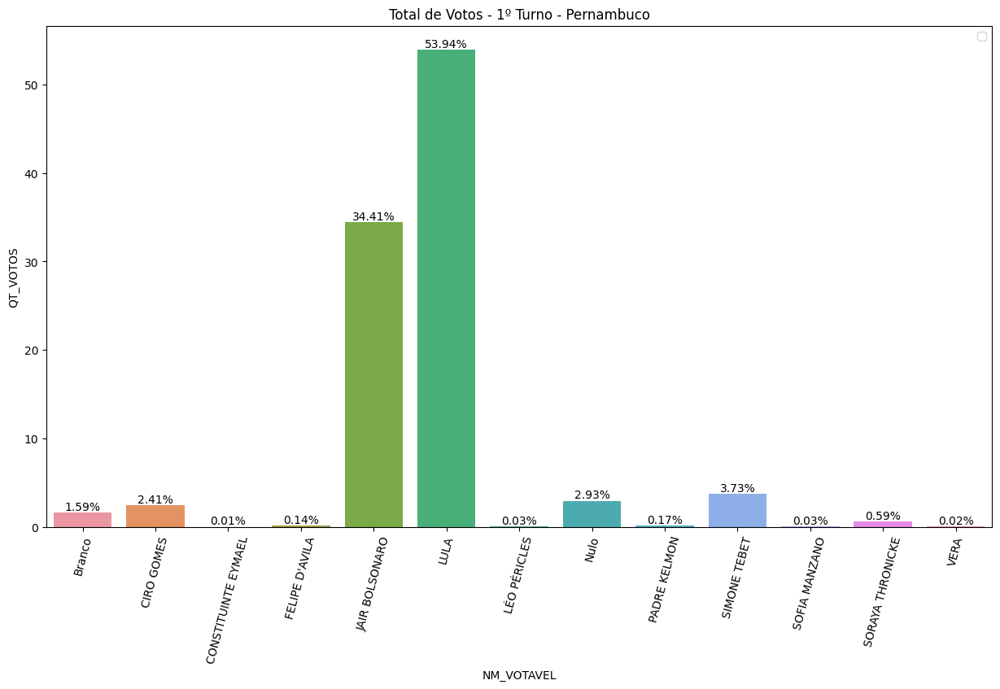

In [ ]:
# Graficos - Total no 1º turno
total1al = df1al['QT_VOTOS'].sum()

df1al_order = df1al.groupby('NM_VOTAVEL', as_index=False)['QT_VOTOS'].sum()
df1al_order['QT_VOTOS'] = (df1al_order['QT_VOTOS'] / total1al) * 100
plt.figure(figsize=(15,8))
ax = sns.barplot(x='NM_VOTAVEL', 
                 y='QT_VOTOS', 
                 data=df1al_order)

ax.bar_label(ax.containers[0], fmt="%.2f%%")
ax.set(title=f'Total de Votos - 1º Turno - Pernambuco')

for item in ax.get_xticklabels():
    item.set_rotation(75)

ax.legend()

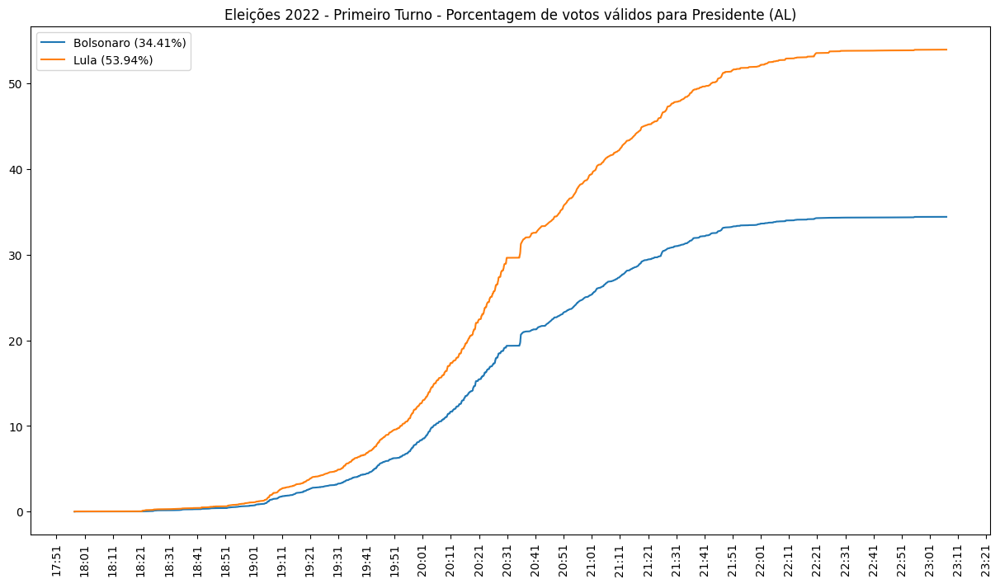

In [ ]:
# Total de votos acumulados
df1al_13 = df1al[df1al['NR_VOTAVEL'] == 13][['data_hora', 'QT_VOTOS']]
df1al_22 = df1al[df1al['NR_VOTAVEL'] == 22][['data_hora', 'QT_VOTOS']]

df1al_13.set_index('data_hora', inplace=True)
df1al_22.set_index('data_hora', inplace=True)

df1al_13.sort_index(inplace=True)
df1al_22.sort_index(inplace=True)

df1al_13['acumulados'] = df1al_13['QT_VOTOS'].cumsum()
df1al_22['acumulados'] = df1al_22['QT_VOTOS'].cumsum()

df1al_13['acumulados'] = (df1al_13['acumulados'] / total1al) * 100
df1al_22['acumulados'] = (df1al_22['acumulados'] / total1al) * 100

fig, ax = plt.subplots(figsize=(15,8))

ax.plot(df1al_22.index, df1al_22['acumulados'], label=f"Bolsonaro ({df1al_22['acumulados'].iloc[-1]:.2f}%)")
ax.plot(df1al_13.index, df1al_13['acumulados'], label=f"Lula ({df1al_13['acumulados'].iloc[-1]:.2f}%)")

ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
ax.xaxis.set_major_formatter(date_fmt)
ax.xaxis.set_tick_params(labelrotation=90)

ax.set_title('Eleições 2022 - Primeiro Turno - Porcentagem de votos válidos para Presidente (AL)')
ax.legend()

Quantidade de urnas com 1 voto - Primeiro Turno

In [ ]:

df1al_urnas = df1al[df1al['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1al_urnas[df1al_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1al_urnas[df1al_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")

Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 0


##### 1.1.1.9 - SERGIPE

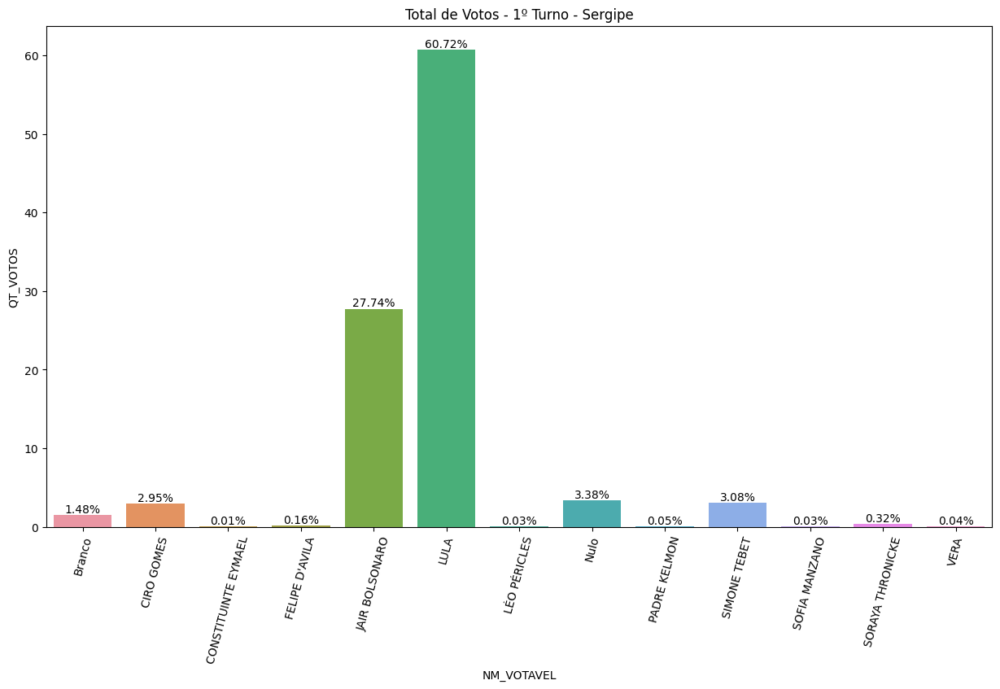

In [ ]:
# Graficos - Total no 1º turno
total1se = df1se['QT_VOTOS'].sum()

df1se_order = df1se.groupby('NM_VOTAVEL', as_index=False)['QT_VOTOS'].sum()
df1se_order['QT_VOTOS'] = (df1se_order['QT_VOTOS'] / total1se) * 100
plt.figure(figsize=(15,8))
ax = sns.barplot(x='NM_VOTAVEL', 
                 y='QT_VOTOS', 
                 data=df1se_order)

ax.bar_label(ax.containers[0], fmt="%.2f%%")
ax.set(title=f'Total de Votos - 1º Turno - Sergipe')

for item in ax.get_xticklabels():
    item.set_rotation(75)

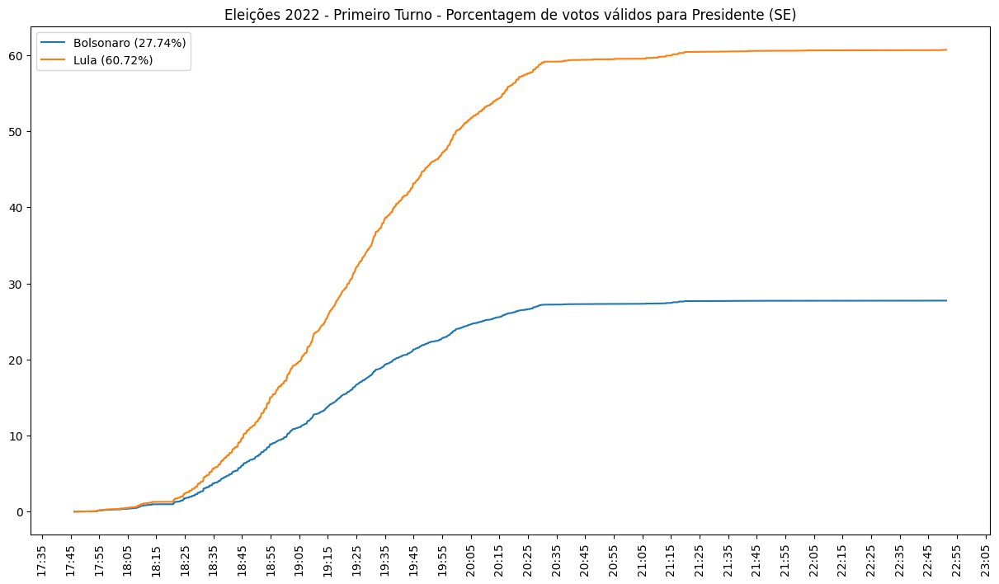

In [ ]:
# Total de votos acumulados
df1se_13 = df1se[df1se['NR_VOTAVEL'] == 13][['data_hora', 'QT_VOTOS']]
df1se_22 = df1se[df1se['NR_VOTAVEL'] == 22][['data_hora', 'QT_VOTOS']]

df1se_13.set_index('data_hora', inplace=True)
df1se_22.set_index('data_hora', inplace=True)

df1se_13.sort_index(inplace=True)
df1se_22.sort_index(inplace=True)

df1se_13['acumulados'] = df1se_13['QT_VOTOS'].cumsum()
df1se_22['acumulados'] = df1se_22['QT_VOTOS'].cumsum()

df1se_13['acumulados'] = (df1se_13['acumulados'] / total1se) * 100
df1se_22['acumulados'] = (df1se_22['acumulados'] / total1se) * 100


fig, ax = plt.subplots(figsize=(15,8))

ax.plot(df1se_22.index, df1se_22['acumulados'], label=f"Bolsonaro ({df1se_22['acumulados'].iloc[-1]:.2f}%)")
ax.plot(df1se_13.index, df1se_13['acumulados'], label=f"Lula ({df1se_13['acumulados'].iloc[-1]:.2f}%)")

ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
ax.xaxis.set_major_formatter(date_fmt)
ax.xaxis.set_tick_params(labelrotation=90)

ax.set_title('Eleições 2022 - Primeiro Turno - Porcentagem de votos válidos para Presidente (SE)')
ax.legend()

Quantidade de urnas com 1 voto - Primeiro Turno

In [ ]:
df1se_urnas = df1se[df1se['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1se_urnas[df1se_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1se_urnas[df1se_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")

Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 0


#### 1.1.2 - Resultado da Região

Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 147
               NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
10058              SALVADOR        5       800              1805
39495              SALVADOR       19       800              1490
41624       MANOEL VITORINO       22       160              1139
71124             ITABERABA       42       288              1570
72106          CASTRO ALVES       43       132              1376
...                     ...      ...       ...               ...
779526    PRESIDENTE SARNEY      106       224              1120
780020  SERRANO DO MARANHÃO      107        87              1120
780321  SERRANO DO MARANHÃO      107       169              1228
782082               MORROS      110       218              1180
782109               MORROS      110       224              1244

[147 rows x 4 columns]


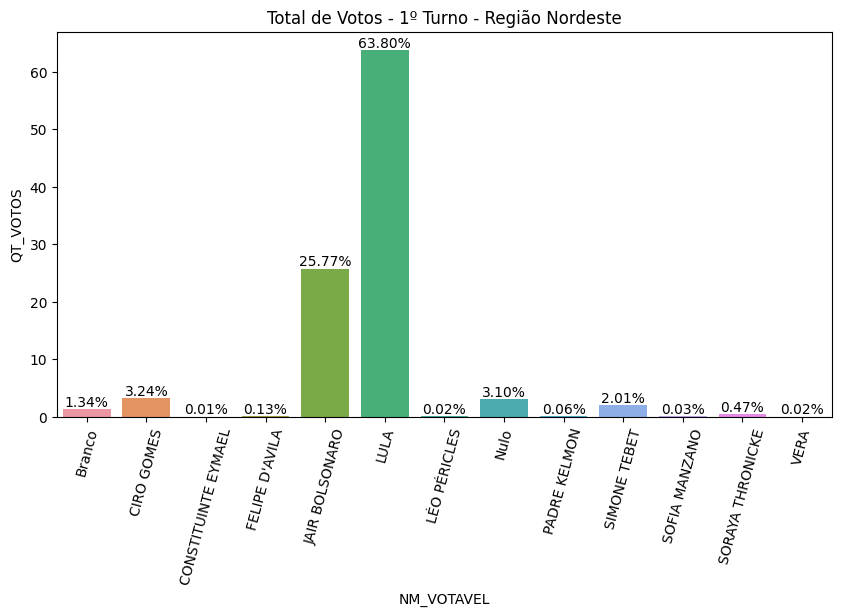

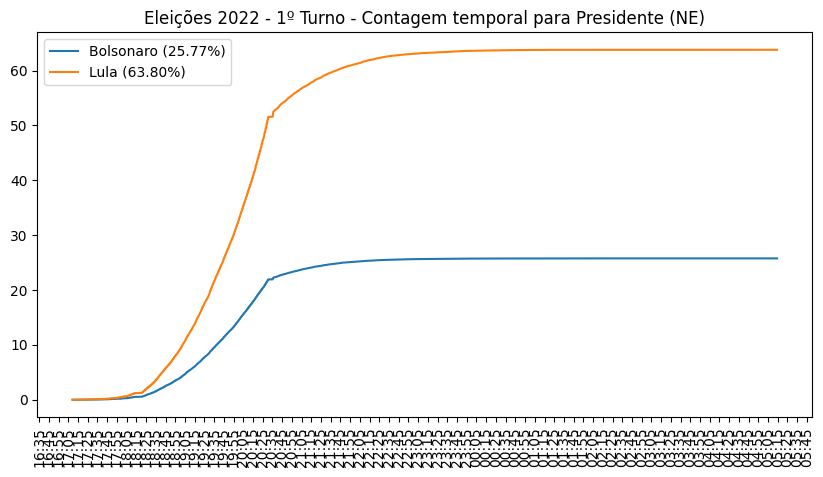

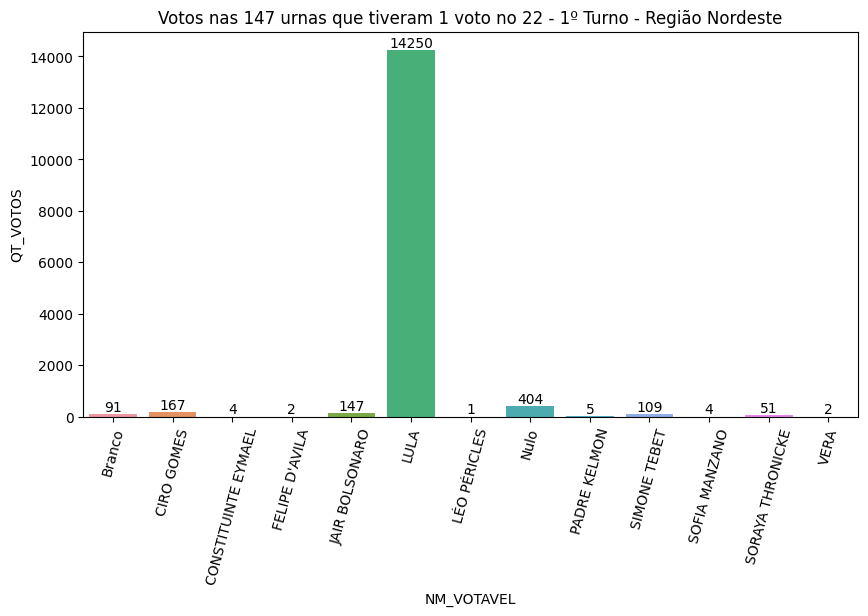

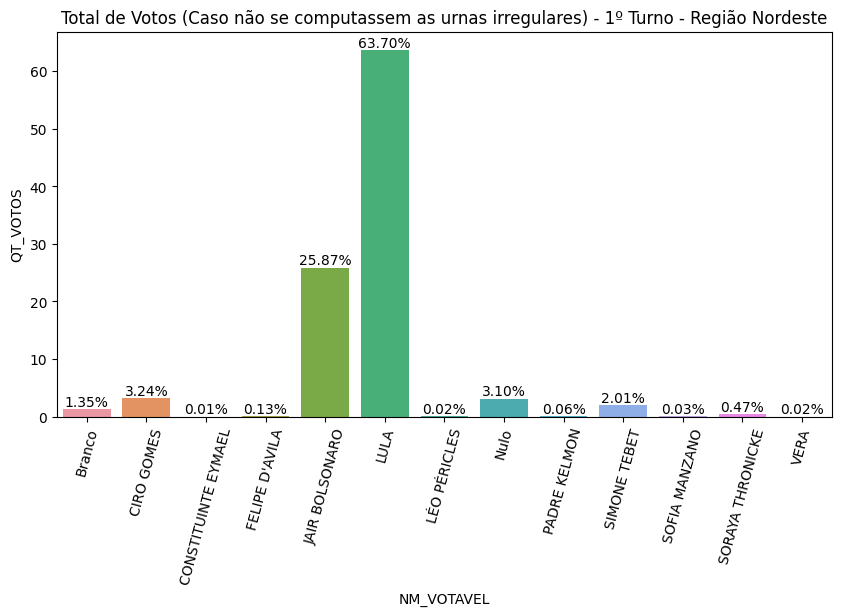

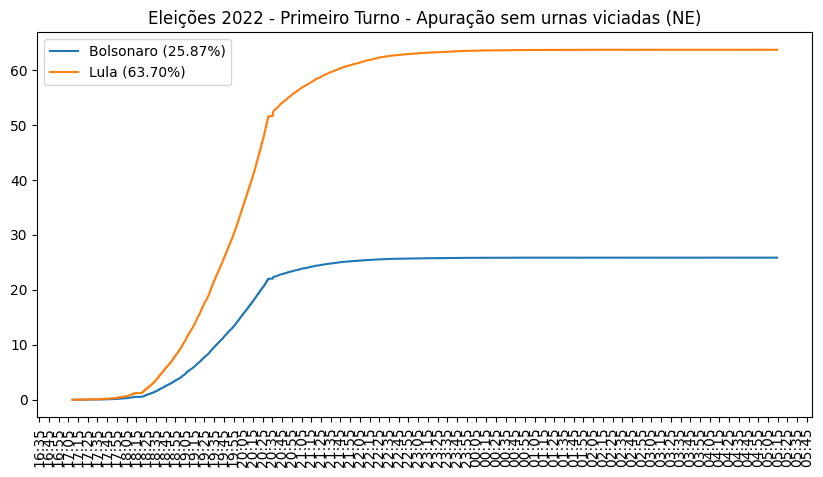

In [ ]:
df1ne = pd.concat([df1ba, df1pi, df1ce, df1pb, df1pe, df1ma, df1rn, df1al, df1se], ignore_index=True) 

# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1ne, 'Total de Votos - 1º Turno', 'Região Nordeste')

# Total de votos acumulados
gerar_grafico_temporal(df1ne, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'NE')

df1ne_urnas = df1ne[df1ne['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1ne_urnas[df1ne_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1ne_urnas[df1ne_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")

df1ne_urnas_22 = df1ne_urnas[df1ne_urnas['NR_VOTAVEL'] == 22]
print(df1ne_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])

df_soma = df_diff_group(df1ne, df1ne_urnas_22)
gerar_grafico_urnas_suspeitas(df_soma, df1ne_urnas_22, 'Região Nordeste')

# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
df1ne_sub = df1ne[~((df1ne['CD_MUNICIPIO'].isin(df1ne_urnas_22['CD_MUNICIPIO'])) &
             (df1ne['NR_ZONA'].isin(df1ne_urnas_22['NR_ZONA'])) &
             (df1ne['NR_SECAO'].isin(df1ne_urnas_22['NR_SECAO'])) &
             (df1ne['NR_LOCAL_VOTACAO'].isin(df1ne_urnas_22['NR_LOCAL_VOTACAO'])))]
             
gerar_grafico_porcentagem(df1ne_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Região Nordeste')

# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
gerar_grafico_temporal(df1ne_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'NE')

### 1.2 - Região NORTE

#### 1.2.1 - Estados

##### 1.2.1.1 - AMAZONAS


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 26
                     NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
271353                    HUMAITÁ       17        57              1252
278953   SÃO GABRIEL DA CACHOEIRA       19         1              1090
280033   SÃO GABRIEL DA CACHOEIRA       19        12              1120
280560   SÃO GABRIEL DA CACHOEIRA       19        21              1198
280615   SÃO GABRIEL DA CACHOEIRA       19        22              1198
280665   SÃO GABRIEL DA CACHOEIRA       19        23              1090
282547   SÃO GABRIEL DA CACHOEIRA       19        66              1538
283963   SÃO GABRIEL DA CACHOEIRA       19        84              1538
284432   SÃO GABRIEL DA CACHOEIRA       19        91              1155
291566          BENJAMIN CONSTANT       20        96              1309
299877      SÃO PAULO DE OLIVENÇA       22        46              1104
300295      SÃO PAULO DE OLIVENÇA       22        58              1139
3009

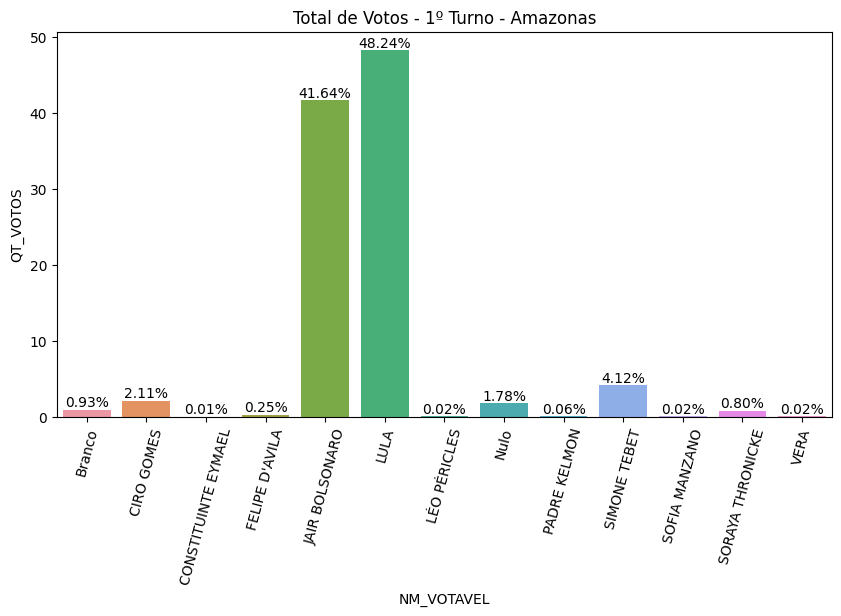

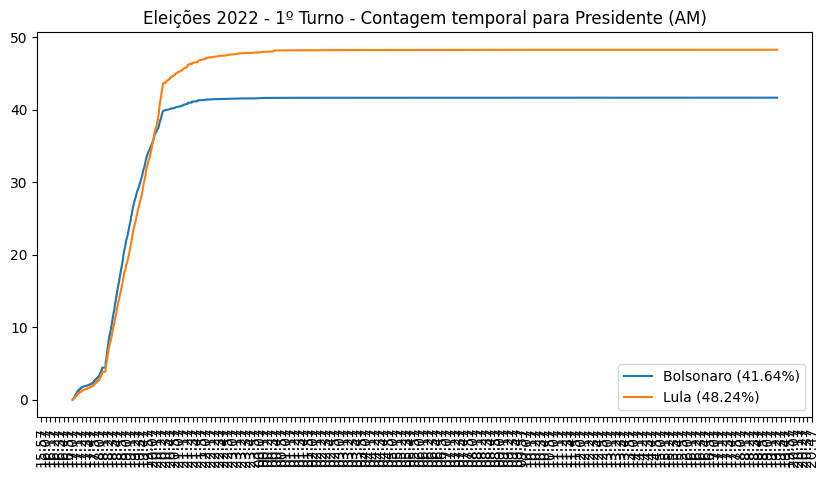

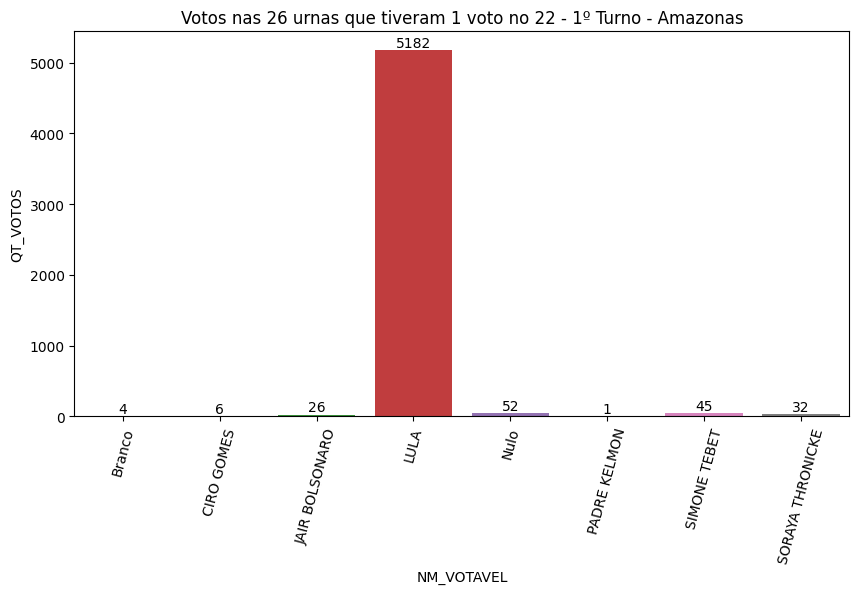

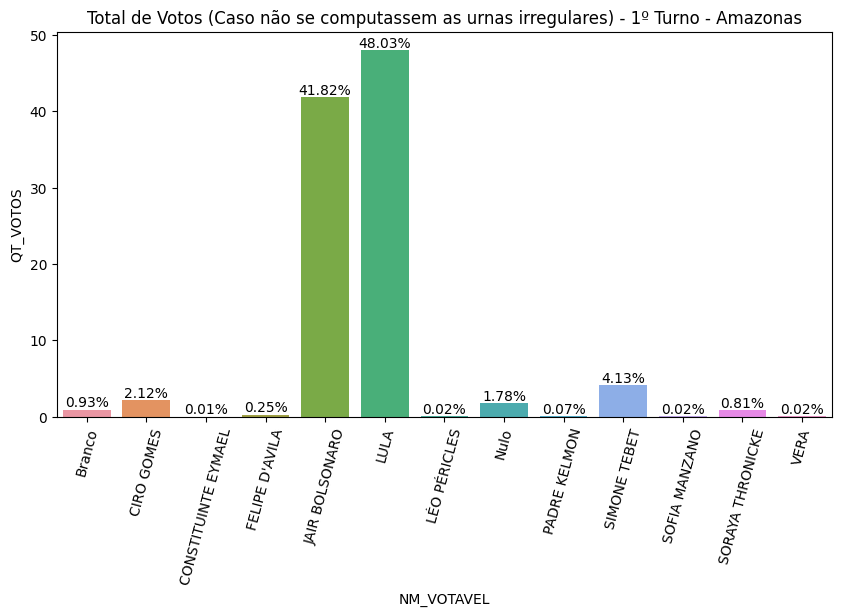

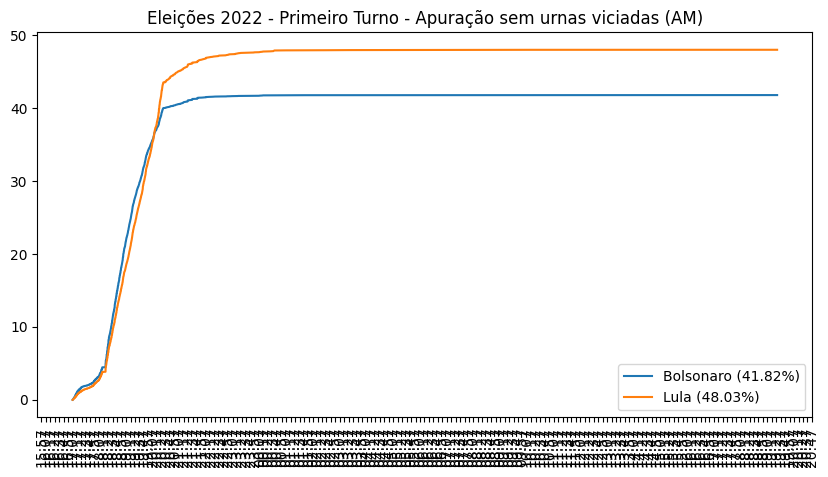

In [ ]:
# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1am, 'Total de Votos - 1º Turno', 'Amazonas')# Total de votos acumulados
gerar_grafico_temporal(df1am, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'AM')
df1am_urnas = df1am[df1am['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1am_urnas[df1am_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1am_urnas[df1am_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1am_urnas_22 = df1am_urnas[df1am_urnas['NR_VOTAVEL'] == 22]
print(df1am_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df1am, df1am_urnas_22)
gerar_grafico_urnas_suspeitas(df_soma, df1am_urnas_22, 'Amazonas')
df1am_sub = df1am[~((df1am['CD_MUNICIPIO'].isin(df1am_urnas_22['CD_MUNICIPIO'])) & 
            (df1am['NR_ZONA'].isin(df1am_urnas_22['NR_ZONA'])) & 
            (df1am['NR_SECAO'].isin(df1am_urnas_22['NR_SECAO'])) & 
            (df1am['NR_LOCAL_VOTACAO'].isin(df1am_urnas_22['NR_LOCAL_VOTACAO'])))]
gerar_grafico_porcentagem(df1am_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Amazonas')
gerar_grafico_temporal(df1am_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'AM')

##### 1.2.1.2 - PARÁ


Urnas com 1 voto no candidato 13: 1
Urnas com 1 voto no candidato 22: 24
                     NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
340628                      VISEU       14       126              1775
340715                      VISEU       14       128              1724
340860                      VISEU       14       130              1791
346758                      VISEU       14       223              2070
346794                      VISEU       14       224              2089
494754                     ÓBIDOS       22       174              1864
759967                   MARACANÃ       31         7              1066
761320                   MARACANÃ       31        23              1201
826013                      BAIÃO       35        38              1287
836552                   MOCAJUBA       35       138              1201
884369                       MOJU       37       114              1368
900738                  ORIXIMINÁ       38       127              1457
9011

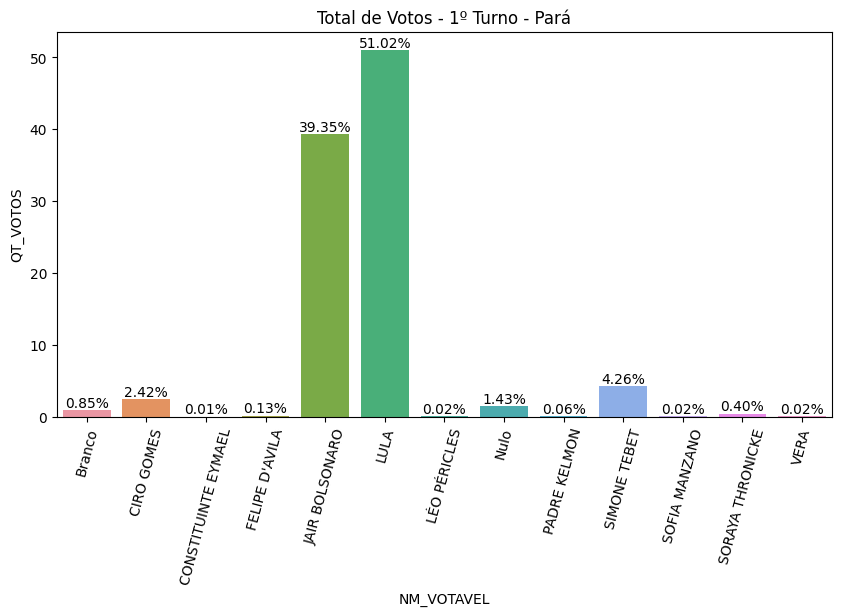

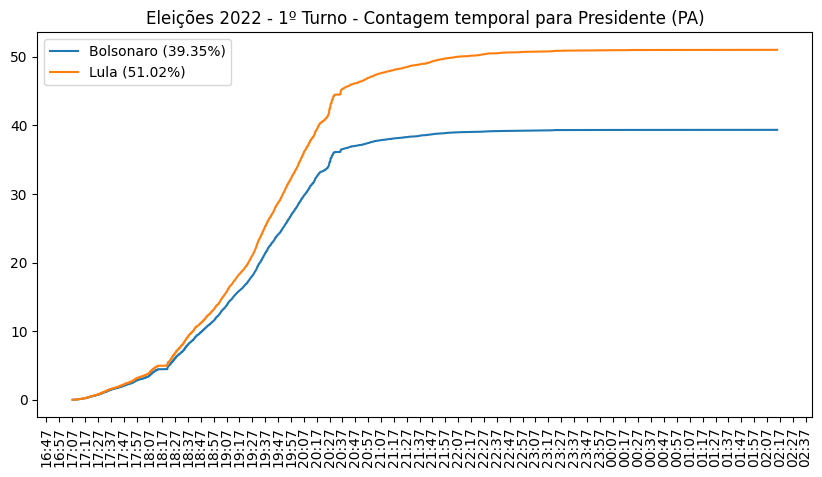

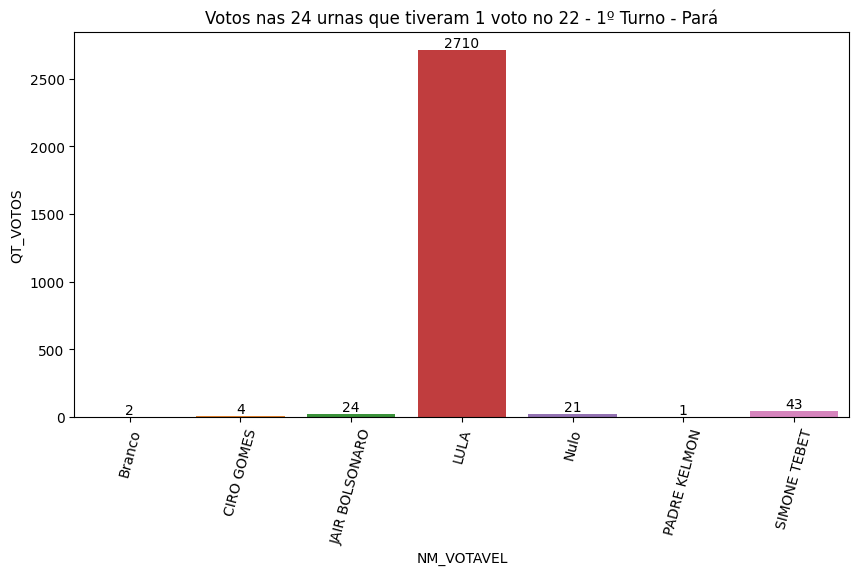

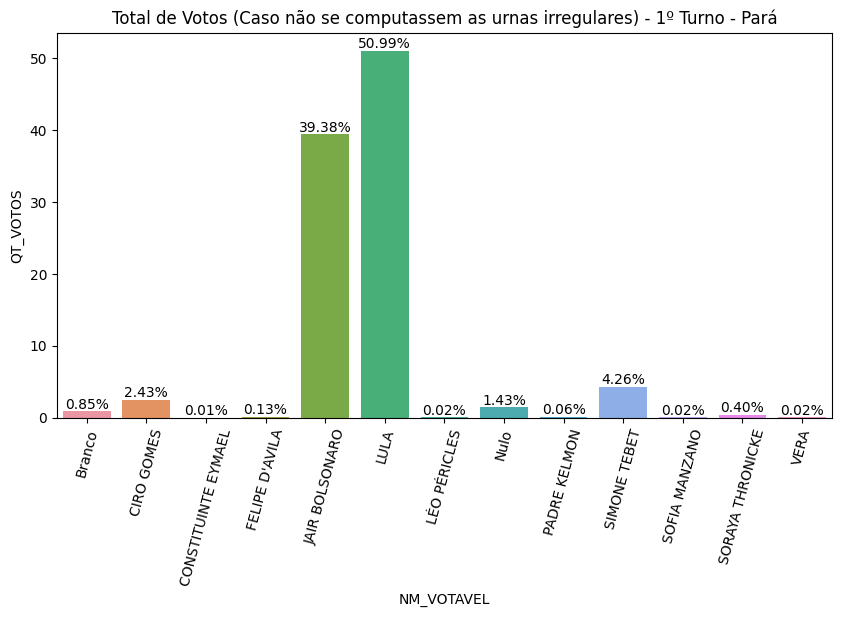

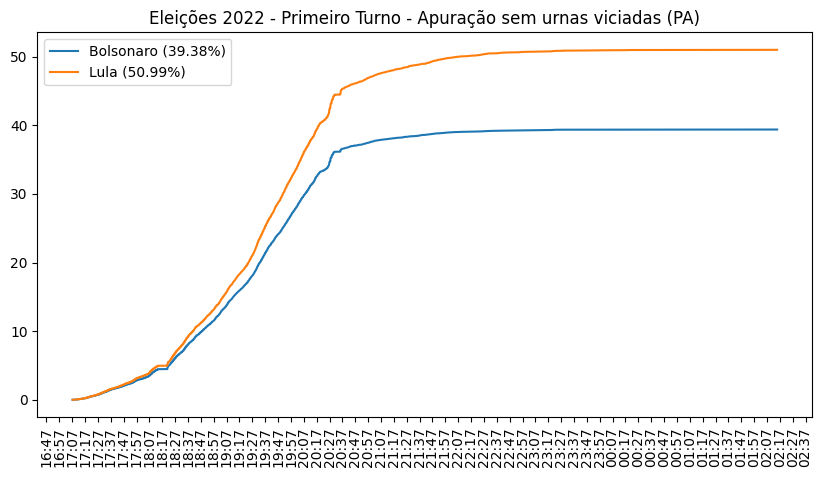

In [ ]:
# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1pa, 'Total de Votos - 1º Turno', 'Pará')# Total de votos acumulados
gerar_grafico_temporal(df1pa, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'PA')
df1pa_urnas = df1pa[df1pa['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1pa_urnas[df1pa_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1pa_urnas[df1pa_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1pa_urnas_22 = df1pa_urnas[df1pa_urnas['NR_VOTAVEL'] == 22]
print(df1pa_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df1pa, df1pa_urnas_22)
gerar_grafico_urnas_suspeitas(df_soma, df1pa_urnas_22, 'Pará')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
df1pa_sub = df1pa[~((df1pa['CD_MUNICIPIO'].isin(df1pa_urnas_22['CD_MUNICIPIO'])) & 
            (df1pa['NR_ZONA'].isin(df1pa_urnas_22['NR_ZONA'])) & 
            (df1pa['NR_SECAO'].isin(df1pa_urnas_22['NR_SECAO'])) & 
            (df1pa['NR_LOCAL_VOTACAO'].isin(df1pa_urnas_22['NR_LOCAL_VOTACAO'])))]
gerar_grafico_porcentagem(df1pa_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Pará')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
gerar_grafico_temporal(df1pa_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'PA')


##### 1.2.1.3 - ACRE


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 2
                NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
139838  MARECHAL THAUMATURGO        4       326              1163
187781               FEIJï¿½        7        69              1341


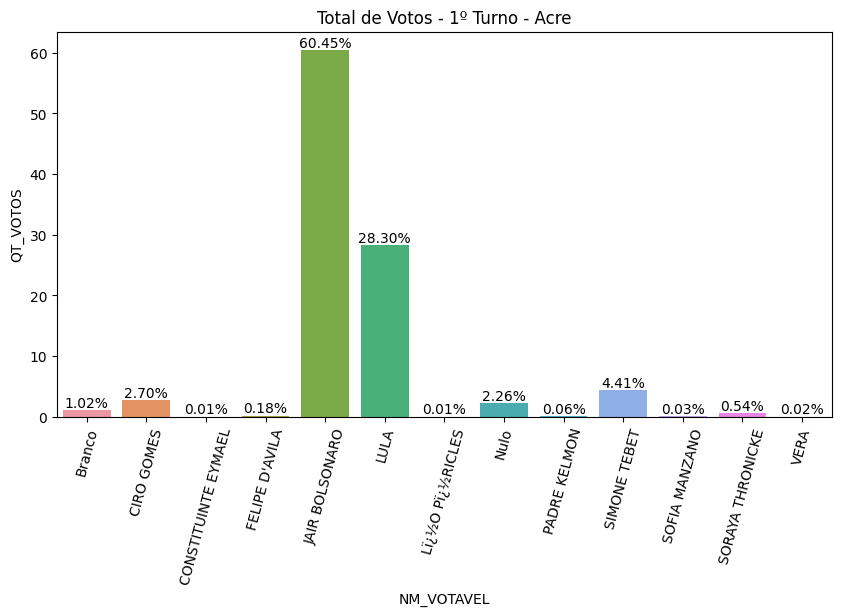

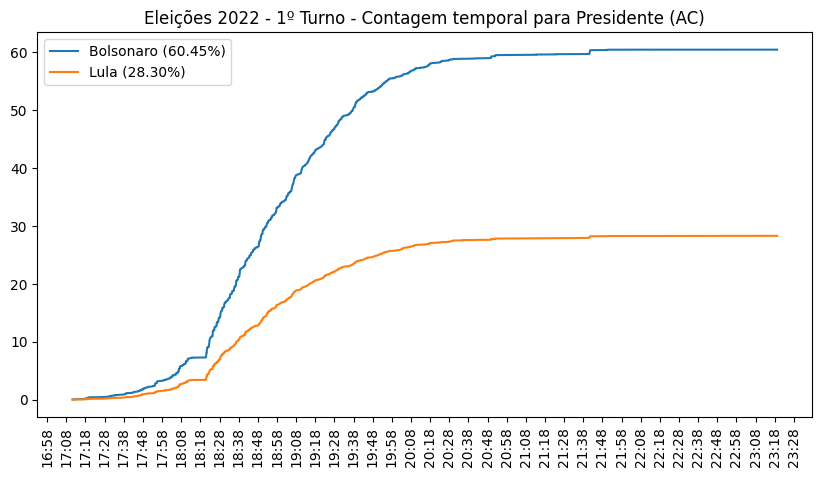

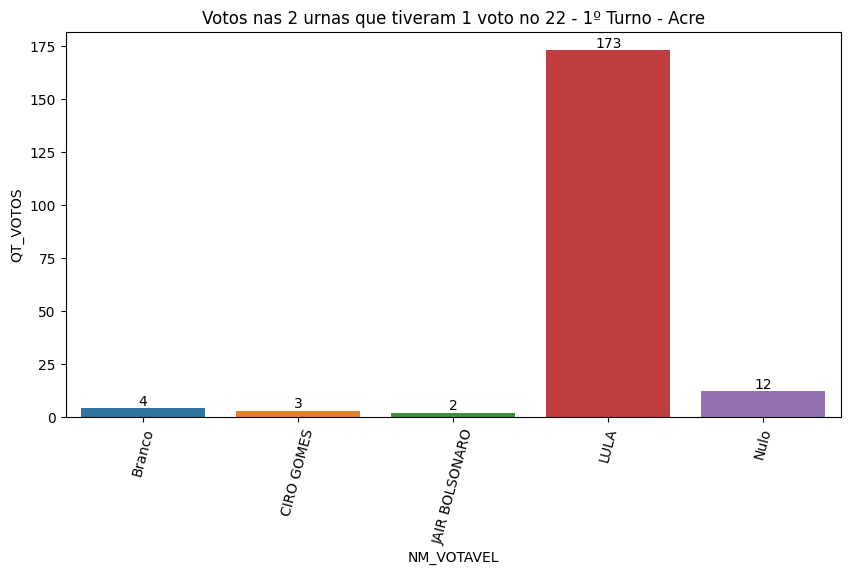

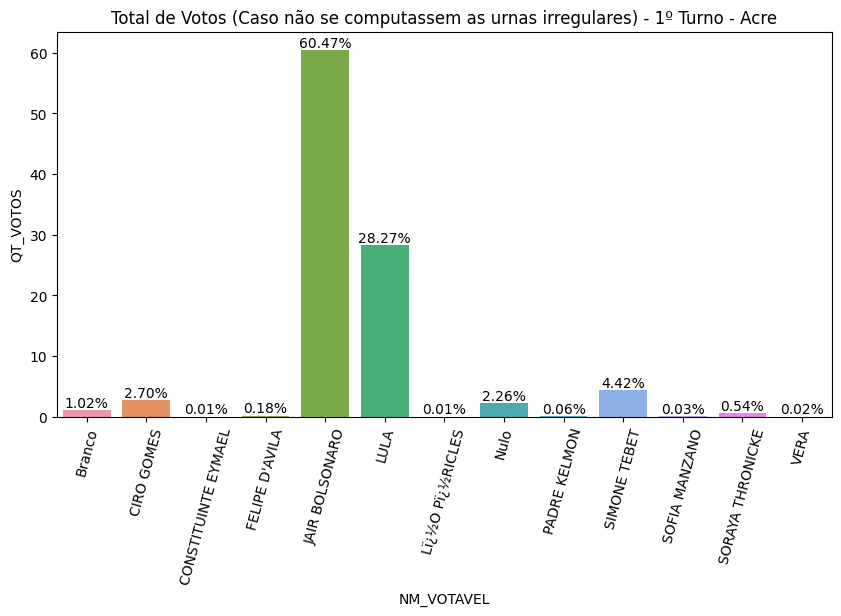

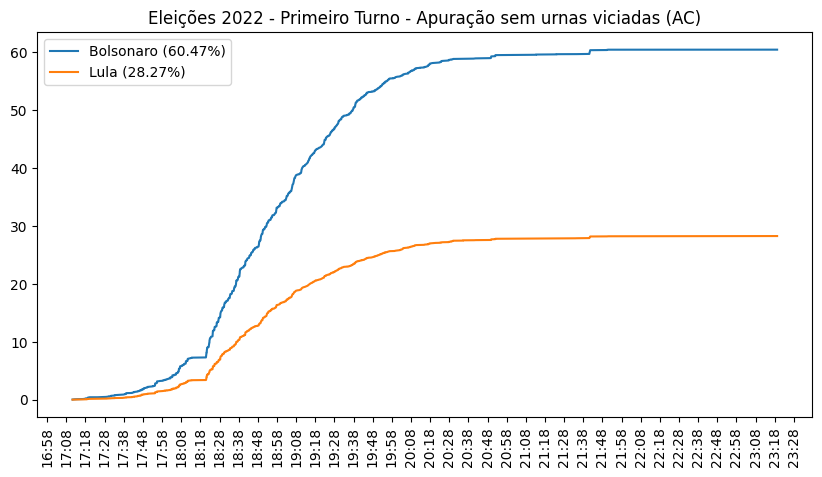

In [ ]:
# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1ac, 'Total de Votos - 1º Turno', 'Acre')# Total de votos acumulados
gerar_grafico_temporal(df1ac, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'AC')
df1ac_urnas = df1ac[df1ac['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1ac_urnas[df1ac_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1ac_urnas[df1ac_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1ac_urnas_22 = df1ac_urnas[df1ac_urnas['NR_VOTAVEL'] == 22]
print(df1ac_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df1ac, df1ac_urnas_22)
gerar_grafico_urnas_suspeitas(df_soma, df1ac_urnas_22, 'Acre')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
df1ac_sub = df1ac[~((df1ac['CD_MUNICIPIO'].isin(df1ac_urnas_22['CD_MUNICIPIO'])) & 
            (df1ac['NR_ZONA'].isin(df1ac_urnas_22['NR_ZONA'])) & 
            (df1ac['NR_SECAO'].isin(df1ac_urnas_22['NR_SECAO'])) & 
            (df1ac['NR_LOCAL_VOTACAO'].isin(df1ac_urnas_22['NR_LOCAL_VOTACAO'])))]
gerar_grafico_porcentagem(df1ac_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Acre')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
gerar_grafico_temporal(df1ac_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'AC')

##### 1.2.1.4 - RONDÔNIA


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 1


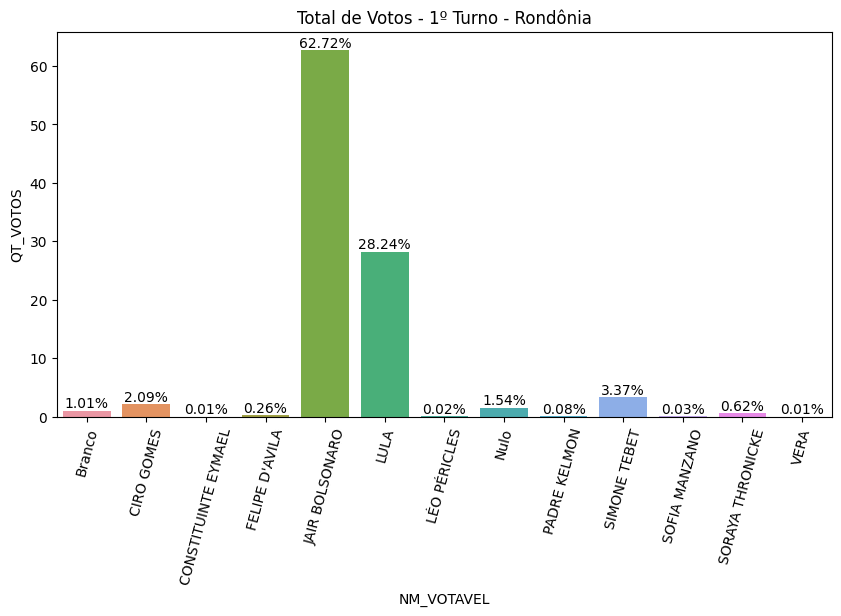

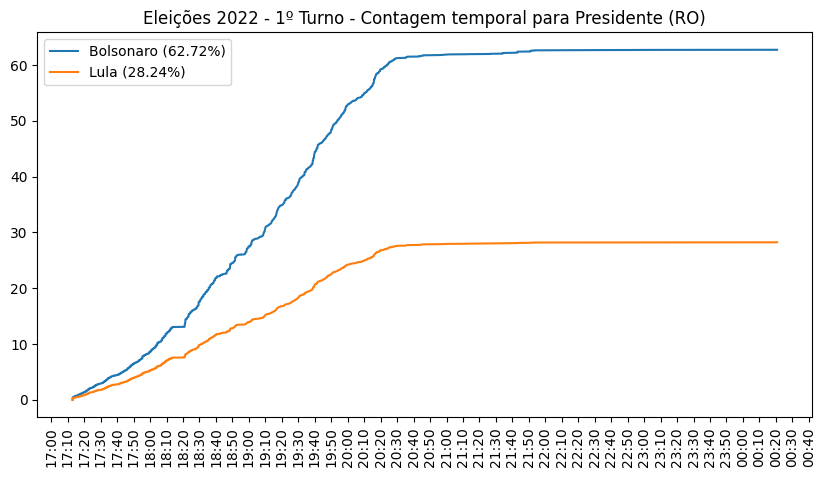

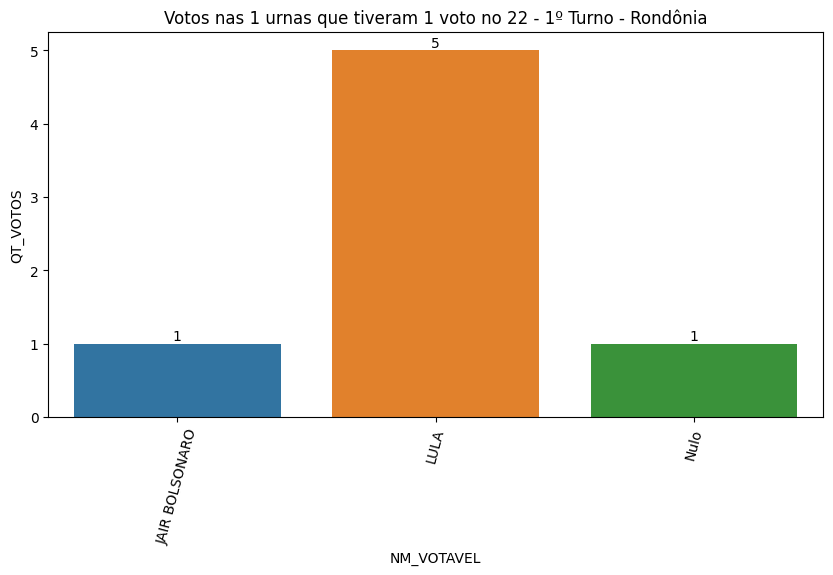

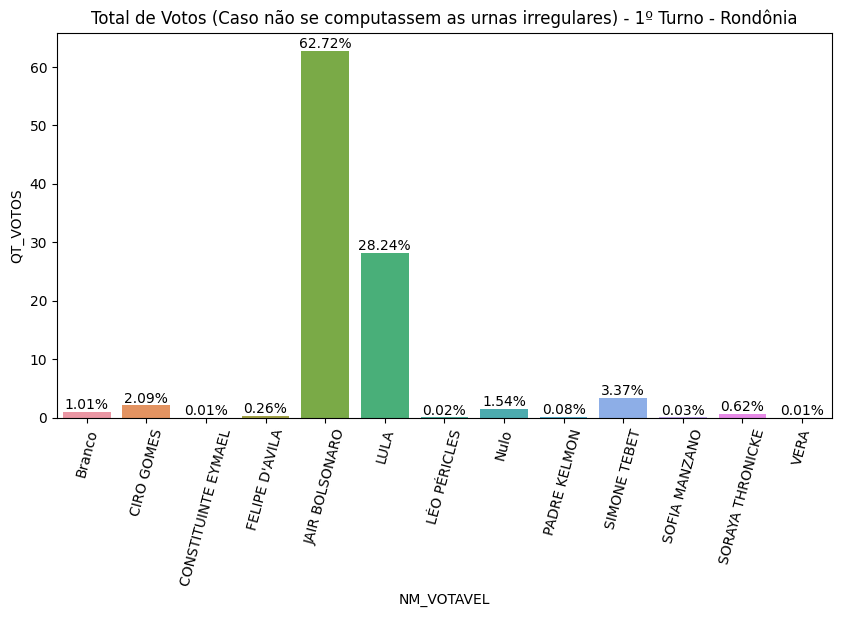

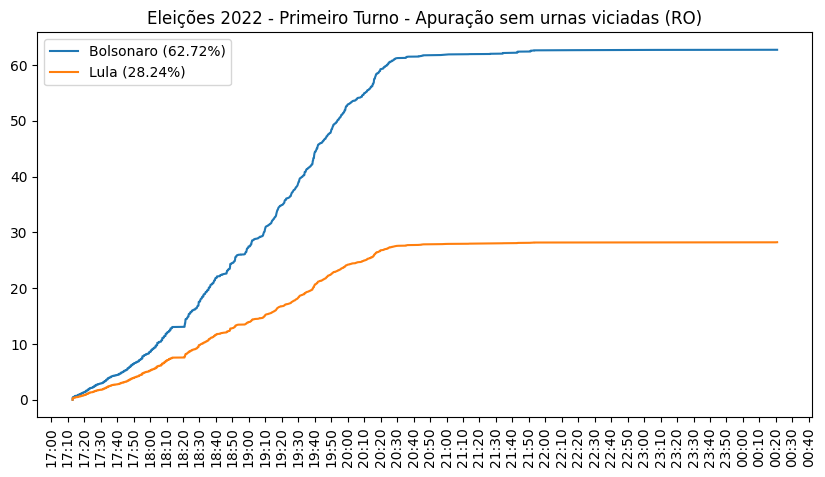

In [ ]:
# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1ro, 'Total de Votos - 1º Turno', 'Rondônia')# Total de votos acumulados
gerar_grafico_temporal(df1ro, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'RO')
df1ro_urnas = df1ro[df1ro['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1ro_urnas[df1ro_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1ro_urnas[df1ro_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1ro_urnas_22 = df1ro_urnas[df1ro_urnas['NR_VOTAVEL'] == 22]
df1ro_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']]
df_soma = df_diff_group(df1ro, df1ro_urnas_22)
gerar_grafico_urnas_suspeitas(df_soma, df1ro_urnas_22, 'Rondônia')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
df1ro_sub = df1ro[~((df1ro['CD_MUNICIPIO'].isin(df1ro_urnas_22['CD_MUNICIPIO'])) & 
            (df1ro['NR_ZONA'].isin(df1ro_urnas_22['NR_ZONA'])) & 
            (df1ro['NR_SECAO'].isin(df1ro_urnas_22['NR_SECAO'])) & 
            (df1ro['NR_LOCAL_VOTACAO'].isin(df1ro_urnas_22['NR_LOCAL_VOTACAO'])))]
gerar_grafico_porcentagem(df1ro_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Rondônia')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
gerar_grafico_temporal(df1ro_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'RO')

##### 1.2.1.5 - RORAIMA


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 3
       NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
173045    NORMANDIA        5       627              1147
193380     UIRAMUTÃ        7        62              1139
193417     UIRAMUTÃ        7        63              1147


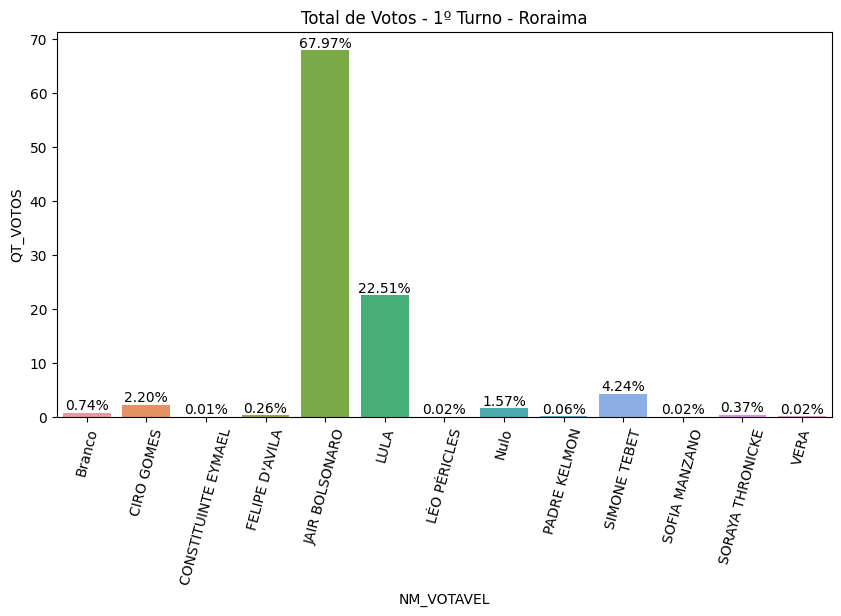

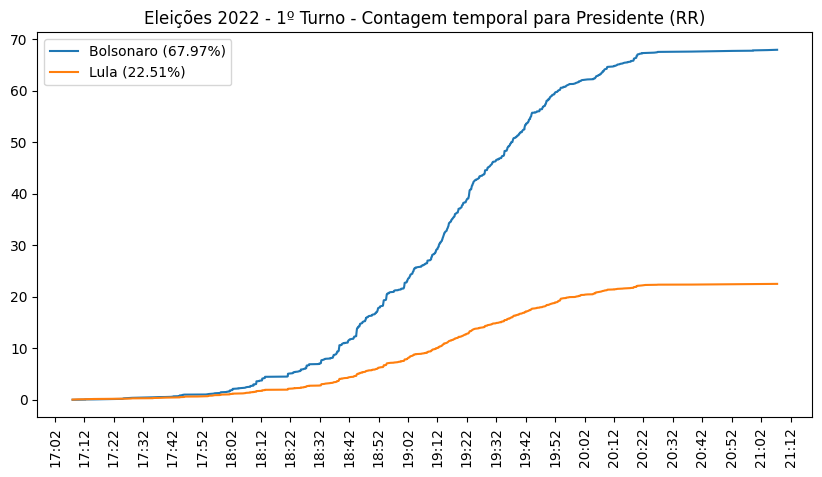

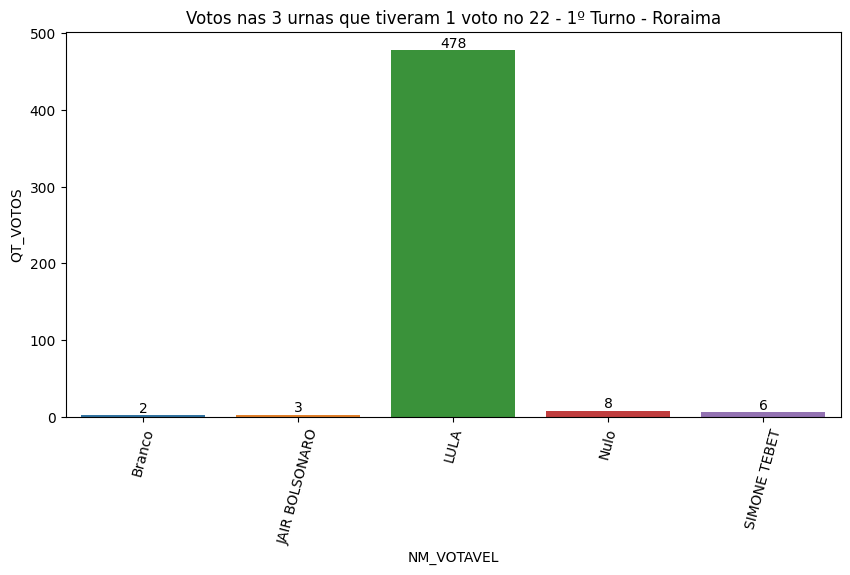

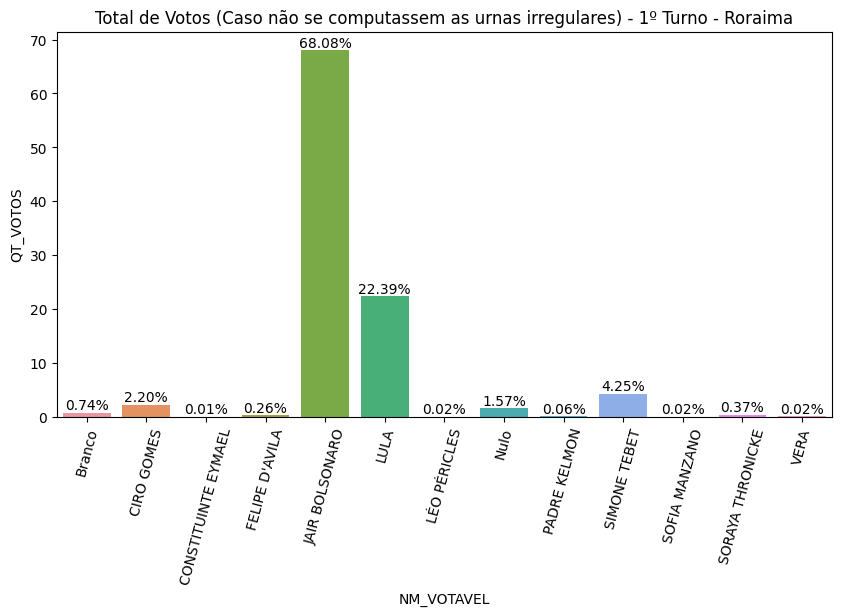

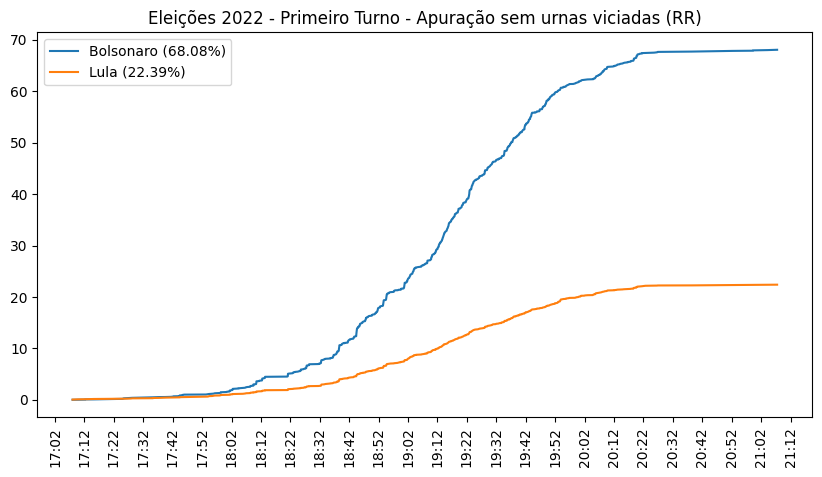

In [ ]:
# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1rr, 'Total de Votos - 1º Turno', 'Roraima')# Total de votos acumulados
gerar_grafico_temporal(df1rr, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'RR')

df1rr_urnas = df1rr[df1rr['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1rr_urnas[df1rr_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1rr_urnas[df1rr_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")

df1rr_urnas_22 = df1rr_urnas[df1rr_urnas['NR_VOTAVEL'] == 22]
print(df1rr_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])

df_soma = df_diff_group(df1rr, df1rr_urnas_22)
gerar_grafico_urnas_suspeitas(df_soma, df1rr_urnas_22, 'Roraima')

df1rr_sub = df1rr[~((df1rr['CD_MUNICIPIO'].isin(df1rr_urnas_22['CD_MUNICIPIO'])) & 
            (df1rr['NR_ZONA'].isin(df1rr_urnas_22['NR_ZONA'])) & 
            (df1rr['NR_SECAO'].isin(df1rr_urnas_22['NR_SECAO'])) & 
            (df1rr['NR_LOCAL_VOTACAO'].isin(df1rr_urnas_22['NR_LOCAL_VOTACAO'])))]
gerar_grafico_porcentagem(df1rr_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Roraima')

# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
gerar_grafico_temporal(df1rr_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'RR')



##### 1.2.1.6 - AMAPÁ


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 1
            NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
187123  LARANJAL DO JARI        7        34              1082


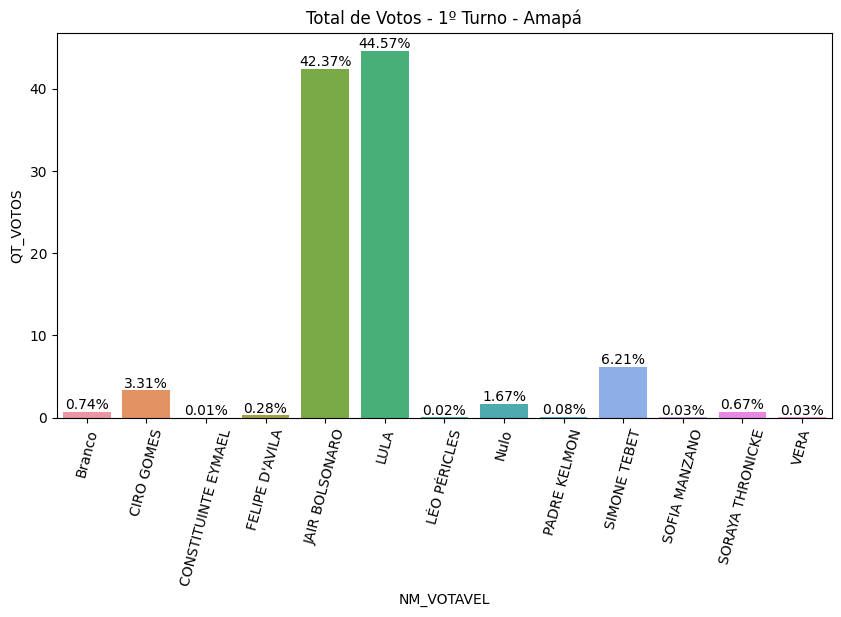

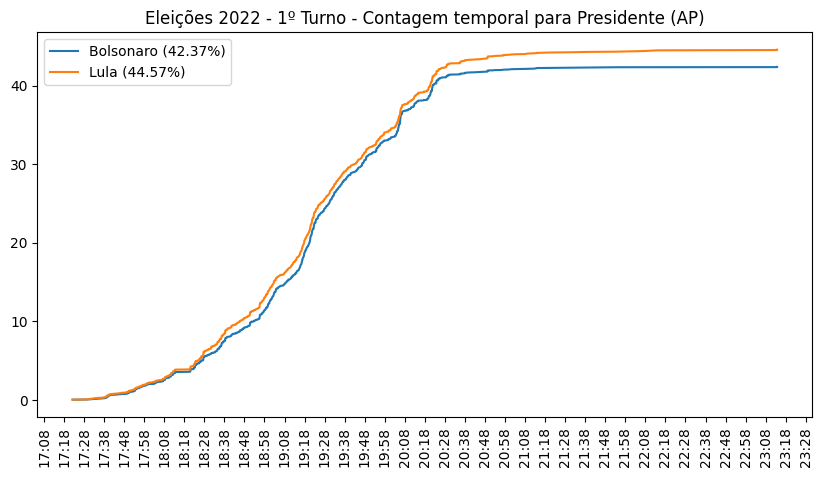

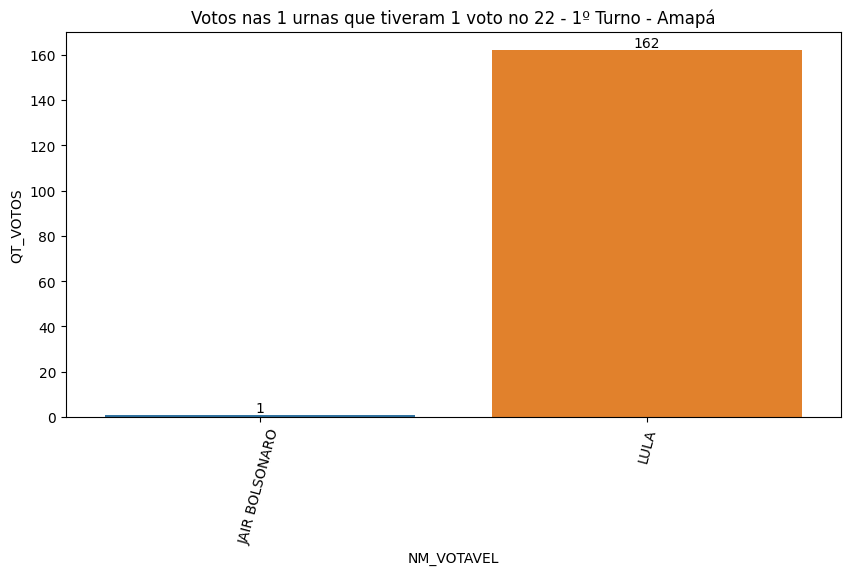

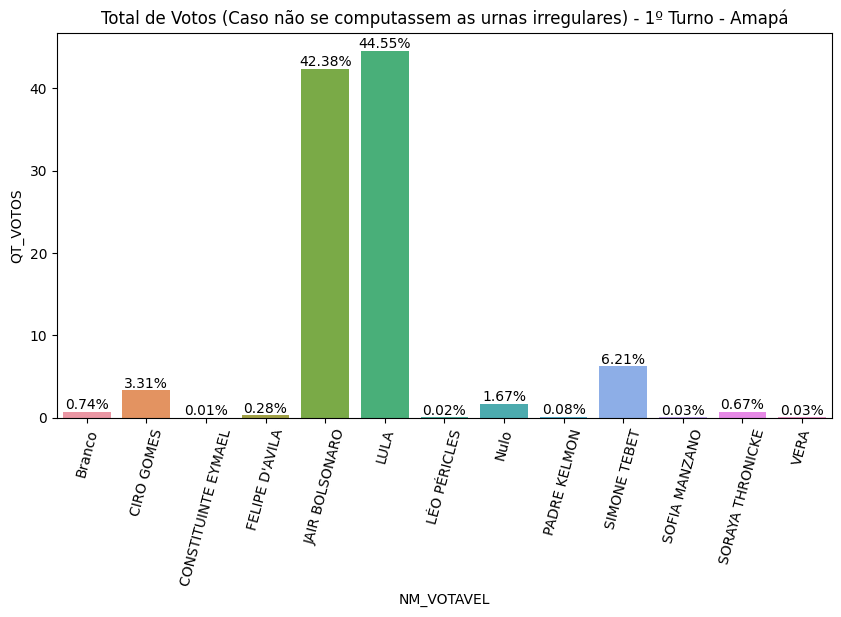

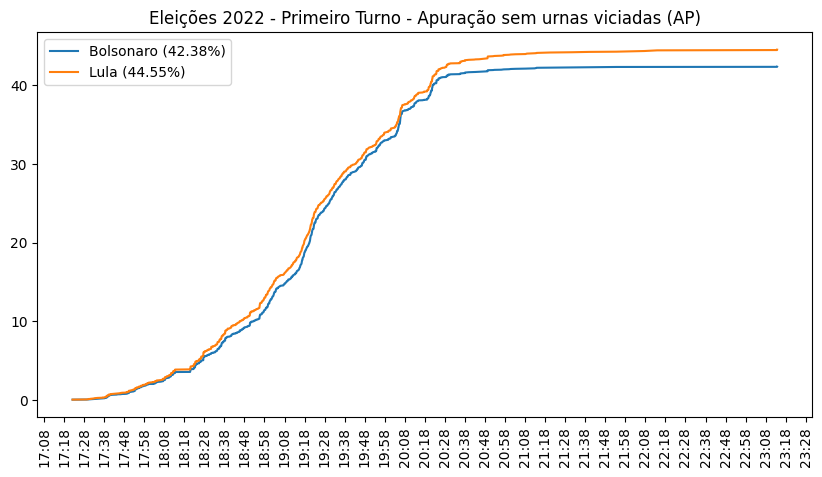

In [ ]:
# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1ap, 'Total de Votos - 1º Turno', 'Amapá')
# Total de votos acumulados
gerar_grafico_temporal(df1ap, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'AP')
df1ap_urnas = df1ap[df1ap['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1ap_urnas[df1ap_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1ap_urnas[df1ap_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1ap_urnas_22 = df1ap_urnas[df1ap_urnas['NR_VOTAVEL'] == 22]
print(df1ap_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df1ap, df1ap_urnas_22)
gerar_grafico_urnas_suspeitas(df_soma, df1ap_urnas_22, 'Amapá')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
df1ap_sub = df1ap[~((df1ap['CD_MUNICIPIO'].isin(df1ap_urnas_22['CD_MUNICIPIO'])) & 
            (df1ap['NR_ZONA'].isin(df1ap_urnas_22['NR_ZONA'])) & 
            (df1ap['NR_SECAO'].isin(df1ap_urnas_22['NR_SECAO'])) & 
            (df1ap['NR_LOCAL_VOTACAO'].isin(df1ap_urnas_22['NR_LOCAL_VOTACAO'])))]
gerar_grafico_porcentagem(df1ap_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Amapá')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
gerar_grafico_temporal(df1ap_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'AP')

##### 1.2.1.7 - TOCANTINS


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 5
                    NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
159531            TOCANTINÓPOLIS        9       133              1252
160200            TOCANTINÓPOLIS        9       146              1252
169953                ARAGUATINS       10       102              1163
183222  MAURILÂNDIA DO TOCANTINS       11       143              1066
214713       FORMOSO DO ARAGUAIA       15        72              1236


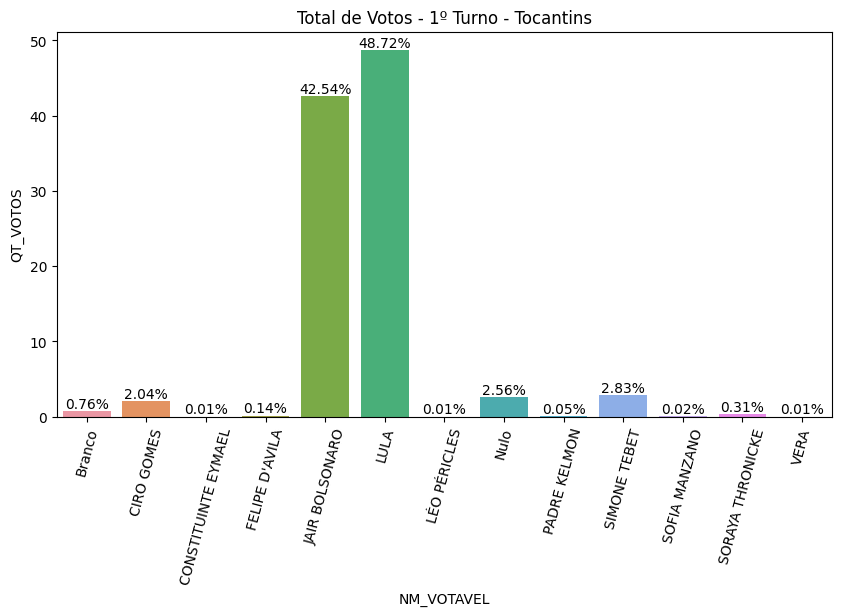

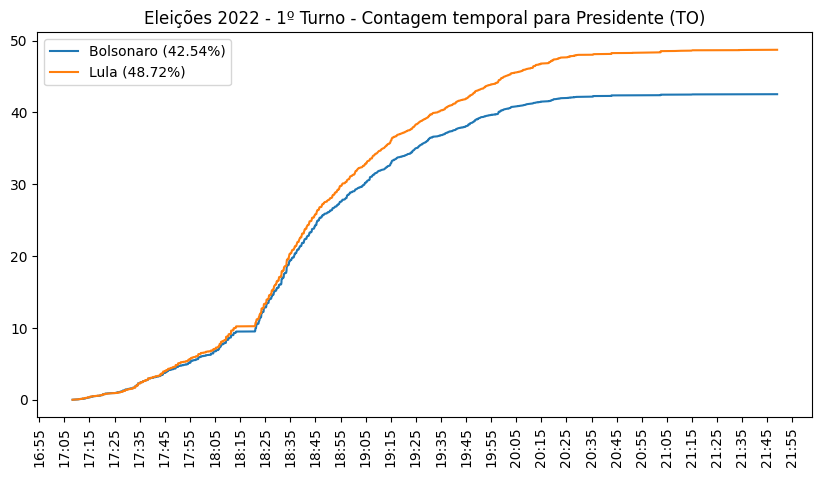

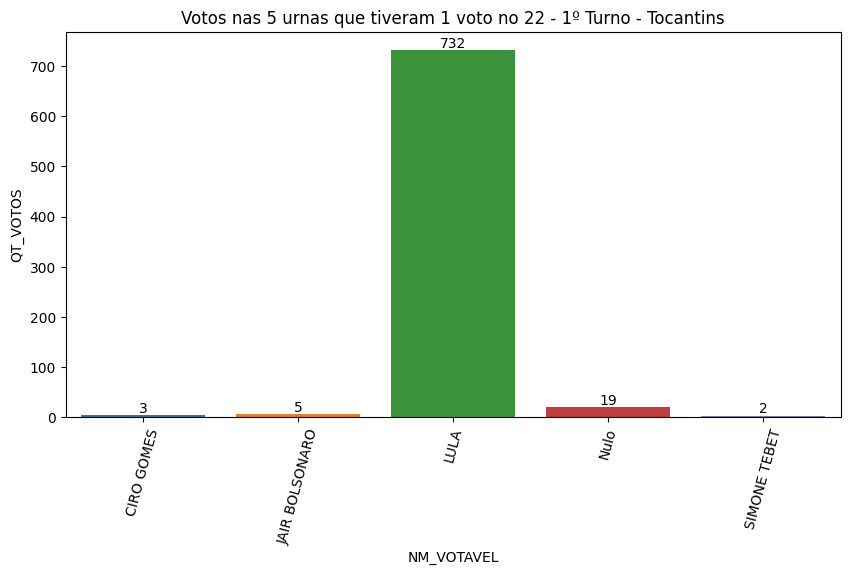

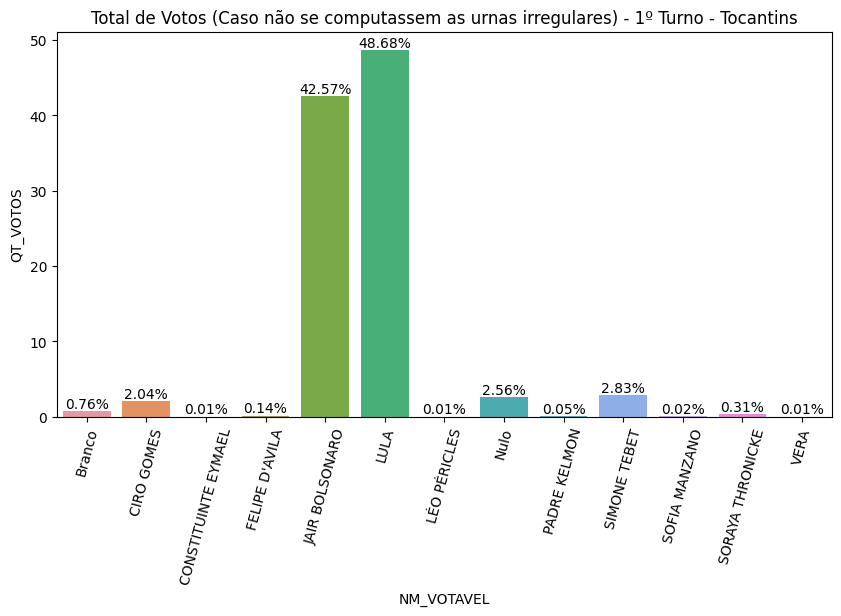

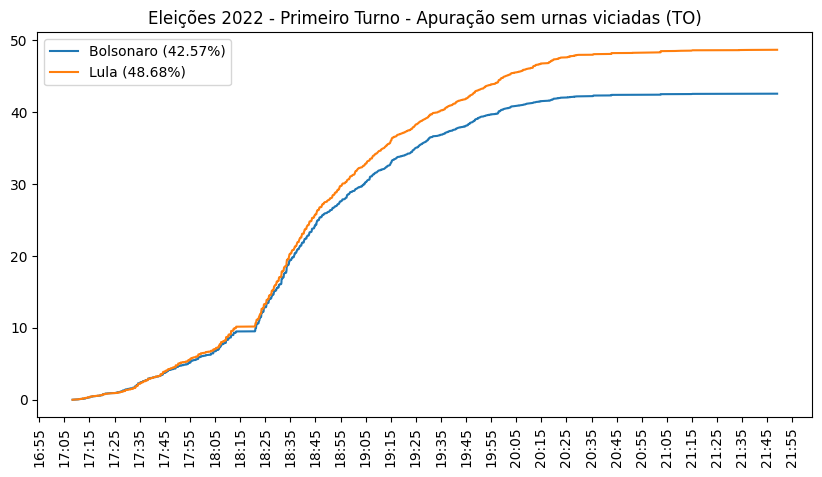

In [ ]:
# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1to, 'Total de Votos - 1º Turno', 'Tocantins')
# Total de votos acumulados
gerar_grafico_temporal(df1to, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'TO')
df1to_urnas = df1to[df1to['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1to_urnas[df1to_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1to_urnas[df1to_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1to_urnas_22 = df1to_urnas[df1to_urnas['NR_VOTAVEL'] == 22]
print(df1to_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df1to, df1to_urnas_22)
gerar_grafico_urnas_suspeitas(df_soma, df1to_urnas_22, 'Tocantins')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
df1to_sub = df1to[~((df1to['CD_MUNICIPIO'].isin(df1to_urnas_22['CD_MUNICIPIO'])) & 
            (df1to['NR_ZONA'].isin(df1to_urnas_22['NR_ZONA'])) & 
            (df1to['NR_SECAO'].isin(df1to_urnas_22['NR_SECAO'])) & 
            (df1to['NR_LOCAL_VOTACAO'].isin(df1to_urnas_22['NR_LOCAL_VOTACAO'])))]
gerar_grafico_porcentagem(df1to_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Tocantins')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
gerar_grafico_temporal(df1to_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'TO')

#### 1.2.2 - Resultados da Região

Urnas com 1 voto no candidato 13: 1
Urnas com 1 voto no candidato 22: 62
                    NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
15883                    HUMAITÁ       17        57              1252
16390   SÃO GABRIEL DA CACHOEIRA       19         1              1090
16452   SÃO GABRIEL DA CACHOEIRA       19        12              1120
16493   SÃO GABRIEL DA CACHOEIRA       19        21              1198
16496   SÃO GABRIEL DA CACHOEIRA       19        22              1198
...                          ...      ...       ...               ...
253977            TOCANTINÓPOLIS        9       133              1252
254022            TOCANTINÓPOLIS        9       146              1252
254736                ARAGUATINS       10       102              1163
255804  MAURILÂNDIA DO TOCANTINS       11       143              1066
257905       FORMOSO DO ARAGUAIA       15        72              1236

[62 rows x 4 columns]


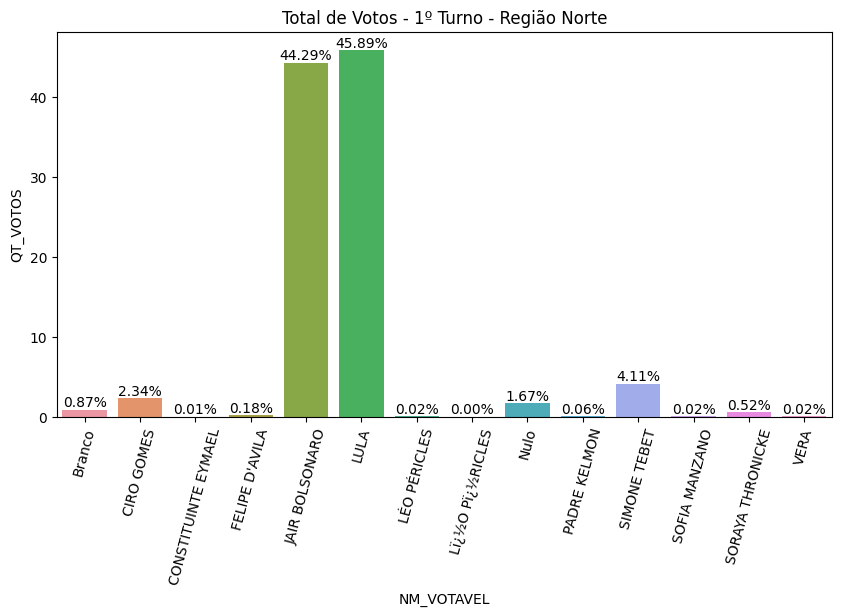

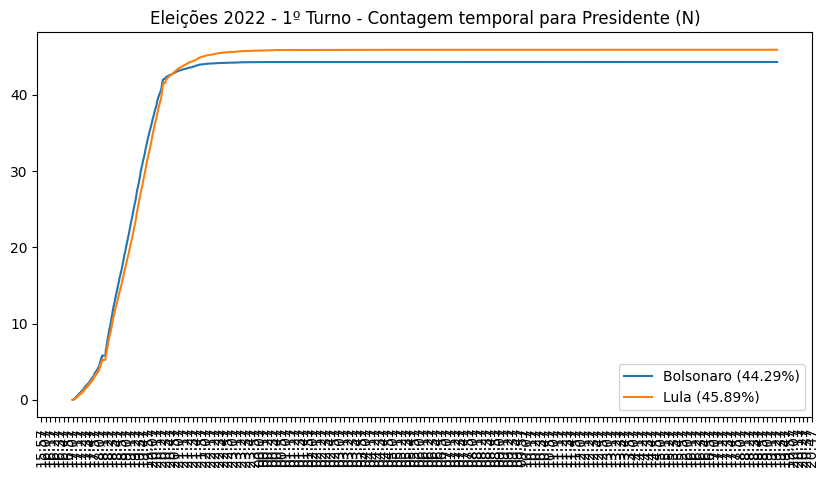

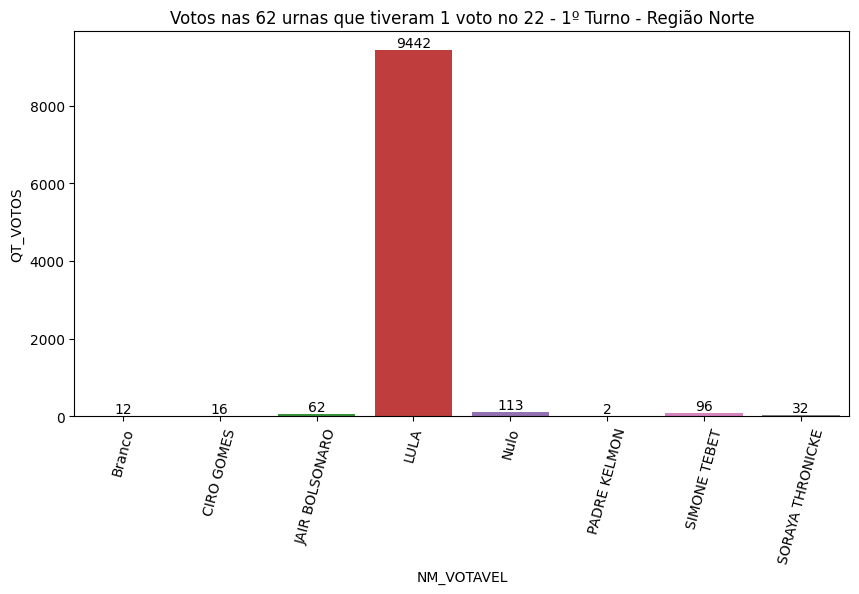

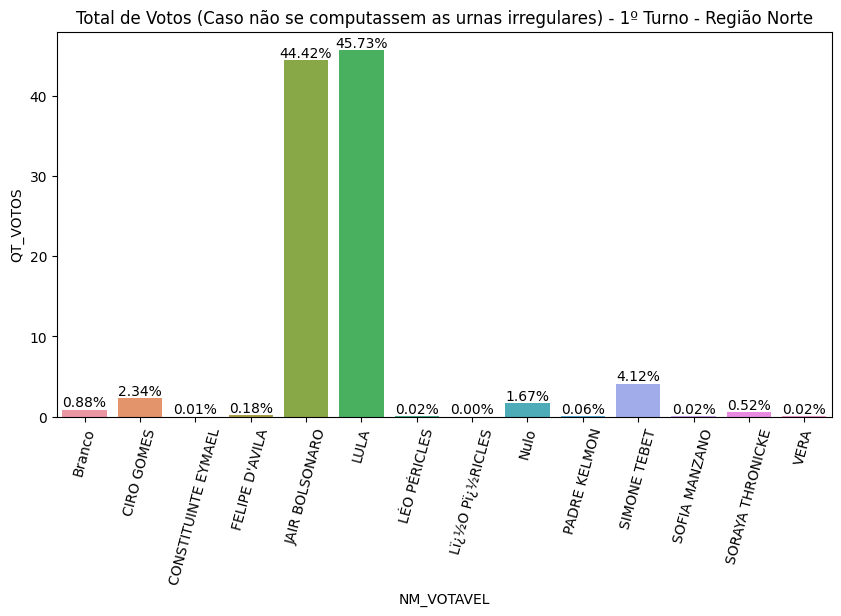

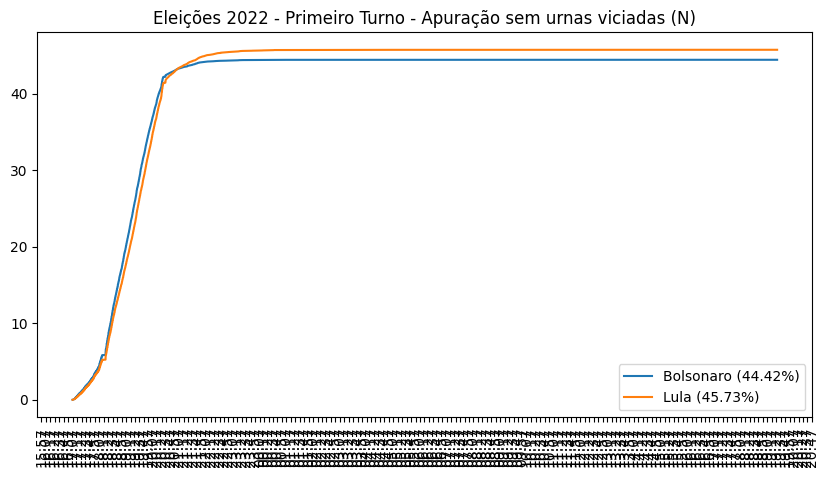

In [ ]:
df1n = pd.concat([df1am, df1pa, df1ac, df1ro, df1rr, df1ap, df1to], ignore_index=True)

# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1n, 'Total de Votos - 1º Turno', 'Região Norte')
# Total de votos acumulados
gerar_grafico_temporal(df1n, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'N')
df1n_urnas = df1n[df1n['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1n_urnas[df1n_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1n_urnas[df1n_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1n_urnas_22 = df1n_urnas[df1n_urnas['NR_VOTAVEL'] == 22]
print(df1n_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df1n, df1n_urnas_22)
gerar_grafico_urnas_suspeitas(df_soma, df1n_urnas_22, 'Região Norte')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
df1n_sub = df1n[~((df1n['CD_MUNICIPIO'].isin(df1n_urnas_22['CD_MUNICIPIO'])) & 
            (df1n['NR_ZONA'].isin(df1n_urnas_22['NR_ZONA'])) & 
            (df1n['NR_SECAO'].isin(df1n_urnas_22['NR_SECAO'])) & 
            (df1n['NR_LOCAL_VOTACAO'].isin(df1n_urnas_22['NR_LOCAL_VOTACAO'])))]
gerar_grafico_porcentagem(df1n_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Região Norte')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
gerar_grafico_temporal(df1n_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'N')

### 1.3 - Região CENTRO-OESTE

#### 1.3.1 - Estados

##### 1.3.1.1 - MATO GROSSO


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 3
           NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
135066  BARRA DO GARÇAS        9       461              1627
175039         ARIPUANÃ       11       155              1163
214442   ALTO BOA VISTA       15       249              1090


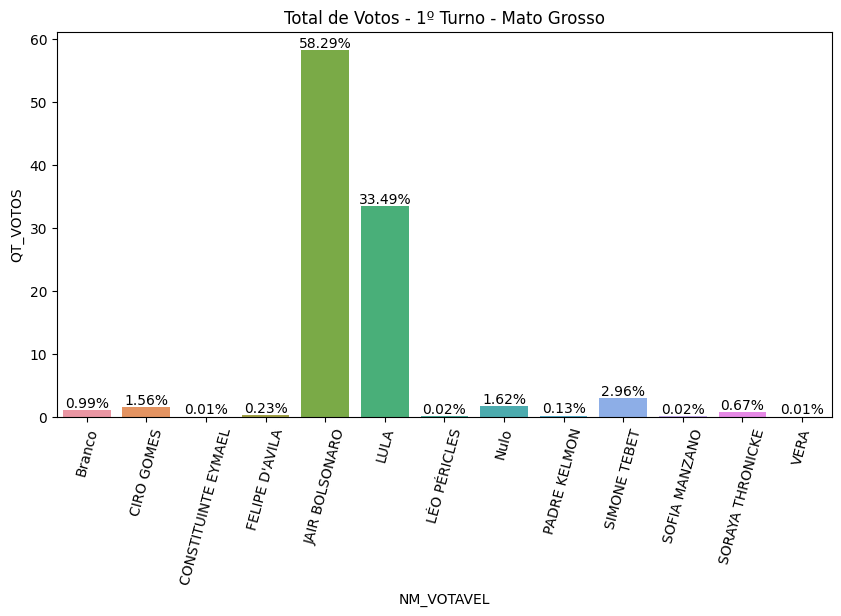

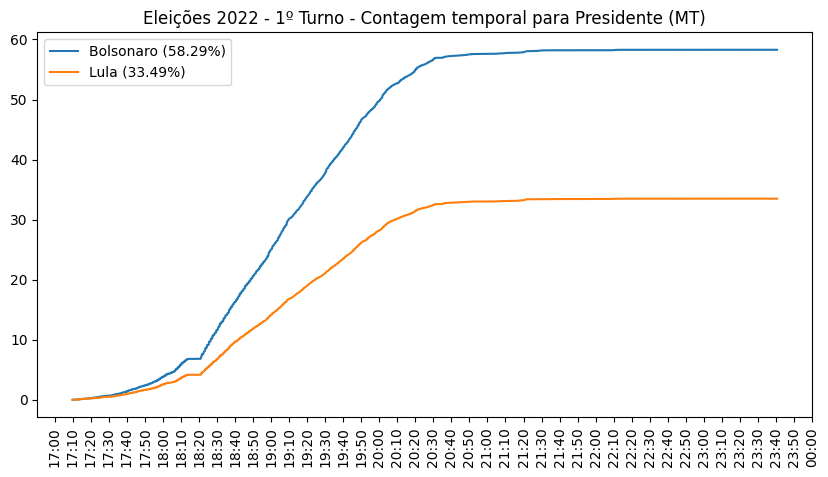

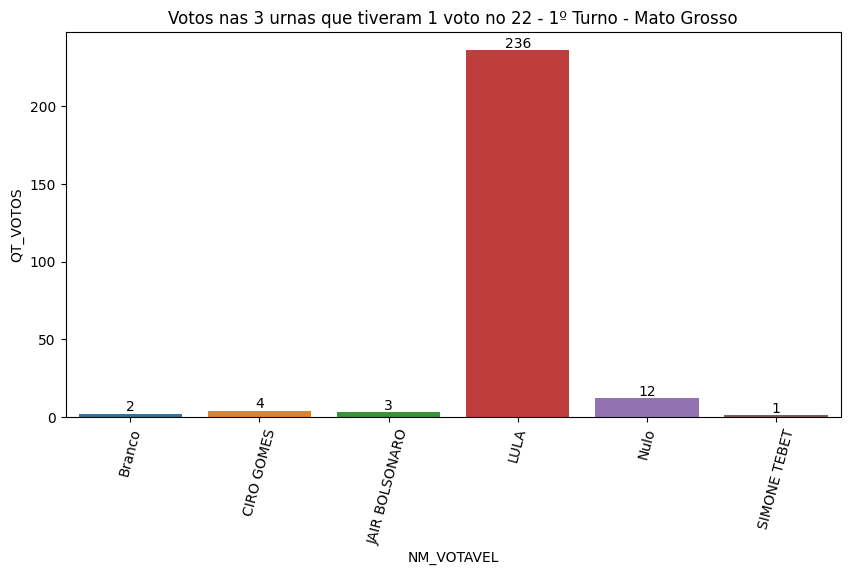

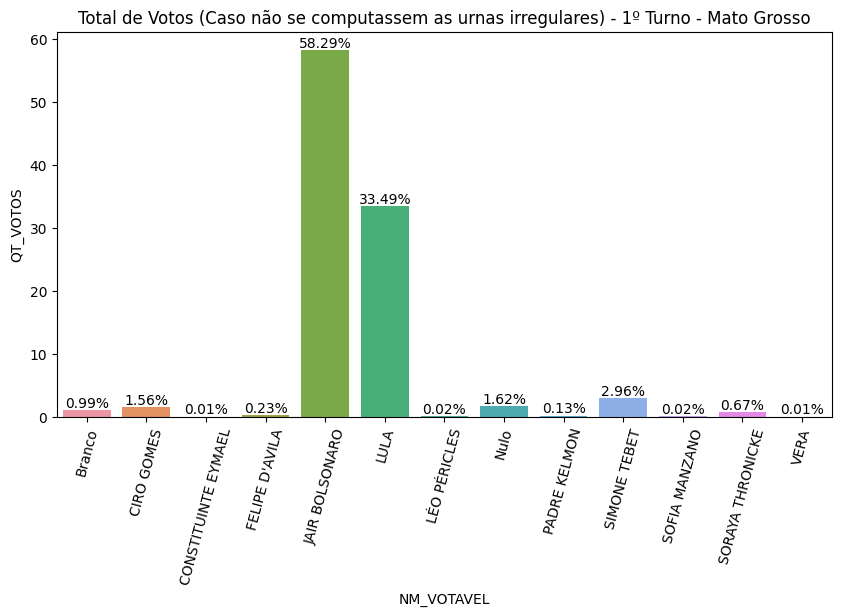

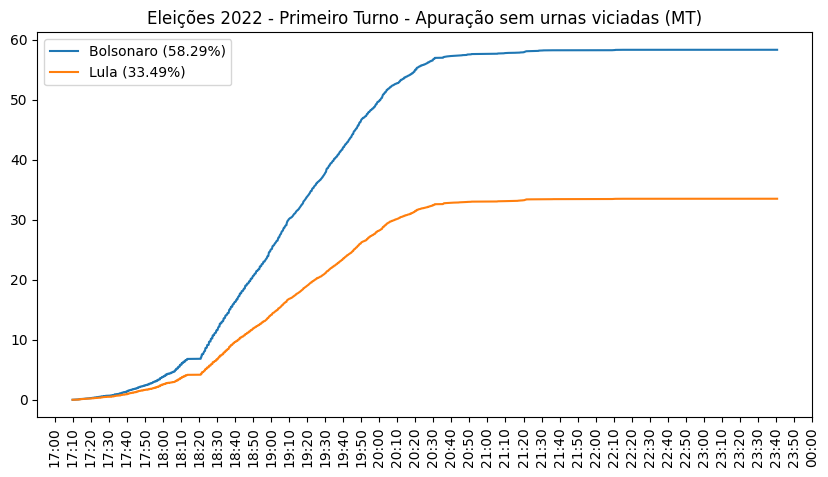

In [ ]:
# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1mt, 'Total de Votos - 1º Turno', 'Mato Grosso')
# Total de votos acumulados
gerar_grafico_temporal(df1mt, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'MT')
df1mt_urnas = df1mt[df1mt['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1mt_urnas[df1mt_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1mt_urnas[df1mt_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1mt_urnas_22 = df1mt_urnas[df1mt_urnas['NR_VOTAVEL'] == 22]
print(df1mt_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df1mt, df1mt_urnas_22)
gerar_grafico_urnas_suspeitas(df_soma, df1mt_urnas_22, 'Mato Grosso')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
df1mt_sub = df1mt[~((df1mt['CD_MUNICIPIO'].isin(df1mt_urnas_22['CD_MUNICIPIO'])) & 
            (df1mt['NR_ZONA'].isin(df1mt_urnas_22['NR_ZONA'])) & 
            (df1mt['NR_SECAO'].isin(df1mt_urnas_22['NR_SECAO'])) & 
            (df1mt['NR_LOCAL_VOTACAO'].isin(df1mt_urnas_22['NR_LOCAL_VOTACAO'])))]
gerar_grafico_porcentagem(df1mt_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Mato Grosso')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
gerar_grafico_temporal(df1mt_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'MT')

##### 1.3.1.2 - MATO GROSSO DO SUL


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 1
       NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
246913      MIRANDA       15       113              1325


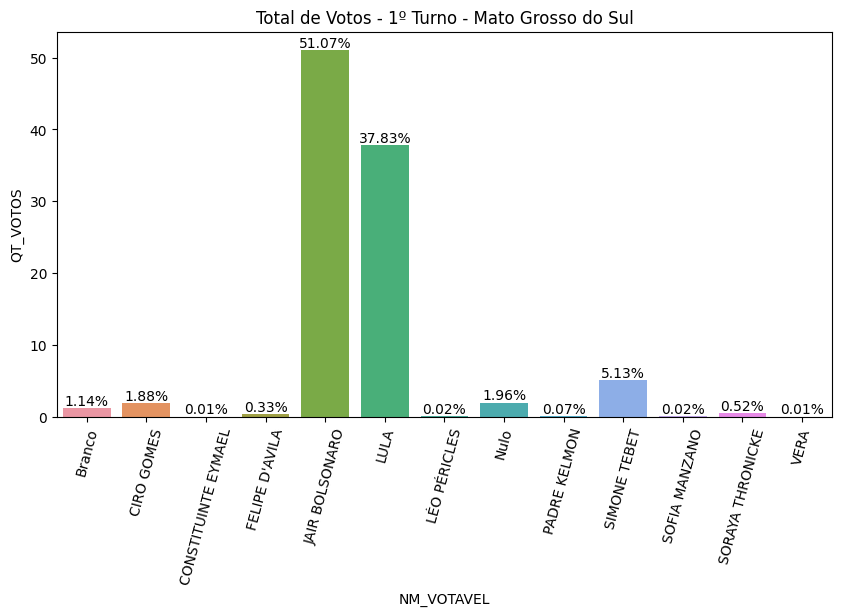

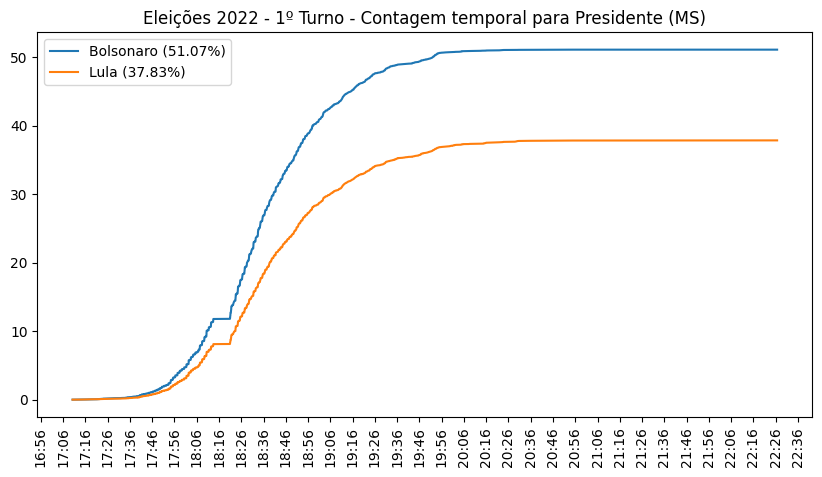

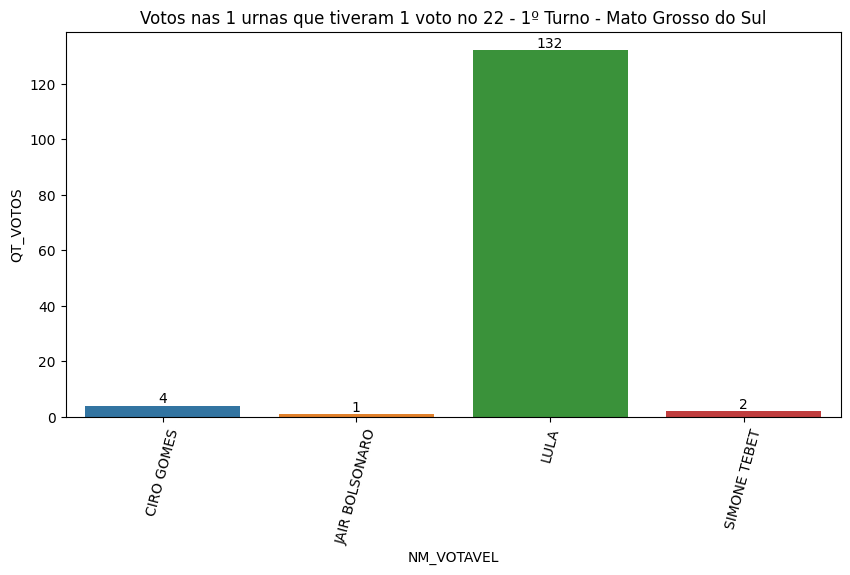

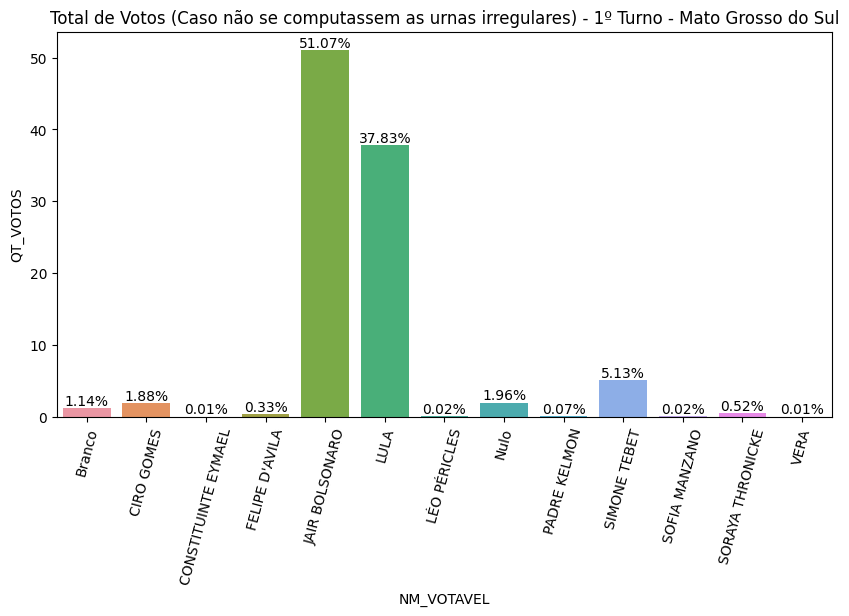

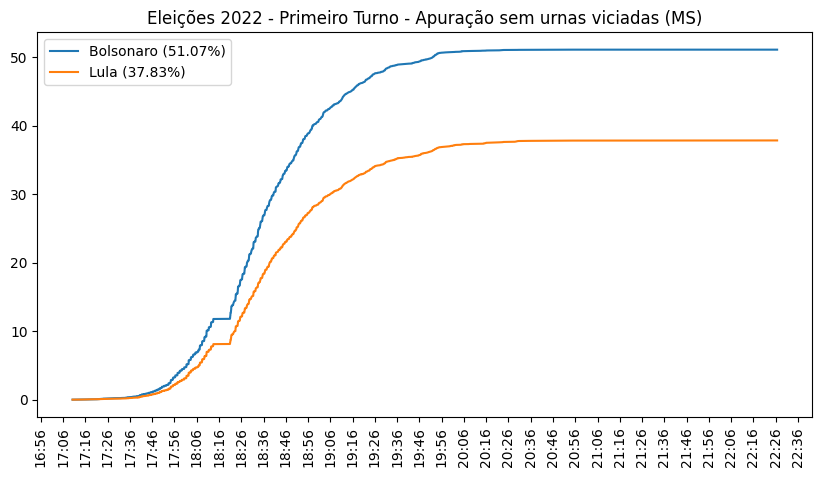

In [ ]:
# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1ms, 'Total de Votos - 1º Turno', 'Mato Grosso do Sul')
# Total de votos acumulados
gerar_grafico_temporal(df1ms, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'MS')
df1ms_urnas = df1ms[df1ms['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1ms_urnas[df1ms_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1ms_urnas[df1ms_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1ms_urnas_22 = df1ms_urnas[df1ms_urnas['NR_VOTAVEL'] == 22]
print(df1ms_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df1ms, df1ms_urnas_22)
gerar_grafico_urnas_suspeitas(df_soma, df1ms_urnas_22, 'Mato Grosso do Sul')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
df1ms_sub = df1ms[~((df1ms['CD_MUNICIPIO'].isin(df1ms_urnas_22['CD_MUNICIPIO'])) & 
            (df1ms['NR_ZONA'].isin(df1ms_urnas_22['NR_ZONA'])) & 
            (df1ms['NR_SECAO'].isin(df1ms_urnas_22['NR_SECAO'])) & 
            (df1ms['NR_LOCAL_VOTACAO'].isin(df1ms_urnas_22['NR_LOCAL_VOTACAO'])))]
gerar_grafico_porcentagem(df1ms_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Mato Grosso do Sul')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
gerar_grafico_temporal(df1ms_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'MS')

##### 1.3.1.3 - GOIAS


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 2
                  NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
1290898             CAVALCANTE       99        48              1171
1330465  MONTE ALEGRE DE GOIÁS      105        57              1147


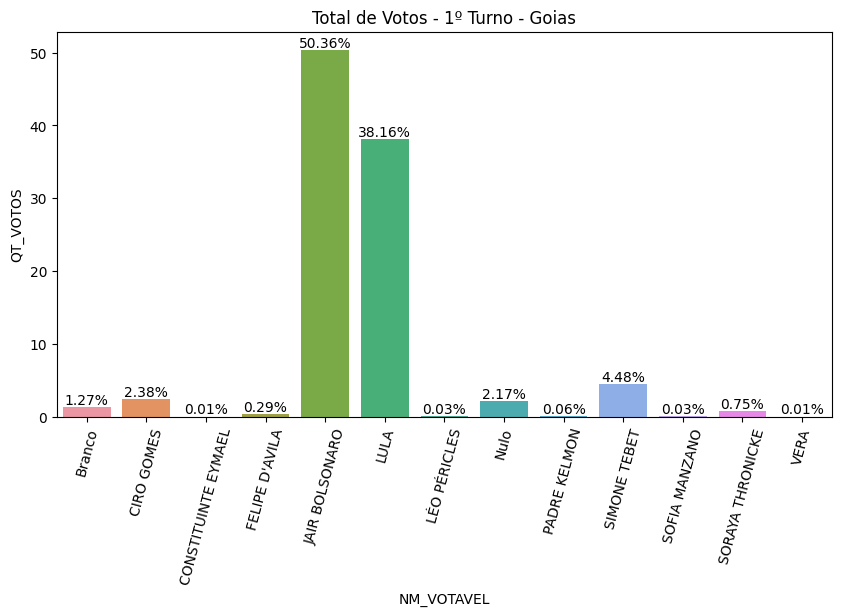

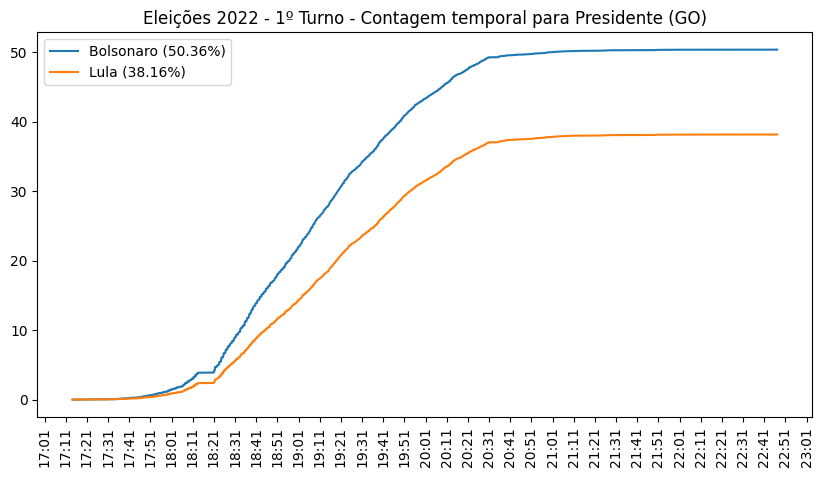

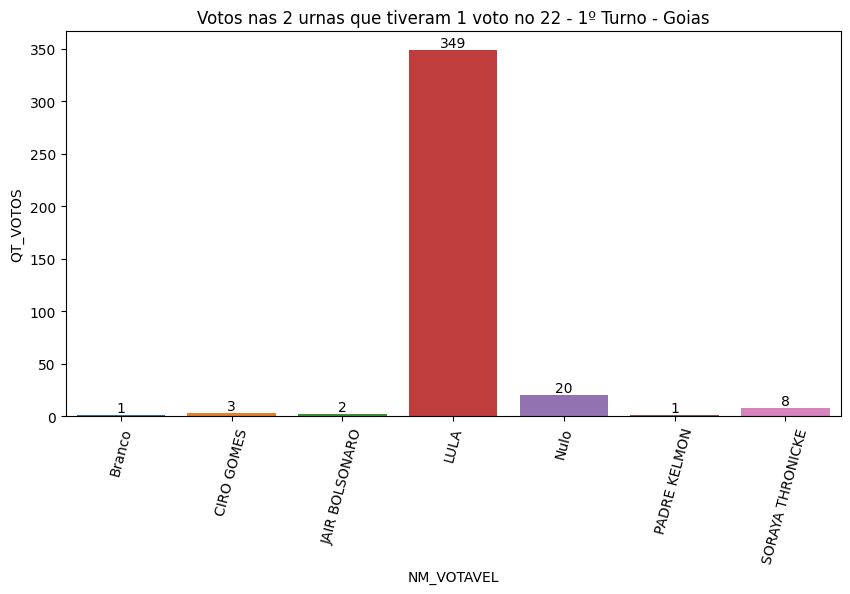

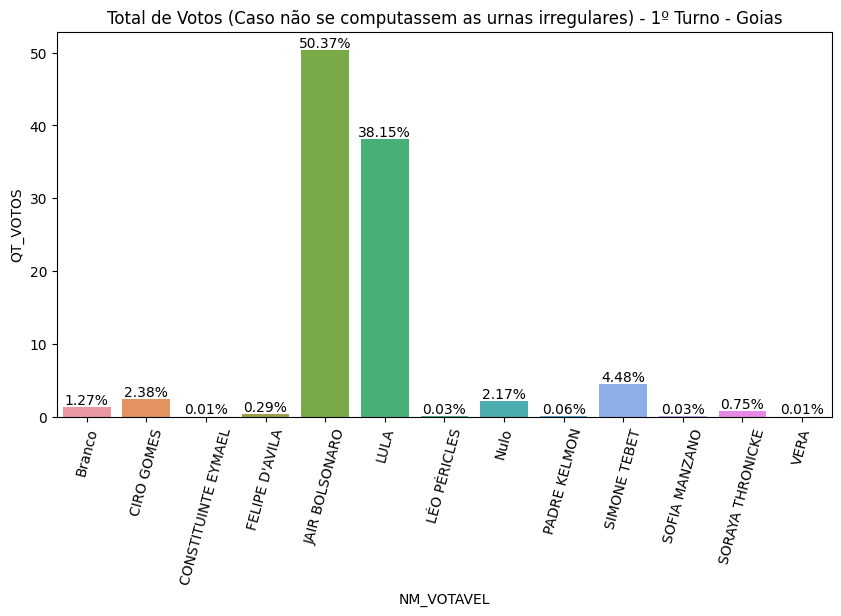

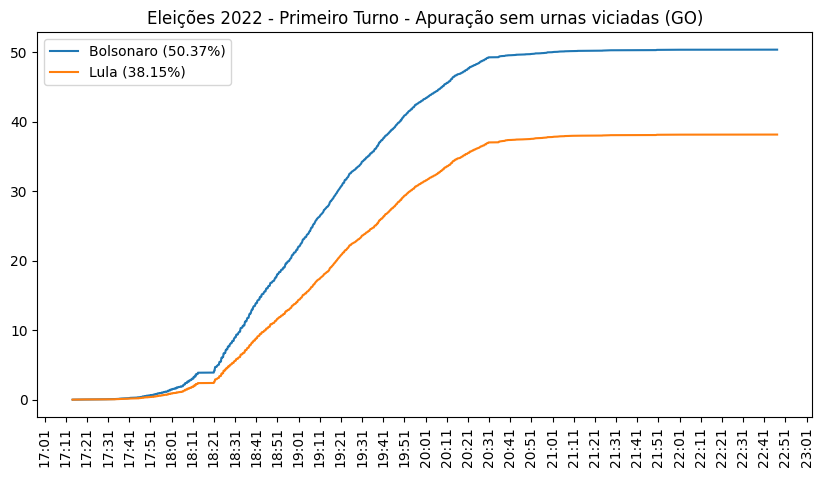

In [ ]:
# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1go, 'Total de Votos - 1º Turno', 'Goias')
# Total de votos acumulados
gerar_grafico_temporal(df1go, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'GO')
df1go_urnas = df1go[df1go['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1go_urnas[df1go_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1go_urnas[df1go_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1go_urnas_22 = df1go_urnas[df1go_urnas['NR_VOTAVEL'] == 22]
print(df1go_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df1go, df1go_urnas_22)
gerar_grafico_urnas_suspeitas(df_soma, df1go_urnas_22, 'Goias')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
df1go_sub = df1go[~((df1go['CD_MUNICIPIO'].isin(df1go_urnas_22['CD_MUNICIPIO'])) & 
            (df1go['NR_ZONA'].isin(df1go_urnas_22['NR_ZONA'])) & 
            (df1go['NR_SECAO'].isin(df1go_urnas_22['NR_SECAO'])) & 
            (df1go['NR_LOCAL_VOTACAO'].isin(df1go_urnas_22['NR_LOCAL_VOTACAO'])))]
gerar_grafico_porcentagem(df1go_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Goias')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
gerar_grafico_temporal(df1go_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'GO')

#### 1.3.2 - Resultados da Região


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 6
                  NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
135066         BARRA DO GARÇAS        9       461              1627
175039                ARIPUANÃ       11       155              1163
214442          ALTO BOA VISTA       15       249              1090
246913                 MIRANDA       15       113              1325
1290898             CAVALCANTE       99        48              1171
1330465  MONTE ALEGRE DE GOIÁS      105        57              1147


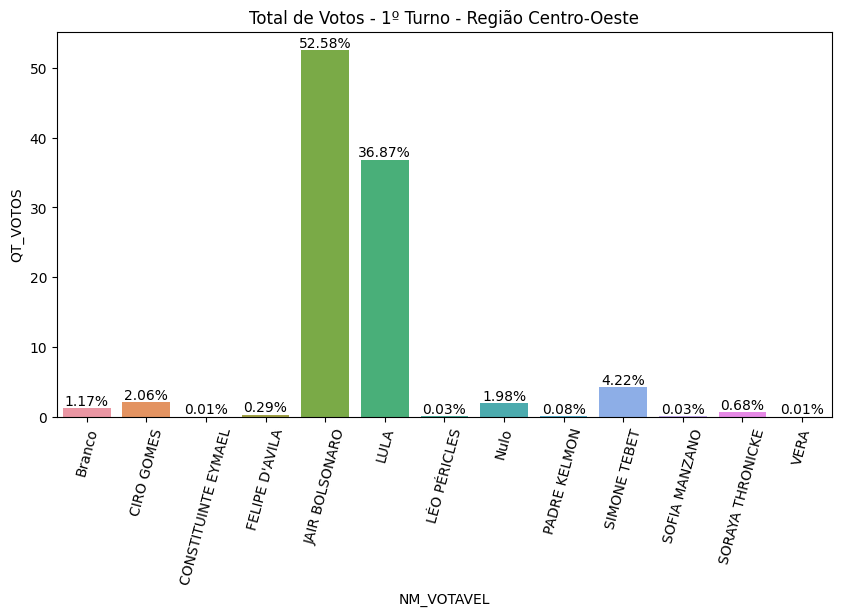

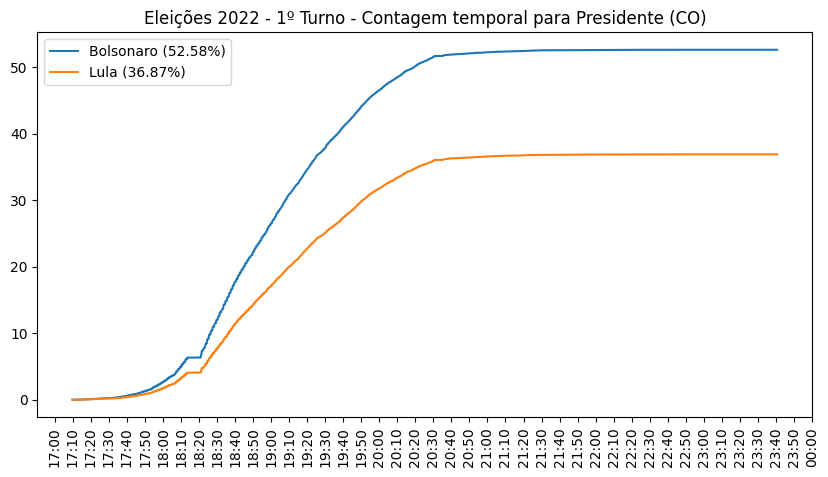

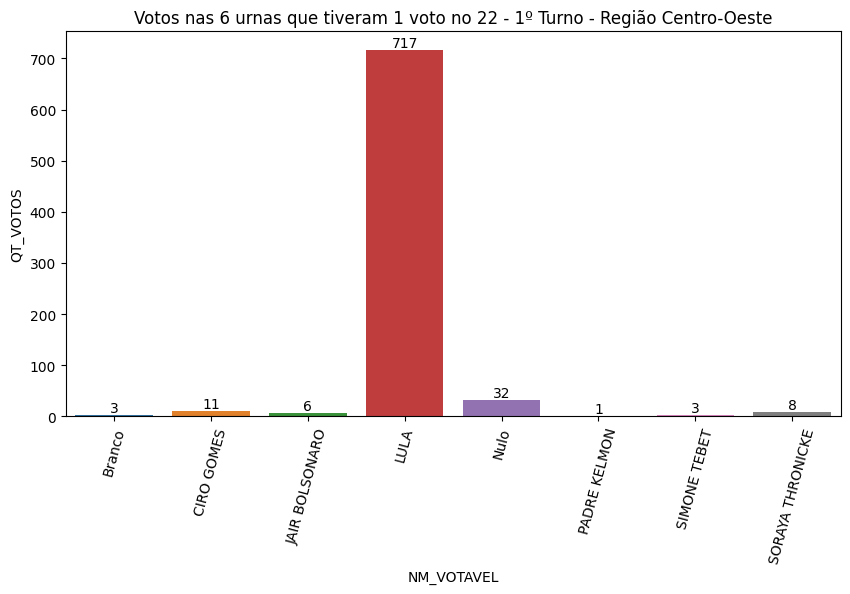

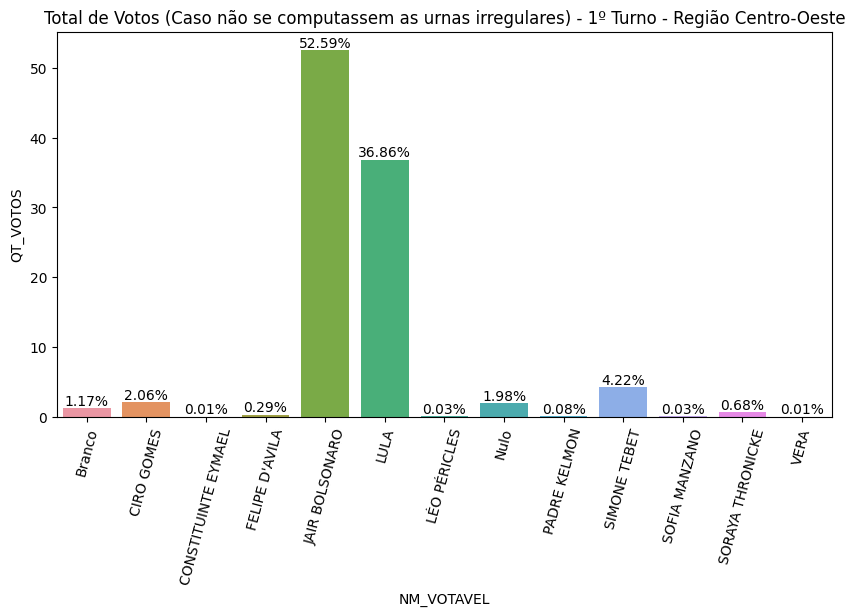

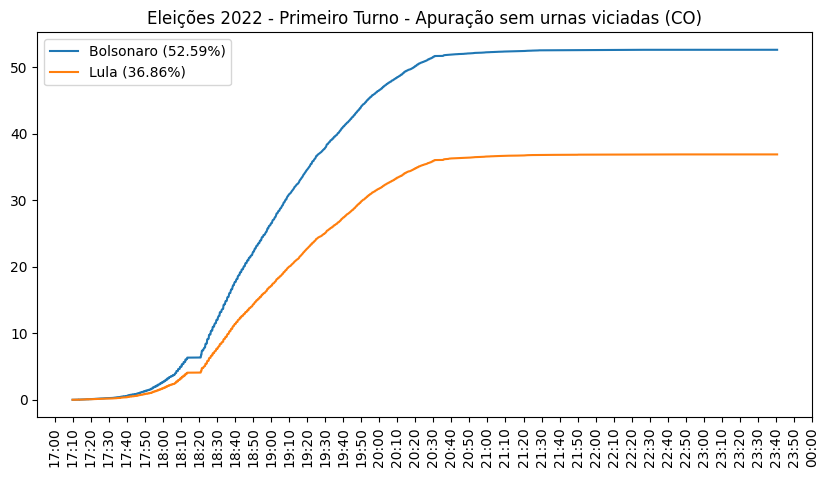

In [ ]:
df1co = pd.concat([df1mt, df1ms, df1go])

# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1co, 'Total de Votos - 1º Turno', 'Região Centro-Oeste')
# Total de votos acumulados
gerar_grafico_temporal(df1co, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'CO')
df1co_urnas = df1co[df1co['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1co_urnas[df1co_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1co_urnas[df1co_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1co_urnas_22 = df1co_urnas[df1co_urnas['NR_VOTAVEL'] == 22]
print(df1co_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df1co, df1co_urnas_22)
gerar_grafico_urnas_suspeitas(df_soma, df1co_urnas_22, 'Região Centro-Oeste')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
df1co_sub = df1co[~((df1co['CD_MUNICIPIO'].isin(df1co_urnas_22['CD_MUNICIPIO'])) & 
            (df1co['NR_ZONA'].isin(df1co_urnas_22['NR_ZONA'])) & 
            (df1co['NR_SECAO'].isin(df1co_urnas_22['NR_SECAO'])) & 
            (df1co['NR_LOCAL_VOTACAO'].isin(df1co_urnas_22['NR_LOCAL_VOTACAO'])))]
gerar_grafico_porcentagem(df1co_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Região Centro-Oeste')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
gerar_grafico_temporal(df1co_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'CO')

### 1.4 - Região SUDESTE

#### 1.4.1 - Estados

##### 1.4.1.1 - SÃO PAULO


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 4
         NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
663977      ANDRADINA        9       206              1201
8581498     SÃO PAULO      254       480              1600
8581525     SÃO PAULO      254       481              1597
15094489    SÃO PAULO      374       746              2046


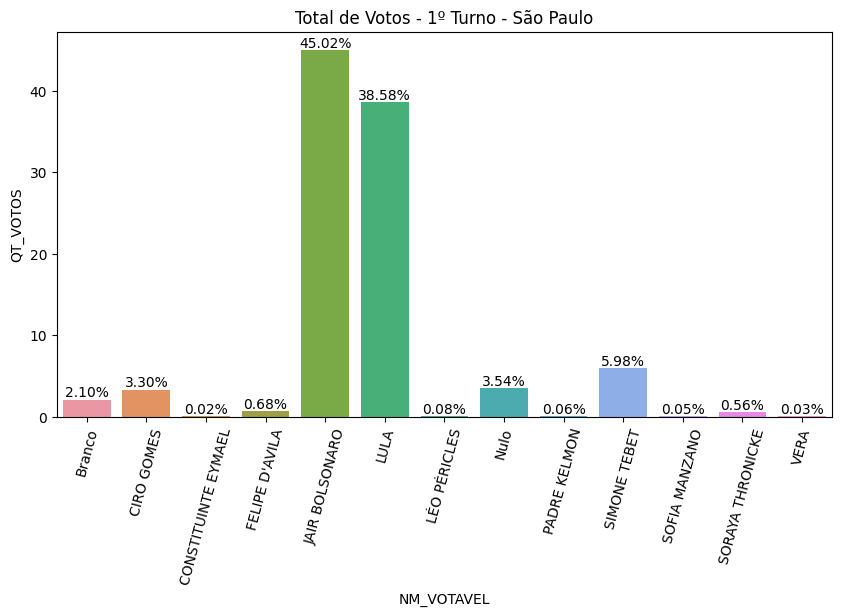

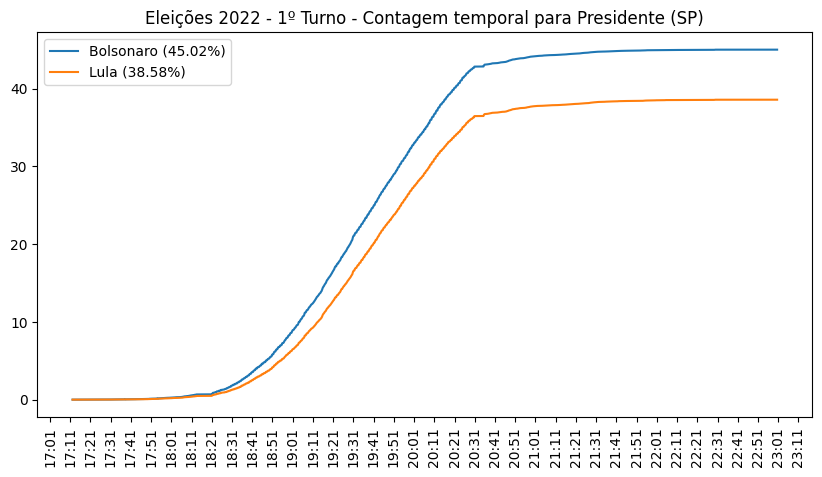

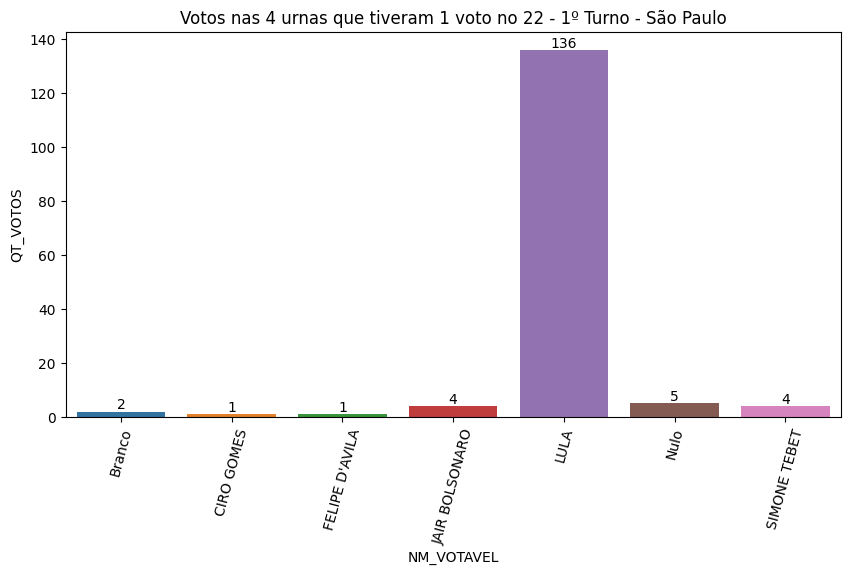

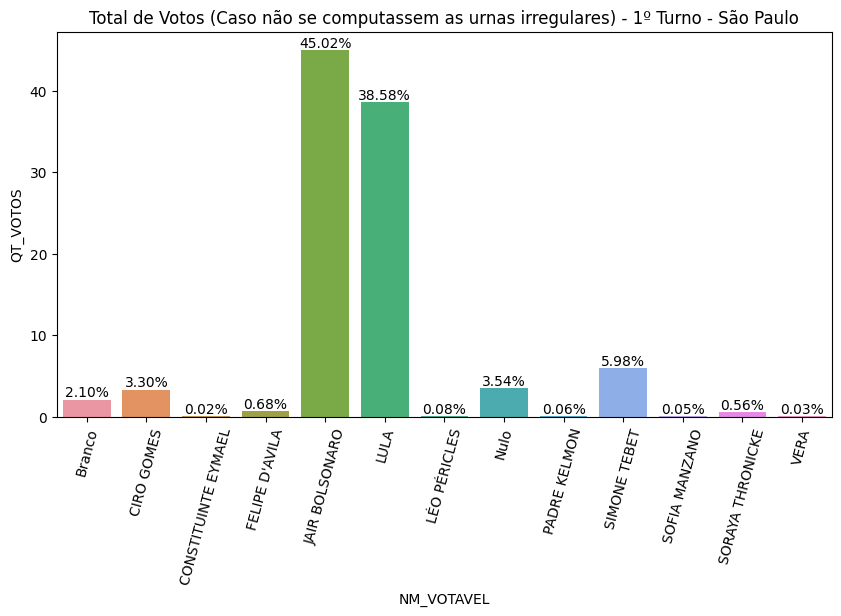

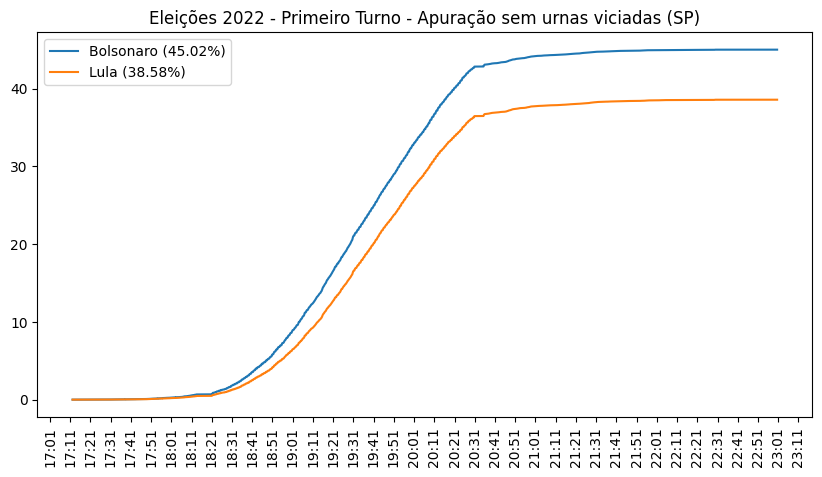

In [ ]:
# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1sp, 'Total de Votos - 1º Turno', 'São Paulo')
# Total de votos acumulados
gerar_grafico_temporal(df1sp, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'SP')
df1sp_urnas = df1sp[df1sp['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1sp_urnas[df1sp_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1sp_urnas[df1sp_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1sp_urnas_22 = df1sp_urnas[df1sp_urnas['NR_VOTAVEL'] == 22]
print(df1sp_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df1sp, df1sp_urnas_22)
gerar_grafico_urnas_suspeitas(df_soma, df1sp_urnas_22, 'São Paulo')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
df1sp_sub = df1sp[~((df1sp['CD_MUNICIPIO'].isin(df1sp_urnas_22['CD_MUNICIPIO'])) & 
            (df1sp['NR_ZONA'].isin(df1sp_urnas_22['NR_ZONA'])) & 
            (df1sp['NR_SECAO'].isin(df1sp_urnas_22['NR_SECAO'])) & 
            (df1sp['NR_LOCAL_VOTACAO'].isin(df1sp_urnas_22['NR_LOCAL_VOTACAO'])))]
gerar_grafico_porcentagem(df1sp_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'São Paulo')
# Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
gerar_grafico_temporal(df1sp_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'SP')

##### 1.4.1.2 - RIO DE JANEIRO


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 0
Empty DataFrame
Columns: [NM_MUNICIPIO, NR_ZONA, NR_SECAO, NR_LOCAL_VOTACAO]
Index: []


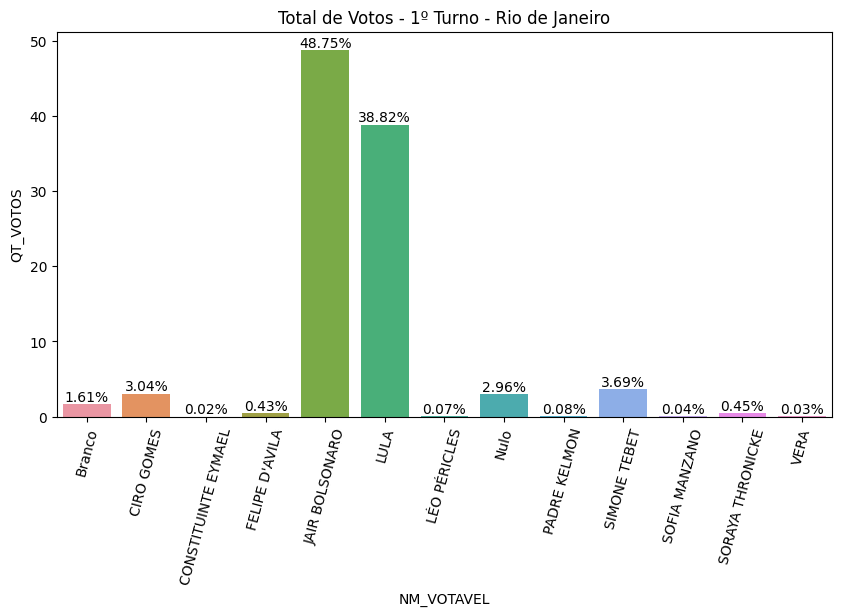

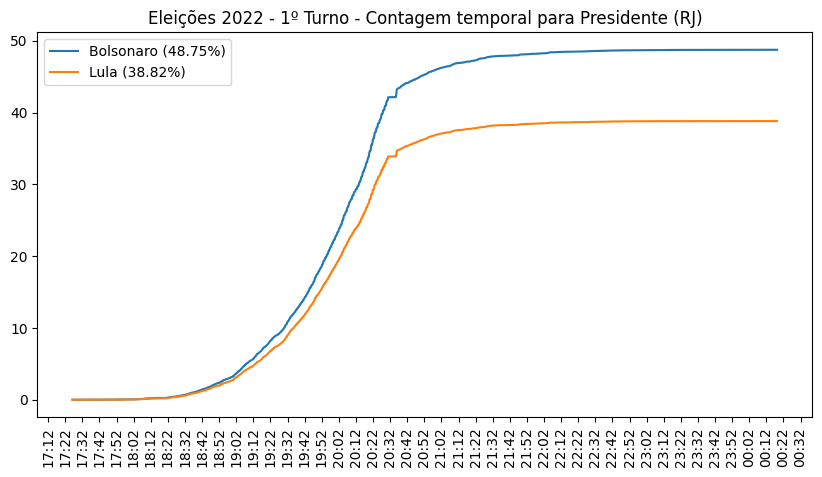

In [ ]:
# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1rj, 'Total de Votos - 1º Turno', 'Rio de Janeiro')
# Total de votos acumulados
gerar_grafico_temporal(df1rj, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'RJ')
df1rj_urnas = df1rj[df1rj['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1rj_urnas[df1rj_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1rj_urnas[df1rj_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1rj_urnas_22 = df1rj_urnas[df1rj_urnas['NR_VOTAVEL'] == 22]
print(df1rj_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df1rj, df1rj_urnas_22)
if df_soma is not None:
    gerar_grafico_urnas_suspeitas(df_soma, df1rj_urnas_22, 'Rio de Janeiro')
    # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
    df1rj_sub = df1rj[~((df1rj['CD_MUNICIPIO'].isin(df1rj_urnas_22['CD_MUNICIPIO'])) & 
                (df1rj['NR_ZONA'].isin(df1rj_urnas_22['NR_ZONA'])) & 
                (df1rj['NR_SECAO'].isin(df1rj_urnas_22['NR_SECAO'])) & 
                (df1rj['NR_LOCAL_VOTACAO'].isin(df1rj_urnas_22['NR_LOCAL_VOTACAO'])))]
    gerar_grafico_porcentagem(df1rj_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Rio de Janeiro')
    # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
    gerar_grafico_temporal(df1rj_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'RJ')

##### 1.4.1.3 - ESPÍRITO SANTO


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 0
Empty DataFrame
Columns: [NM_MUNICIPIO, NR_ZONA, NR_SECAO, NR_LOCAL_VOTACAO]
Index: []


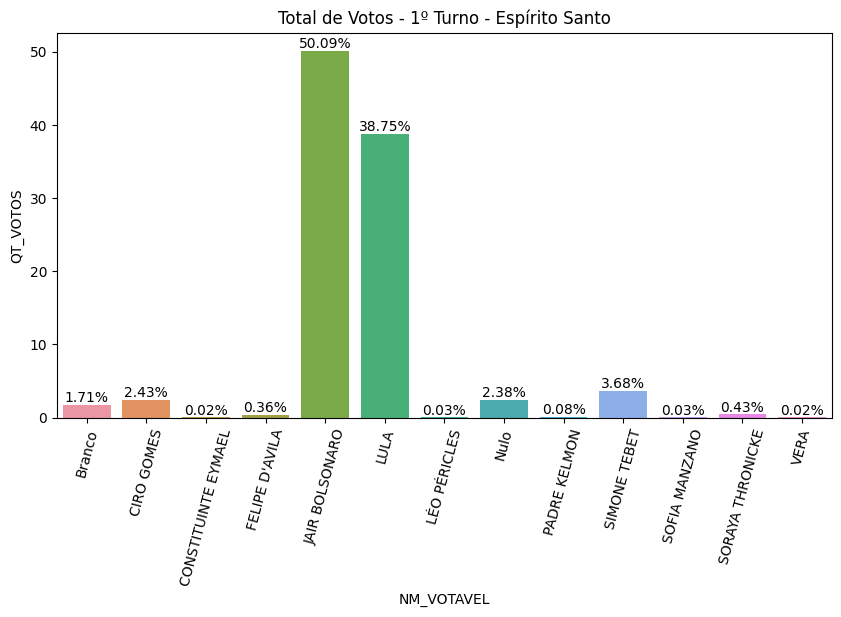

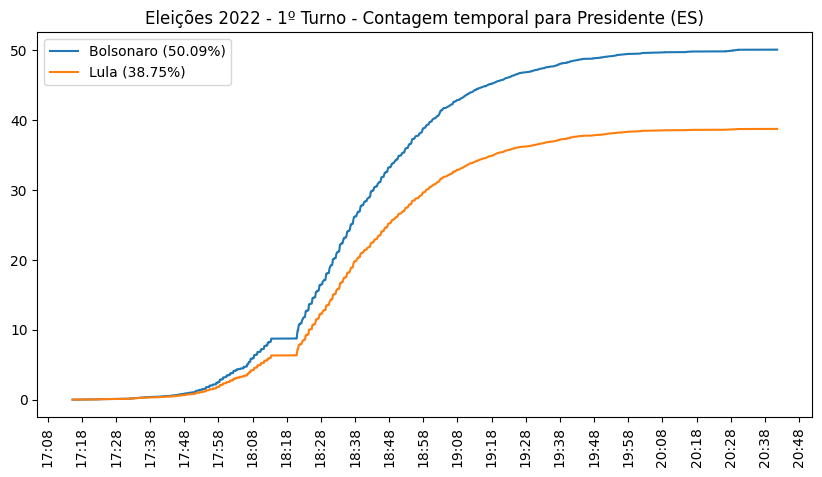

In [ ]:
# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1es, 'Total de Votos - 1º Turno', 'Espírito Santo')
# Total de votos acumulados
gerar_grafico_temporal(df1es, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'ES')
df1es_urnas = df1es[df1es['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1es_urnas[df1es_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1es_urnas[df1es_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1es_urnas_22 = df1es_urnas[df1es_urnas['NR_VOTAVEL'] == 22]
print(df1es_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df1es, df1es_urnas_22)
if df_soma is not None:     
      gerar_grafico_urnas_suspeitas(df_soma, df1es_urnas_22, 'Espírito Santo')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
      df1es_sub = df1es[~((df1es['CD_MUNICIPIO'].isin(df1es_urnas_22['CD_MUNICIPIO'])) & 
                 (df1es['NR_ZONA'].isin(df1es_urnas_22['NR_ZONA'])) & 
                 (df1es['NR_SECAO'].isin(df1es_urnas_22['NR_SECAO'])) & 
                 (df1es['NR_LOCAL_VOTACAO'].isin(df1es_urnas_22['NR_LOCAL_VOTACAO'])))]
      gerar_grafico_porcentagem(df1es_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Espírito Santo')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
      gerar_grafico_temporal(df1es_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'ES')

##### 1.4.1.4 - MINAS GERAIS


Urnas com 1 voto no candidato 13: 1
Urnas com 1 voto no candidato 22: 24
                  NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
47778    SANTA HELENA DE MINAS        4       148              1066
48069               BERTÓPOLIS        4       152              1090
1336096      BRASÍLIA DE MINAS       50       219              1694
1336214             LUISLÂNDIA       50       224              1139
2700849             ITAMBACURI      136        88              1180
2863297         CÔNEGO MARINHO      148       190              1201
2868382               JANUÁRIA      148       276              2259
2868851               JANUÁRIA      148       283              2283
2871409               JANUÁRIA      148       319              2356
2872500               JANUÁRIA      148       333              2380
2873057        BONITO DE MINAS      148       340              1317
3203207   SÃO JOÃO DAS MISSÕES      166       268              1279
3203696   SÃO JOÃO DAS MISSÕES      166    

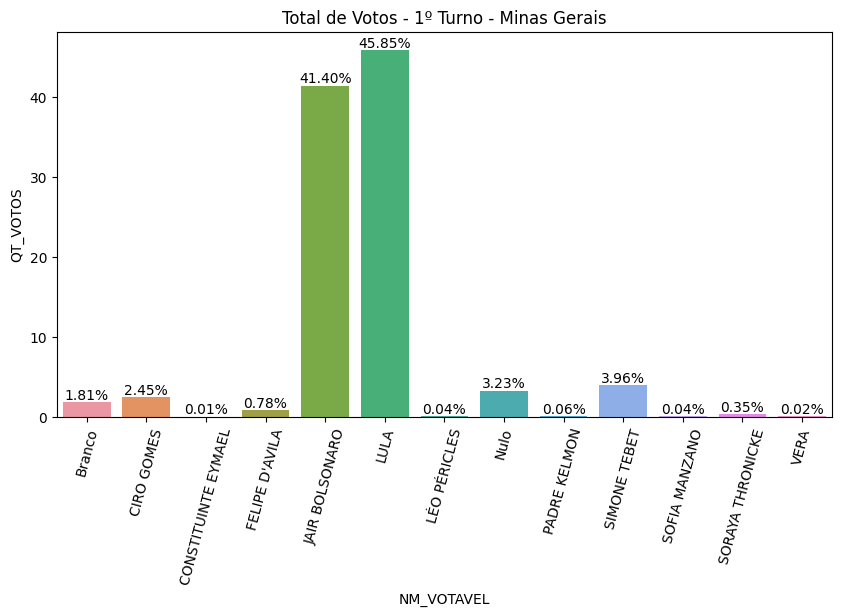

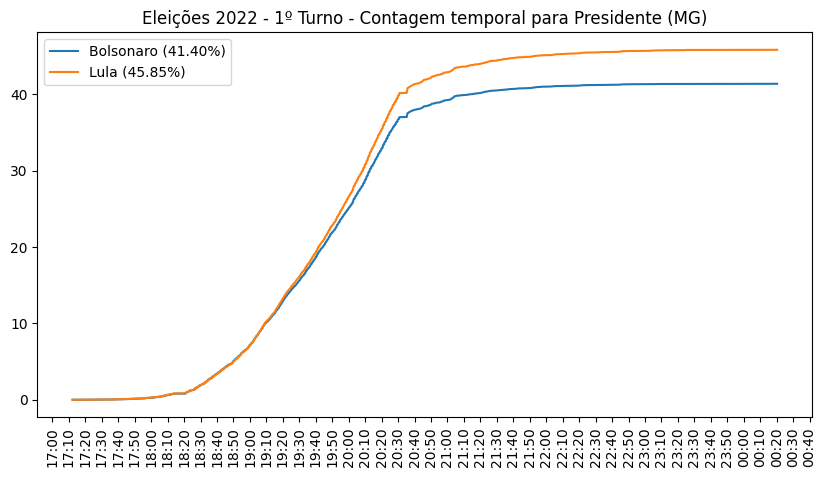

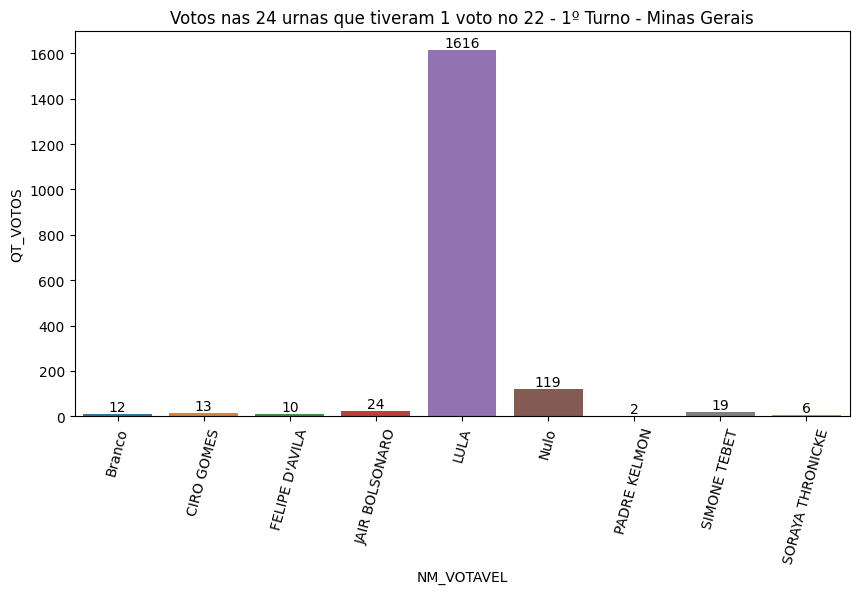

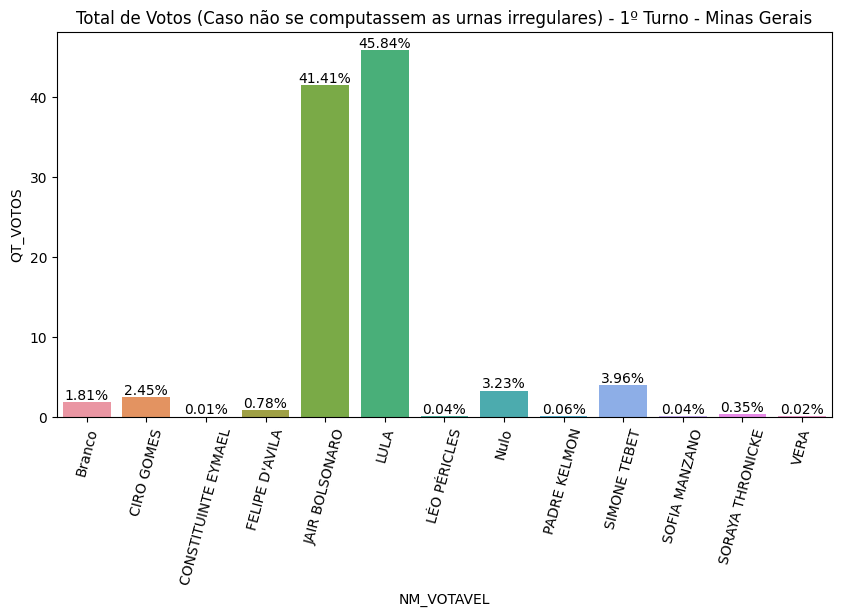

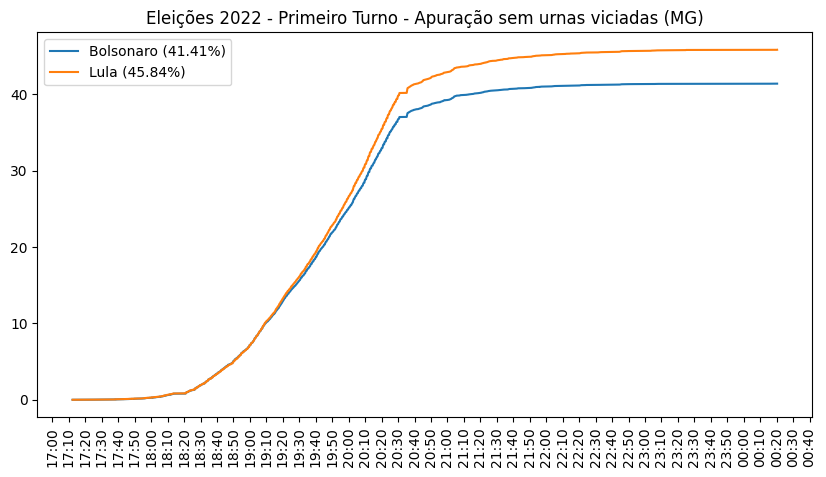

In [ ]:
# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1mg, 'Total de Votos - 1º Turno', 'Minas Gerais')
# Total de votos acumulados
gerar_grafico_temporal(df1mg, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'MG')
df1mg_urnas = df1mg[df1mg['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1mg_urnas[df1mg_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1mg_urnas[df1mg_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1mg_urnas_22 = df1mg_urnas[df1mg_urnas['NR_VOTAVEL'] == 22]
print(df1mg_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df1mg, df1mg_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df1mg_urnas_22, 'Minas Gerais')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df1mg_sub = df1mg[~((df1mg['CD_MUNICIPIO'].isin(df1mg_urnas_22['CD_MUNICIPIO'])) & 
                 (df1mg['NR_ZONA'].isin(df1mg_urnas_22['NR_ZONA'])) & 
                 (df1mg['NR_SECAO'].isin(df1mg_urnas_22['NR_SECAO'])) & 
                 (df1mg['NR_LOCAL_VOTACAO'].isin(df1mg_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df1mg_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Minas Gerais')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df1mg_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'MG')

#### 1.4.2 - Resultado da Região

Urnas com 1 voto no candidato 13: 1
Urnas com 1 voto no candidato 22: 28
                  NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
23928                ANDRADINA        9       206              1201
377974               SÃO PAULO      254       480              1600
377979               SÃO PAULO      254       481              1597
644932               SÃO PAULO      374       746              2046
1150992  SANTA HELENA DE MINAS        4       148              1066
1151011             BERTÓPOLIS        4       152              1090
1210350      BRASÍLIA DE MINAS       50       219              1694
1210363             LUISLÂNDIA       50       224              1139
1291869             ITAMBACURI      136        88              1180
1303226         CÔNEGO MARINHO      148       190              1201
1303638               JANUÁRIA      148       276              2259
1303674               JANUÁRIA      148       283              2283
1303886               JANUÁRIA      148    

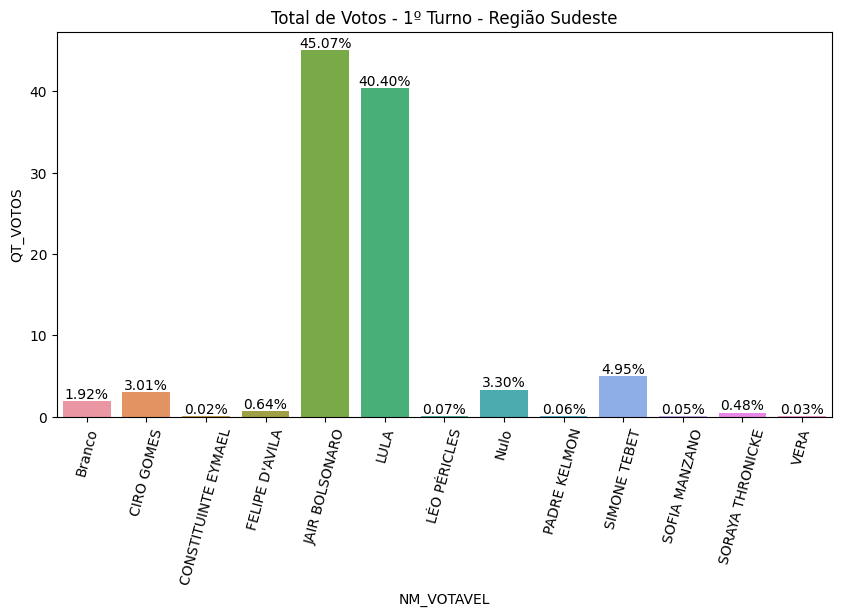

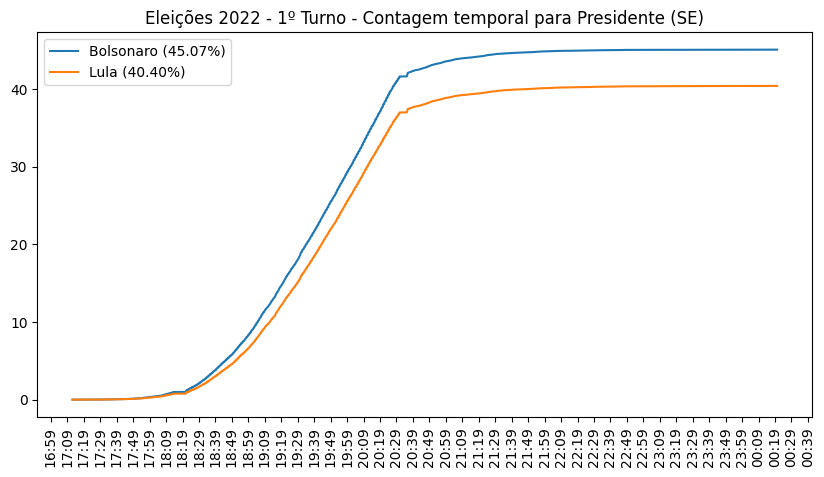

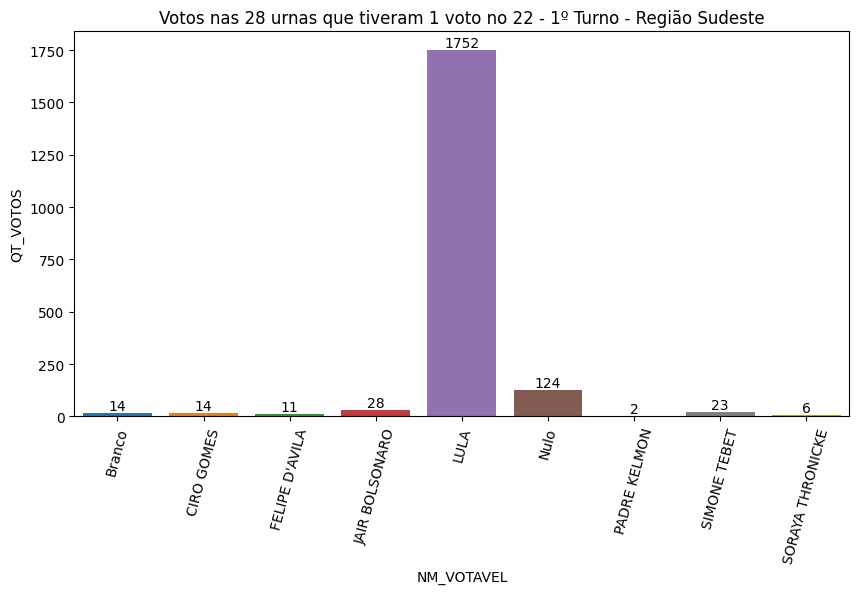

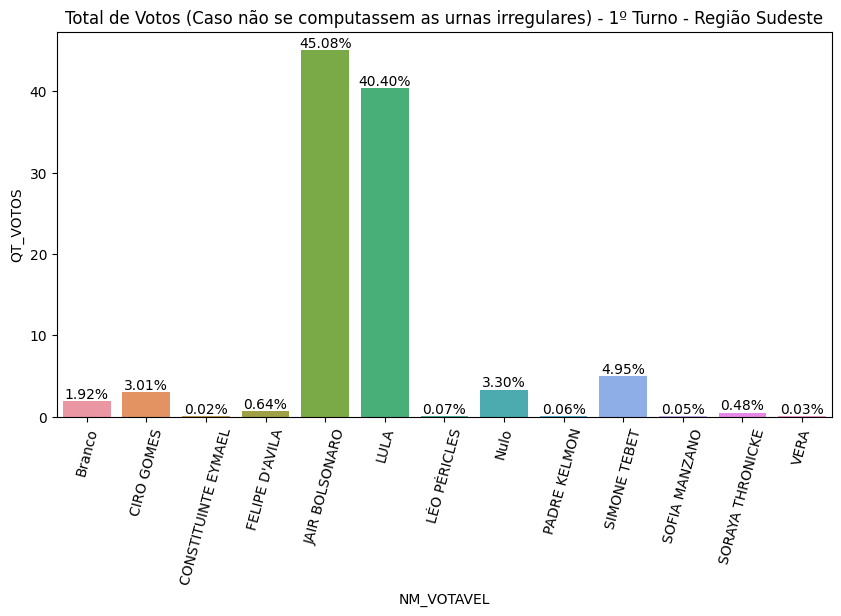

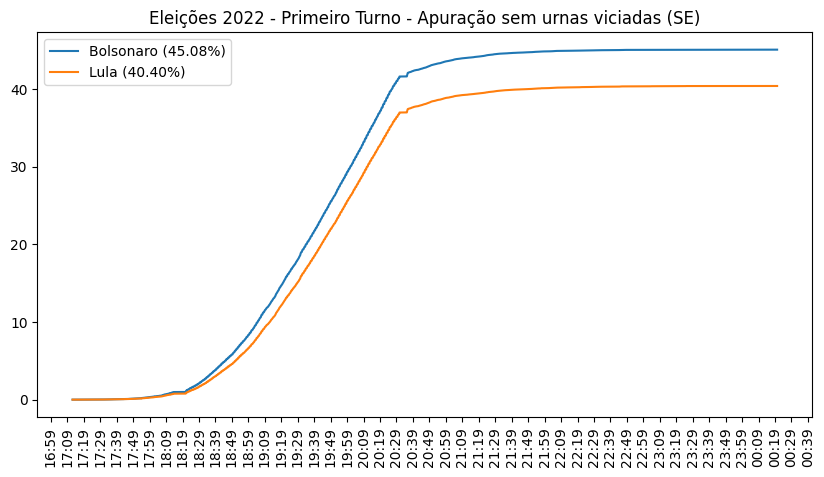

In [ ]:
df1sue = pd.concat([df1sp, df1rj, df1es, df1mg], ignore_index=True)

# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1sue, 'Total de Votos - 1º Turno', 'Região Sudeste')
# Total de votos acumulados
gerar_grafico_temporal(df1sue, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'SUE')
df1sue_urnas = df1sue[df1sue['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1sue_urnas[df1sue_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1sue_urnas[df1sue_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1sue_urnas_22 = df1sue_urnas[df1sue_urnas['NR_VOTAVEL'] == 22]
print(df1sue_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df1sue, df1sue_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df1sue_urnas_22, 'Região Sudeste')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df1sue_sub = df1sue[~((df1sue['CD_MUNICIPIO'].isin(df1sue_urnas_22['CD_MUNICIPIO'])) & 
                 (df1sue['NR_ZONA'].isin(df1sue_urnas_22['NR_ZONA'])) & 
                 (df1sue['NR_SECAO'].isin(df1sue_urnas_22['NR_SECAO'])) & 
                 (df1sue['NR_LOCAL_VOTACAO'].isin(df1sue_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df1sue_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Região Sudeste')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df1sue_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'SUE')

### 1.5 - Região SUL

#### 1.5.1 - Estados

##### 1.5.1.1 - PARANÁ


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 3
        NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
818208        PALMAS       32       113              1341
1031361        TURVO       44       179              1236
2837776   ORTIGUEIRA      167        96              1562


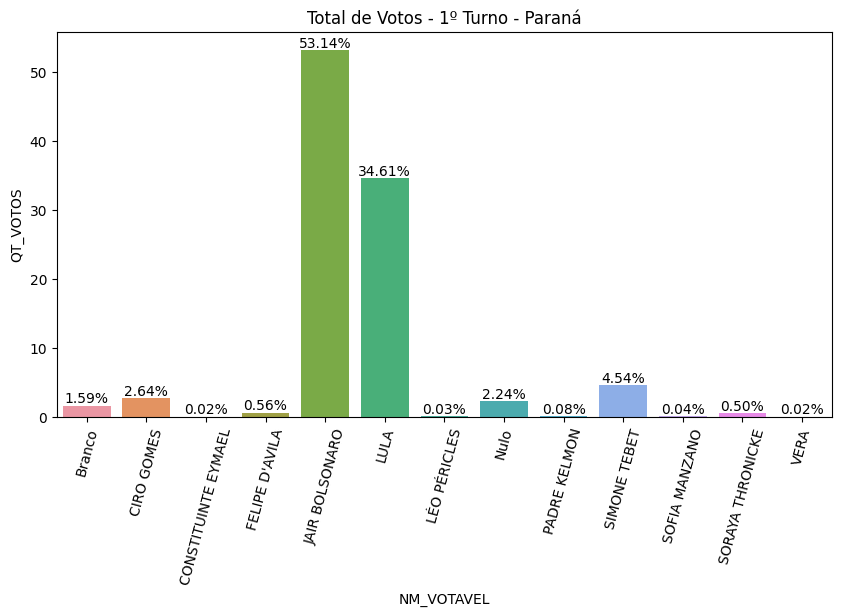

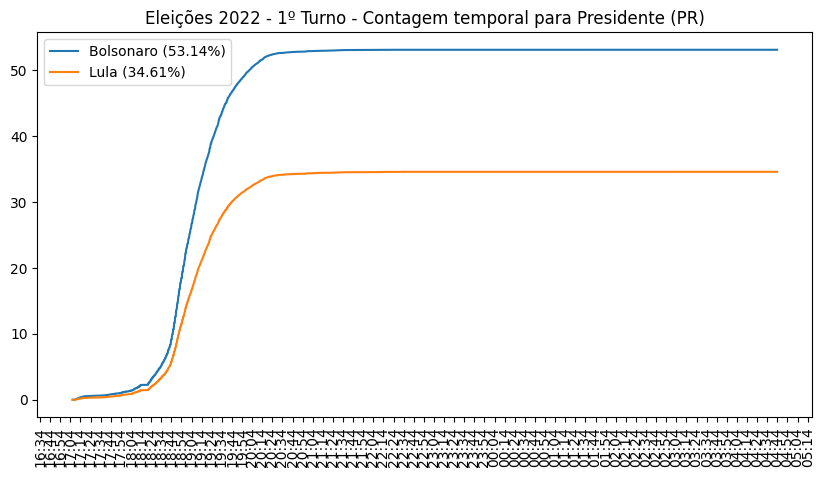

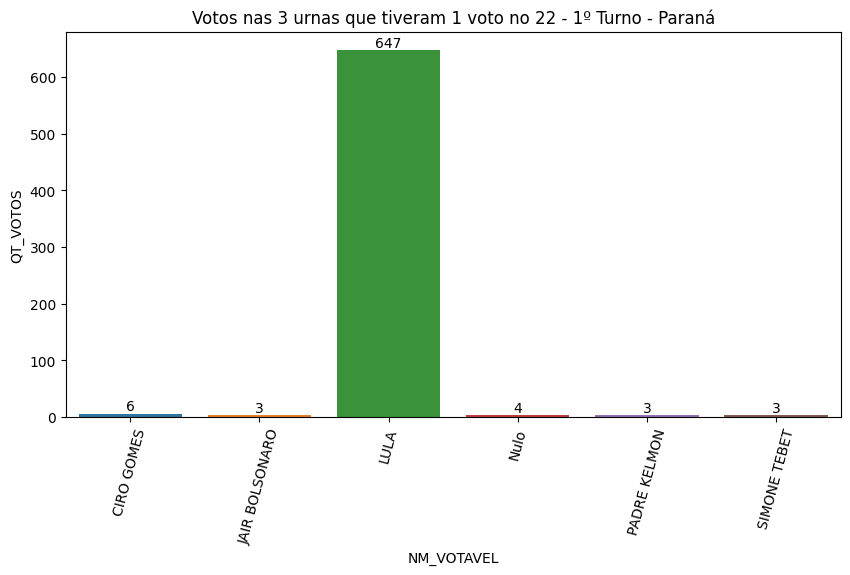

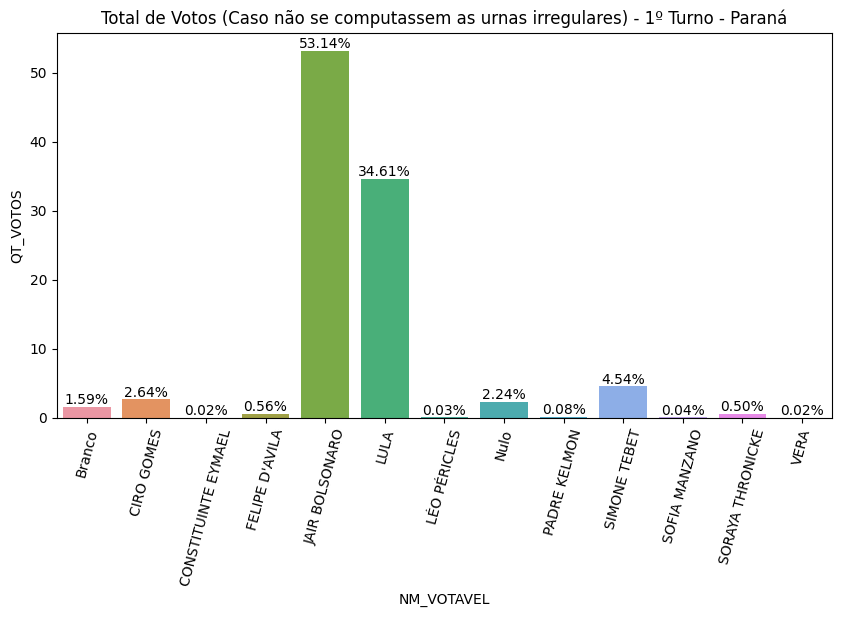

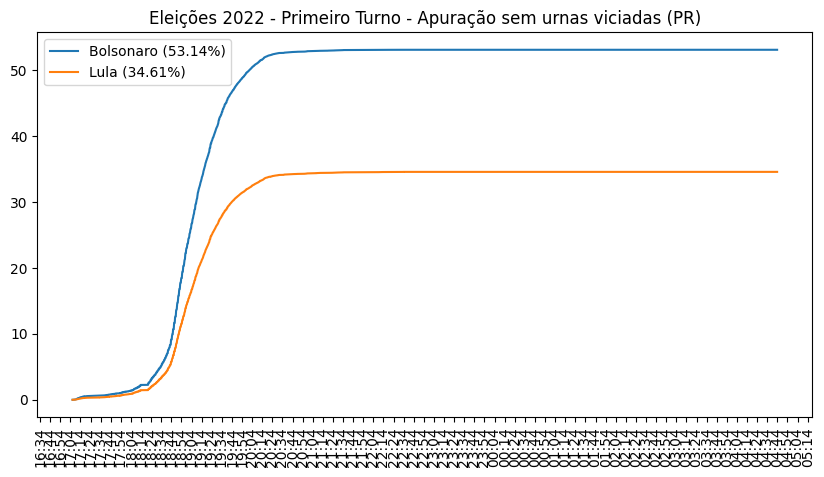

In [ ]:
# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1pr, 'Total de Votos - 1º Turno', 'Paraná')
# Total de votos acumulados
gerar_grafico_temporal(df1pr, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'PR')
df1pr_urnas = df1pr[df1pr['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1pr_urnas[df1pr_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1pr_urnas[df1pr_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1pr_urnas_22 = df1pr_urnas[df1pr_urnas['NR_VOTAVEL'] == 22]
print(df1pr_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df1pr, df1pr_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df1pr_urnas_22, 'Paraná')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df1pr_sub = df1pr[~((df1pr['CD_MUNICIPIO'].isin(df1pr_urnas_22['CD_MUNICIPIO'])) & 
                 (df1pr['NR_ZONA'].isin(df1pr_urnas_22['NR_ZONA'])) & 
                 (df1pr['NR_SECAO'].isin(df1pr_urnas_22['NR_SECAO'])) & 
                 (df1pr['NR_LOCAL_VOTACAO'].isin(df1pr_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df1pr_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Paraná')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df1pr_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'PR')

##### 1.5.1.2 - SANTA CATARINA


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 0
Empty DataFrame
Columns: [NM_MUNICIPIO, NR_ZONA, NR_SECAO, NR_LOCAL_VOTACAO]
Index: []


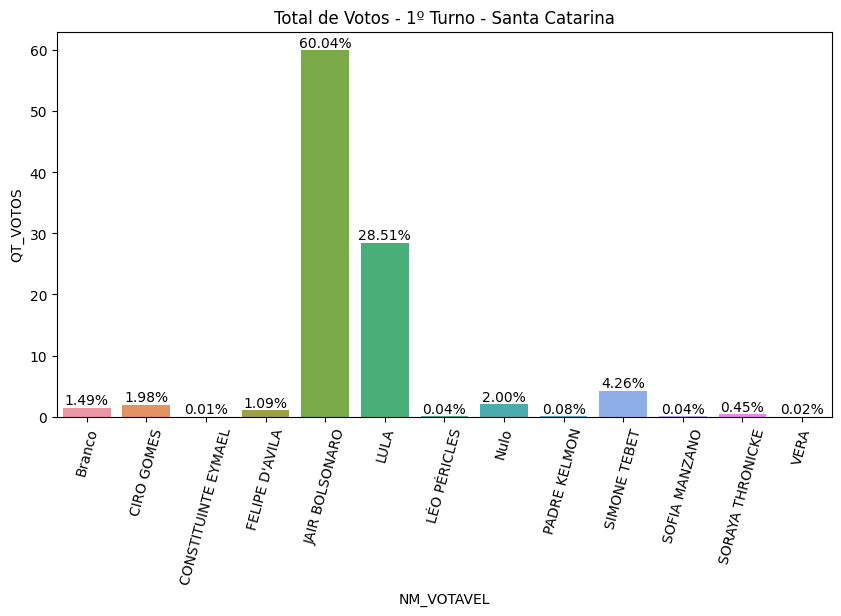

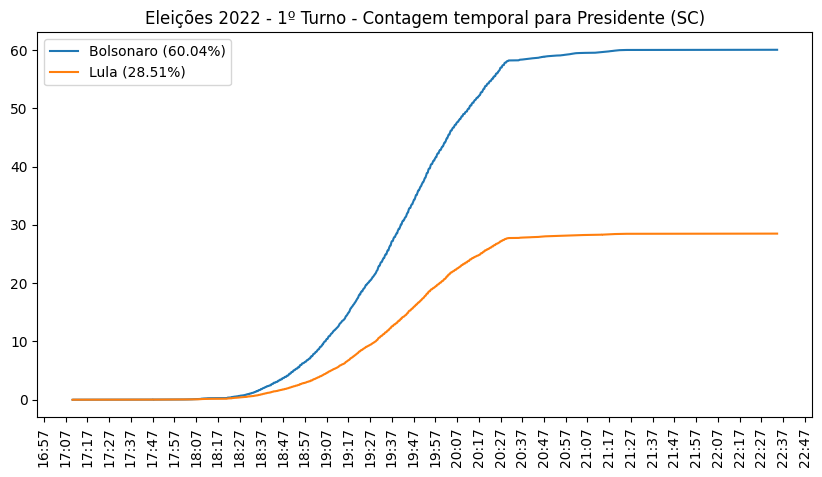

In [ ]:
# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1sc, 'Total de Votos - 1º Turno', 'Santa Catarina')
# Total de votos acumulados
gerar_grafico_temporal(df1sc, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'SC')
df1sc_urnas = df1sc[df1sc['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1sc_urnas[df1sc_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1sc_urnas[df1sc_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1sc_urnas_22 = df1sc_urnas[df1sc_urnas['NR_VOTAVEL'] == 22]
print(df1sc_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df1sc, df1sc_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df1sc_urnas_22, 'Santa Catarina')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df1sc_sub = df1sc[~((df1sc['CD_MUNICIPIO'].isin(df1sc_urnas_22['CD_MUNICIPIO'])) & 
                 (df1sc['NR_ZONA'].isin(df1sc_urnas_22['NR_ZONA'])) & 
                 (df1sc['NR_SECAO'].isin(df1sc_urnas_22['NR_SECAO'])) & 
                 (df1sc['NR_LOCAL_VOTACAO'].isin(df1sc_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df1sc_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Santa Catarina')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df1sc_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'SC')

##### 1.5.1.3 - RIO GRANDE DO SUL


Urnas com 1 voto no candidato 13: 1
Urnas com 1 voto no candidato 22: 8
                   NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
502440      ENCRUZILHADA DO SUL       19        90              1422
525720                  ERECHIM       20       352              1910
1056349  SÃO MIGUEL DAS MISSÕES       45       279              2461
1454961                 PELOTAS       60       506              2585
1919784                PIRATINI       78        71              1481
1949234                QUEVEDOS       81        95              1104
2262774                 CHARRUA      100       126              1180
3664802              RIO GRANDE      163         3              1392


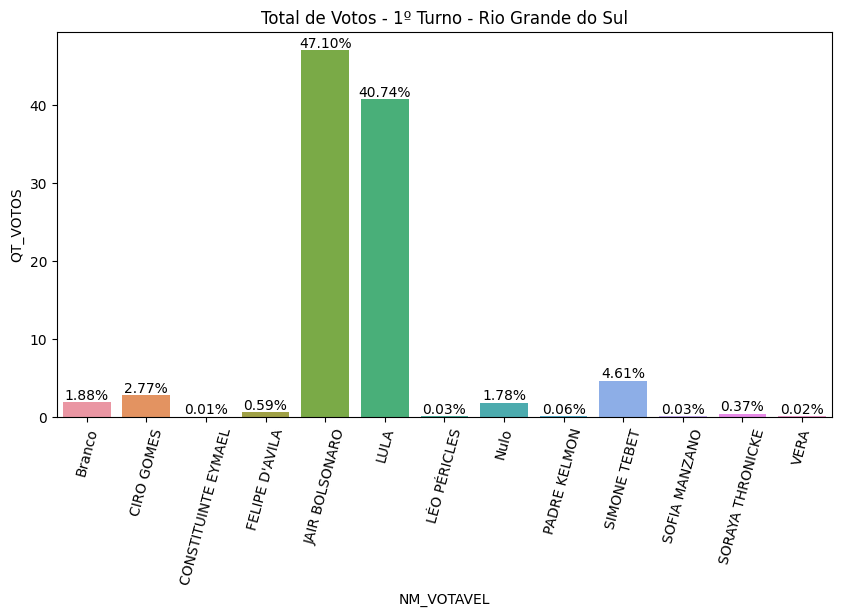

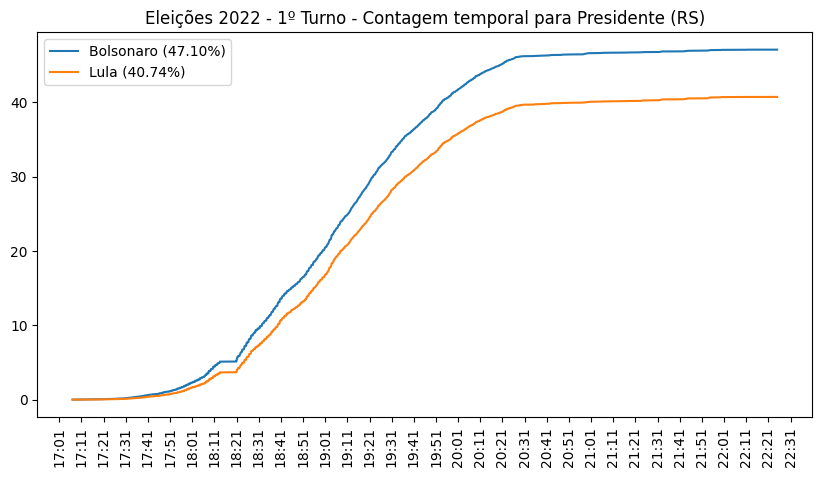

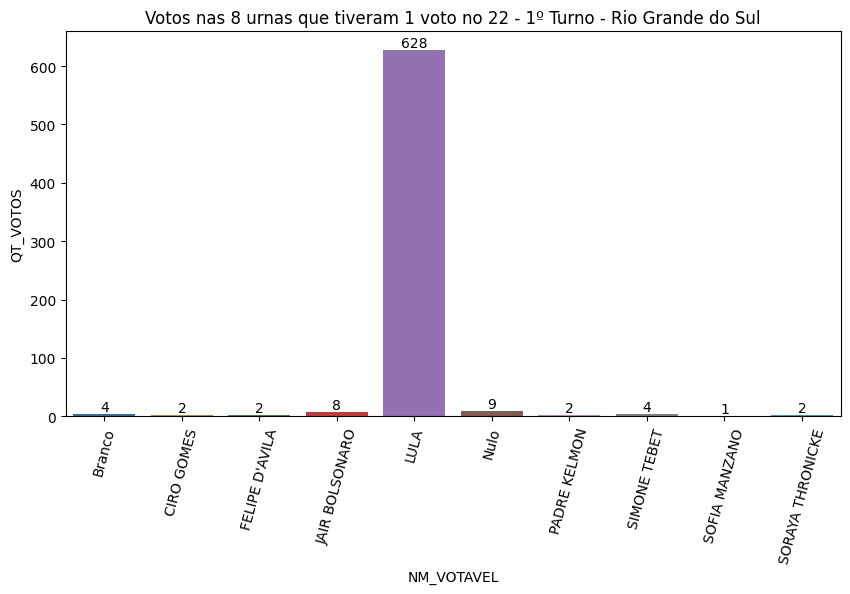

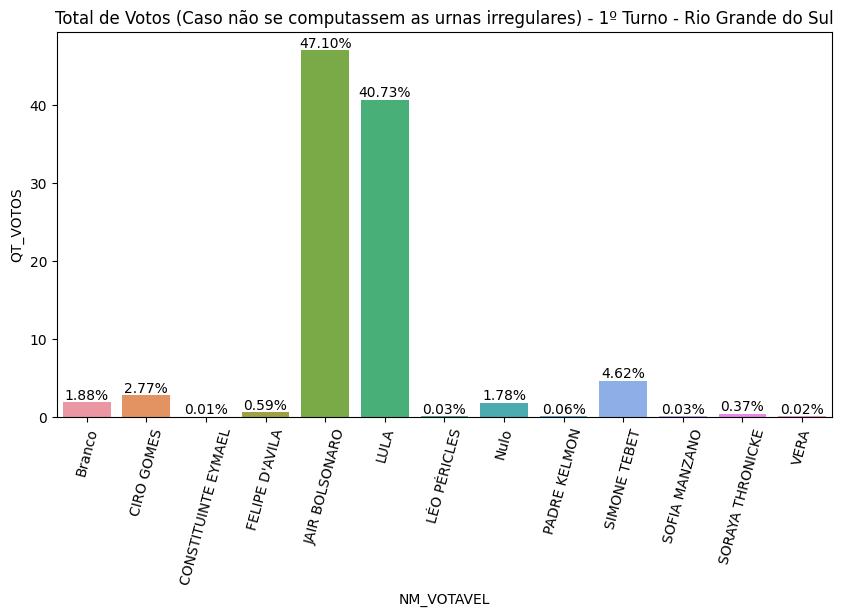

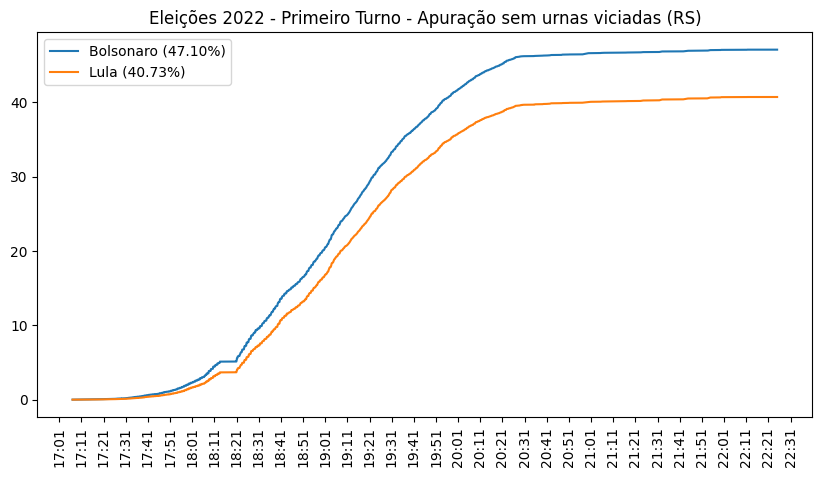

In [ ]:
# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1rs, 'Total de Votos - 1º Turno', 'Rio Grande do Sul')
# Total de votos acumulados
gerar_grafico_temporal(df1rs, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'RS')
df1rs_urnas = df1rs[df1rs['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1rs_urnas[df1rs_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1rs_urnas[df1rs_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1rs_urnas_22 = df1rs_urnas[df1rs_urnas['NR_VOTAVEL'] == 22]
print(df1rs_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df1rs, df1rs_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df1rs_urnas_22, 'Rio Grande do Sul')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df1rs_sub = df1rs[~((df1rs['CD_MUNICIPIO'].isin(df1rs_urnas_22['CD_MUNICIPIO'])) & 
                 (df1rs['NR_ZONA'].isin(df1rs_urnas_22['NR_ZONA'])) & 
                 (df1rs['NR_SECAO'].isin(df1rs_urnas_22['NR_SECAO'])) & 
                 (df1rs['NR_LOCAL_VOTACAO'].isin(df1rs_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df1rs_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Rio Grande do Sul')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df1rs_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'RS')

#### 1.5.2 - Resultados da Região

Urnas com 1 voto no candidato 13: 1
Urnas com 1 voto no candidato 22: 11
                  NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
42978                   PALMAS       32       113              1341
55817                    TURVO       44       179              1236
161542              ORTIGUEIRA      167        96              1562
351144     ENCRUZILHADA DO SUL       19        90              1422
352561                 ERECHIM       20       352              1910
382980  SÃO MIGUEL DAS MISSÕES       45       279              2461
404498                 PELOTAS       60       506              2585
427581                PIRATINI       78        71              1481
429500                QUEVEDOS       81        95              1104
447122                 CHARRUA      100       126              1180
515394              RIO GRANDE      163         3              1392


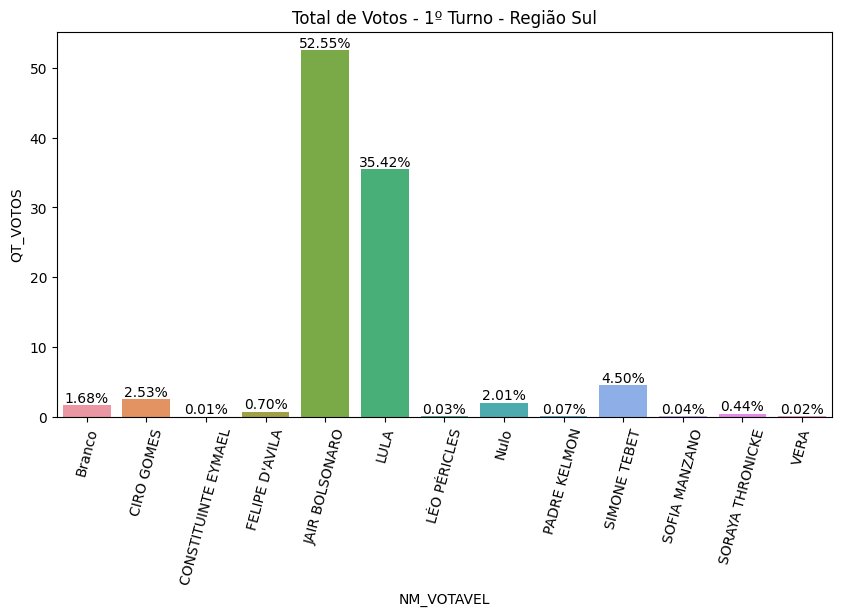

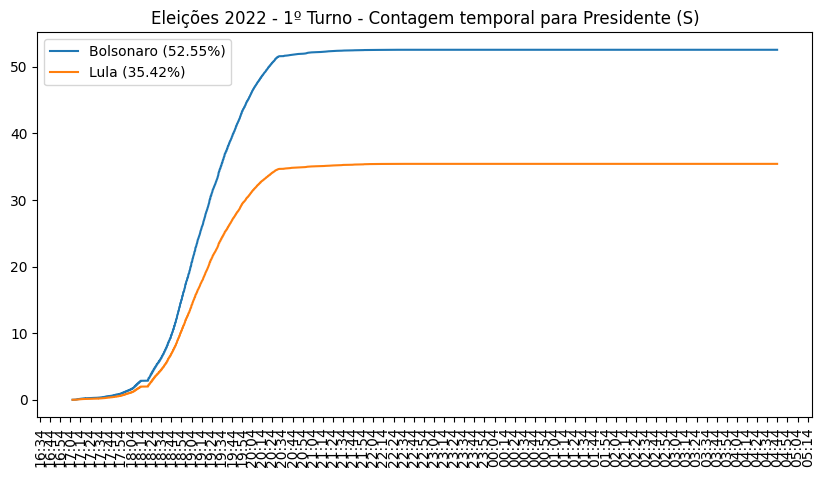

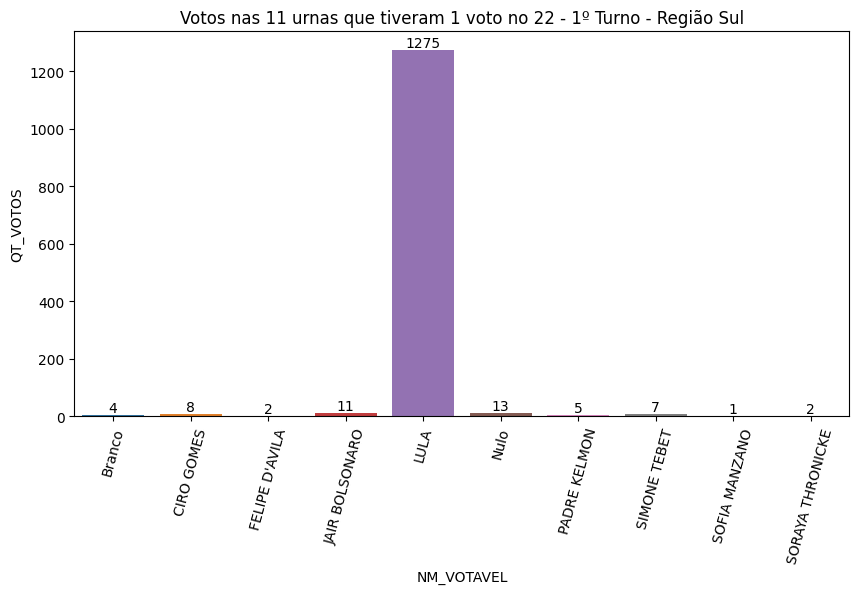

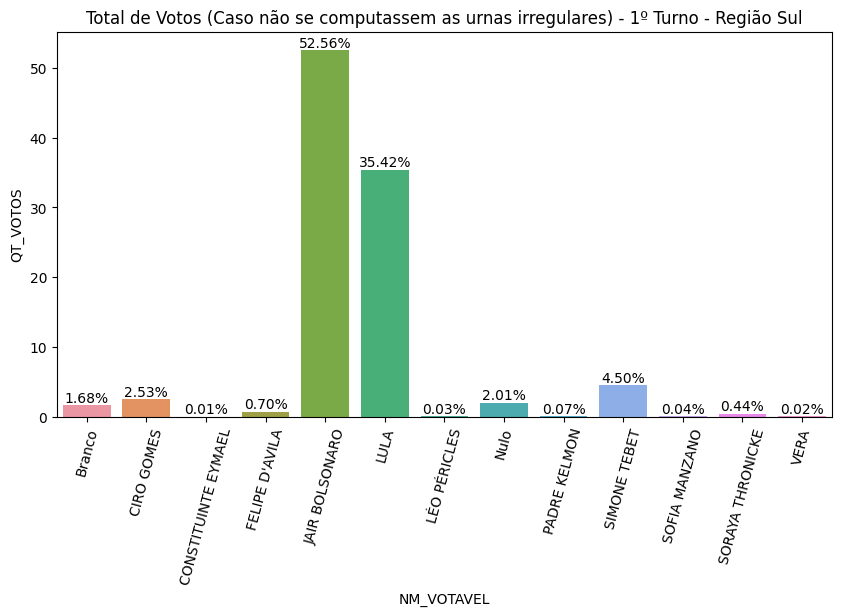

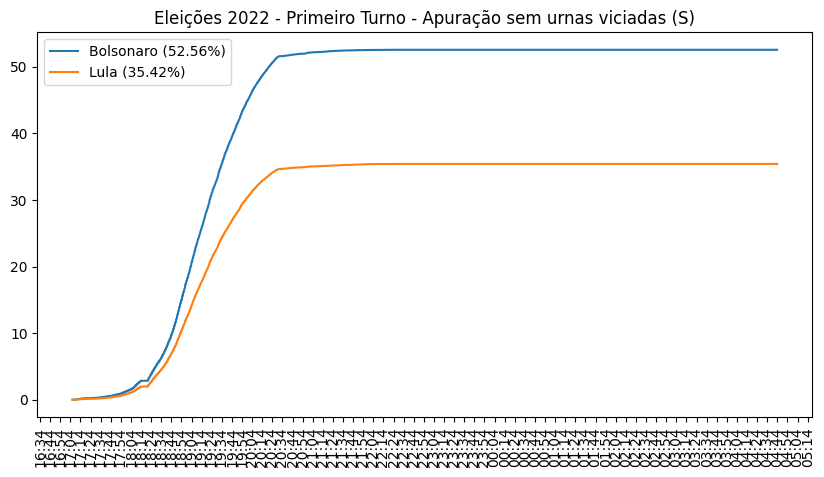

In [ ]:
df1s = pd.concat([df1pr, df1sc, df1rs], ignore_index=True)

# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1s, 'Total de Votos - 1º Turno', 'Região Sul')
# Total de votos acumulados
gerar_grafico_temporal(df1s, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'S')
df1s_urnas = df1s[df1s['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1s_urnas[df1s_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1s_urnas[df1s_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1s_urnas_22 = df1s_urnas[df1s_urnas['NR_VOTAVEL'] == 22]
print(df1s_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df1s, df1s_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df1s_urnas_22, 'Região Sul')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df1s_sub = df1s[~((df1s['CD_MUNICIPIO'].isin(df1s_urnas_22['CD_MUNICIPIO'])) & 
                 (df1s['NR_ZONA'].isin(df1s_urnas_22['NR_ZONA'])) & 
                 (df1s['NR_SECAO'].isin(df1s_urnas_22['NR_SECAO'])) & 
                 (df1s['NR_LOCAL_VOTACAO'].isin(df1s_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df1s_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Região Sul')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df1s_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'S')

### 1.6 - Resultado BRASIL

Urnas com 1 voto no candidato 13: 3
Urnas com 1 voto no candidato 22: 254
            NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
10058           SALVADOR        5       800              1805
39495           SALVADOR       19       800              1490
41624    MANOEL VITORINO       22       160              1139
71124          ITABERABA       42       288              1570
72106       CASTRO ALVES       43       132              1376
...                  ...      ...       ...               ...
3344167          PELOTAS       60       506              2585
3367250         PIRATINI       78        71              1481
3369169         QUEVEDOS       81        95              1104
3386791          CHARRUA      100       126              1180
3455063       RIO GRANDE      163         3              1392

[254 rows x 4 columns]


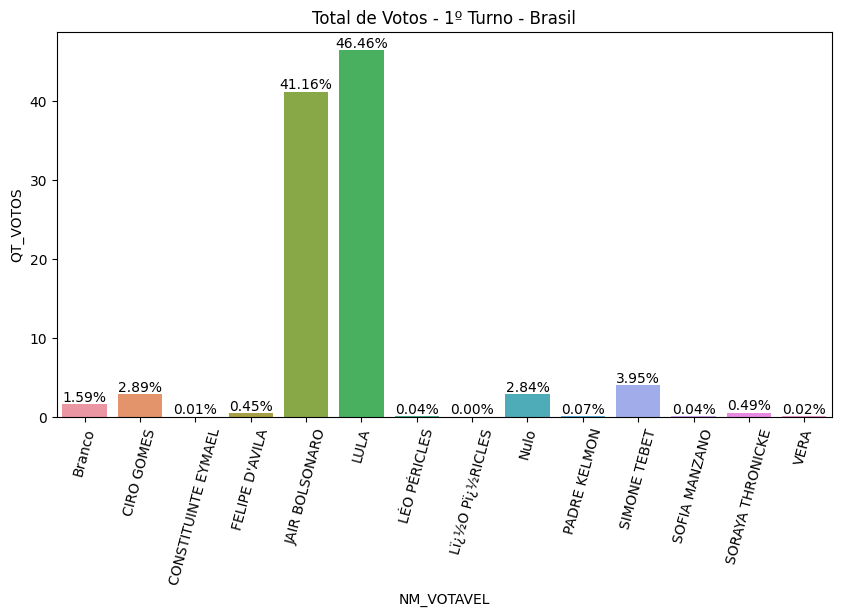

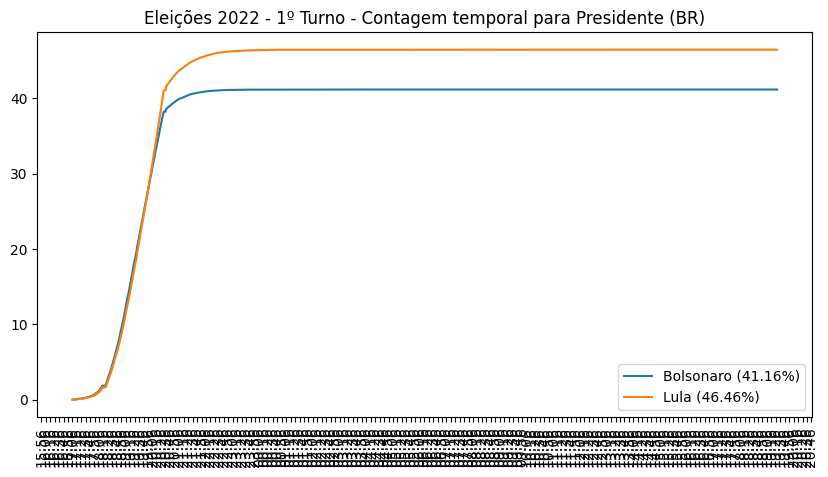

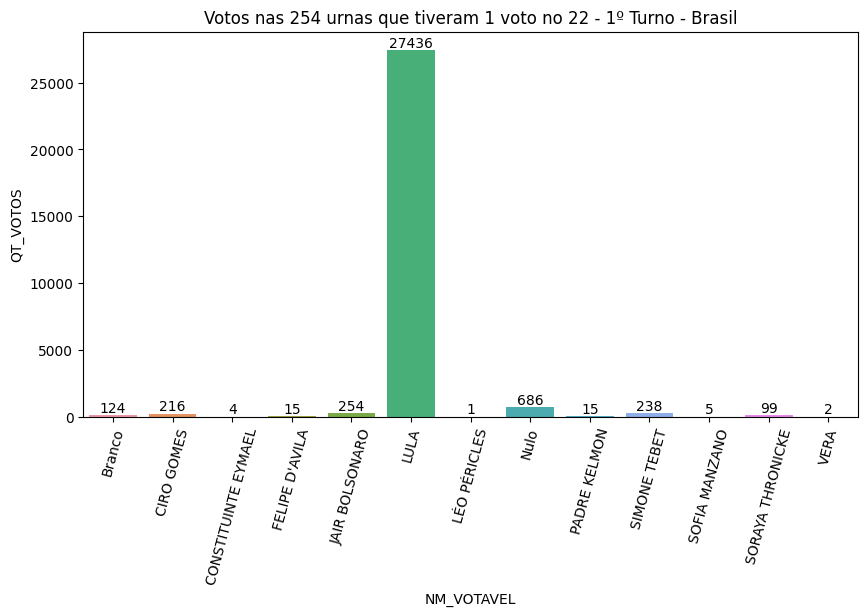

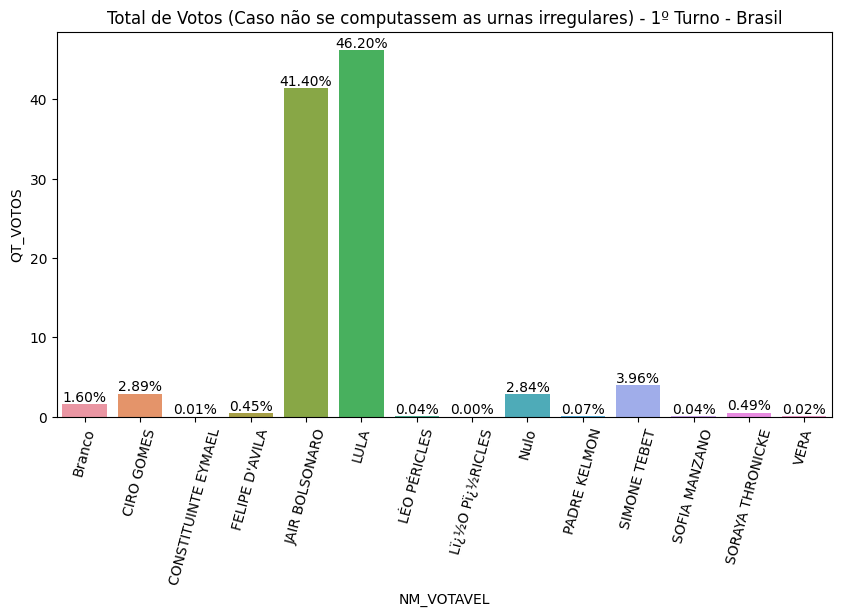

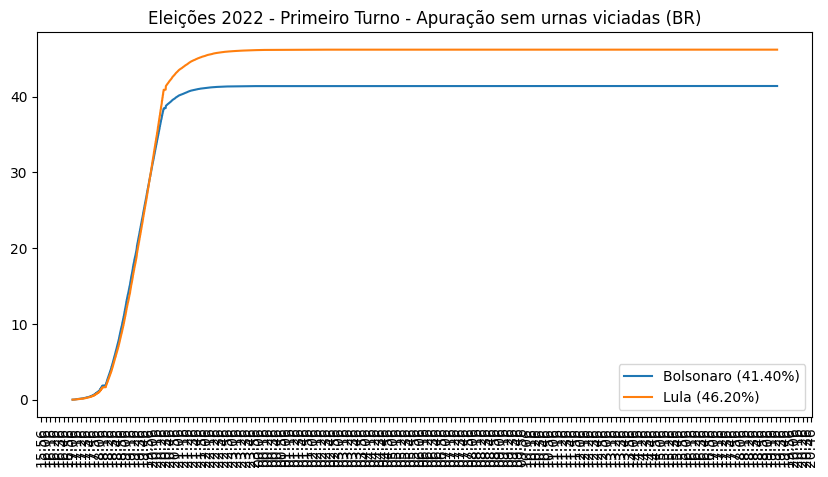

In [ ]:
df1br = pd.concat([df1ne, df1n, df1co, df1sue, df1s], ignore_index=True)

# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df1br, 'Total de Votos - 1º Turno', 'Brasil')
# Total de votos acumulados
gerar_grafico_temporal(df1br, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'BR')
df1br_urnas = df1br[df1br['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df1br_urnas[df1br_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df1br_urnas[df1br_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df1br_urnas_22 = df1br_urnas[df1br_urnas['NR_VOTAVEL'] == 22]
print(df1br_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df1br, df1br_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df1br_urnas_22, 'Brasil')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df1br_sub = df1br[~((df1br['CD_MUNICIPIO'].isin(df1br_urnas_22['CD_MUNICIPIO'])) & 
                 (df1br['NR_ZONA'].isin(df1br_urnas_22['NR_ZONA'])) & 
                 (df1br['NR_SECAO'].isin(df1br_urnas_22['NR_SECAO'])) & 
                 (df1br['NR_LOCAL_VOTACAO'].isin(df1br_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df1br_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Brasil')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df1br_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'BR')

## 2 - SEGUNDO TURNO

### 2.1 - Região NORDESTE

#### 2.1.1 - Estados

##### 2.1.1.1 - BAHIA


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 35
                  NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
78242         SENHOR DO BONFIM       45       310              1872
84661                 JANDAÍRA       49       155              1171
89195              PARIPIRANGA       52       182              1155
101743              LAGOA REAL       63       111              1210
105370                 BOQUIRA       65       228              1090
108670                 REMANSO       67       148              1295
108731                 REMANSO       67       156              1350
108750                 REMANSO       67       159              1384
120420              JAGUAQUARA       76       105              1236
122157                   BARRA       77       205              1821
124142              NOVA SOURE       79       152              1082
124373              NOVA SOURE       79       192              1120
130692            PAULO AFONSO       84    

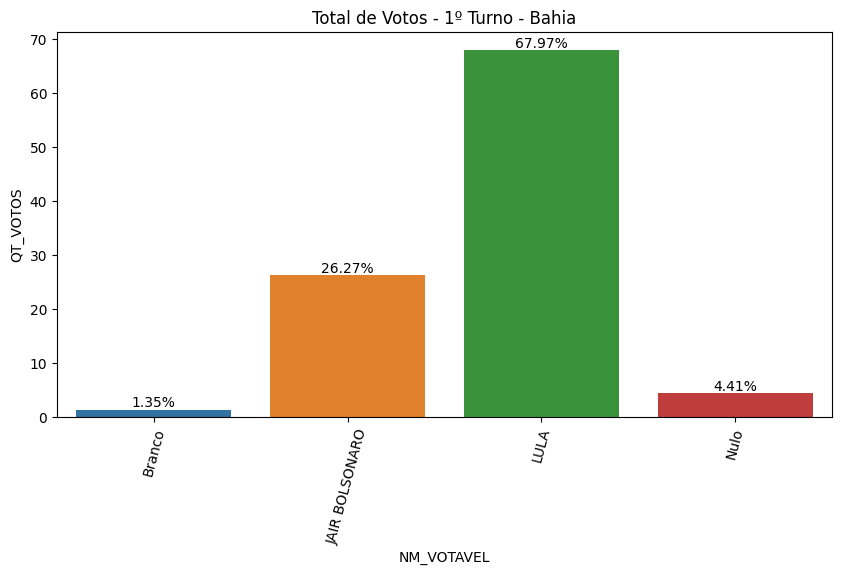

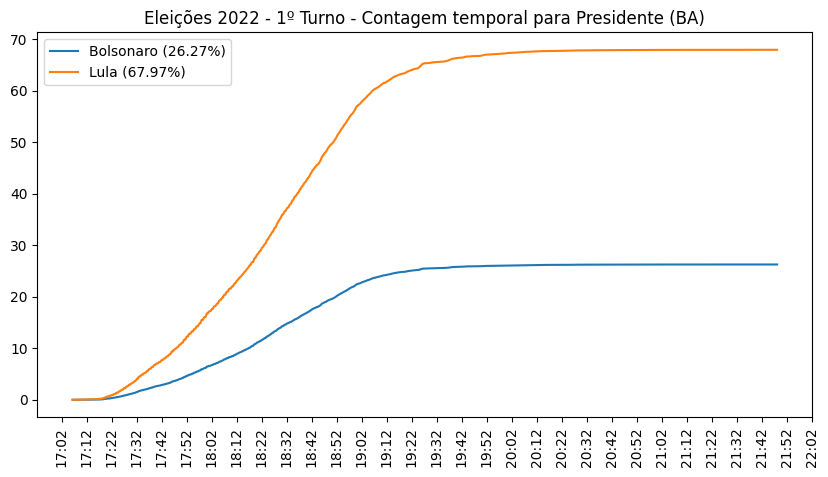

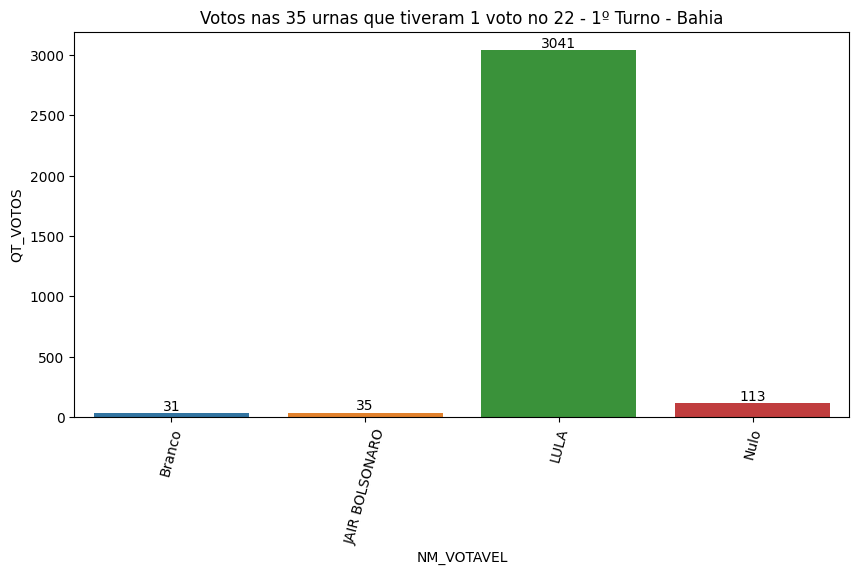

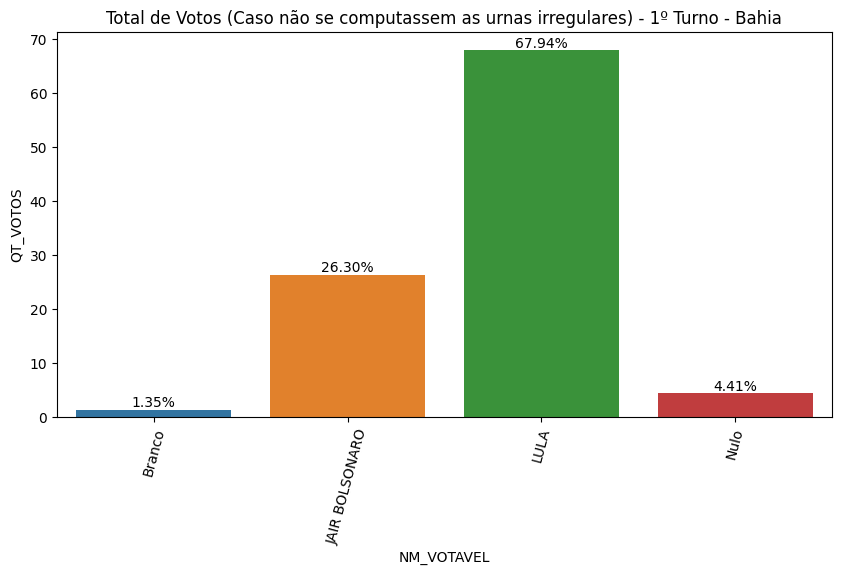

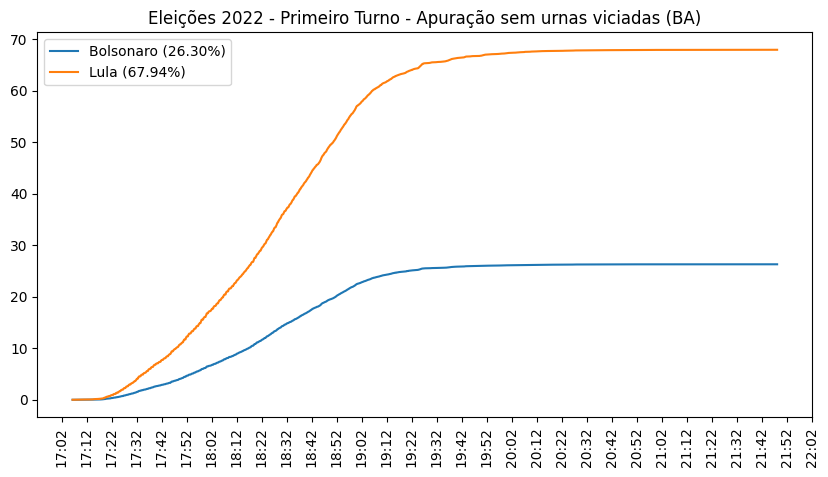

In [53]:
# Graficos - Total no 1º turno
gerar_grafico_porcentagem(df2ba, 'Total de Votos - 1º Turno', 'Bahia')
# Total de votos acumulados
gerar_grafico_temporal(df2ba, 'Eleições 2022 - 1º Turno - Contagem temporal para Presidente', 'BA')
df2ba_urnas = df2ba[df2ba['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2ba_urnas[df2ba_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2ba_urnas[df2ba_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2ba_urnas_22 = df2ba_urnas[df2ba_urnas['NR_VOTAVEL'] == 22]
print(df2ba_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2ba, df2ba_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2ba_urnas_22, 'Bahia')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2ba_sub = df2ba[~((df2ba['CD_MUNICIPIO'].isin(df2ba_urnas_22['CD_MUNICIPIO'])) & 
                 (df2ba['NR_ZONA'].isin(df2ba_urnas_22['NR_ZONA'])) & 
                 (df2ba['NR_SECAO'].isin(df2ba_urnas_22['NR_SECAO'])) & 
                 (df2ba['NR_LOCAL_VOTACAO'].isin(df2ba_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2ba_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 1º Turno', 'Bahia')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2ba_sub, 'Eleições 2022 - Primeiro Turno - Apuração sem urnas viciadas', 'BA')

##### 2.1.1.2 - PIAUI


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 16
                   NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
4432        SÃO JOÃO DA VARJOTA        5       200              1074
5971                   AMARANTE        8        35              1295
9716        SÃO RAIMUNDO NONATO       13       301              1767
11563     NOVO ORIENTE DO PIAUÍ       18        91              1104
11602     NOVO ORIENTE DO PIAUÍ       18       104              1082
17045         BURITI DOS MONTES       34       136              1180
17088         BURITI DOS MONTES       34       154              1201
17909           CANTO DO BURITI       36       121              1210
21860             VÁRZEA GRANDE       48       148              1104
24456           NAZARÉ DO PIAUÍ       61       359              1147
28419  PASSAGEM FRANCA DO PIAUÍ       74       105              1031
28503                  GUARIBAS       79        20              1031
29446               PIMENTEIRA

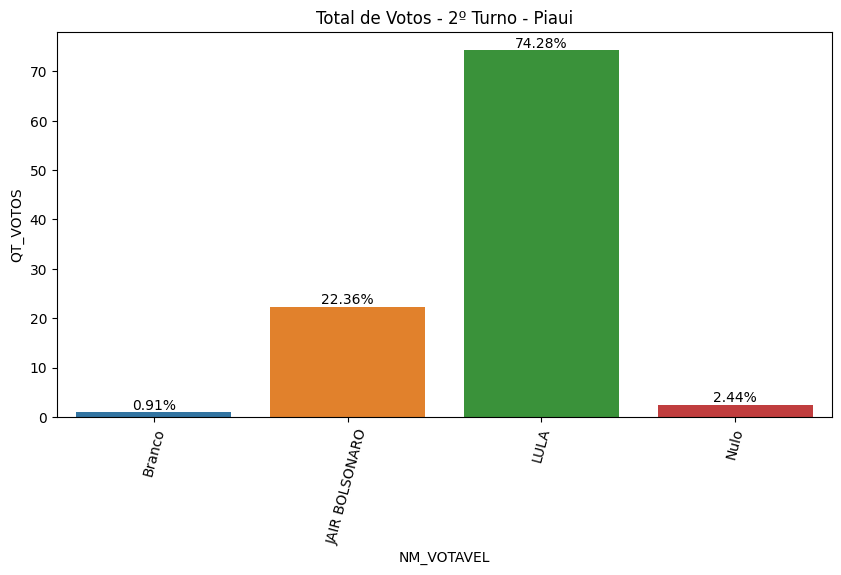

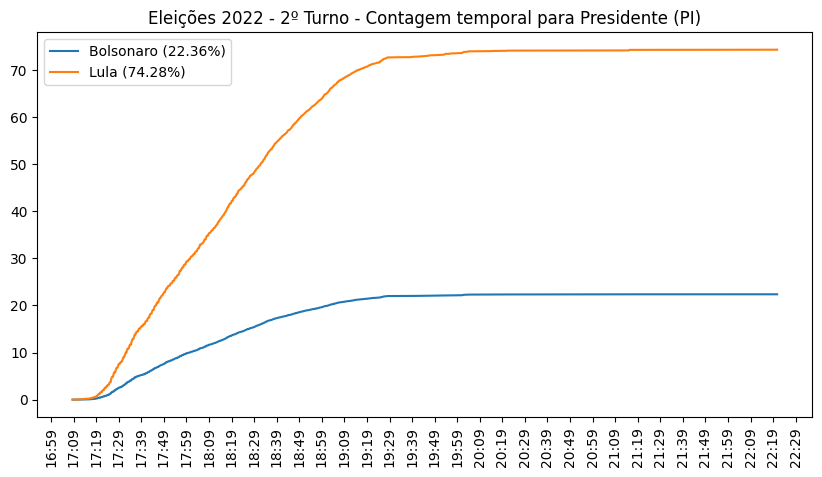

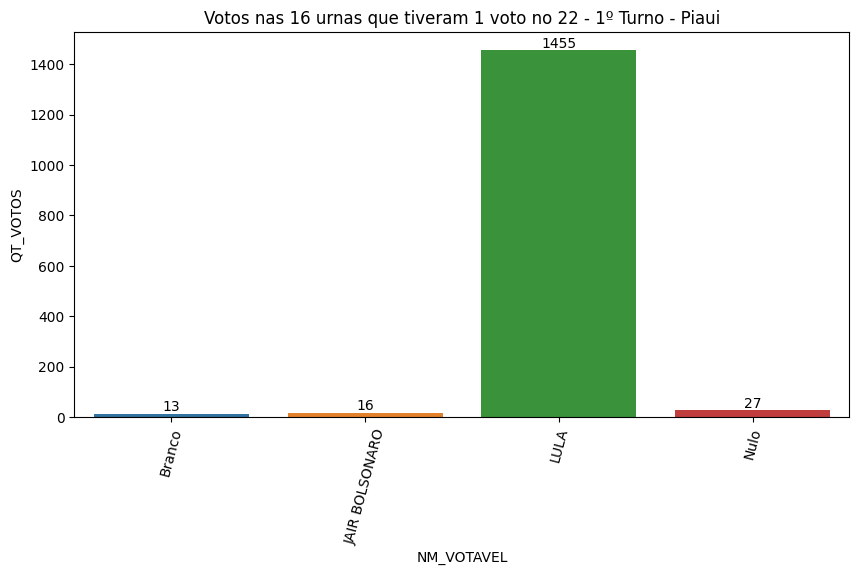

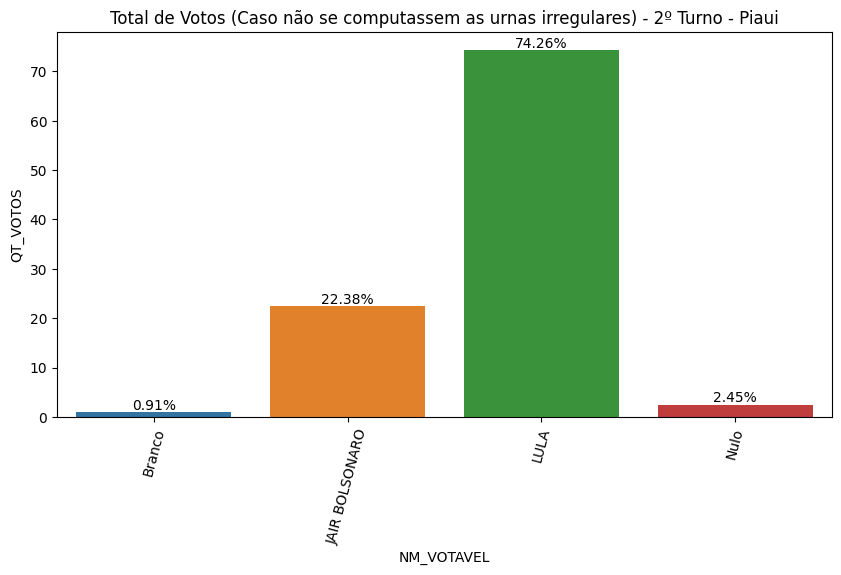

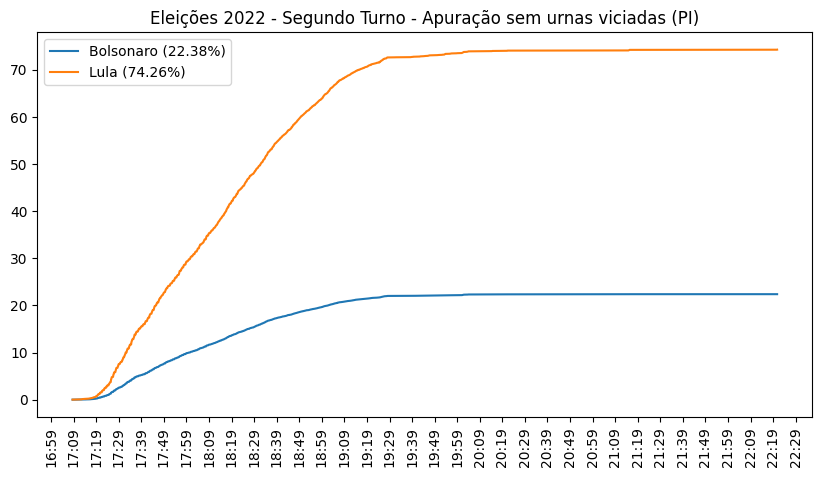

In [54]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2pi, 'Total de Votos - 2º Turno', 'Piaui')
# Total de votos acumulados
gerar_grafico_temporal(df2pi, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'PI')
df2pi_urnas = df2pi[df2pi['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2pi_urnas[df2pi_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2pi_urnas[df2pi_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2pi_urnas_22 = df2pi_urnas[df2pi_urnas['NR_VOTAVEL'] == 22]
print(df2pi_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2pi, df2pi_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2pi_urnas_22, 'Piaui')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2pi_sub = df2pi[~((df2pi['CD_MUNICIPIO'].isin(df2pi_urnas_22['CD_MUNICIPIO'])) & 
                 (df2pi['NR_ZONA'].isin(df2pi_urnas_22['NR_ZONA'])) & 
                 (df2pi['NR_SECAO'].isin(df2pi_urnas_22['NR_SECAO'])) & 
                 (df2pi['NR_LOCAL_VOTACAO'].isin(df2pi_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2pi_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Piaui')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2pi_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'PI')

##### 2.1.1.3 - MARANHÃO

Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 51
                     NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
7716                      COROATÁ        8       146              1317
10511                    ARAIOSES       12       129              1660
11799                    CURURUPU       14       149              1538
12963             ITAPECURU MIRIM       16       202              1635
13087             ITAPECURU MIRIM       16       258              1589
15845                       TIMON       19       570              1945
16471                      CAJARI       20       213              1309
16505                      CAJARI       20       223              1139
18573  SANTA QUITÉRIA DO MARANHÃO       24        73              1252
19332                      BURITI       25        51              1252
21159                   GUIMARÃES       30        61              1201
21830                       ICATU       31       184              1520
2185

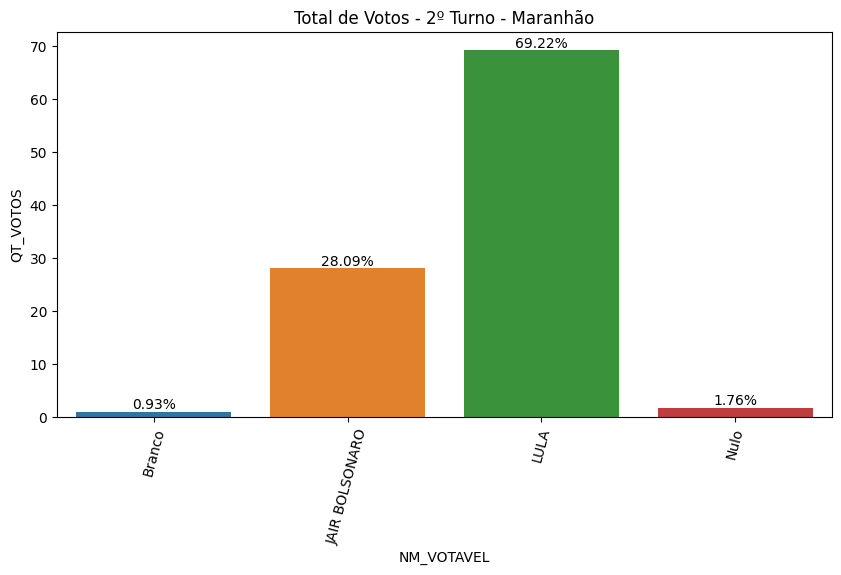

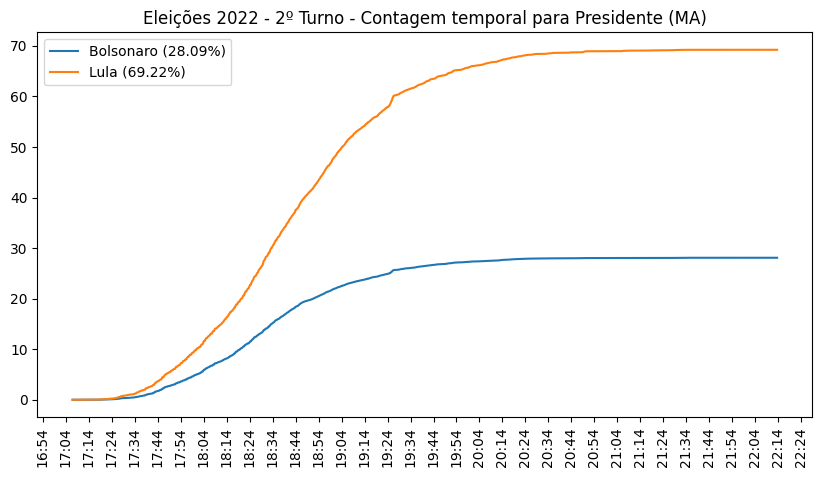

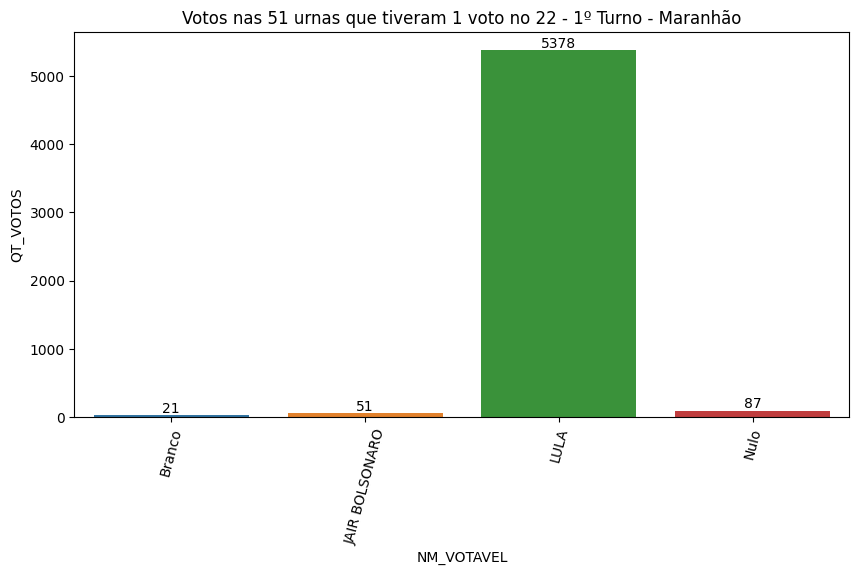

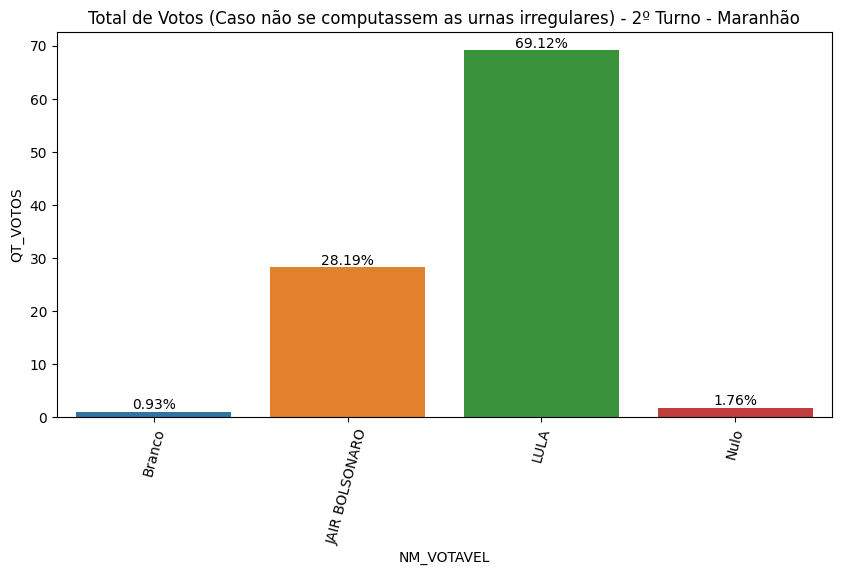

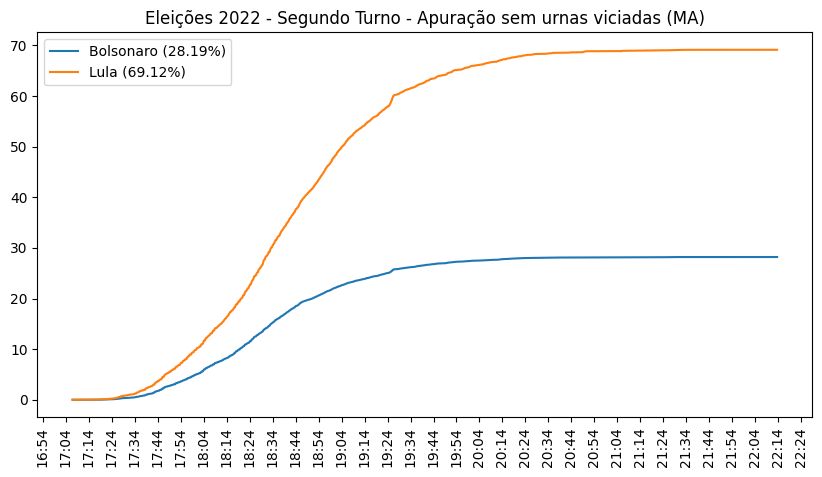

In [55]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2ma, 'Total de Votos - 2º Turno', 'Maranhão')
# Total de votos acumulados
gerar_grafico_temporal(df2ma, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'MA')
df2ma_urnas = df2ma[df2ma['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2ma_urnas[df2ma_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2ma_urnas[df2ma_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2ma_urnas_22 = df2ma_urnas[df2ma_urnas['NR_VOTAVEL'] == 22]
print(df2ma_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2ma, df2ma_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2ma_urnas_22, 'Maranhão')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2ma_sub = df2ma[~((df2ma['CD_MUNICIPIO'].isin(df2ma_urnas_22['CD_MUNICIPIO'])) & 
                 (df2ma['NR_ZONA'].isin(df2ma_urnas_22['NR_ZONA'])) & 
                 (df2ma['NR_SECAO'].isin(df2ma_urnas_22['NR_SECAO'])) & 
                 (df2ma['NR_LOCAL_VOTACAO'].isin(df2ma_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2ma_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Maranhão')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2ma_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'MA')

##### 2.1.1.4 - CEARÁ


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 17
            NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
11089       QUIXERAMOBIM       11        64              1538
18788            CRATEÚS       20        63              1309
23584             GRANJA       25       208              1791
30482            CANINDÉ       33       413              2941
33414       CAMPOS SALES       38       146              1775
34524            PORANGA       40       208              1368
36875  SANTANA DO ACARAÚ       44       186              1740
47025         BOA VIAGEM       63        88              1643
47075         BOA VIAGEM       63       104              1791
50044            ARARIPE       68        16              1139
50181            POTENGI       68        54              1139
53475             CROATÁ       74       156              1791
54547            MAURITI       76       140              2038
56429             PACUJÁ       79       249              11

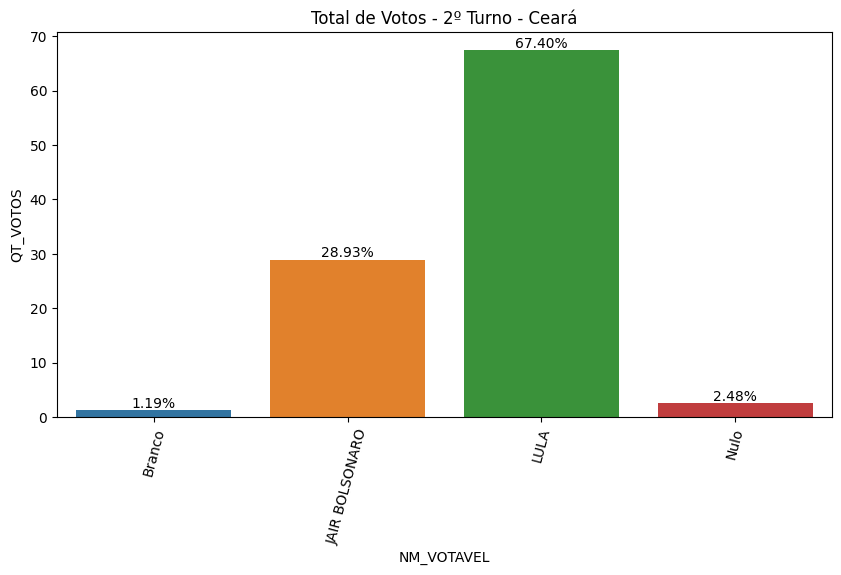

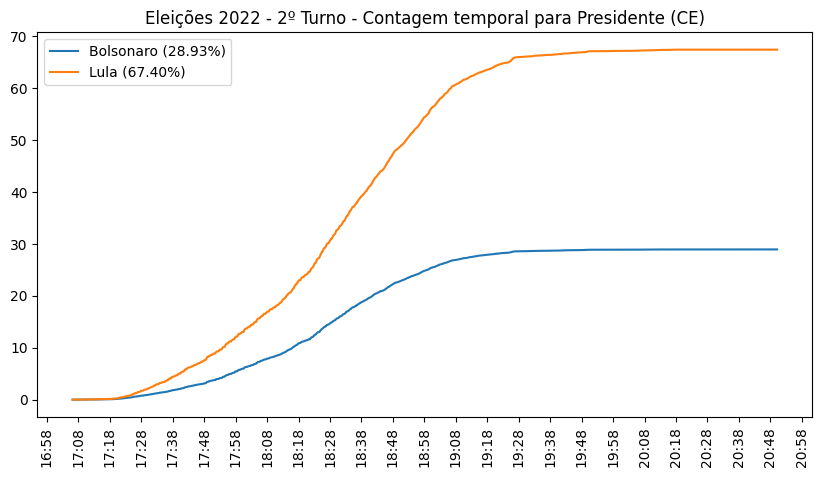

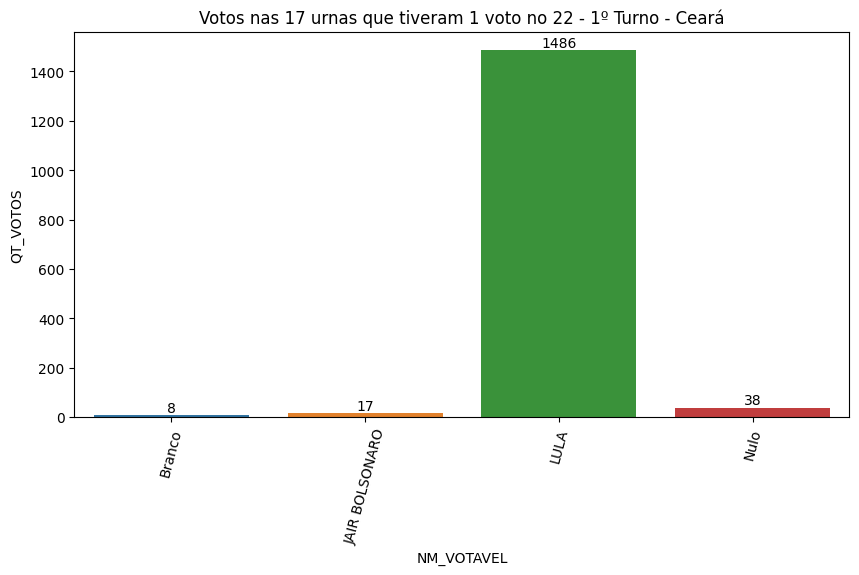

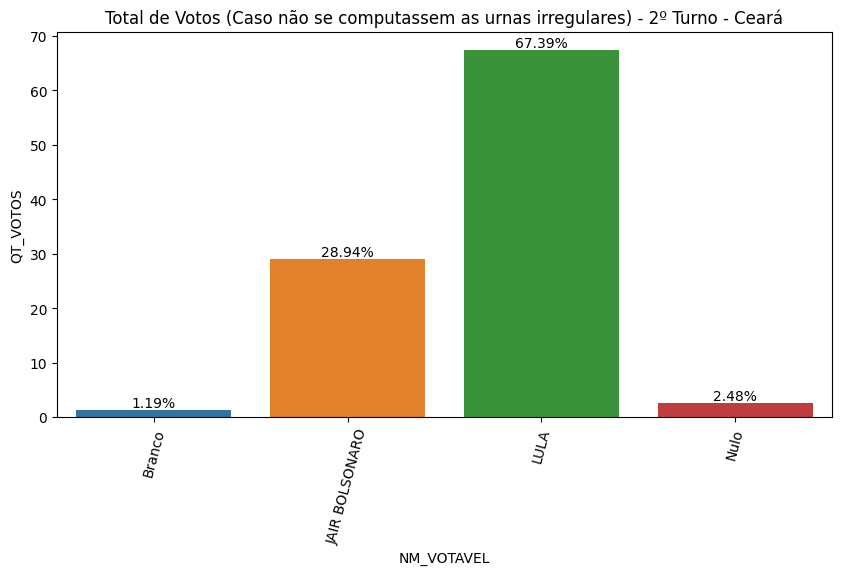

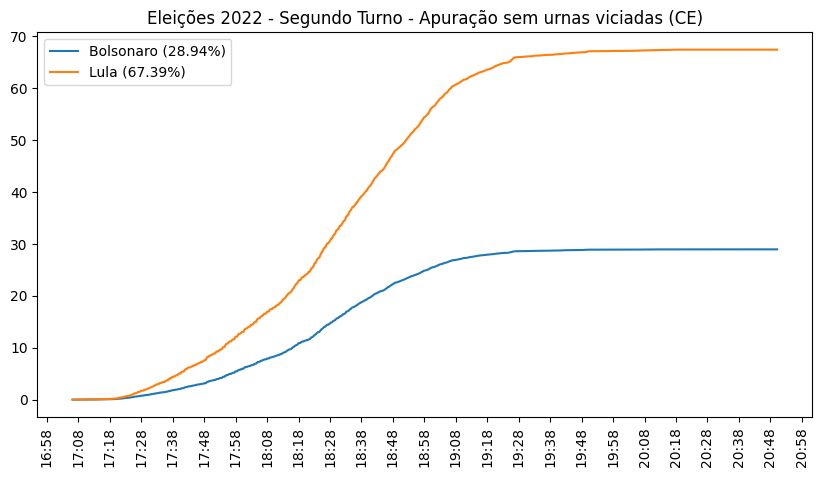

In [56]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2ce, 'Total de Votos - 2º Turno', 'Ceará')
# Total de votos acumulados
gerar_grafico_temporal(df2ce, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'CE')
df2ce_urnas = df2ce[df2ce['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2ce_urnas[df2ce_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2ce_urnas[df2ce_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2ce_urnas_22 = df2ce_urnas[df2ce_urnas['NR_VOTAVEL'] == 22]
print(df2ce_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2ce, df2ce_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2ce_urnas_22, 'Ceará')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2ce_sub = df2ce[~((df2ce['CD_MUNICIPIO'].isin(df2ce_urnas_22['CD_MUNICIPIO'])) & 
                 (df2ce['NR_ZONA'].isin(df2ce_urnas_22['NR_ZONA'])) & 
                 (df2ce['NR_SECAO'].isin(df2ce_urnas_22['NR_SECAO'])) & 
                 (df2ce['NR_LOCAL_VOTACAO'].isin(df2ce_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2ce_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Ceará')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2ce_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'CE')

##### 2.1.1.5 - RIO GRANDE DO NORTE


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 0
Empty DataFrame
Columns: [NM_MUNICIPIO, NR_ZONA, NR_SECAO, NR_LOCAL_VOTACAO]
Index: []


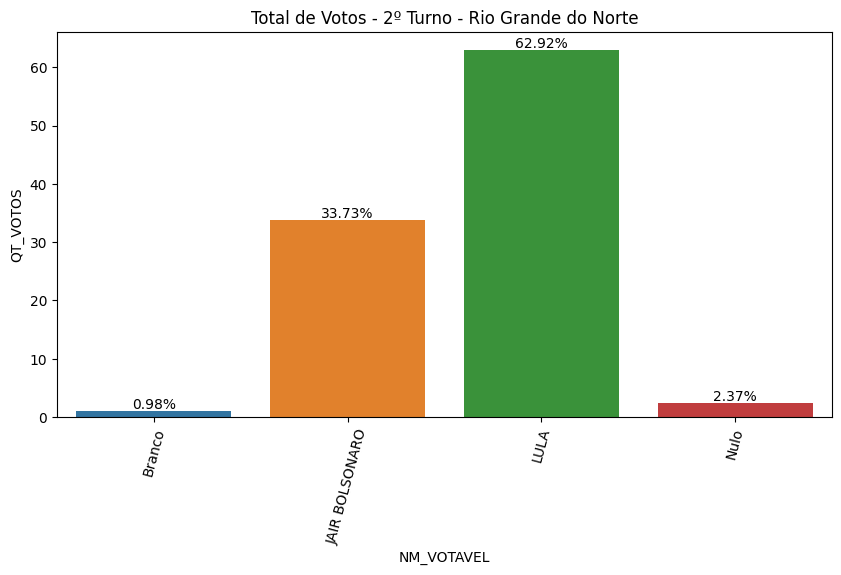

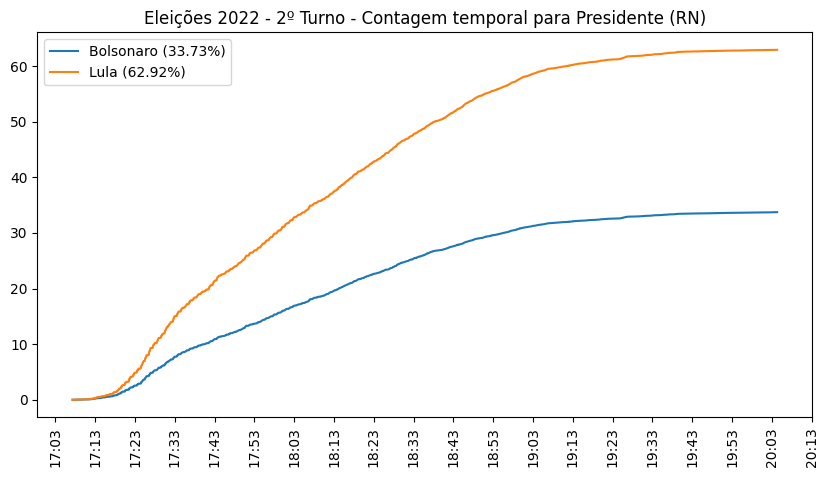

In [57]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2rn, 'Total de Votos - 2º Turno', 'Rio Grande do Norte')
# Total de votos acumulados
gerar_grafico_temporal(df2rn, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'RN')
df2rn_urnas = df2rn[df2rn['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2rn_urnas[df2rn_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2rn_urnas[df2rn_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2rn_urnas_22 = df2rn_urnas[df2rn_urnas['NR_VOTAVEL'] == 22]
print(df2rn_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2rn, df2rn_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2rn_urnas_22, 'Rio Grande do Norte')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2rn_sub = df2rn[~((df2rn['CD_MUNICIPIO'].isin(df2rn_urnas_22['CD_MUNICIPIO'])) & 
                 (df2rn['NR_ZONA'].isin(df2rn_urnas_22['NR_ZONA'])) & 
                 (df2rn['NR_SECAO'].isin(df2rn_urnas_22['NR_SECAO'])) & 
                 (df2rn['NR_LOCAL_VOTACAO'].isin(df2rn_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2rn_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Rio Grande do Norte')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2rn_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'RN')

##### 2.1.1.6 - PARAÍBA


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 3
      NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
34694      TAVARES       34       108              1120
47804      COREMAS       52       101              1171
73804  JOÃO PESSOA       76       389              1864


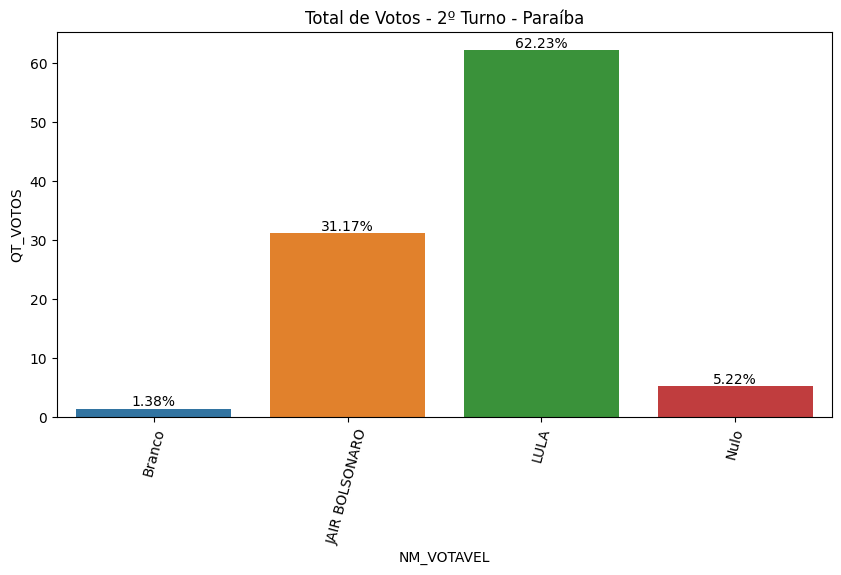

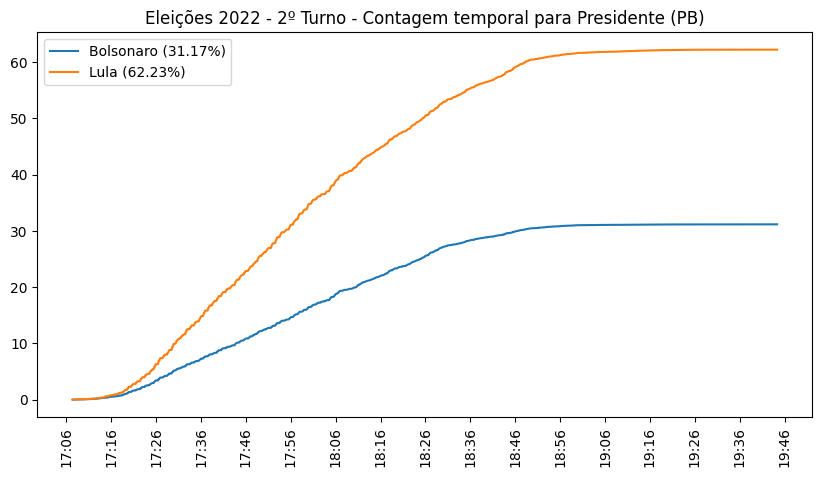

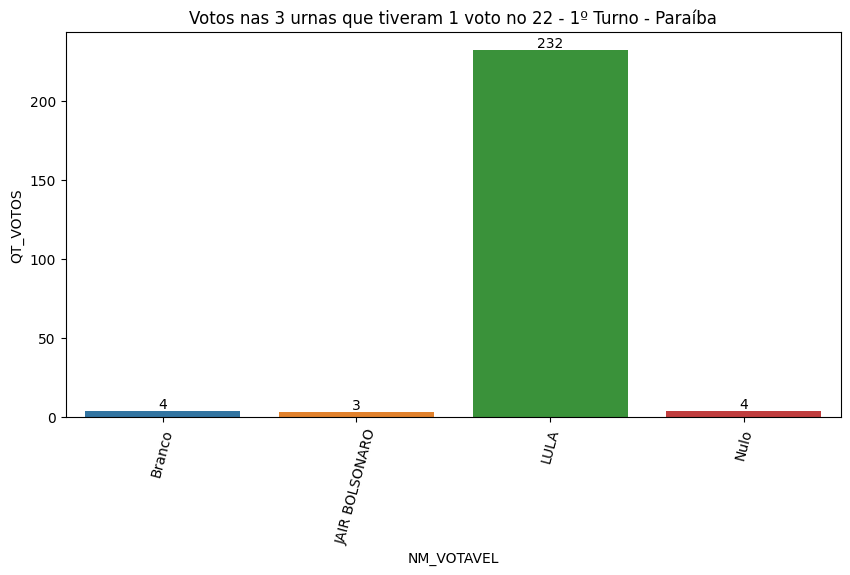

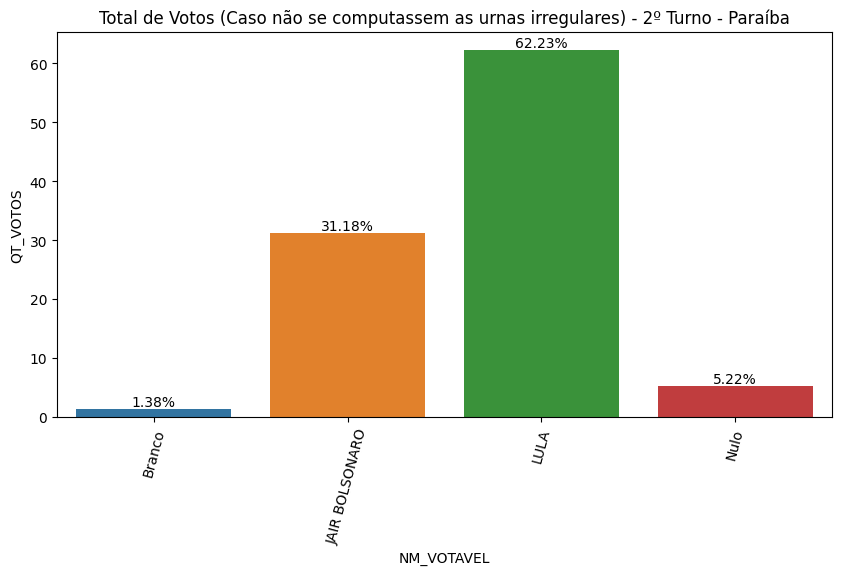

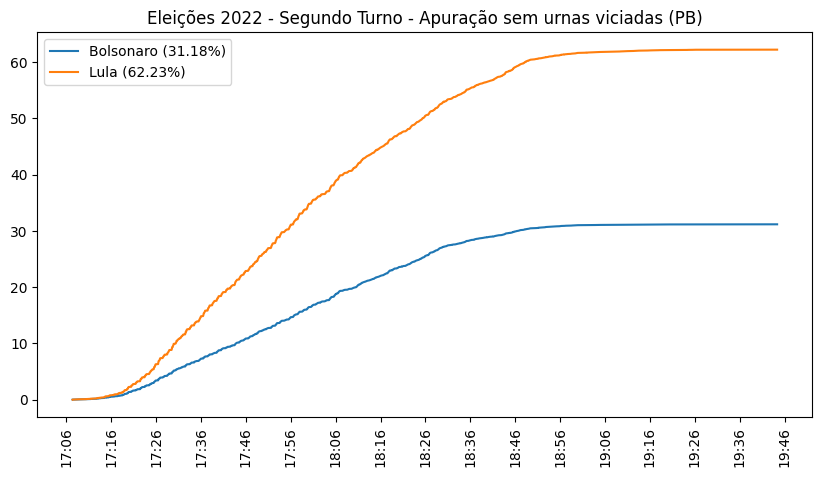

In [58]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2pb, 'Total de Votos - 2º Turno', 'Paraíba')
# Total de votos acumulados
gerar_grafico_temporal(df2pb, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'PB')
df2pb_urnas = df2pb[df2pb['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2pb_urnas[df2pb_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2pb_urnas[df2pb_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2pb_urnas_22 = df2pb_urnas[df2pb_urnas['NR_VOTAVEL'] == 22]
print(df2pb_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2pb, df2pb_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2pb_urnas_22, 'Paraíba')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2pb_sub = df2pb[~((df2pb['CD_MUNICIPIO'].isin(df2pb_urnas_22['CD_MUNICIPIO'])) & 
                 (df2pb['NR_ZONA'].isin(df2pb_urnas_22['NR_ZONA'])) & 
                 (df2pb['NR_SECAO'].isin(df2pb_urnas_22['NR_SECAO'])) & 
                 (df2pb['NR_LOCAL_VOTACAO'].isin(df2pb_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2pb_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Paraíba')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2pb_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'PB')

##### 2.1.1.7 - PERNAMBUCO


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 3
      NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
76329    GARANHUNS       56       524              1902
93725   PARNAMIRIM       78        22              1104
93908   TERRA NOVA       78        50              1376


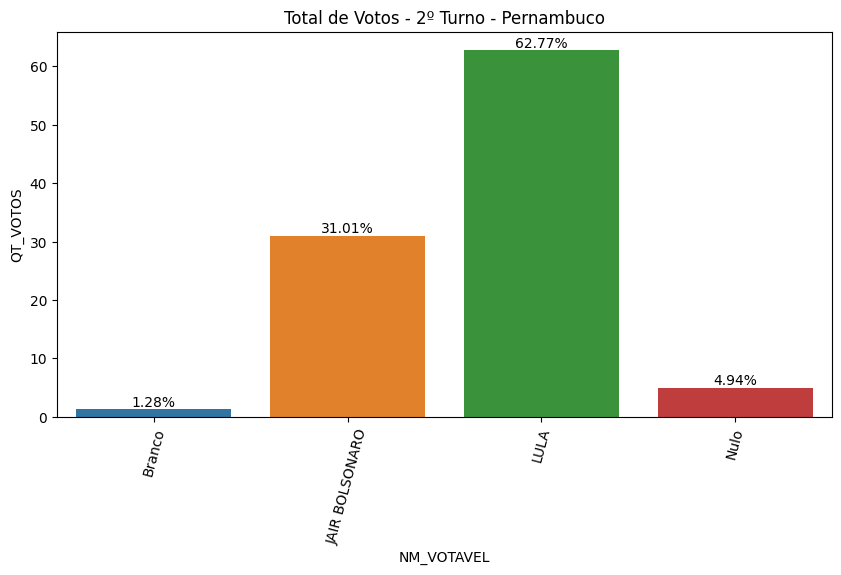

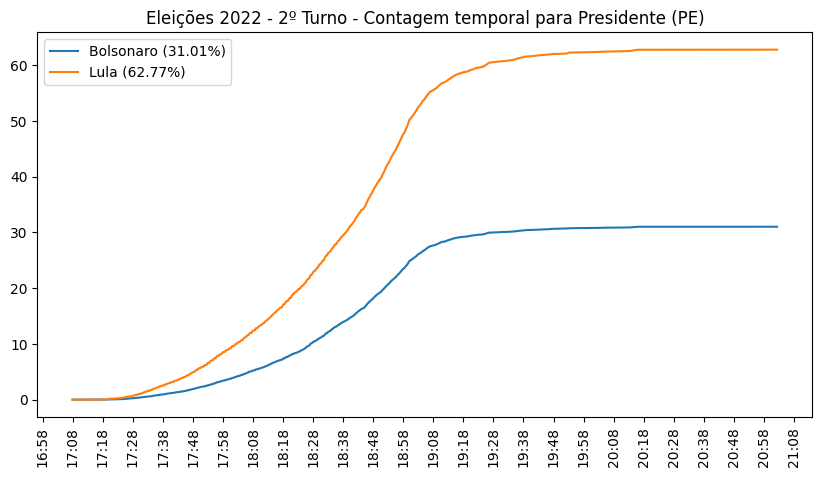

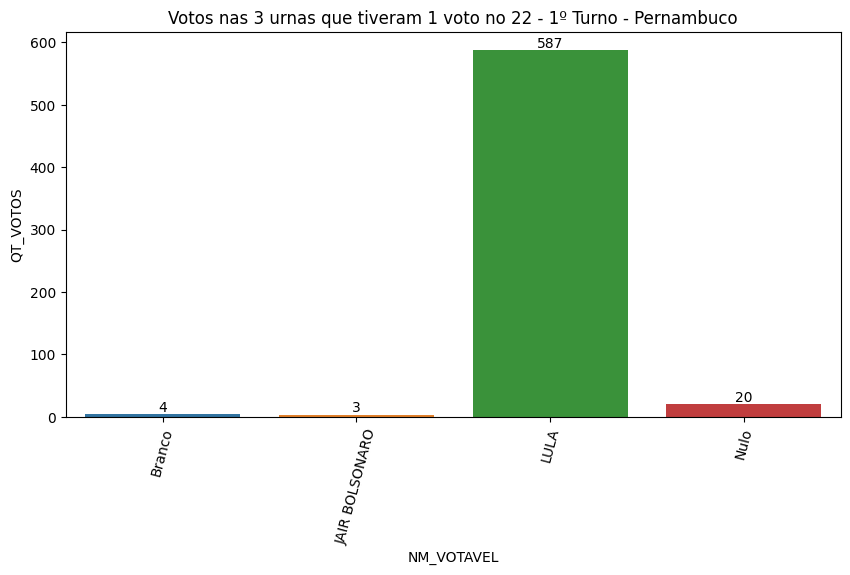

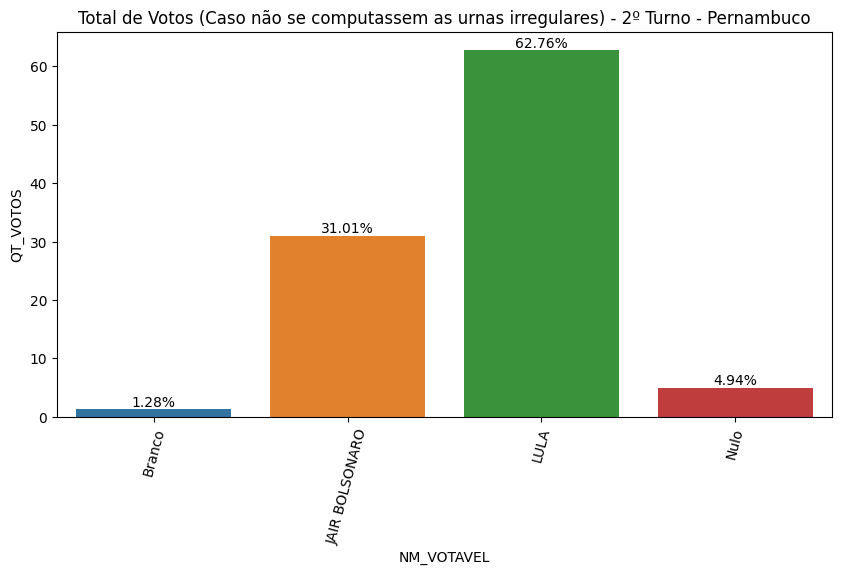

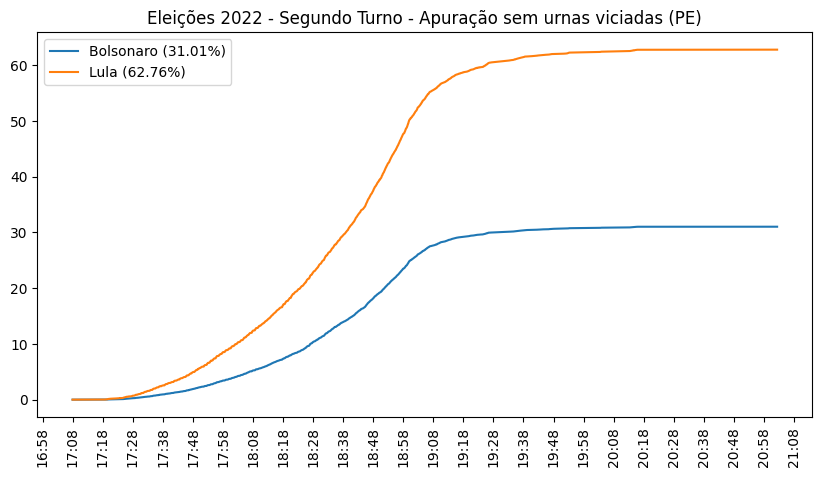

In [61]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2pe, 'Total de Votos - 2º Turno', 'Pernambuco')
# Total de votos acumulados
gerar_grafico_temporal(df2pe, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'PE')
df2pe_urnas = df2pe[df2pe['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2pe_urnas[df2pe_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2pe_urnas[df2pe_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2pe_urnas_22 = df2pe_urnas[df2pe_urnas['NR_VOTAVEL'] == 22]
print(df2pe_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2pe, df2pe_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2pe_urnas_22, 'Pernambuco')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2pe_sub = df2pe[~((df2pe['CD_MUNICIPIO'].isin(df2pe_urnas_22['CD_MUNICIPIO'])) & 
                 (df2pe['NR_ZONA'].isin(df2pe_urnas_22['NR_ZONA'])) & 
                 (df2pe['NR_SECAO'].isin(df2pe_urnas_22['NR_SECAO'])) & 
                 (df2pe['NR_LOCAL_VOTACAO'].isin(df2pe_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2pe_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Pernambuco')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2pe_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'PE')

##### 2.1.1.8 - ALAGOAS


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 0
Empty DataFrame
Columns: [NM_MUNICIPIO, NR_ZONA, NR_SECAO, NR_LOCAL_VOTACAO]
Index: []


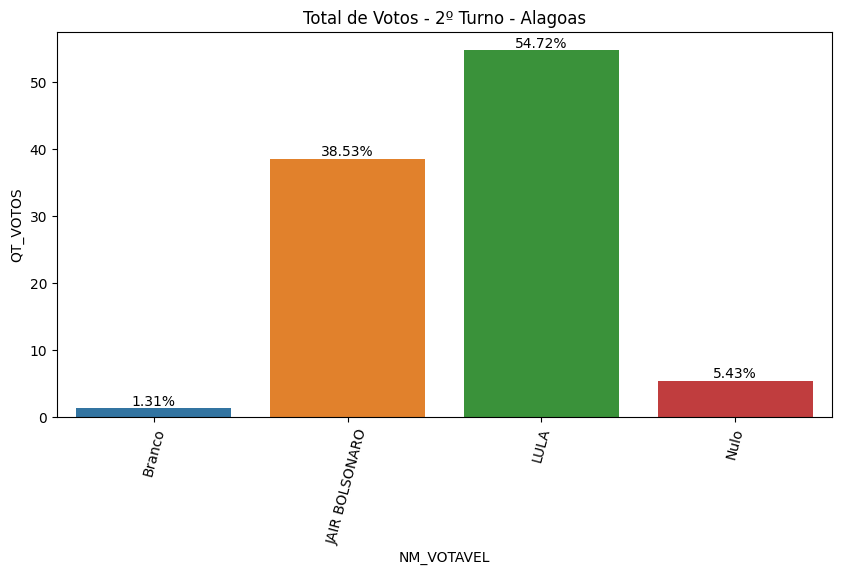

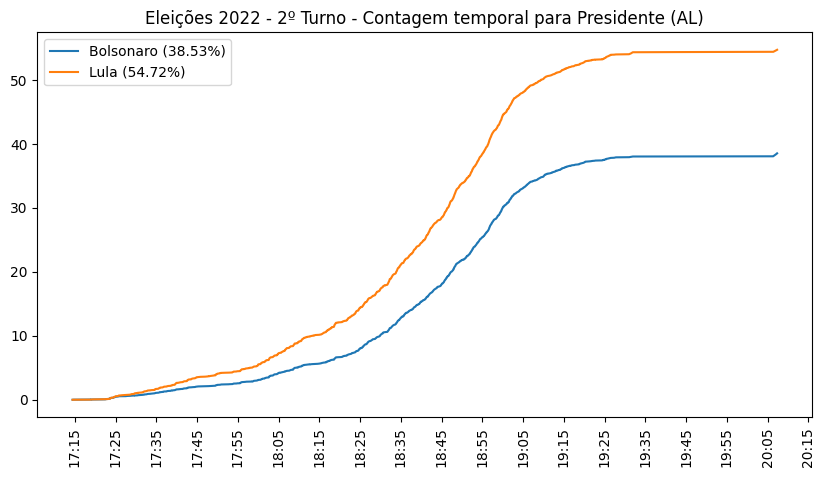

In [62]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2al, 'Total de Votos - 2º Turno', 'Alagoas')
# Total de votos acumulados
gerar_grafico_temporal(df2al, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'AL')
df2al_urnas = df2al[df2al['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2al_urnas[df2al_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2al_urnas[df2al_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2al_urnas_22 = df2al_urnas[df2al_urnas['NR_VOTAVEL'] == 22]
print(df2al_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2al, df2al_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2al_urnas_22, 'Alagoas')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2al_sub = df2al[~((df2al['CD_MUNICIPIO'].isin(df2al_urnas_22['CD_MUNICIPIO'])) & 
                 (df2al['NR_ZONA'].isin(df2al_urnas_22['NR_ZONA'])) & 
                 (df2al['NR_SECAO'].isin(df2al_urnas_22['NR_SECAO'])) & 
                 (df2al['NR_LOCAL_VOTACAO'].isin(df2al_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2al_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Alagoas')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2al_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'AL')

##### 2.1.1.9 - SERGIPE


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 0
Empty DataFrame
Columns: [NM_MUNICIPIO, NR_ZONA, NR_SECAO, NR_LOCAL_VOTACAO]
Index: []


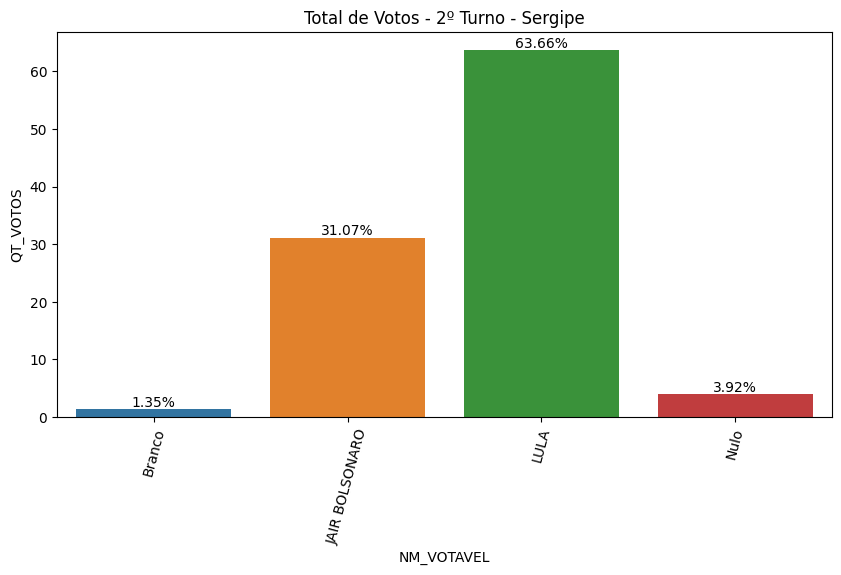

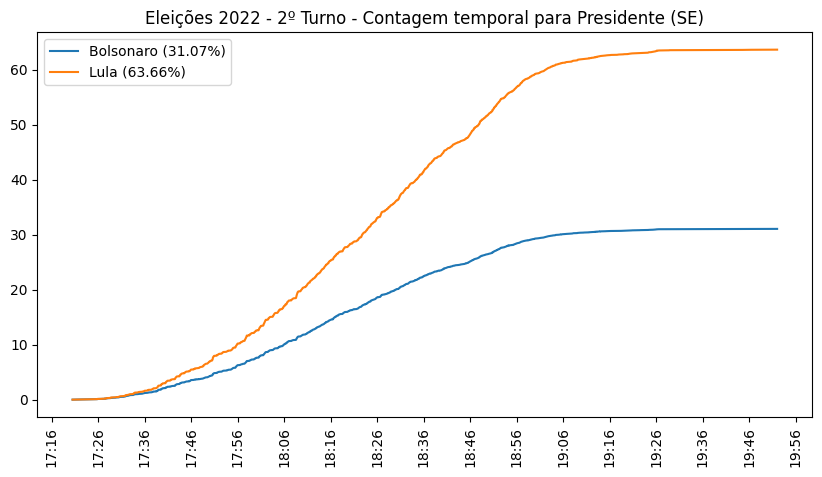

In [63]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2se, 'Total de Votos - 2º Turno', 'Sergipe')
# Total de votos acumulados
gerar_grafico_temporal(df2se, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'SE')
df2se_urnas = df2se[df2se['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2se_urnas[df2se_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2se_urnas[df2se_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2se_urnas_22 = df2se_urnas[df2se_urnas['NR_VOTAVEL'] == 22]
print(df2se_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2se, df2se_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2se_urnas_22, 'Sergipe')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2se_sub = df2se[~((df2se['CD_MUNICIPIO'].isin(df2se_urnas_22['CD_MUNICIPIO'])) & 
                 (df2se['NR_ZONA'].isin(df2se_urnas_22['NR_ZONA'])) & 
                 (df2se['NR_SECAO'].isin(df2se_urnas_22['NR_SECAO'])) & 
                 (df2se['NR_LOCAL_VOTACAO'].isin(df2se_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2se_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Sergipe')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2se_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'SE')

#### 2.1.2 Resutados da Região

Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 125
            NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
78242   SENHOR DO BONFIM       45       310              1872
84661           JANDAÍRA       49       155              1171
89195        PARIPIRANGA       52       182              1155
101743        LAGOA REAL       63       111              1210
105370           BOQUIRA       65       228              1090
...                  ...      ...       ...               ...
47804            COREMAS       52       101              1171
73804        JOÃO PESSOA       76       389              1864
76329          GARANHUNS       56       524              1902
93725         PARNAMIRIM       78        22              1104
93908         TERRA NOVA       78        50              1376

[125 rows x 4 columns]


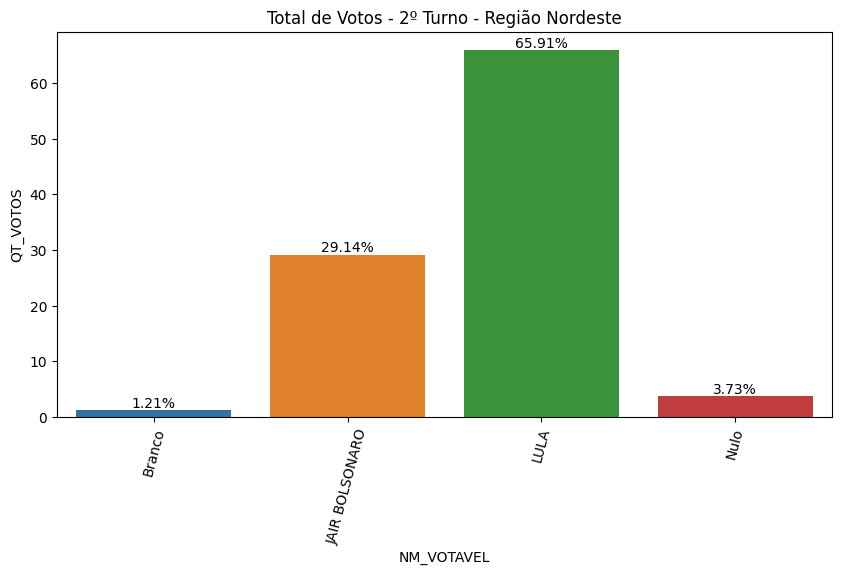

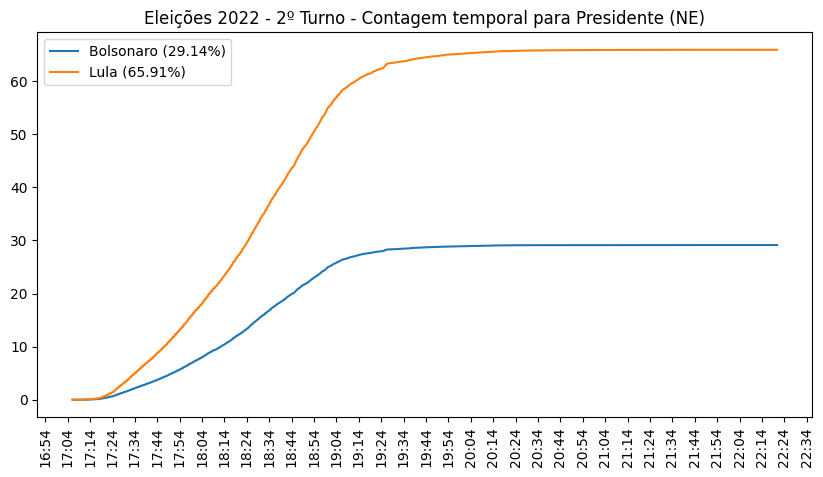

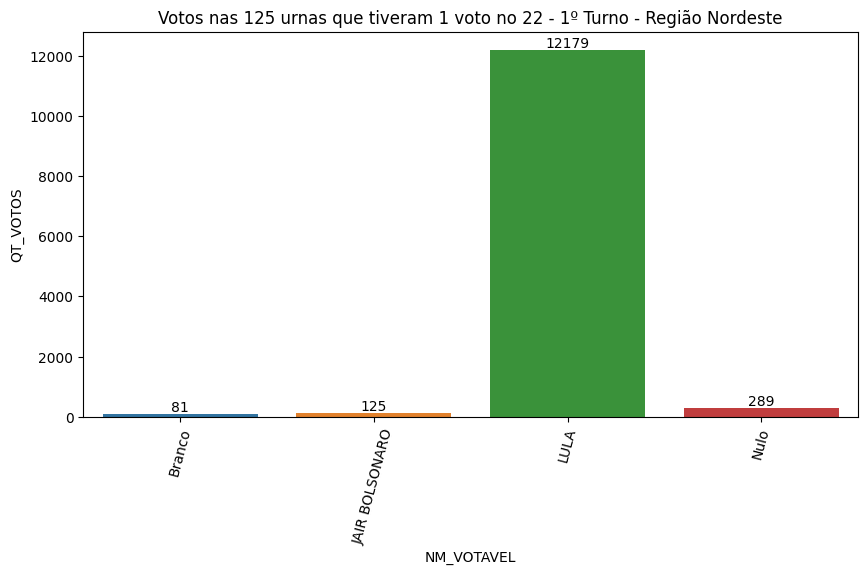

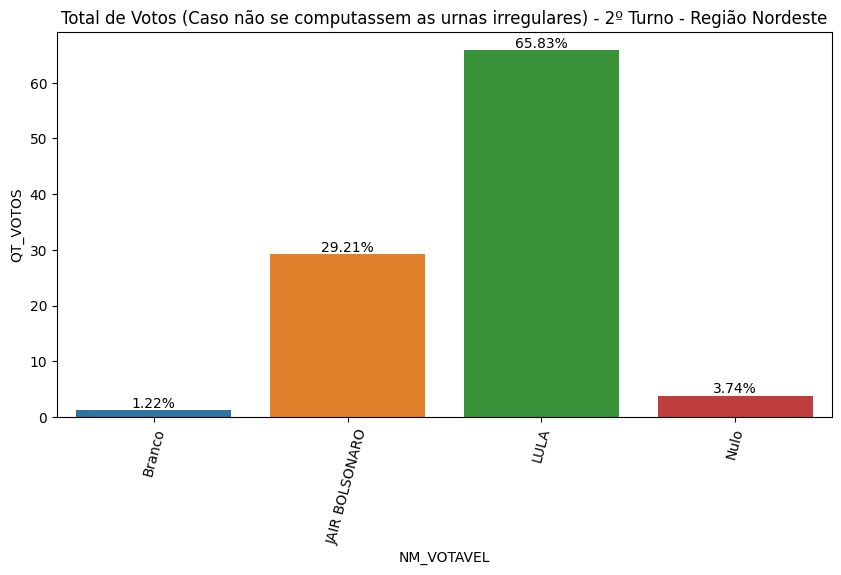

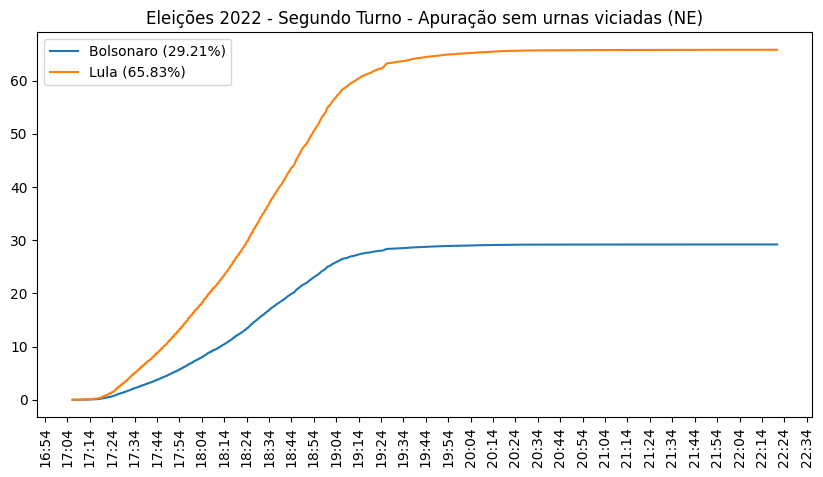

In [65]:
df2ne = pd.concat([df2ba, df2pi, df2ma, df2ce, df2rn, df2pb, df2pe, df2al, df2se])

# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2ne, 'Total de Votos - 2º Turno', 'Região Nordeste')
# Total de votos acumulados
gerar_grafico_temporal(df2ne, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'NE')
df2ne_urnas = df2ne[df2ne['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2ne_urnas[df2ne_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2ne_urnas[df2ne_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2ne_urnas_22 = df2ne_urnas[df2ne_urnas['NR_VOTAVEL'] == 22]
print(df2ne_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2ne, df2ne_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2ne_urnas_22, 'Região Nordeste')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2ne_sub = df2ne[~((df2ne['CD_MUNICIPIO'].isin(df2ne_urnas_22['CD_MUNICIPIO'])) & 
                 (df2ne['NR_ZONA'].isin(df2ne_urnas_22['NR_ZONA'])) & 
                 (df2ne['NR_SECAO'].isin(df2ne_urnas_22['NR_SECAO'])) & 
                 (df2ne['NR_LOCAL_VOTACAO'].isin(df2ne_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2ne_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Região Nordeste')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2ne_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'NE')

### 2.2 - Região NORTE

#### 2.2.1 - Estados

##### 2.2.1.1 - AMAZONAS


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 26
                   NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
6361                URUCURITUBA        3       274              1210
7278                  PARINTINS        4       122              1511
7325                  PARINTINS        4       130              1600
8054                  PARINTINS        4       232              1937
8096                  PARINTINS        4       238              1970
11540                   CODAJÁS        7        46              1678
16311                     BORBA       15        48              1244
17615                   HUMAITÁ       17        57              1252
18185  SÃO GABRIEL DA CACHOEIRA       19         1              1090
18259  SÃO GABRIEL DA CACHOEIRA       19        12              1120
18538  SÃO GABRIEL DA CACHOEIRA       19        70              1520
18557  SÃO GABRIEL DA CACHOEIRA       19        73              1198
19330         BENJAMIN CONSTAN

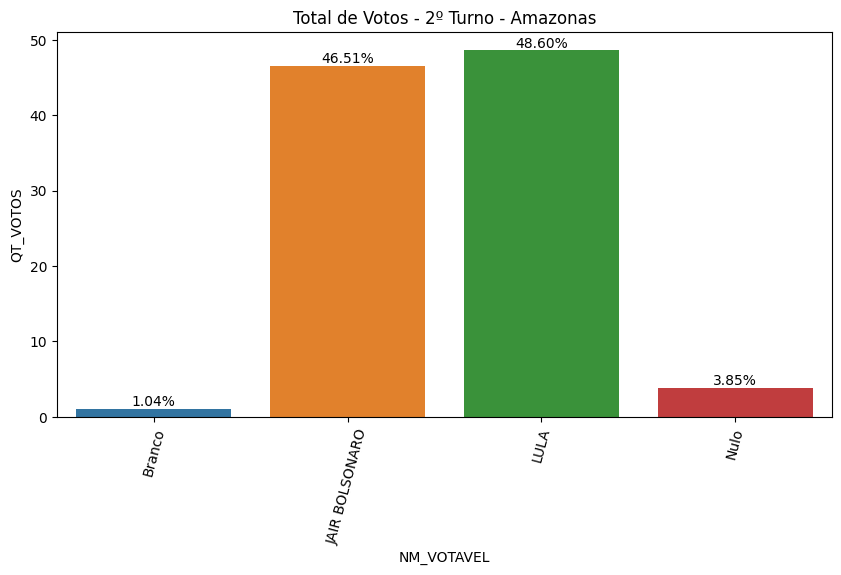

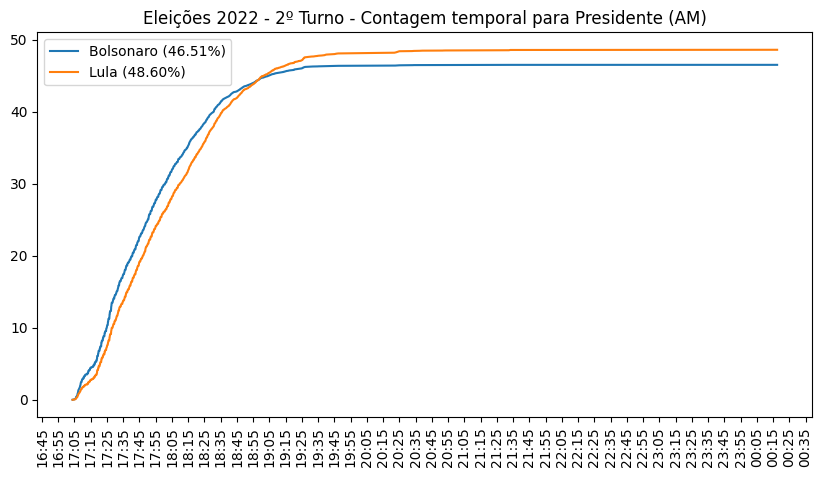

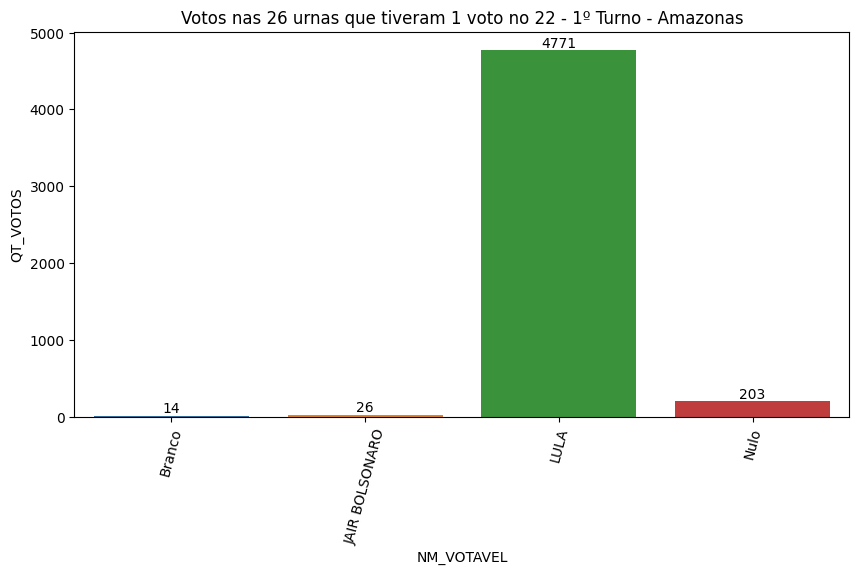

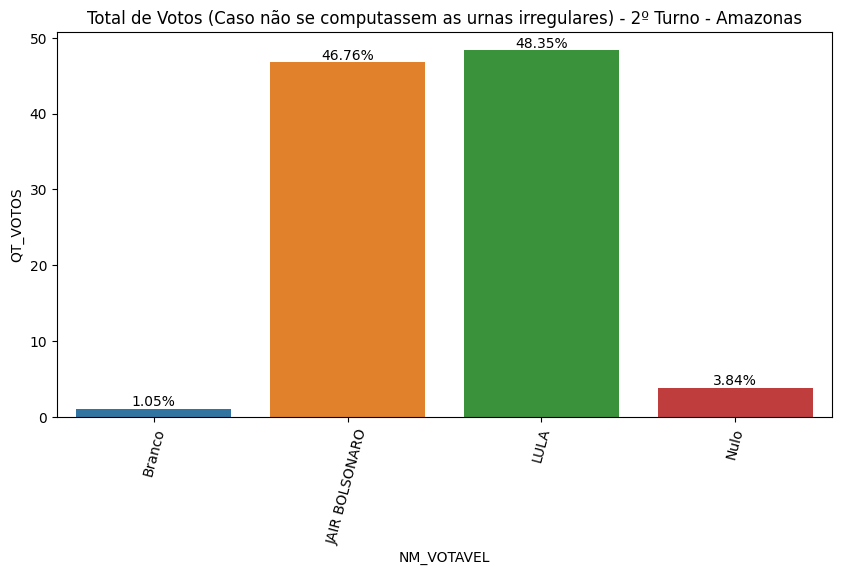

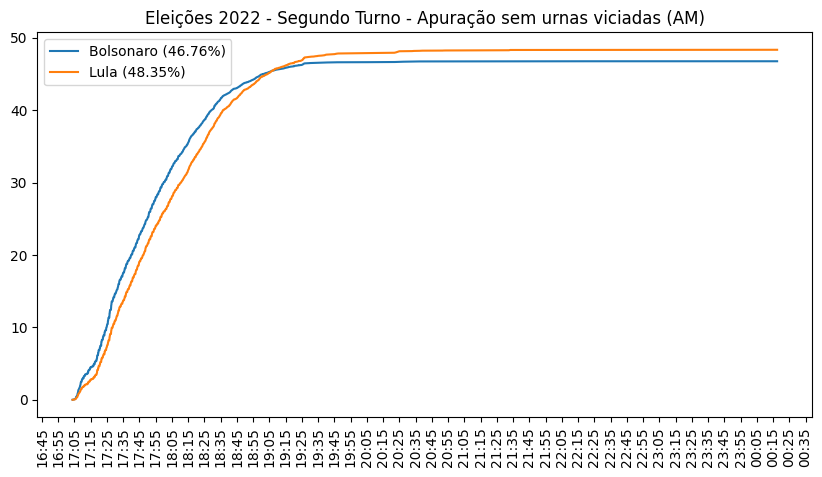

In [66]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2am, 'Total de Votos - 2º Turno', 'Amazonas')
# Total de votos acumulados
gerar_grafico_temporal(df2am, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'AM')
df2am_urnas = df2am[df2am['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2am_urnas[df2am_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2am_urnas[df2am_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2am_urnas_22 = df2am_urnas[df2am_urnas['NR_VOTAVEL'] == 22]
print(df2am_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2am, df2am_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2am_urnas_22, 'Amazonas')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2am_sub = df2am[~((df2am['CD_MUNICIPIO'].isin(df2am_urnas_22['CD_MUNICIPIO'])) & 
                 (df2am['NR_ZONA'].isin(df2am_urnas_22['NR_ZONA'])) & 
                 (df2am['NR_SECAO'].isin(df2am_urnas_22['NR_SECAO'])) & 
                 (df2am['NR_LOCAL_VOTACAO'].isin(df2am_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2am_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Amazonas')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2am_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'AM')

##### 2.2.1.2 - PARÁ


Urnas com 1 voto no candidato 13: 1
Urnas com 1 voto no candidato 22: 20
                   NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
9516                   BRAGANÇA       13       264              2046
10602                     VISEU       14       126              1775
10610                     VISEU       14       128              1724
10902                     VISEU       14       223              2070
16054                     CURUÁ       21       206              1244
16144                  ALENQUER       21       234              2216
16715                    ÓBIDOS       22       261              2151
19801                    GURUPÁ       26        66              1279
27764                      MOJU       37       114              1368
28419                 ORIXIMINÁ       38       127              1457
28662                 ORIXIMINÁ       38       225              1457
28762                 ORIXIMINÁ       38       258              2089
30564       SANTA LUZIA DO PAR

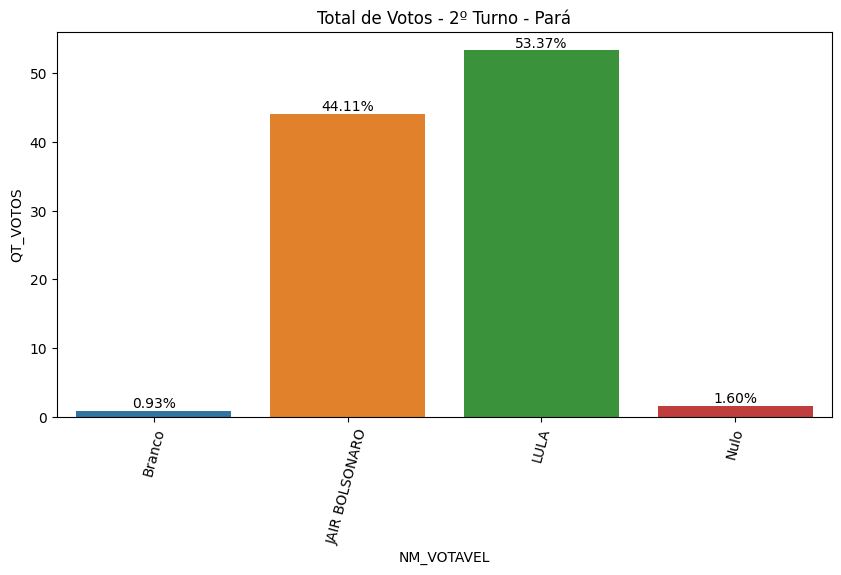

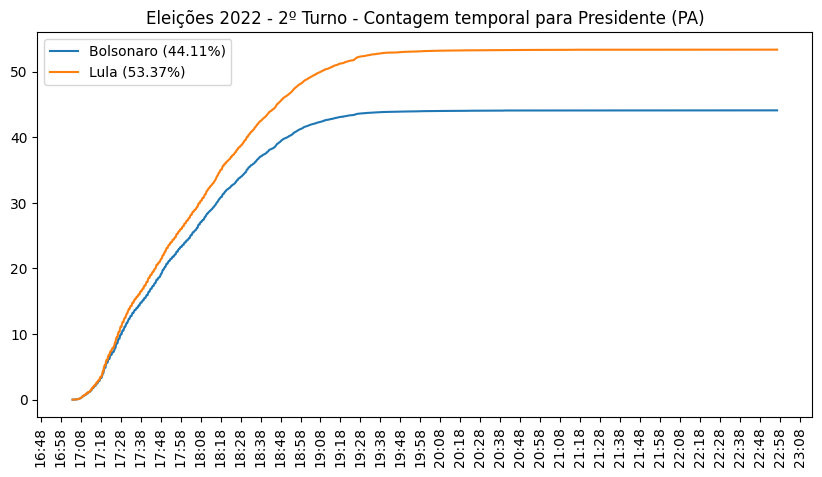

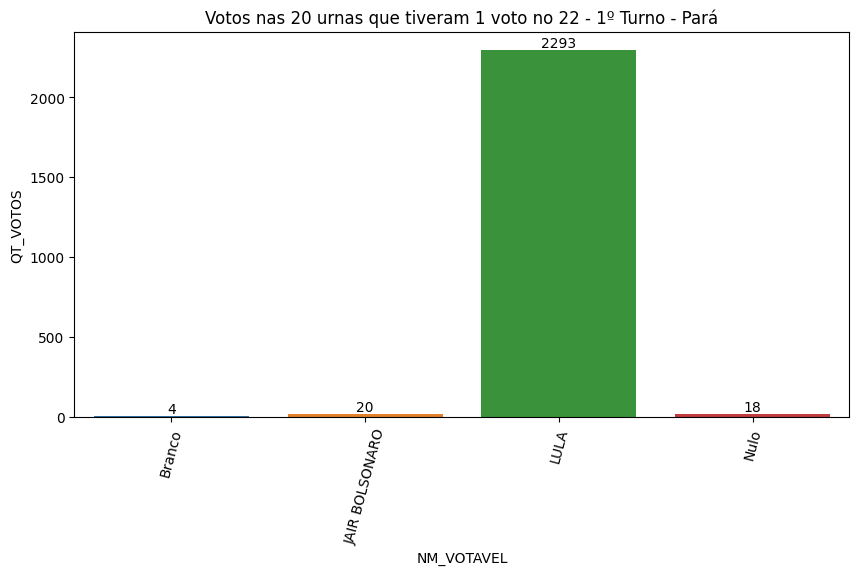

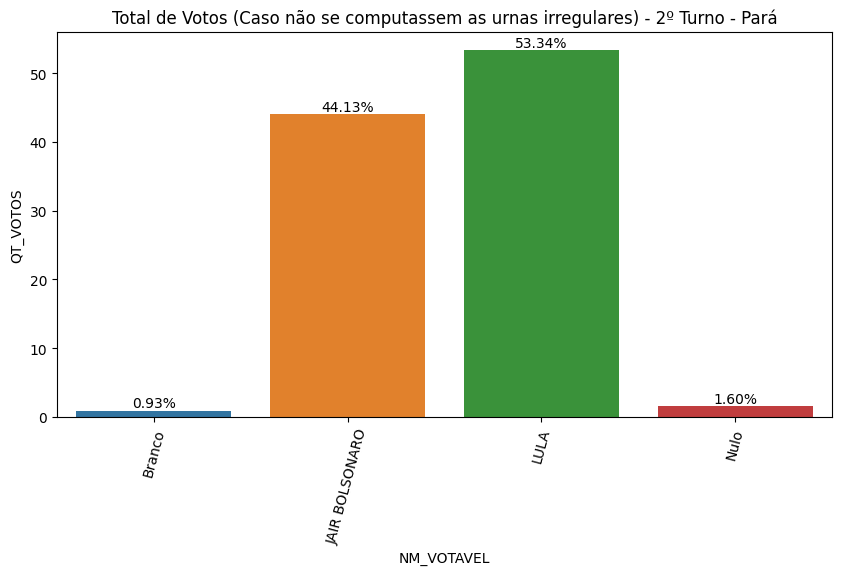

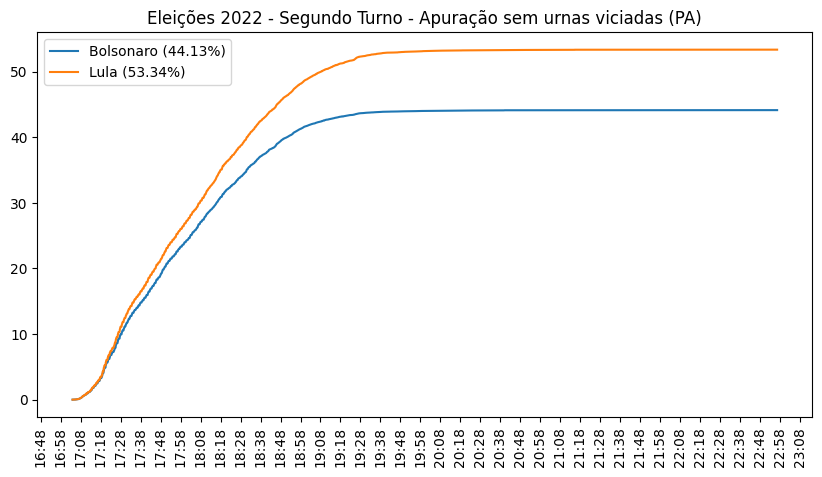

In [67]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2pa, 'Total de Votos - 2º Turno', 'Pará')
# Total de votos acumulados
gerar_grafico_temporal(df2pa, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'PA')
df2pa_urnas = df2pa[df2pa['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2pa_urnas[df2pa_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2pa_urnas[df2pa_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2pa_urnas_22 = df2pa_urnas[df2pa_urnas['NR_VOTAVEL'] == 22]
print(df2pa_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2pa, df2pa_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2pa_urnas_22, 'Pará')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2pa_sub = df2pa[~((df2pa['CD_MUNICIPIO'].isin(df2pa_urnas_22['CD_MUNICIPIO'])) & 
                 (df2pa['NR_ZONA'].isin(df2pa_urnas_22['NR_ZONA'])) & 
                 (df2pa['NR_SECAO'].isin(df2pa_urnas_22['NR_SECAO'])) & 
                 (df2pa['NR_LOCAL_VOTACAO'].isin(df2pa_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2pa_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Pará')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2pa_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'PA')

##### 2.2.1.3- ACRE


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 1
     NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
5477        FEIJÓ        7        69              1341


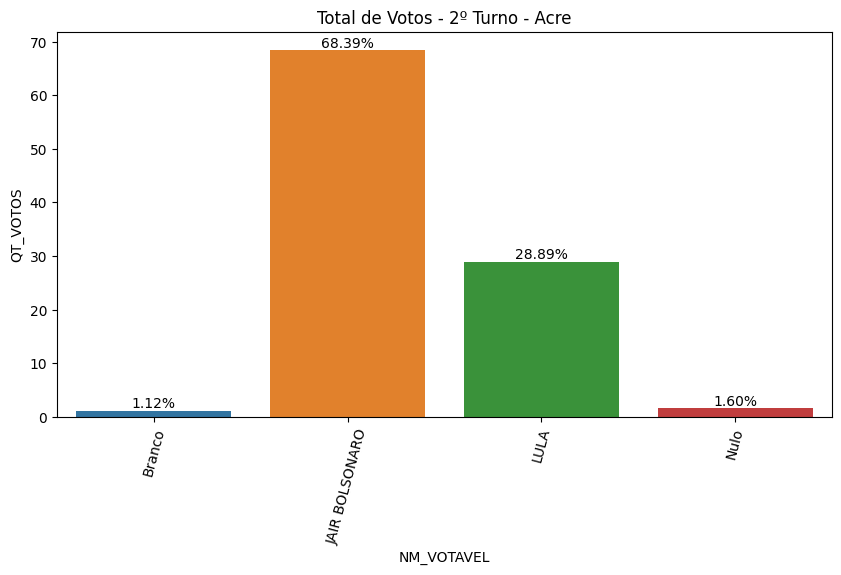

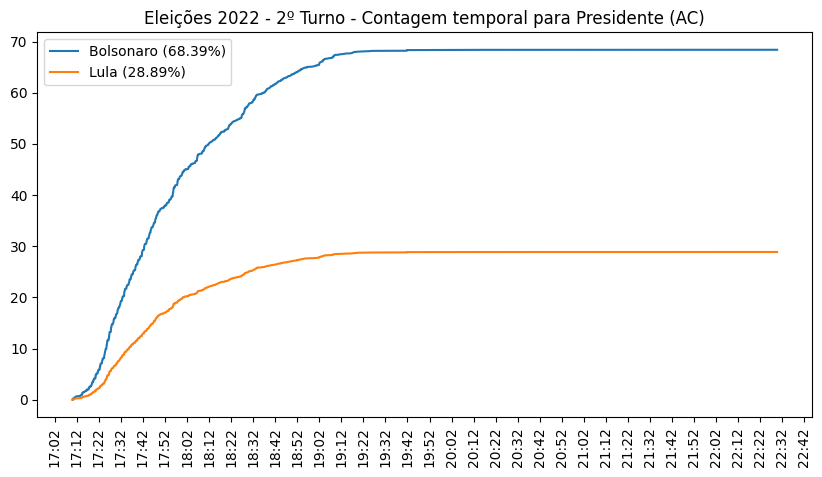

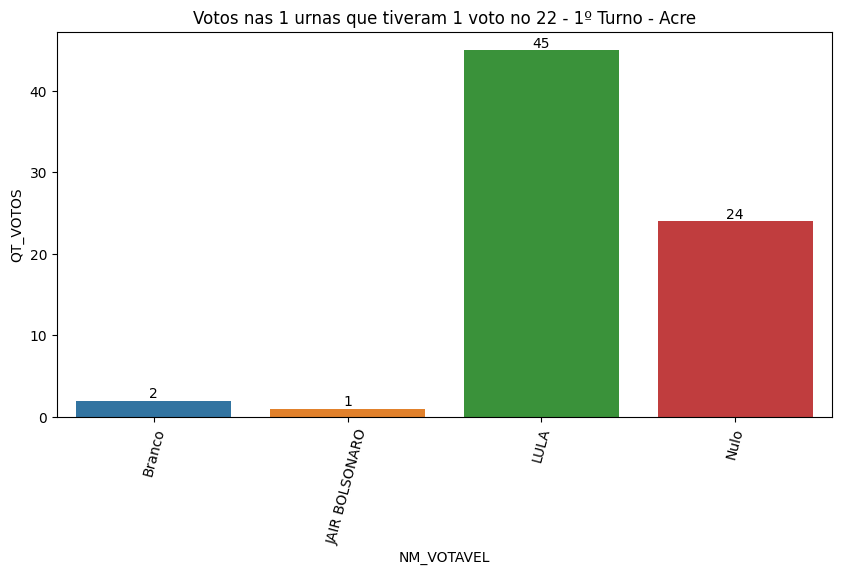

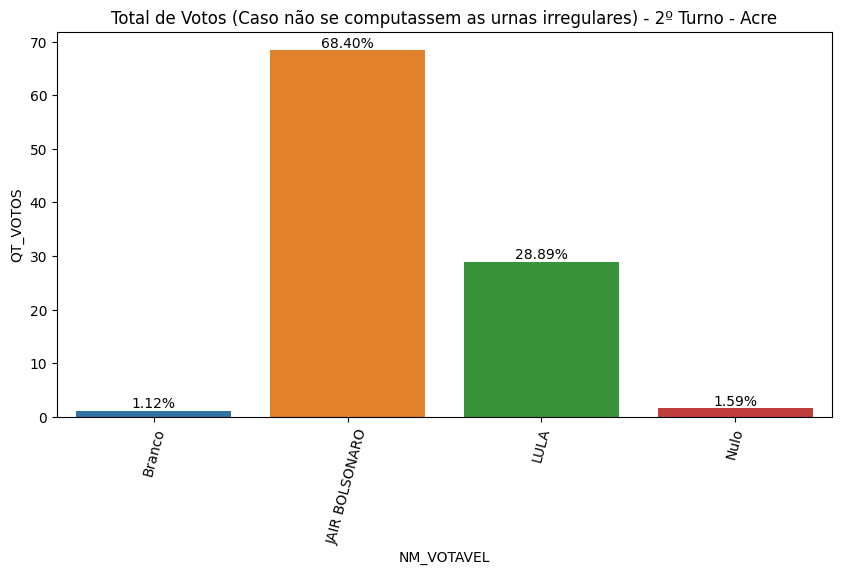

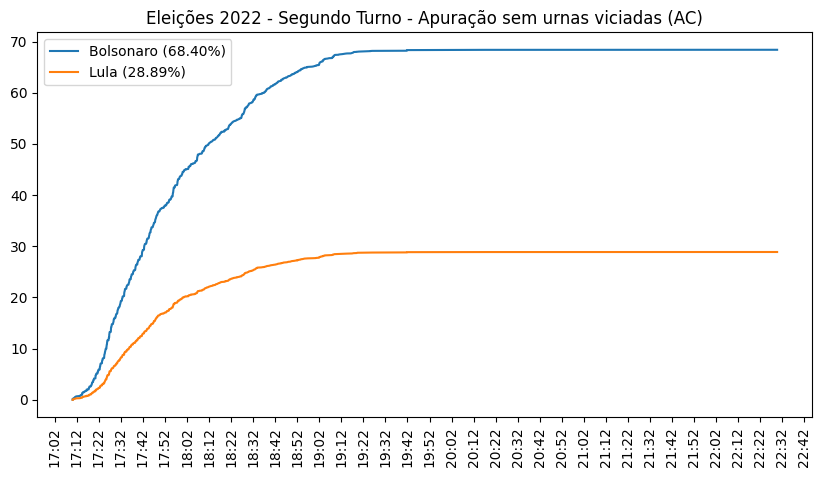

In [68]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2ac, 'Total de Votos - 2º Turno', 'Acre')
# Total de votos acumulados
gerar_grafico_temporal(df2ac, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'AC')
df2ac_urnas = df2ac[df2ac['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2ac_urnas[df2ac_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2ac_urnas[df2ac_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2ac_urnas_22 = df2ac_urnas[df2ac_urnas['NR_VOTAVEL'] == 22]
print(df2ac_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2ac, df2ac_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2ac_urnas_22, 'Acre')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2ac_sub = df2ac[~((df2ac['CD_MUNICIPIO'].isin(df2ac_urnas_22['CD_MUNICIPIO'])) & 
                 (df2ac['NR_ZONA'].isin(df2ac_urnas_22['NR_ZONA'])) & 
                 (df2ac['NR_SECAO'].isin(df2ac_urnas_22['NR_SECAO'])) & 
                 (df2ac['NR_LOCAL_VOTACAO'].isin(df2ac_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2ac_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Acre')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2ac_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'AC')

##### 2.2.1.4 - RONDÔNIA


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 1
        NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
13557  PIMENTA BUENO        9       999              1309


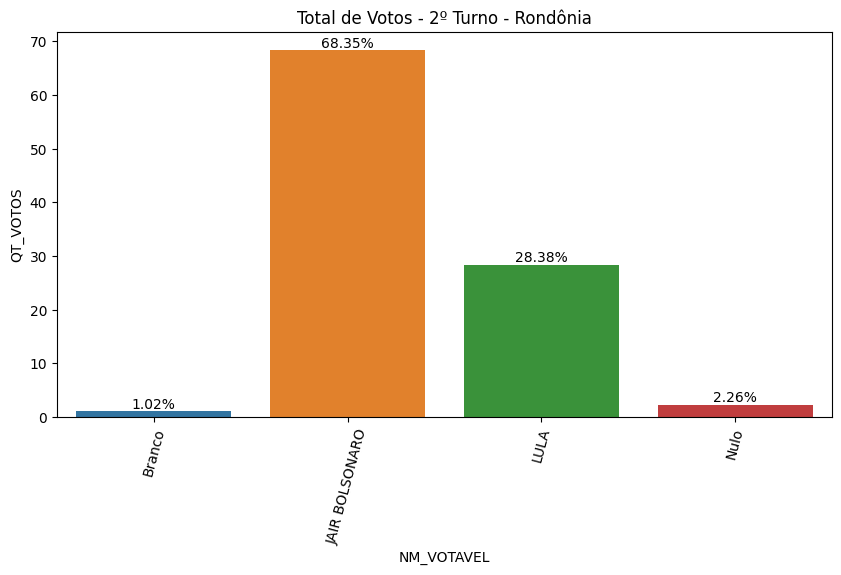

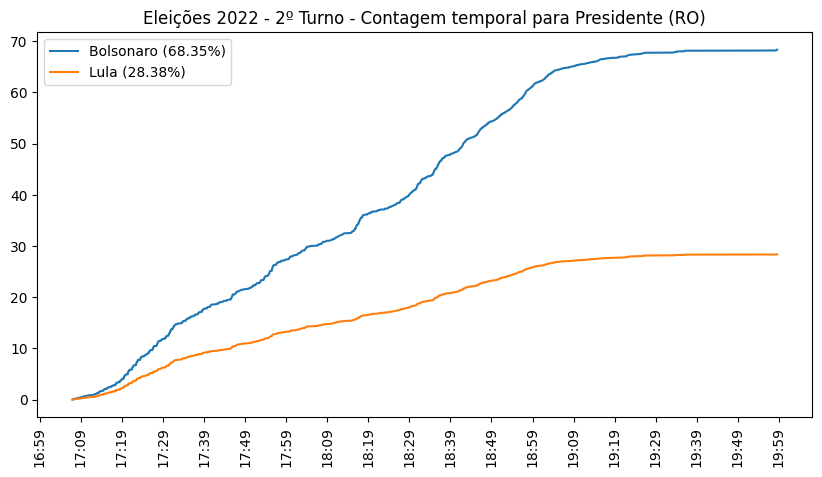

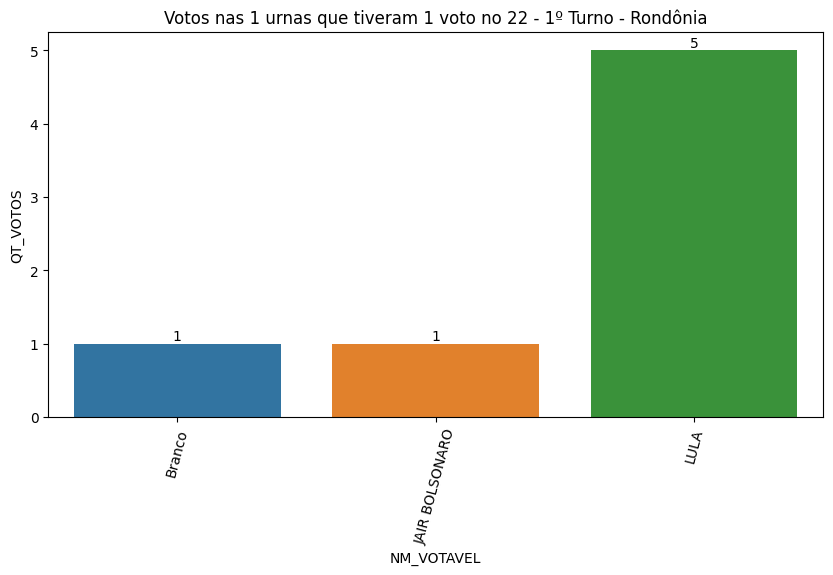

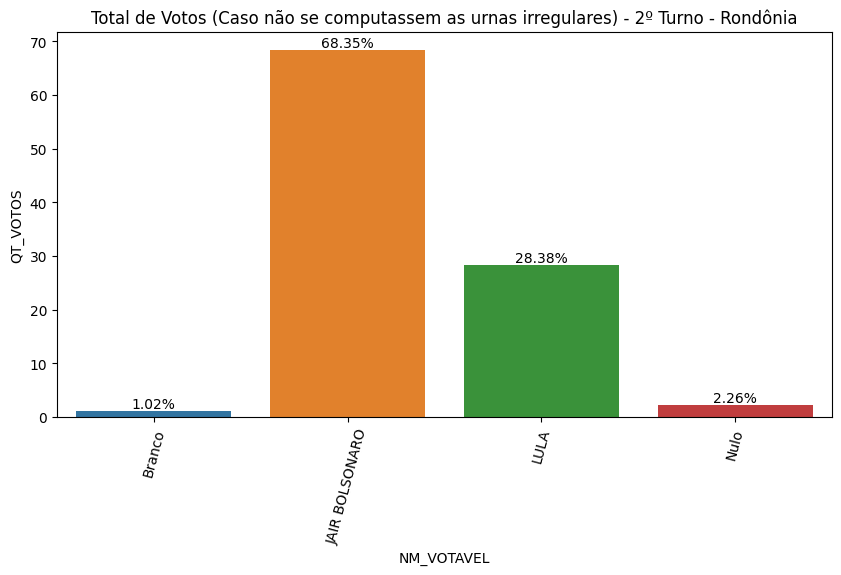

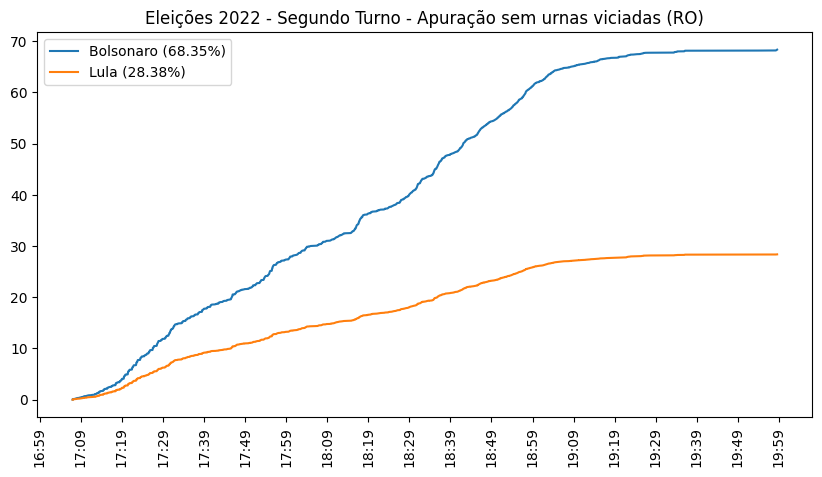

In [69]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2ro, 'Total de Votos - 2º Turno', 'Rondônia')
# Total de votos acumulados
gerar_grafico_temporal(df2ro, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'RO')
df2ro_urnas = df2ro[df2ro['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2ro_urnas[df2ro_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2ro_urnas[df2ro_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2ro_urnas_22 = df2ro_urnas[df2ro_urnas['NR_VOTAVEL'] == 22]
print(df2ro_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2ro, df2ro_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2ro_urnas_22, 'Rondônia')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2ro_sub = df2ro[~((df2ro['CD_MUNICIPIO'].isin(df2ro_urnas_22['CD_MUNICIPIO'])) & 
                 (df2ro['NR_ZONA'].isin(df2ro_urnas_22['NR_ZONA'])) & 
                 (df2ro['NR_SECAO'].isin(df2ro_urnas_22['NR_SECAO'])) & 
                 (df2ro['NR_LOCAL_VOTACAO'].isin(df2ro_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2ro_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Rondônia')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2ro_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'RO')

##### 2.2.1.5 - RORAIMA


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 4
     NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
2120     SÃO LUIZ        4        67              1155
4197     UIRAMUTÃ        7        61              1120
4200     UIRAMUTÃ        7        62              1139
4304     UIRAMUTÃ        7       104              1198


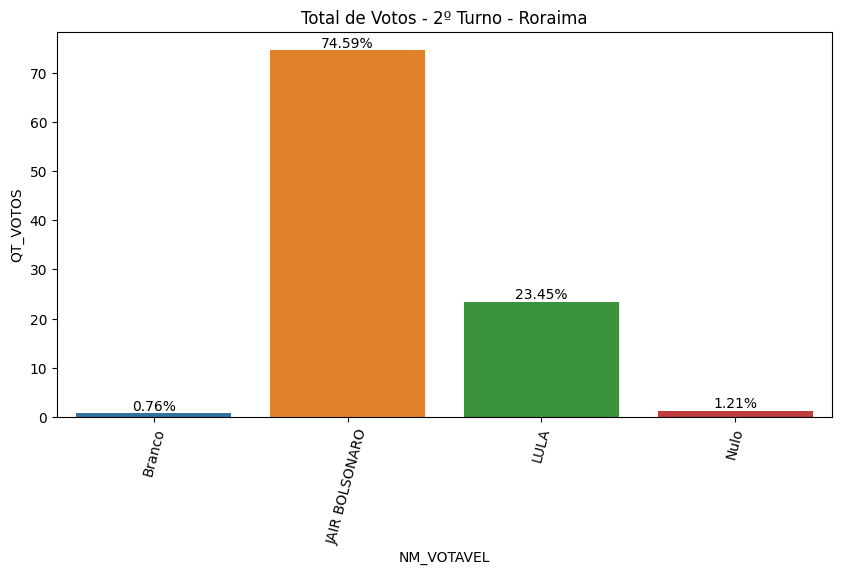

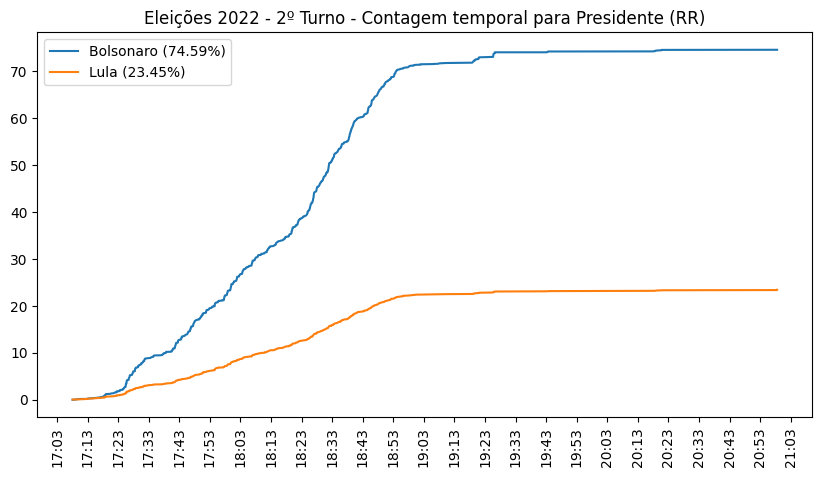

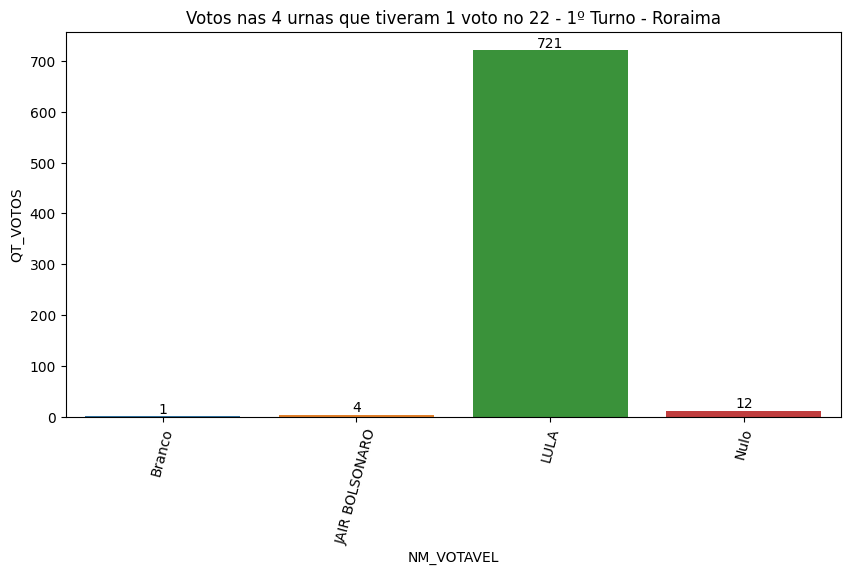

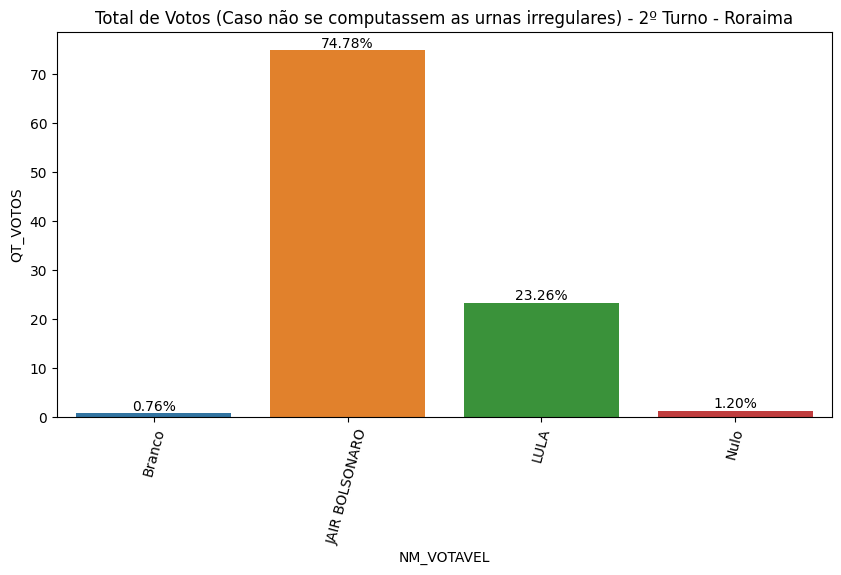

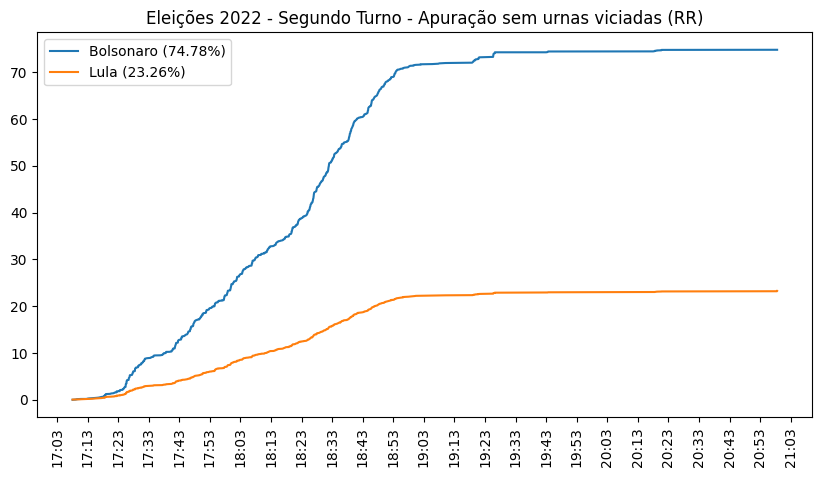

In [70]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2rr, 'Total de Votos - 2º Turno', 'Roraima')
# Total de votos acumulados
gerar_grafico_temporal(df2rr, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'RR')
df2rr_urnas = df2rr[df2rr['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2rr_urnas[df2rr_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2rr_urnas[df2rr_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2rr_urnas_22 = df2rr_urnas[df2rr_urnas['NR_VOTAVEL'] == 22]
print(df2rr_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2rr, df2rr_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2rr_urnas_22, 'Roraima')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2rr_sub = df2rr[~((df2rr['CD_MUNICIPIO'].isin(df2rr_urnas_22['CD_MUNICIPIO'])) & 
                 (df2rr['NR_ZONA'].isin(df2rr_urnas_22['NR_ZONA'])) & 
                 (df2rr['NR_SECAO'].isin(df2rr_urnas_22['NR_SECAO'])) & 
                 (df2rr['NR_LOCAL_VOTACAO'].isin(df2rr_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2rr_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Roraima')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2rr_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'RR')

##### 2.2.1.6 - AMAPÁ


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 1
                 NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
6268  PEDRA BRANCA DO AMAPARI       11        26              1058


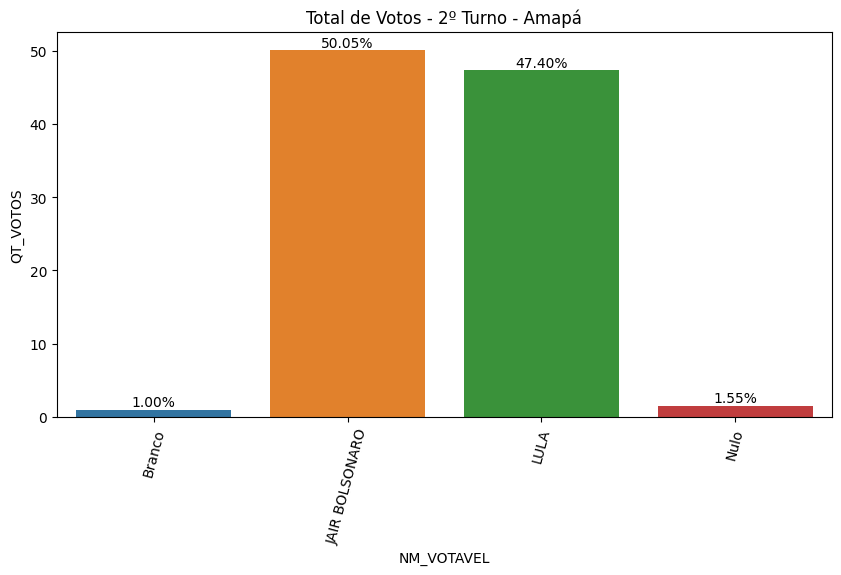

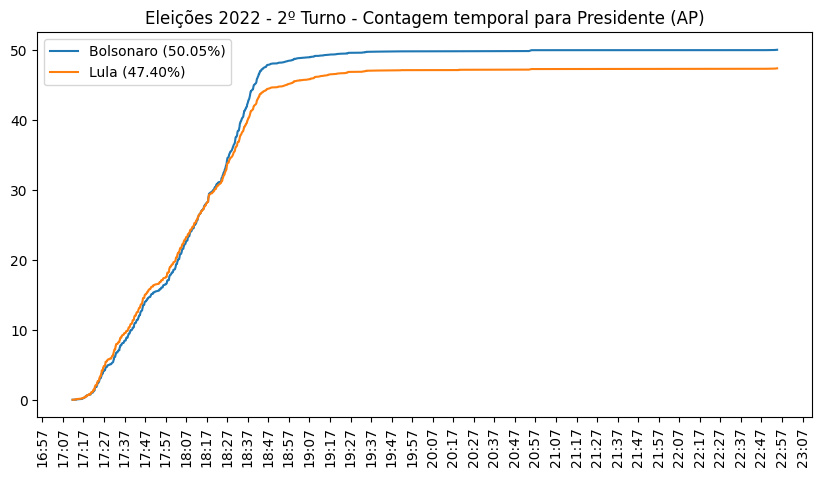

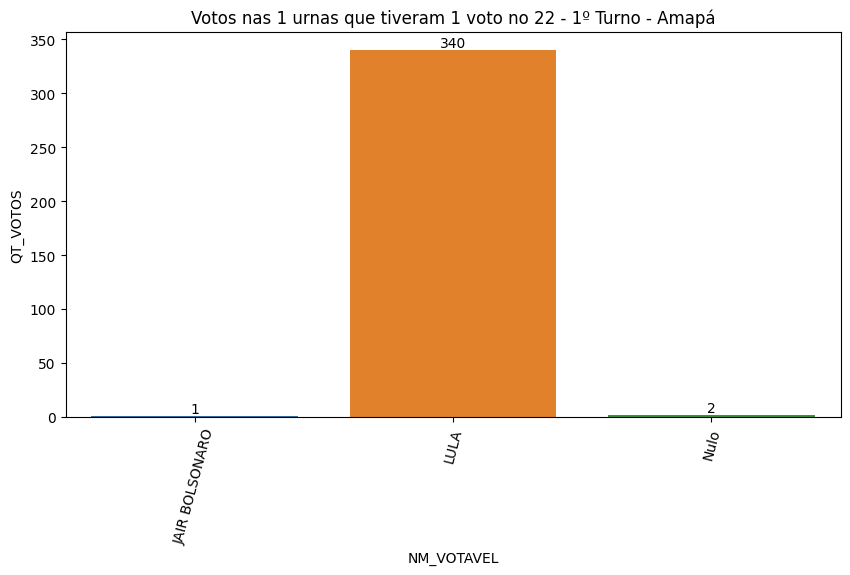

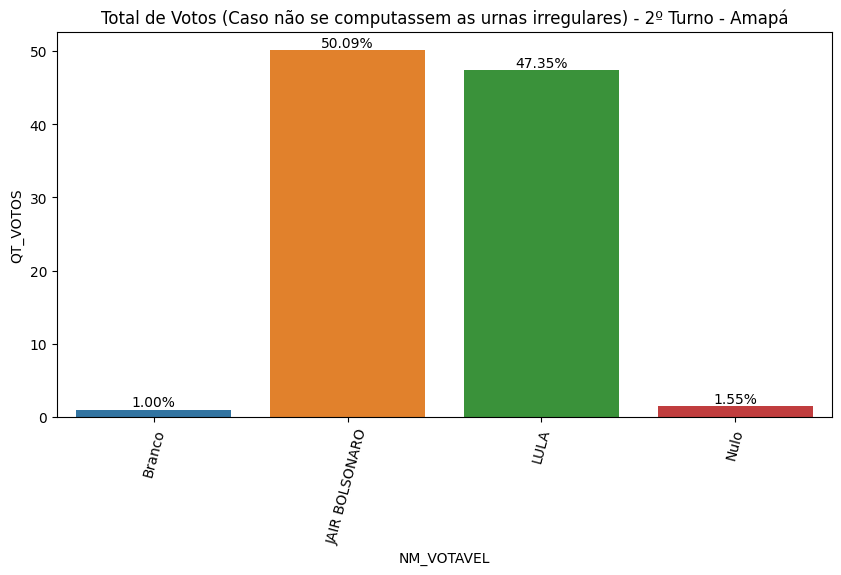

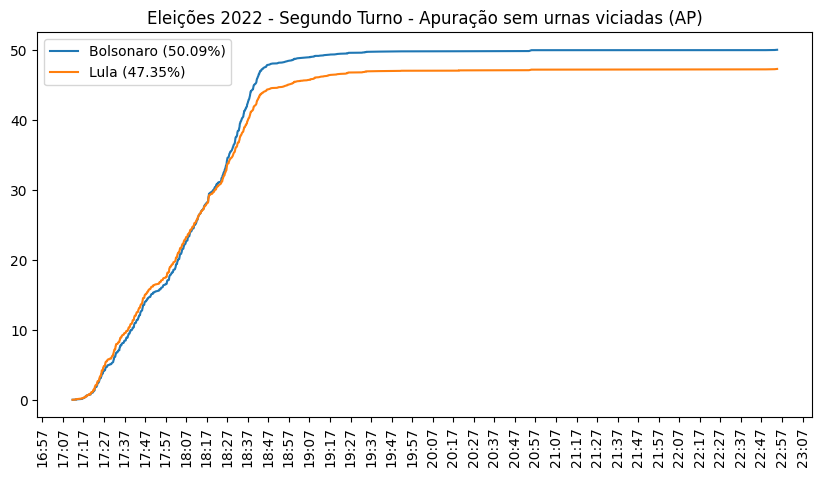

In [71]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2ap, 'Total de Votos - 2º Turno', 'Amapá')
# Total de votos acumulados
gerar_grafico_temporal(df2ap, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'AP')
df2ap_urnas = df2ap[df2ap['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2ap_urnas[df2ap_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2ap_urnas[df2ap_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2ap_urnas_22 = df2ap_urnas[df2ap_urnas['NR_VOTAVEL'] == 22]
print(df2ap_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2ap, df2ap_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2ap_urnas_22, 'Amapá')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2ap_sub = df2ap[~((df2ap['CD_MUNICIPIO'].isin(df2ap_urnas_22['CD_MUNICIPIO'])) & 
                 (df2ap['NR_ZONA'].isin(df2ap_urnas_22['NR_ZONA'])) & 
                 (df2ap['NR_SECAO'].isin(df2ap_urnas_22['NR_SECAO'])) & 
                 (df2ap['NR_LOCAL_VOTACAO'].isin(df2ap_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2ap_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Amapá')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2ap_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'AP')

##### 2.2.1.7 - TOCANTINS


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 1
        NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
5395  TOCANTINÓPOLIS        9       133              1252


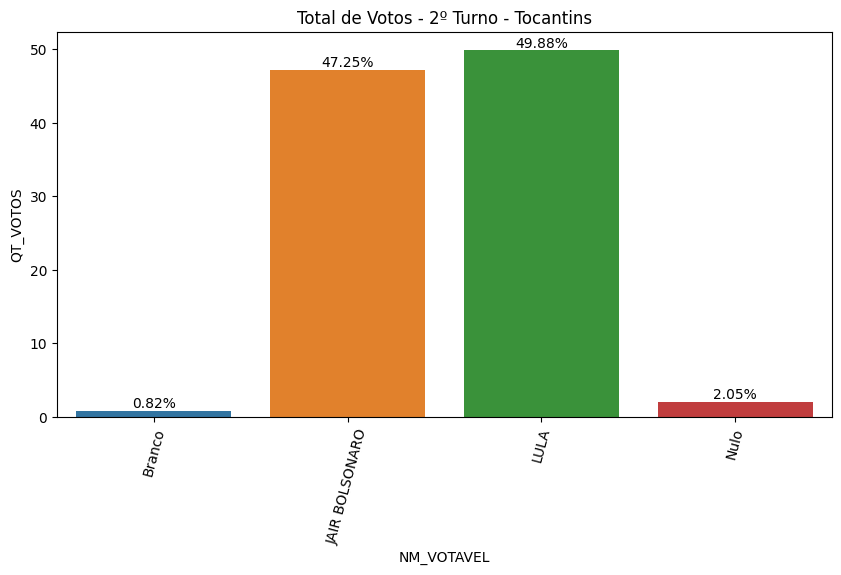

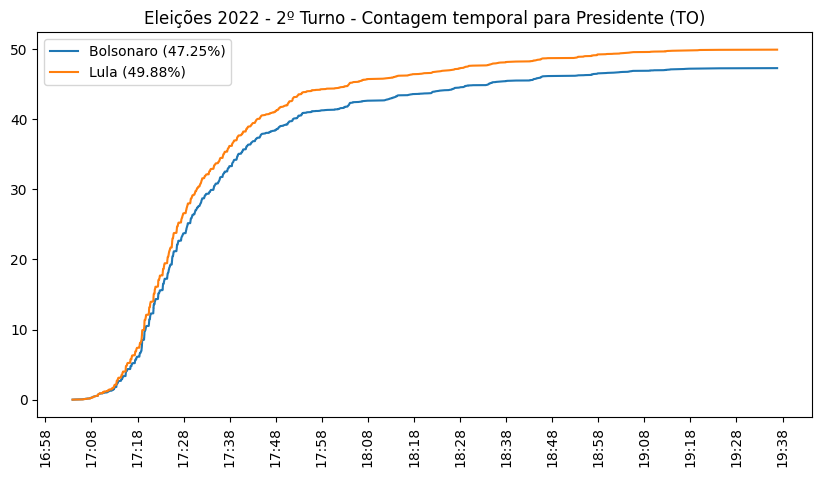

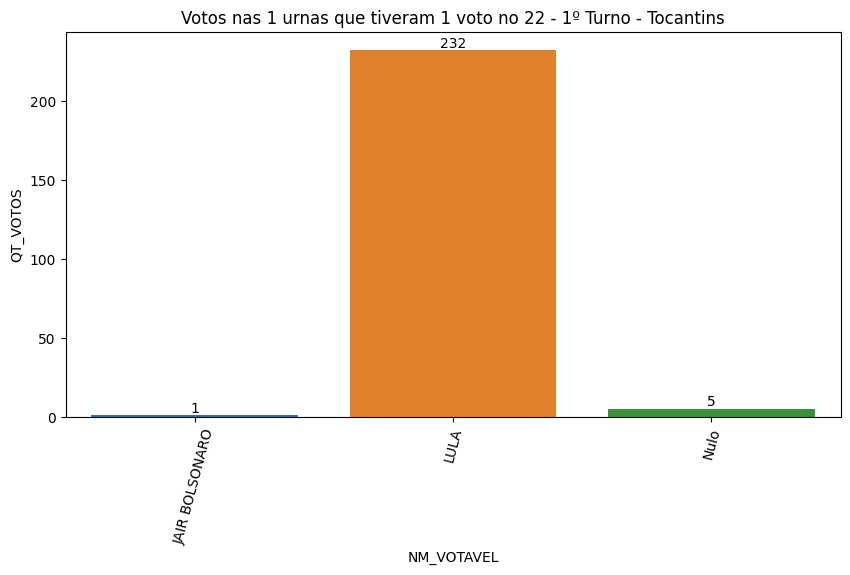

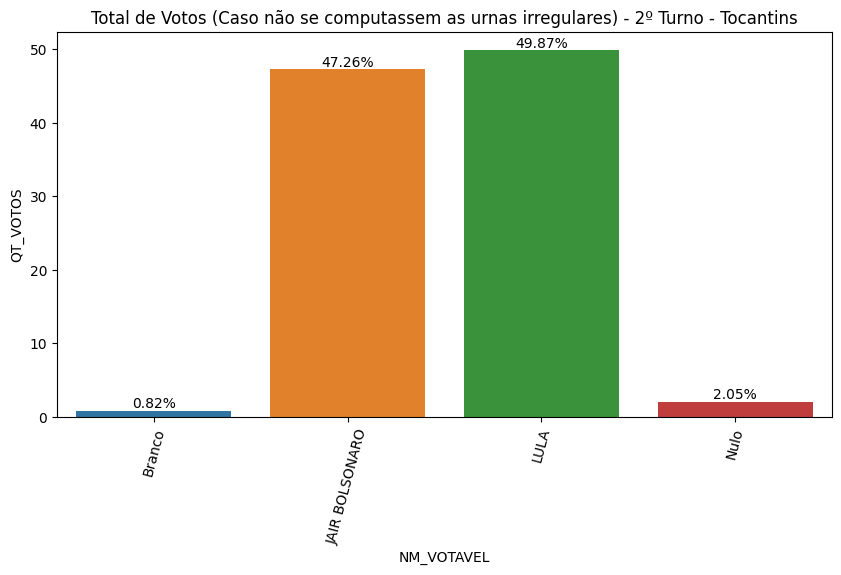

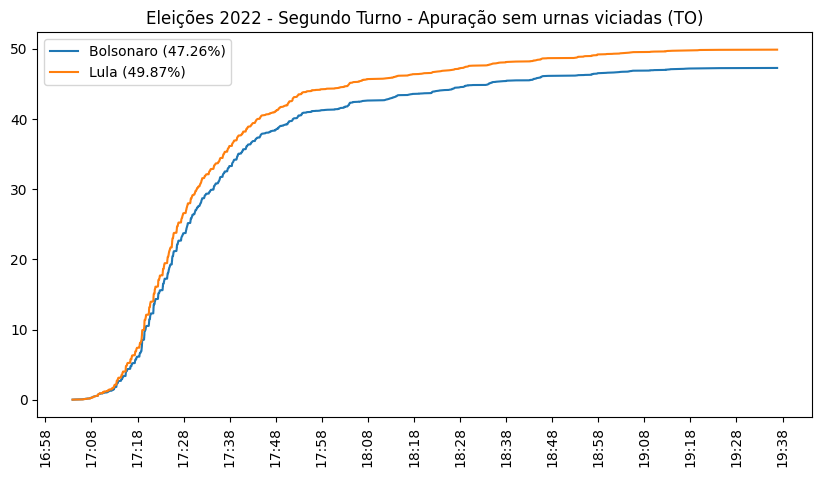

In [73]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2to, 'Total de Votos - 2º Turno', 'Tocantins')
# Total de votos acumulados
gerar_grafico_temporal(df2to, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'TO')
df2to_urnas = df2to[df2to['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2to_urnas[df2to_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2to_urnas[df2to_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2to_urnas_22 = df2to_urnas[df2to_urnas['NR_VOTAVEL'] == 22]
print(df2to_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2to, df2to_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2to_urnas_22, 'Tocantins')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2to_sub = df2to[~((df2to['CD_MUNICIPIO'].isin(df2to_urnas_22['CD_MUNICIPIO'])) & 
                 (df2to['NR_ZONA'].isin(df2to_urnas_22['NR_ZONA'])) & 
                 (df2to['NR_SECAO'].isin(df2to_urnas_22['NR_SECAO'])) & 
                 (df2to['NR_LOCAL_VOTACAO'].isin(df2to_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2to_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Tocantins')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2to_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'TO')

#### 2.2.2 - Resultados da Região

Urnas com 1 voto no candidato 13: 1
Urnas com 1 voto no candidato 22: 79
               NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
6361            URUCURITUBA        3       274              1210
7278              PARINTINS        4       122              1511
7325              PARINTINS        4       130              1600
8054              PARINTINS        4       232              1937
8096              PARINTINS        4       238              1970
...                     ...      ...       ...               ...
37096             TONANTINS       47        59              1040
37124  SANTO ANTÔNIO DO IÇÁ       47        63              1139
37179  SANTO ANTÔNIO DO IÇÁ       47        71              1040
55510             ITAMARATI       69        18              1090
5395         TOCANTINÓPOLIS        9       133              1252

[79 rows x 4 columns]


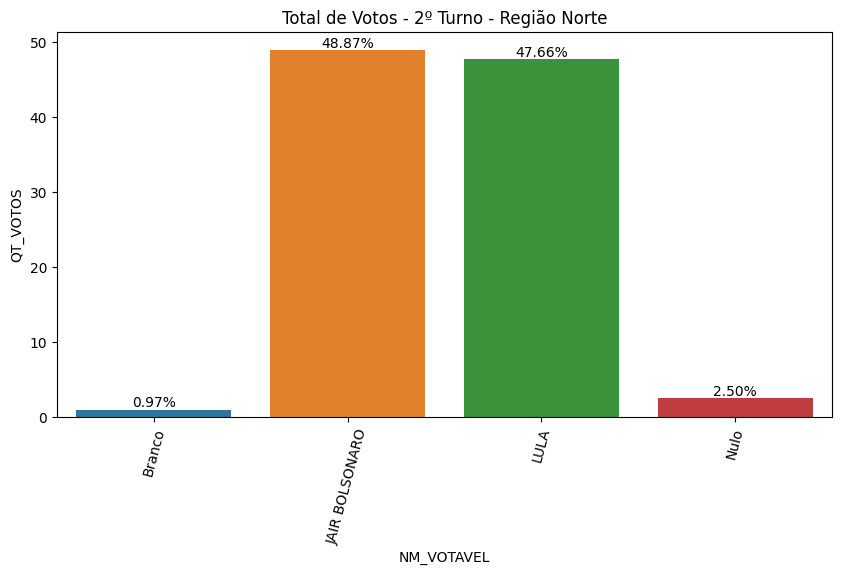

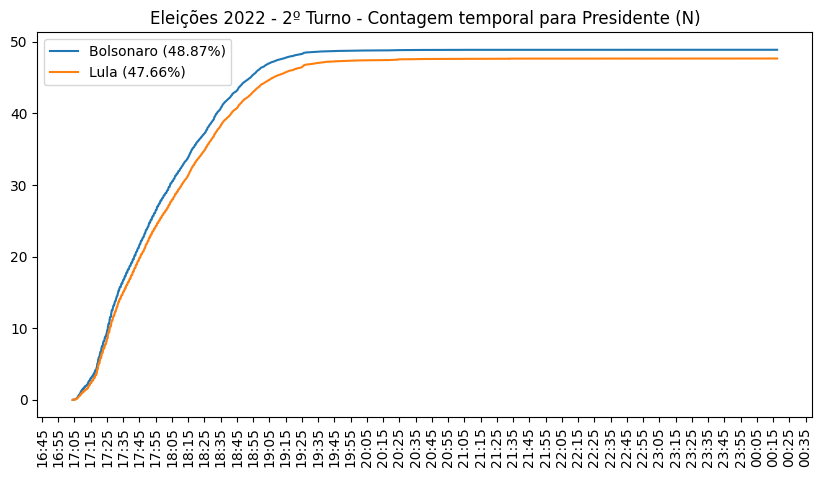

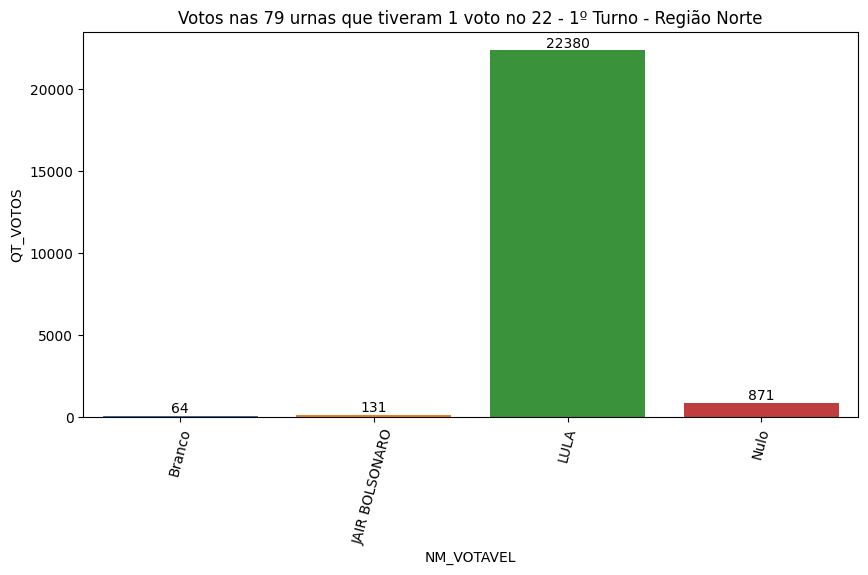

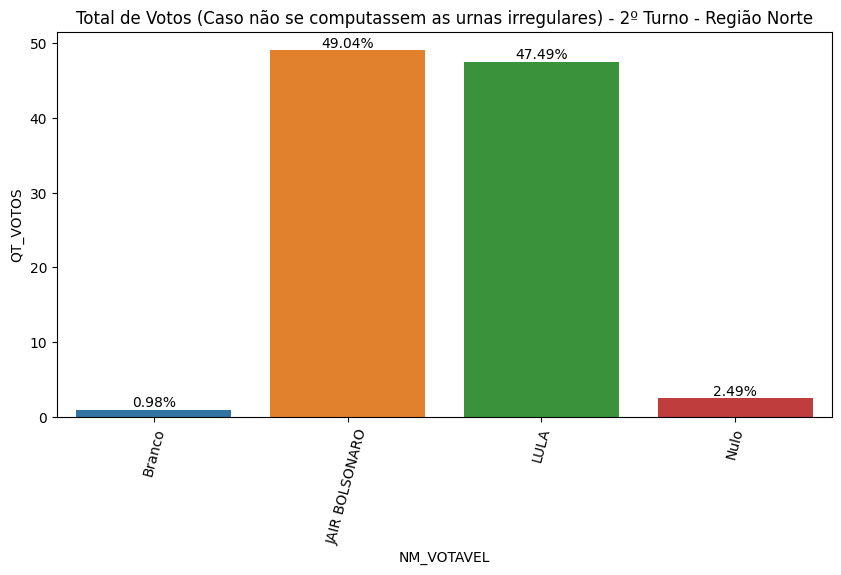

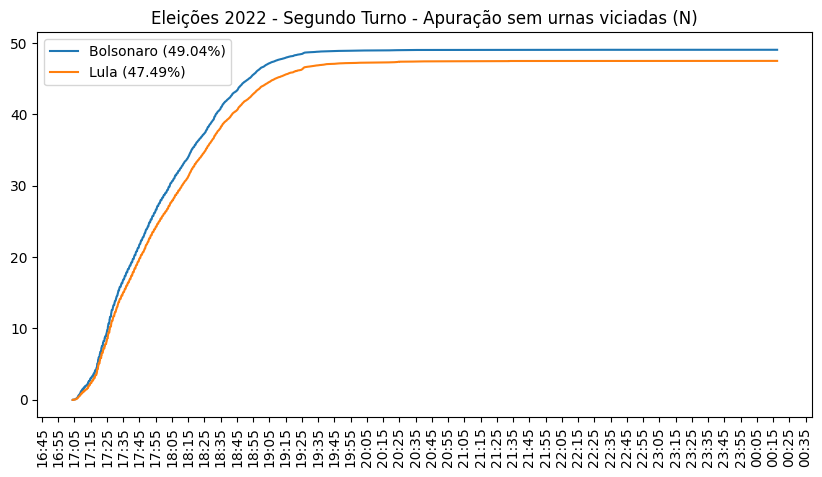

In [75]:
df2n = pd.concat([df2am, df2pa, df2ac, df2ro, df2rr, df2am, df2to])

# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2n, 'Total de Votos - 2º Turno', 'Região Norte')
# Total de votos acumulados
gerar_grafico_temporal(df2n, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'N')
df2n_urnas = df2n[df2n['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2n_urnas[df2n_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2n_urnas[df2n_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2n_urnas_22 = df2n_urnas[df2n_urnas['NR_VOTAVEL'] == 22]
print(df2n_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2n, df2n_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2n_urnas_22, 'Região Norte')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2n_sub = df2n[~((df2n['CD_MUNICIPIO'].isin(df2n_urnas_22['CD_MUNICIPIO'])) & 
                 (df2n['NR_ZONA'].isin(df2n_urnas_22['NR_ZONA'])) & 
                 (df2n['NR_SECAO'].isin(df2n_urnas_22['NR_SECAO'])) & 
                 (df2n['NR_LOCAL_VOTACAO'].isin(df2n_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2n_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Região Norte')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2n_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'N')

### 2.3 - Região CENTRO-OESTE

#### 2.3.1 - Estados

##### 2.3.1.1 - MATO GROSSO


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 3
          NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
4370   BARRA DO GARÇAS        9       431              1490
4481   BARRA DO GARÇAS        9       461              1627
28423  GAÚCHA DO NORTE       57        78              1112


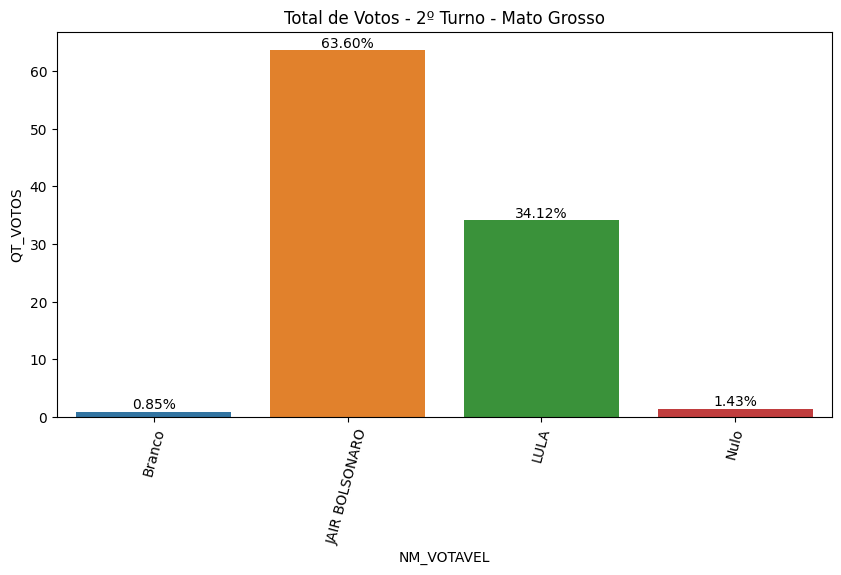

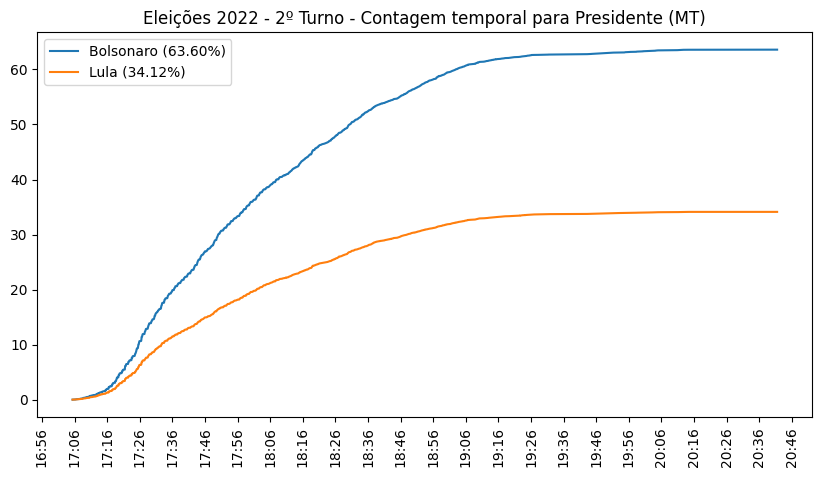

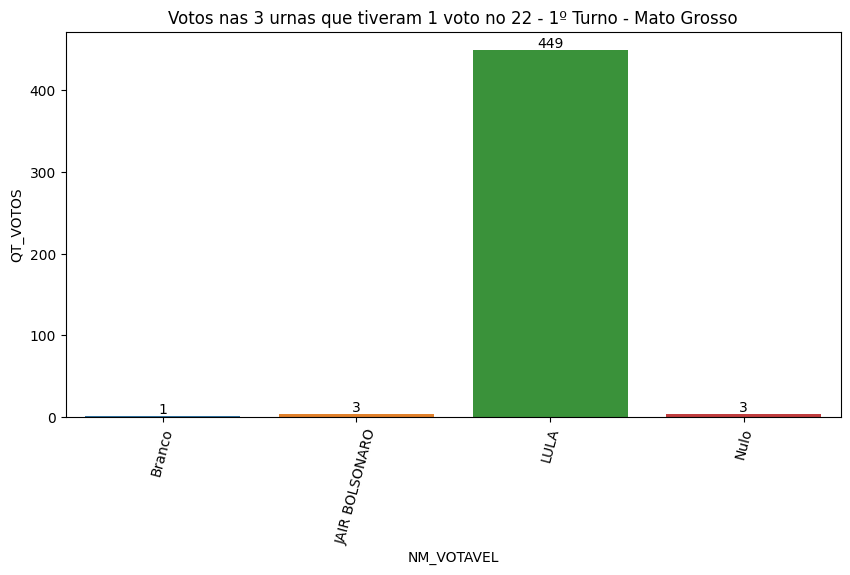

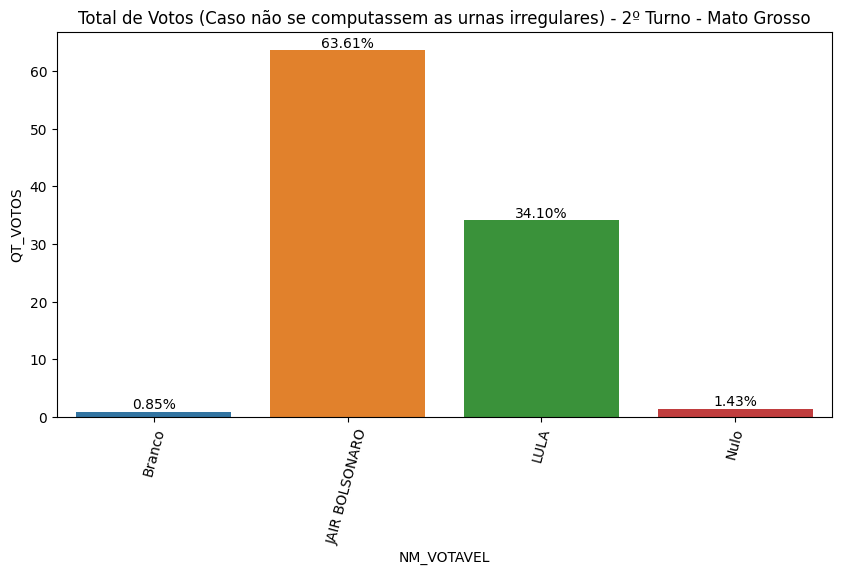

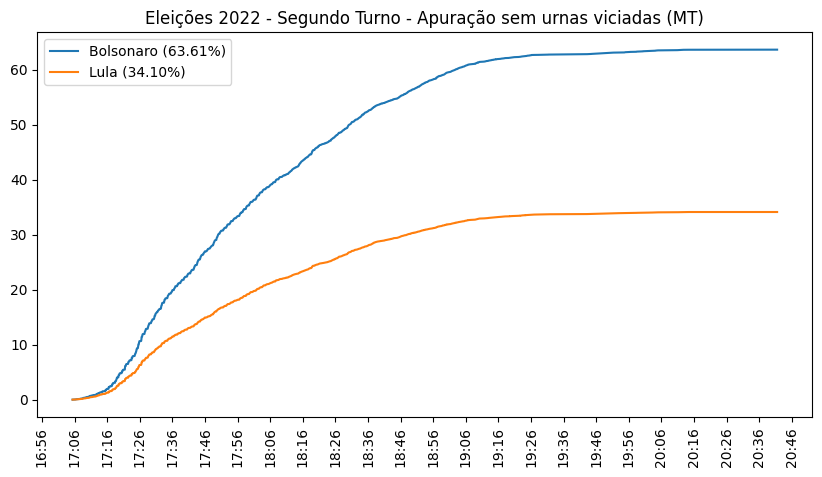

In [77]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2mt, 'Total de Votos - 2º Turno', 'Mato Grosso')
# Total de votos acumulados
gerar_grafico_temporal(df2mt, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'MT')
df2mt_urnas = df2mt[df2mt['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2mt_urnas[df2mt_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2mt_urnas[df2mt_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2mt_urnas_22 = df2mt_urnas[df2mt_urnas['NR_VOTAVEL'] == 22]
print(df2mt_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2mt, df2mt_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2mt_urnas_22, 'Mato Grosso')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2mt_sub = df2mt[~((df2mt['CD_MUNICIPIO'].isin(df2mt_urnas_22['CD_MUNICIPIO'])) & 
                 (df2mt['NR_ZONA'].isin(df2mt_urnas_22['NR_ZONA'])) & 
                 (df2mt['NR_SECAO'].isin(df2mt_urnas_22['NR_SECAO'])) & 
                 (df2mt['NR_LOCAL_VOTACAO'].isin(df2mt_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2mt_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Mato Grosso')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2mt_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'MT')

##### 2.3.1.2 - MATO GROSSO DO SUL


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 0
Empty DataFrame
Columns: [NM_MUNICIPIO, NR_ZONA, NR_SECAO, NR_LOCAL_VOTACAO]
Index: []


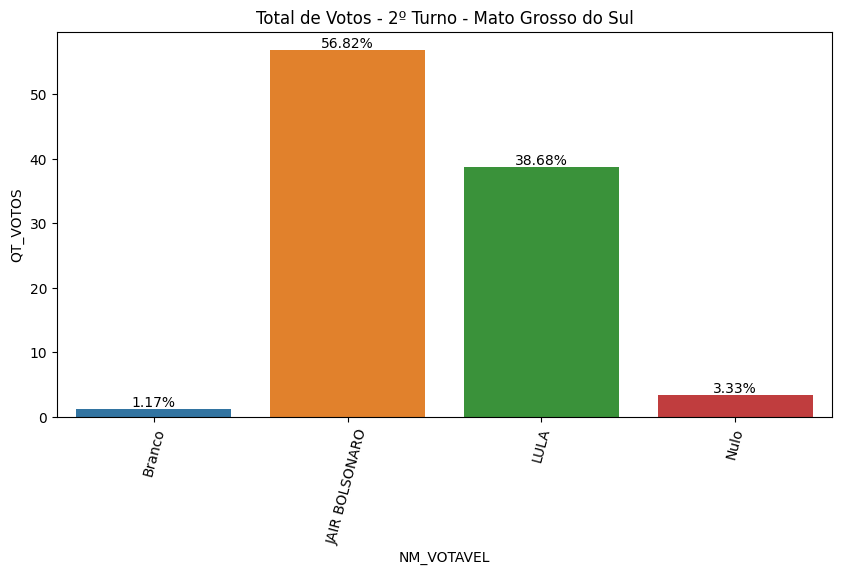

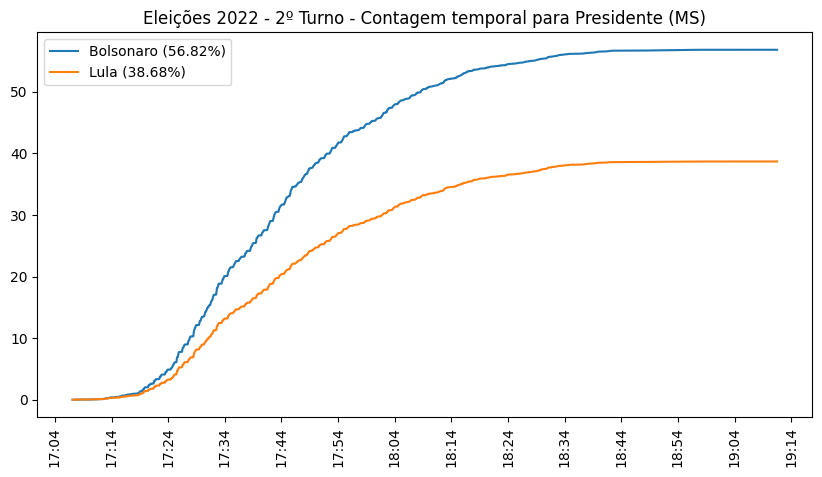

In [78]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2ms, 'Total de Votos - 2º Turno', 'Mato Grosso do Sul')
# Total de votos acumulados
gerar_grafico_temporal(df2ms, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'MS')
df2ms_urnas = df2ms[df2ms['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2ms_urnas[df2ms_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2ms_urnas[df2ms_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2ms_urnas_22 = df2ms_urnas[df2ms_urnas['NR_VOTAVEL'] == 22]
print(df2ms_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2ms, df2ms_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2ms_urnas_22, 'Mato Grosso do Sul')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2ms_sub = df2ms[~((df2ms['CD_MUNICIPIO'].isin(df2ms_urnas_22['CD_MUNICIPIO'])) & 
                 (df2ms['NR_ZONA'].isin(df2ms_urnas_22['NR_ZONA'])) & 
                 (df2ms['NR_SECAO'].isin(df2ms_urnas_22['NR_SECAO'])) & 
                 (df2ms['NR_LOCAL_VOTACAO'].isin(df2ms_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2ms_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Mato Grosso do Sul')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2ms_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'MS')

##### 2.3.1.3 - GOIÁS


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 1
      NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
37402   CAVALCANTE       99        48              1171


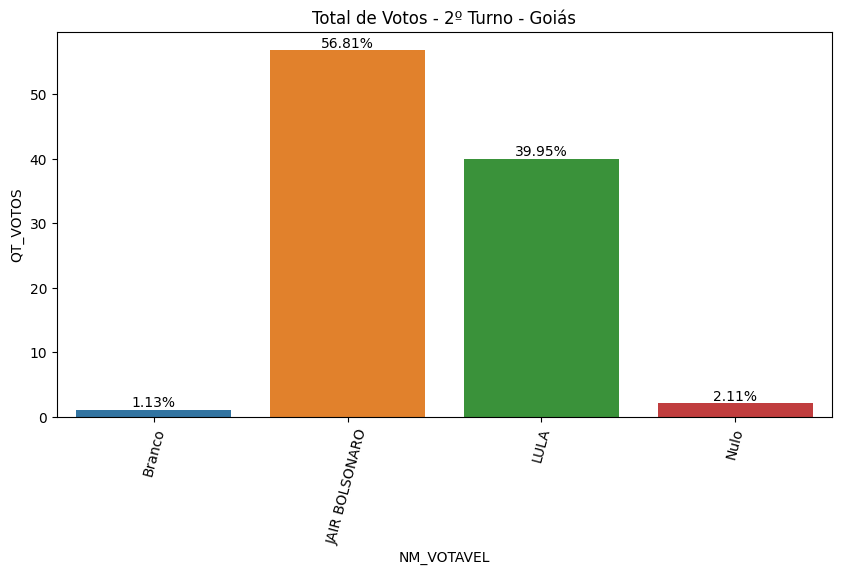

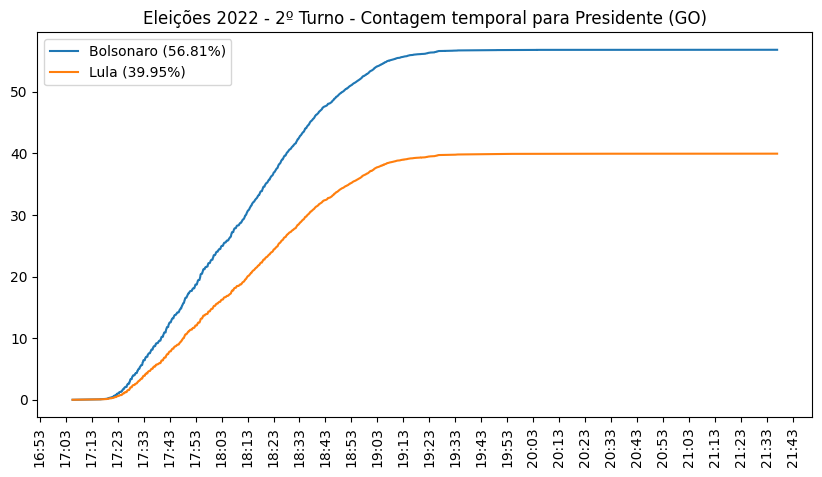

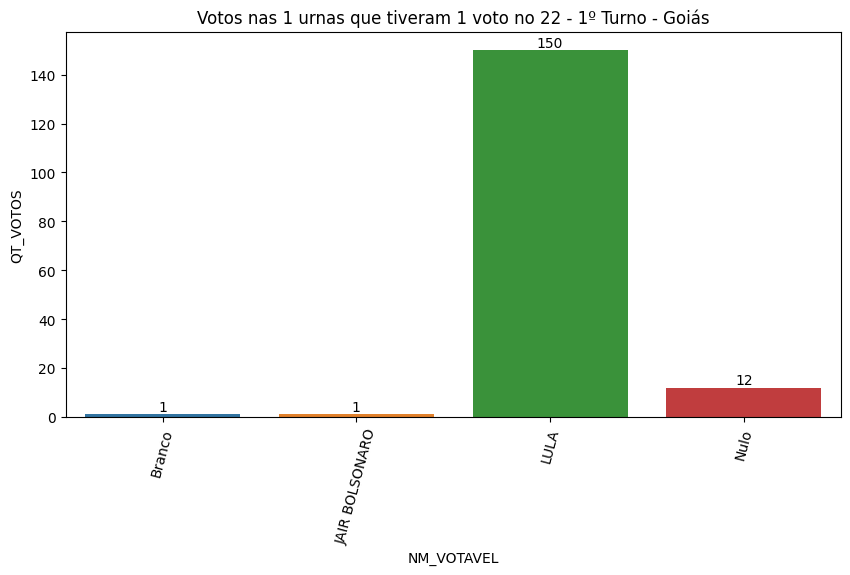

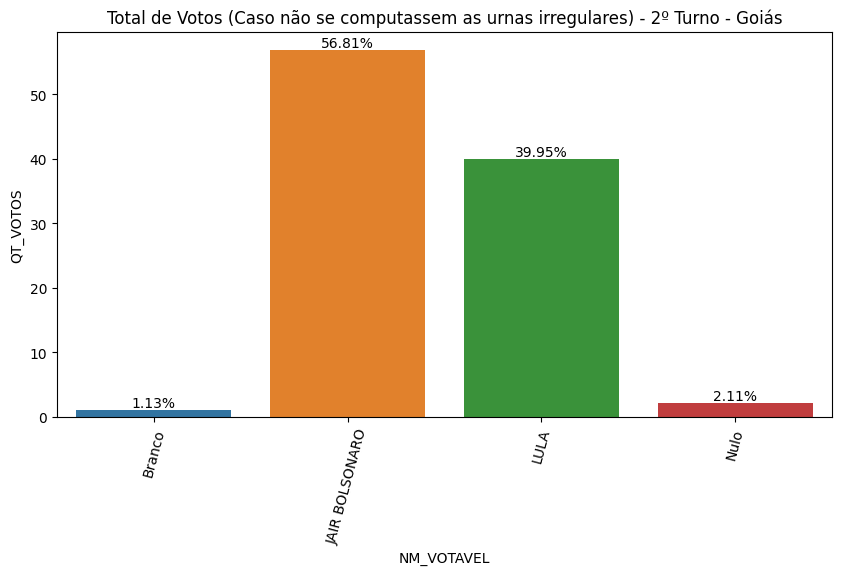

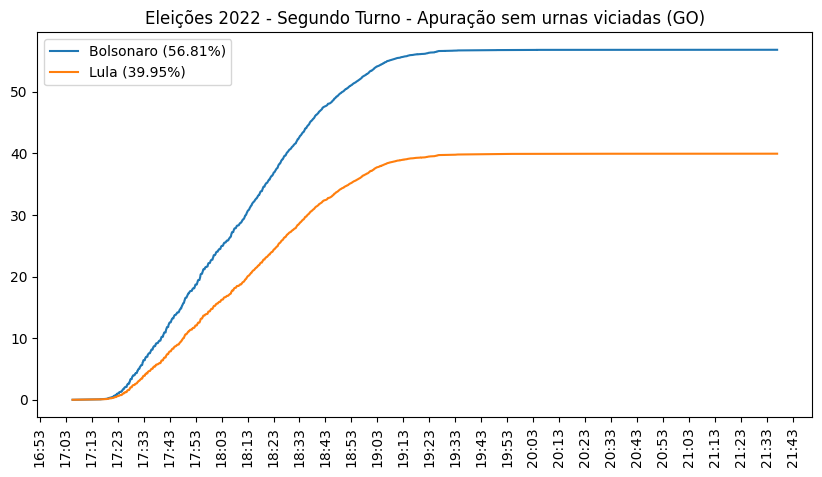

In [79]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2go, 'Total de Votos - 2º Turno', 'Goiás')
# Total de votos acumulados
gerar_grafico_temporal(df2go, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'GO')
df2go_urnas = df2go[df2go['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2go_urnas[df2go_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2go_urnas[df2go_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2go_urnas_22 = df2go_urnas[df2go_urnas['NR_VOTAVEL'] == 22]
print(df2go_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2go, df2go_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2go_urnas_22, 'Goiás')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2go_sub = df2go[~((df2go['CD_MUNICIPIO'].isin(df2go_urnas_22['CD_MUNICIPIO'])) & 
                 (df2go['NR_ZONA'].isin(df2go_urnas_22['NR_ZONA'])) & 
                 (df2go['NR_SECAO'].isin(df2go_urnas_22['NR_SECAO'])) & 
                 (df2go['NR_LOCAL_VOTACAO'].isin(df2go_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2go_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Goiás')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2go_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'GO')

#### 2.3.2 - Resultados da Região

Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 4
          NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
4370   BARRA DO GARÇAS        9       431              1490
4481   BARRA DO GARÇAS        9       461              1627
28423  GAÚCHA DO NORTE       57        78              1112
93282       CAVALCANTE       99        48              1171


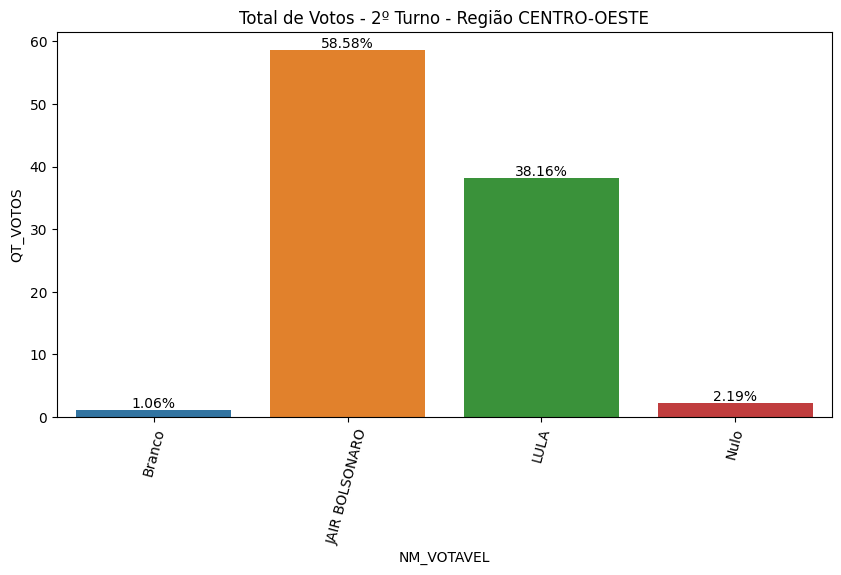

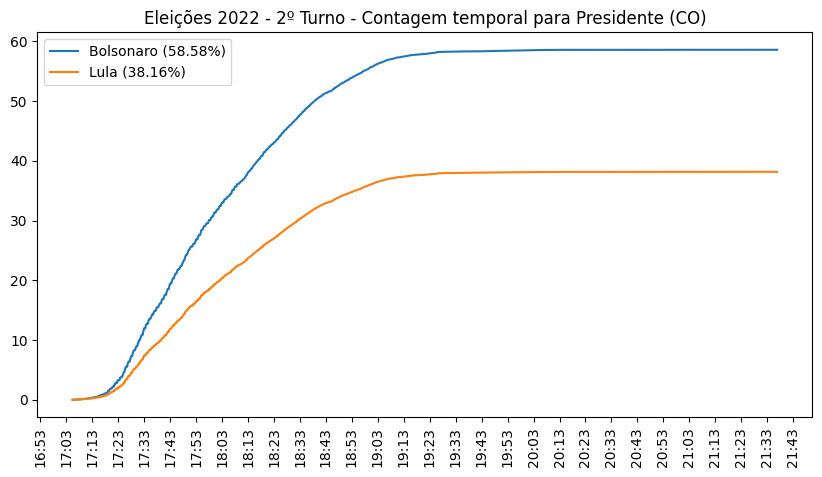

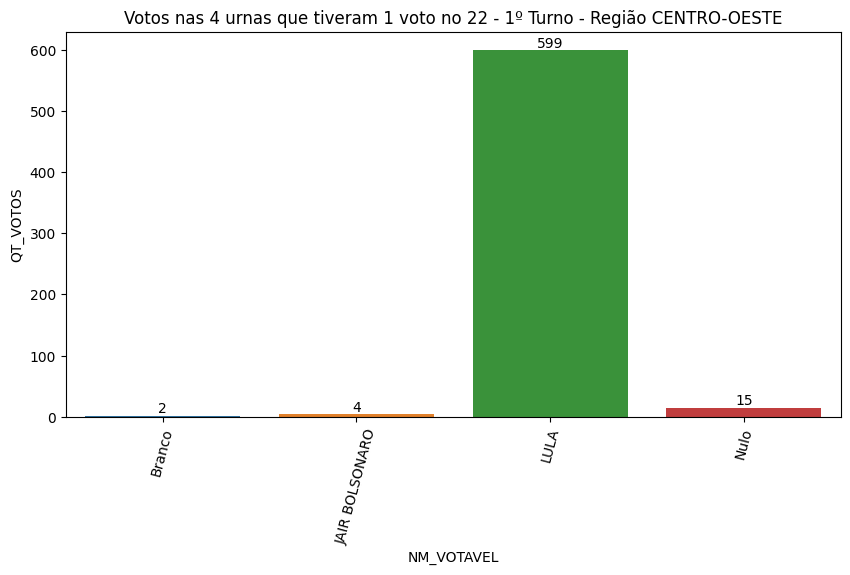

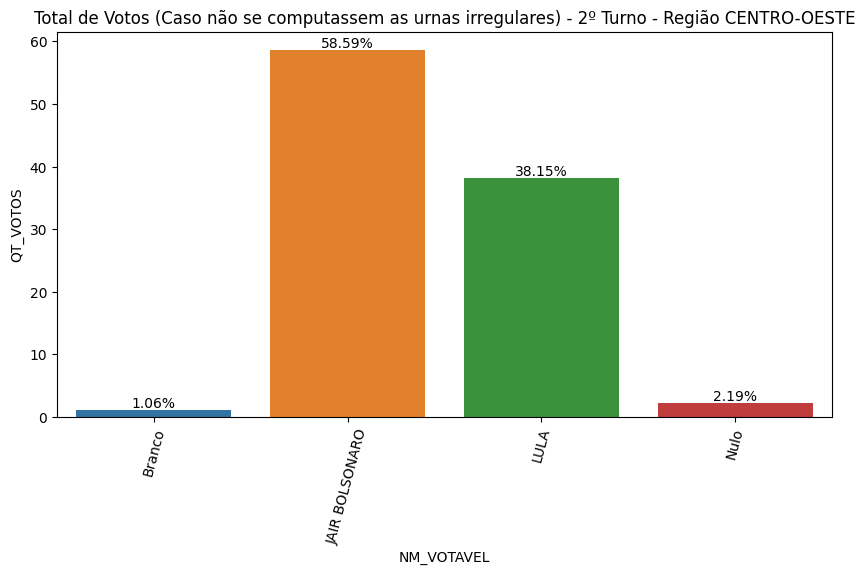

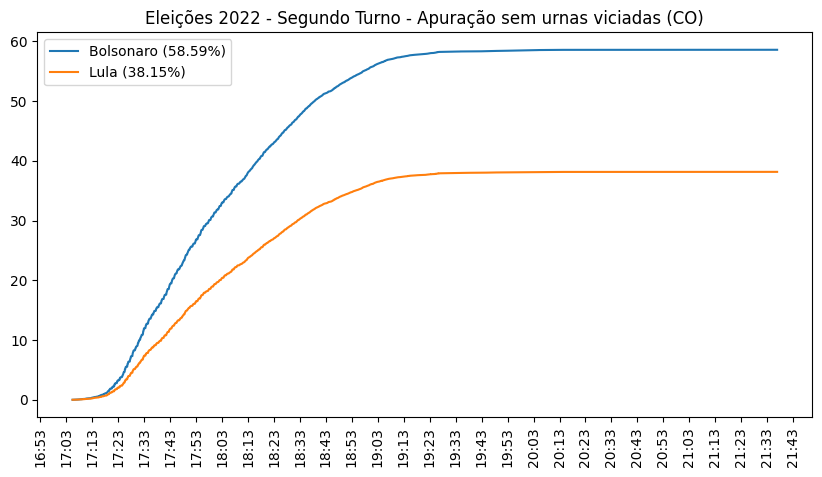

In [89]:
df2co = pd.concat([df2mt, df2ms, df2go], ignore_index=True)

# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2co, 'Total de Votos - 2º Turno', 'Região CENTRO-OESTE')
# Total de votos acumulados
gerar_grafico_temporal(df2co, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'CO')
df2co_urnas = df2co[df2co['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2co_urnas[df2co_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2co_urnas[df2co_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2co_urnas_22 = df2co_urnas[df2co_urnas['NR_VOTAVEL'] == 22]
print(df2co_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2co, df2co_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2co_urnas_22, 'Região CENTRO-OESTE')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2co_sub = df2co[~((df2co['CD_MUNICIPIO'].isin(df2co_urnas_22['CD_MUNICIPIO'])) & 
                 (df2co['NR_ZONA'].isin(df2co_urnas_22['NR_ZONA'])) & 
                 (df2co['NR_SECAO'].isin(df2co_urnas_22['NR_SECAO'])) & 
                 (df2co['NR_LOCAL_VOTACAO'].isin(df2co_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2co_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Região CENTRO-OESTE')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2co_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'CO')

### 2.4 - Região SUDESTE

##### 2.4.1.1 - SÃO PAULO


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 3
          NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
261824       GUARULHOS      176       471              2186
503126  RIBEIRÃO PRETO      305       333              2224
646404       SÃO PAULO      374       746              2046


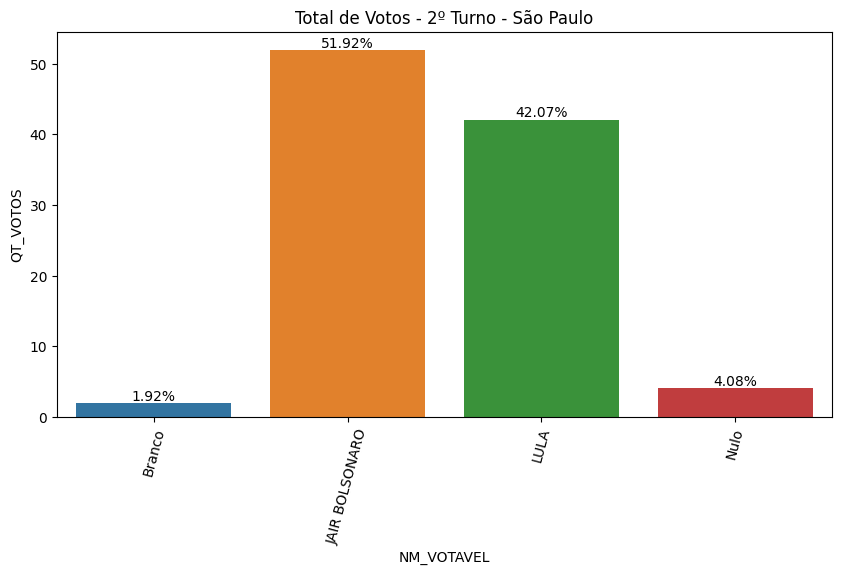

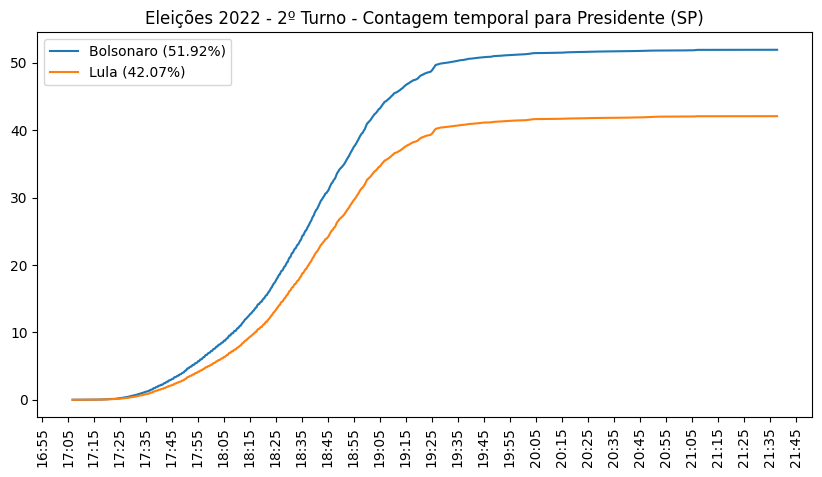

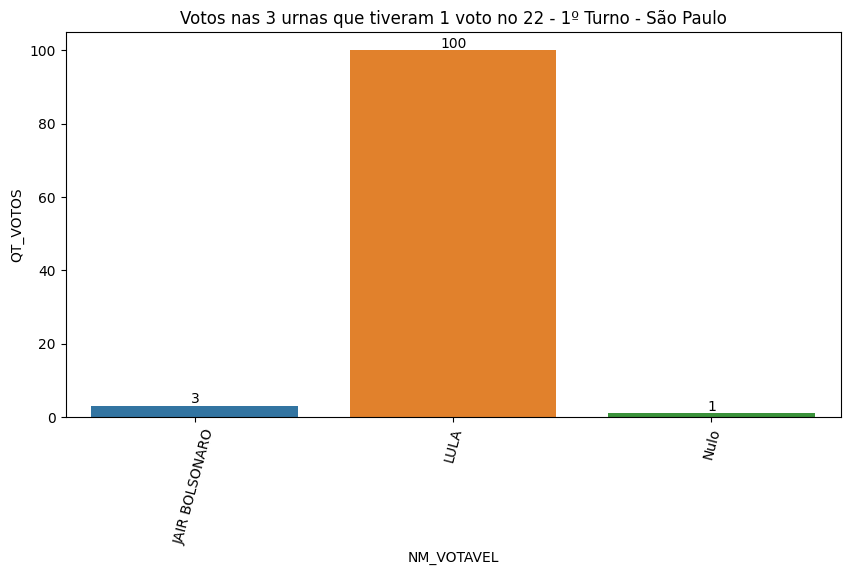

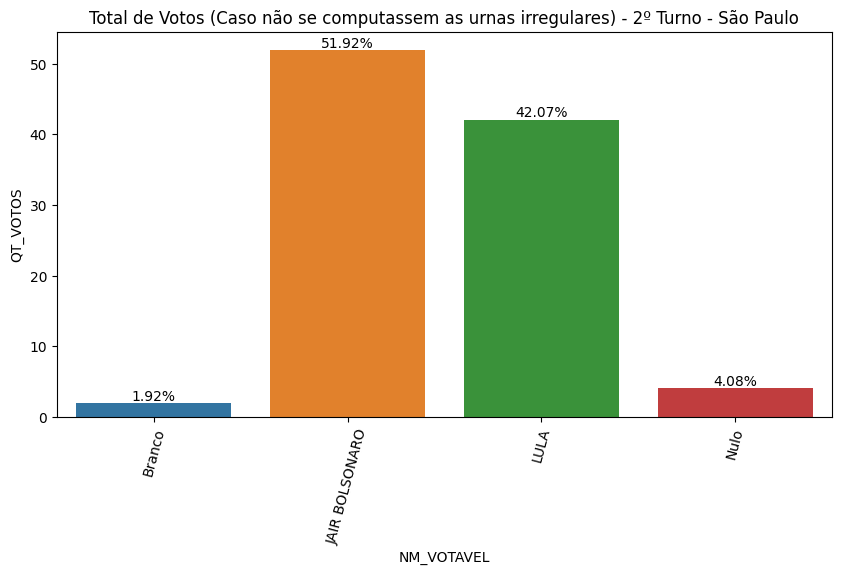

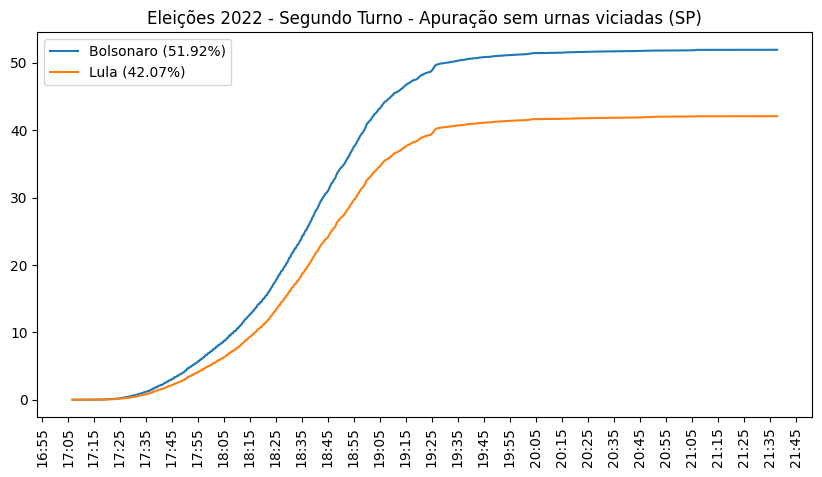

In [83]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2sp, 'Total de Votos - 2º Turno', 'São Paulo')
# Total de votos acumulados
gerar_grafico_temporal(df2sp, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'SP')
df2sp_urnas = df2sp[df2sp['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2sp_urnas[df2sp_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2sp_urnas[df2sp_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2sp_urnas_22 = df2sp_urnas[df2sp_urnas['NR_VOTAVEL'] == 22]
print(df2sp_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2sp, df2sp_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2sp_urnas_22, 'São Paulo')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2sp_sub = df2sp[~((df2sp['CD_MUNICIPIO'].isin(df2sp_urnas_22['CD_MUNICIPIO'])) & 
                 (df2sp['NR_ZONA'].isin(df2sp_urnas_22['NR_ZONA'])) & 
                 (df2sp['NR_SECAO'].isin(df2sp_urnas_22['NR_SECAO'])) & 
                 (df2sp['NR_LOCAL_VOTACAO'].isin(df2sp_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2sp_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'São Paulo')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2sp_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'SP')

##### 2.4.1.1 - RIO DE JANEIRO


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 0
Empty DataFrame
Columns: [NM_MUNICIPIO, NR_ZONA, NR_SECAO, NR_LOCAL_VOTACAO]
Index: []


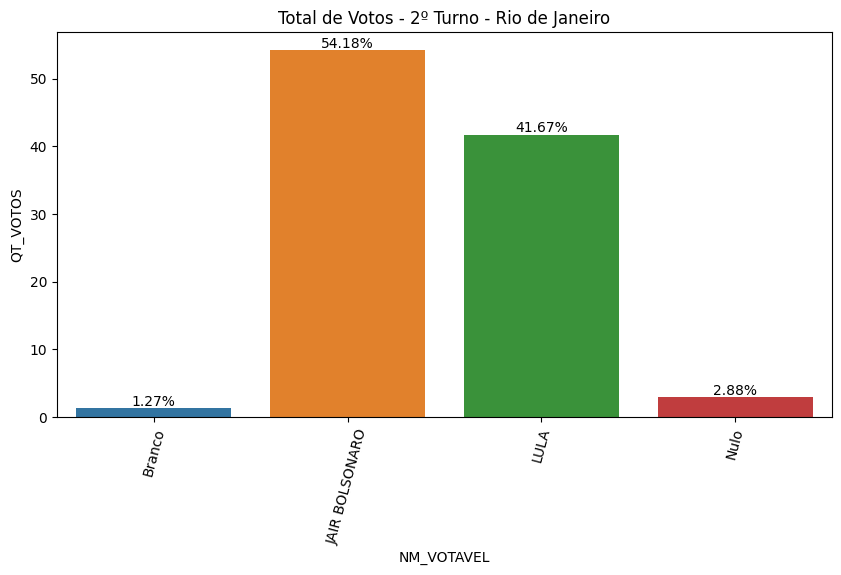

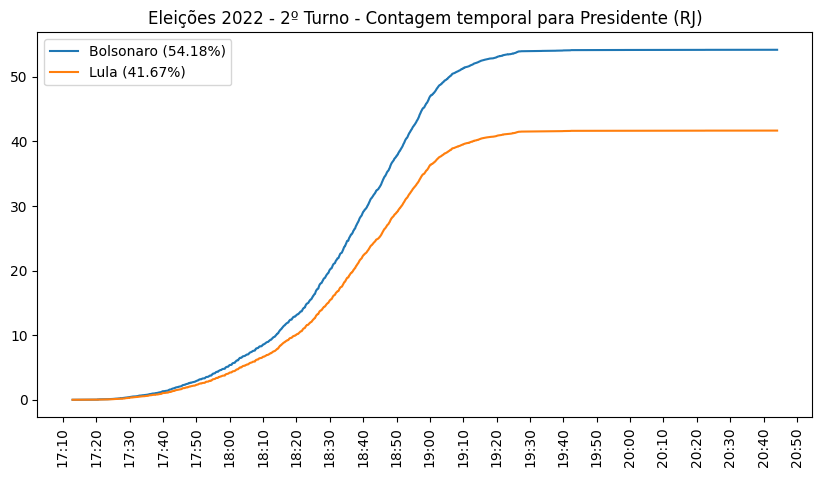

In [84]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2rj, 'Total de Votos - 2º Turno', 'Rio de Janeiro')
# Total de votos acumulados
gerar_grafico_temporal(df2rj, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'RJ')
df2rj_urnas = df2rj[df2rj['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2rj_urnas[df2rj_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2rj_urnas[df2rj_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2rj_urnas_22 = df2rj_urnas[df2rj_urnas['NR_VOTAVEL'] == 22]
print(df2rj_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2rj, df2rj_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2rj_urnas_22, 'Rio de Janeiro')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2rj_sub = df2rj[~((df2rj['CD_MUNICIPIO'].isin(df2rj_urnas_22['CD_MUNICIPIO'])) & 
                 (df2rj['NR_ZONA'].isin(df2rj_urnas_22['NR_ZONA'])) & 
                 (df2rj['NR_SECAO'].isin(df2rj_urnas_22['NR_SECAO'])) & 
                 (df2rj['NR_LOCAL_VOTACAO'].isin(df2rj_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2rj_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Rio de Janeiro')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2rj_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'RJ')

##### 2.4.1.3 - ESPÍRITO SANTO


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 0
Empty DataFrame
Columns: [NM_MUNICIPIO, NR_ZONA, NR_SECAO, NR_LOCAL_VOTACAO]
Index: []


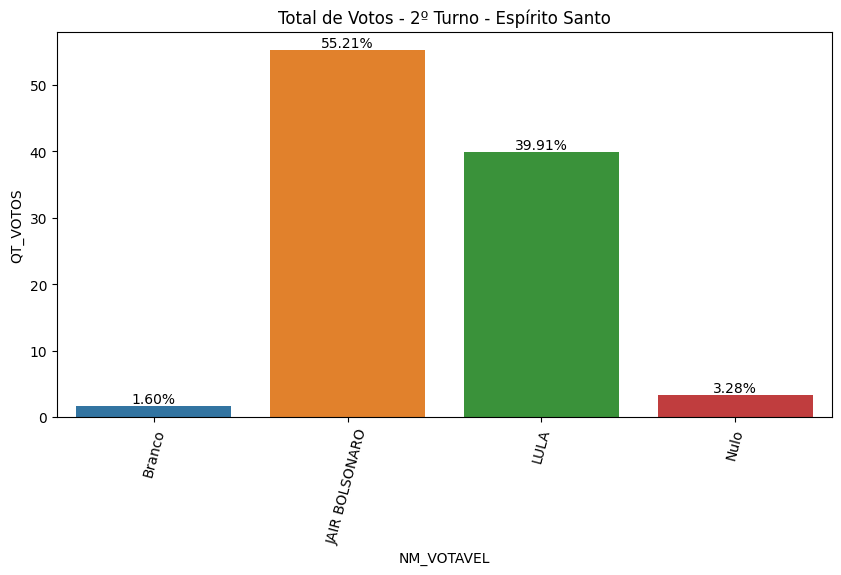

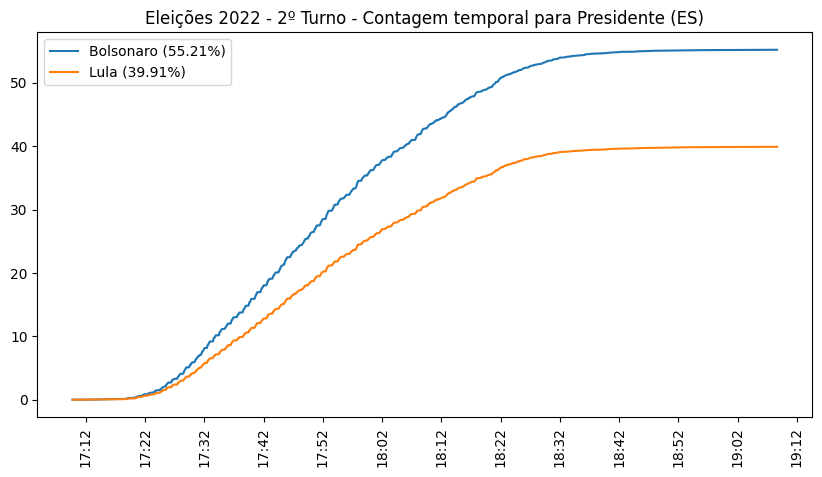

In [85]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2es, 'Total de Votos - 2º Turno', 'Espírito Santo')
# Total de votos acumulados
gerar_grafico_temporal(df2es, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'ES')
df2es_urnas = df2es[df2es['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2es_urnas[df2es_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2es_urnas[df2es_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2es_urnas_22 = df2es_urnas[df2es_urnas['NR_VOTAVEL'] == 22]
print(df2es_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2es, df2es_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2es_urnas_22, 'Espírito Santo')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2es_sub = df2es[~((df2es['CD_MUNICIPIO'].isin(df2es_urnas_22['CD_MUNICIPIO'])) & 
                 (df2es['NR_ZONA'].isin(df2es_urnas_22['NR_ZONA'])) & 
                 (df2es['NR_SECAO'].isin(df2es_urnas_22['NR_SECAO'])) & 
                 (df2es['NR_LOCAL_VOTACAO'].isin(df2es_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2es_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Espírito Santo')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2es_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'ES')

##### 2.4.1.4 - MINAS GERAIS


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 17
                 NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
1807    SANTA HELENA DE MINAS        4       148              1066
13173    SENHORA DOS REMÉDIOS       25       126              1147
31638       BRASÍLIA DE MINAS       50       219              1694
50688        CORAÇÃO DE JESUS       94       145              1538
61057                CARMÉSIA      113        43              1058
80078          CÔNEGO MARINHO      148       190              1201
80471                JANUÁRIA      148       319              2356
90527    SÃO JOÃO DAS MISSÕES      166       268              1279
90549    SÃO JOÃO DAS MISSÕES      166       281              1295
100481          MONTES CLAROS      184       588              1929
106951          NOVO CRUZEIRO      196       173              1279
130916               RUBELITA      244       156              1112
130932         FRUTA DE LEITE      244       162        

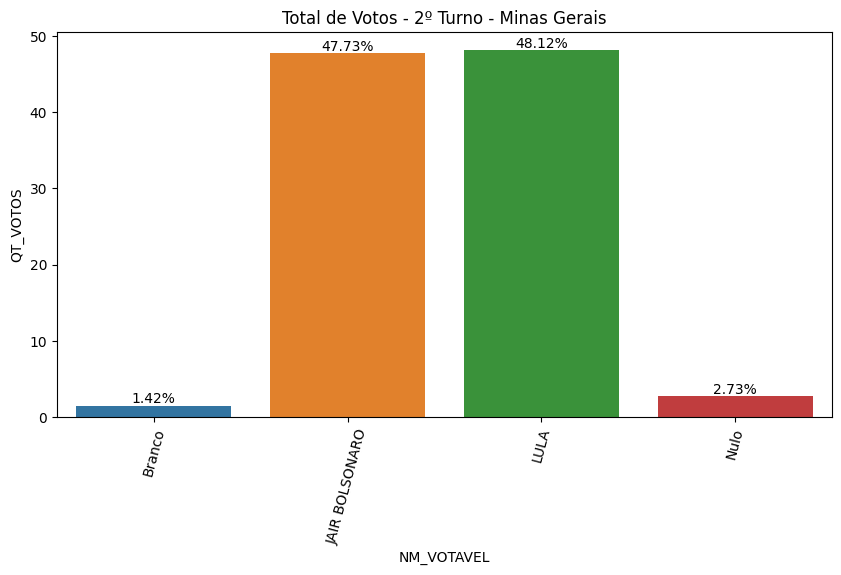

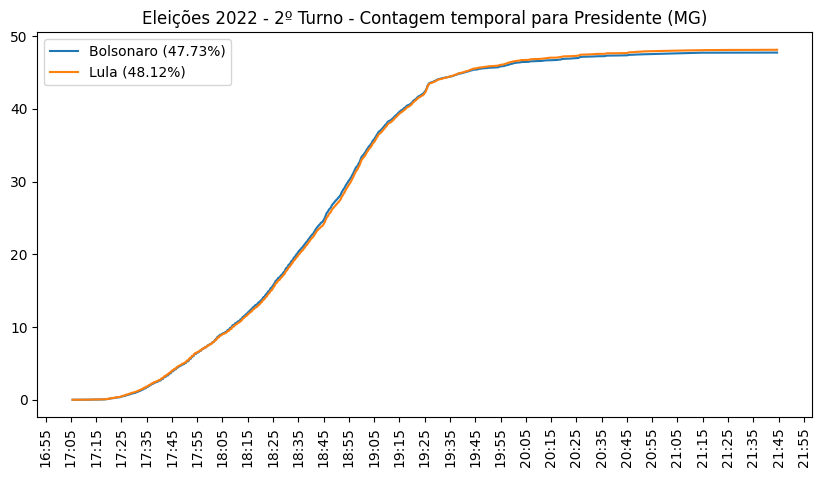

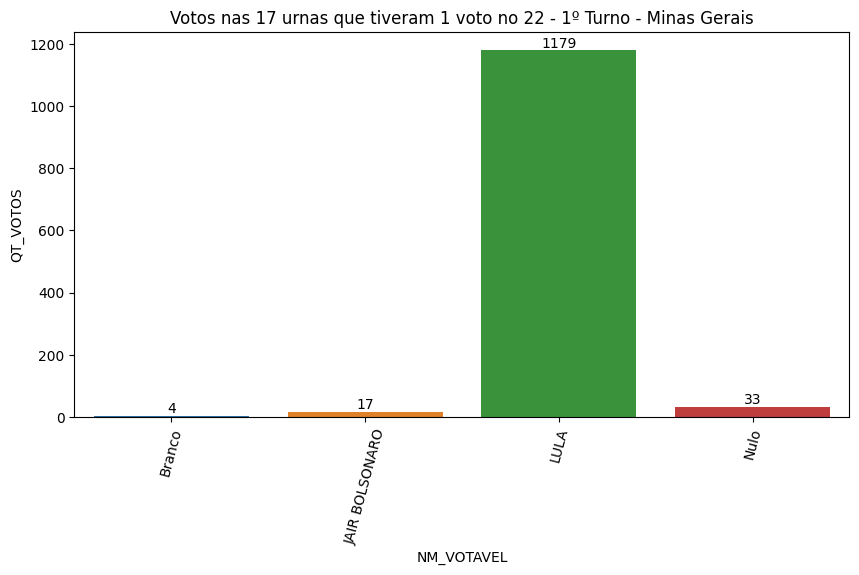

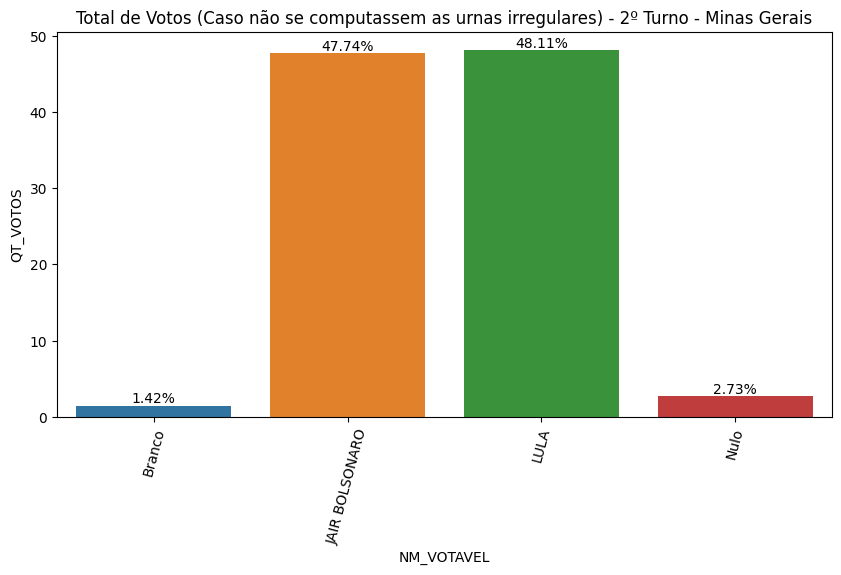

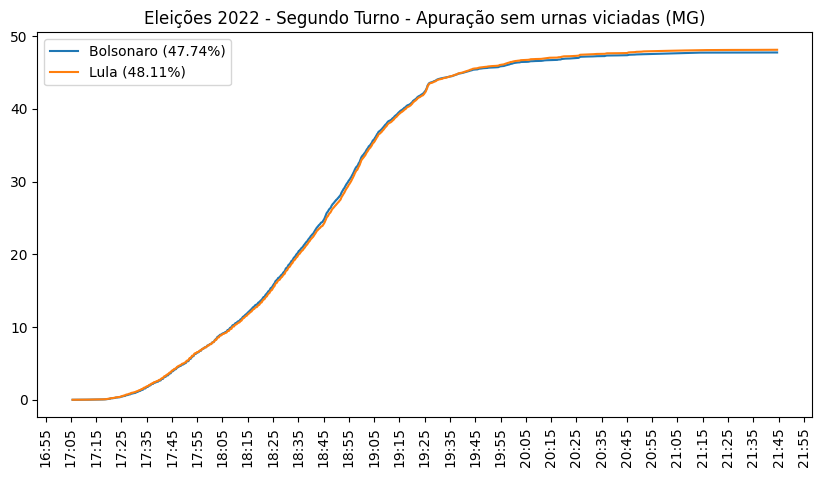

In [86]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2mg, 'Total de Votos - 2º Turno', 'Minas Gerais')
# Total de votos acumulados
gerar_grafico_temporal(df2mg, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'MG')
df2mg_urnas = df2mg[df2mg['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2mg_urnas[df2mg_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2mg_urnas[df2mg_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2mg_urnas_22 = df2mg_urnas[df2mg_urnas['NR_VOTAVEL'] == 22]
print(df2mg_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2mg, df2mg_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2mg_urnas_22, 'Minas Gerais')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2mg_sub = df2mg[~((df2mg['CD_MUNICIPIO'].isin(df2mg_urnas_22['CD_MUNICIPIO'])) & 
                 (df2mg['NR_ZONA'].isin(df2mg_urnas_22['NR_ZONA'])) & 
                 (df2mg['NR_SECAO'].isin(df2mg_urnas_22['NR_SECAO'])) & 
                 (df2mg['NR_LOCAL_VOTACAO'].isin(df2mg_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2mg_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Minas Gerais')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2mg_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'MG')

#### 2.4.2 - Resultados da Região

Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 20
                 NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
130634              GUARULHOS      176       471              2186
251111         RIBEIRÃO PRETO      305       333              2224
322692              SÃO PAULO      374       746              2046
576197  SANTA HELENA DE MINAS        4       148              1066
587563   SENHORA DOS REMÉDIOS       25       126              1147
606028      BRASÍLIA DE MINAS       50       219              1694
625078       CORAÇÃO DE JESUS       94       145              1538
635447               CARMÉSIA      113        43              1058
654468         CÔNEGO MARINHO      148       190              1201
654861               JANUÁRIA      148       319              2356
664917   SÃO JOÃO DAS MISSÕES      166       268              1279
664939   SÃO JOÃO DAS MISSÕES      166       281              1295
674871          MONTES CLAROS      184       588        

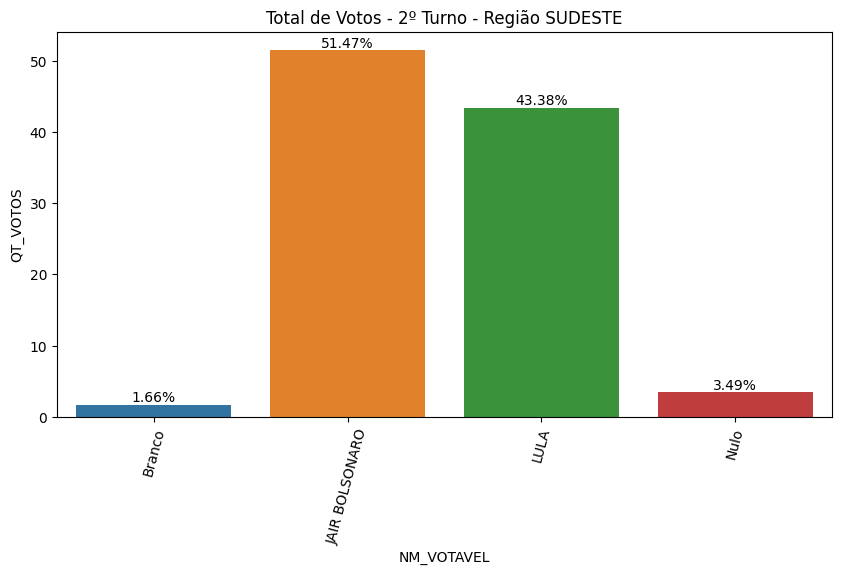

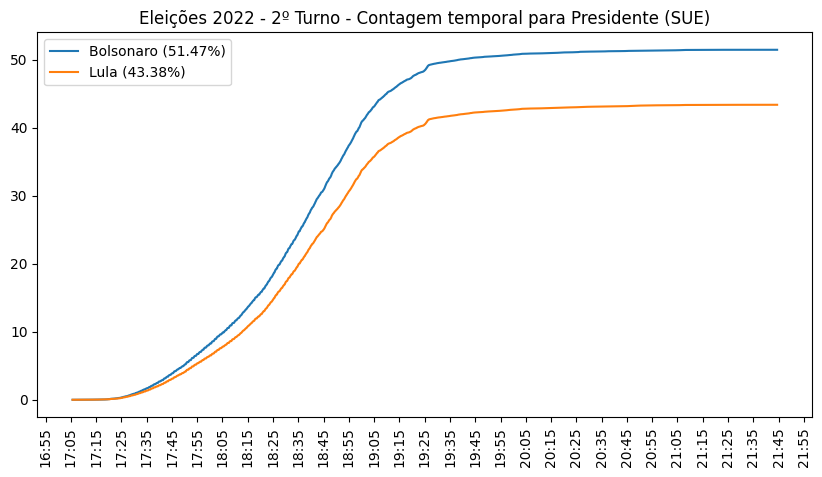

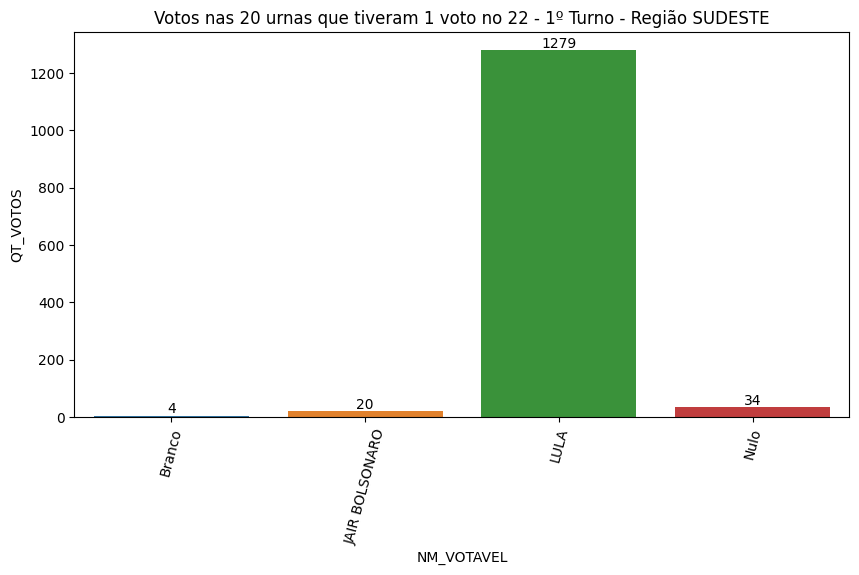

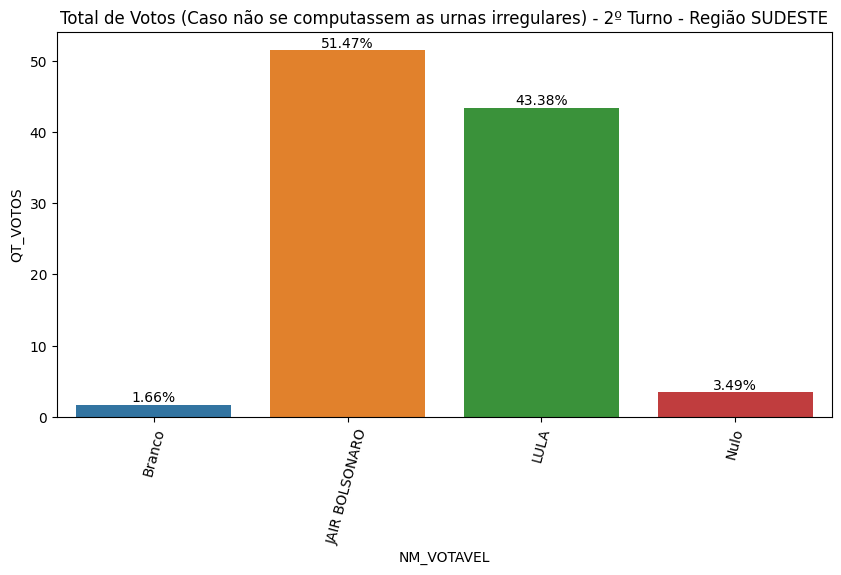

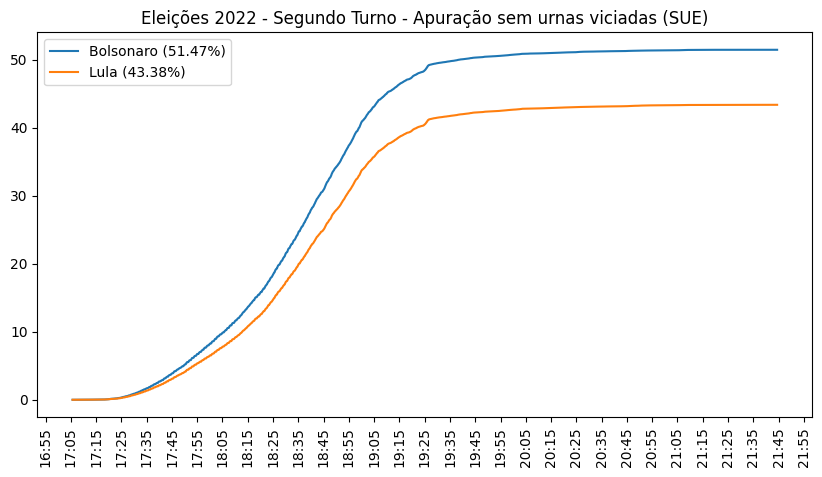

In [91]:
df2sue = pd.concat([df2sp, df2rj, df2es, df2mg], ignore_index=True)

# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2sue, 'Total de Votos - 2º Turno', 'Região SUDESTE')
# Total de votos acumulados
gerar_grafico_temporal(df2sue, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'SUE')
df2sue_urnas = df2sue[df2sue['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2sue_urnas[df2sue_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2sue_urnas[df2sue_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2sue_urnas_22 = df2sue_urnas[df2sue_urnas['NR_VOTAVEL'] == 22]
print(df2sue_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2sue, df2sue_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2sue_urnas_22, 'Região SUDESTE')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2sue_sub = df2sue[~((df2sue['CD_MUNICIPIO'].isin(df2sue_urnas_22['CD_MUNICIPIO'])) & 
                 (df2sue['NR_ZONA'].isin(df2sue_urnas_22['NR_ZONA'])) & 
                 (df2sue['NR_SECAO'].isin(df2sue_urnas_22['NR_SECAO'])) & 
                 (df2sue['NR_LOCAL_VOTACAO'].isin(df2sue_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2sue_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Região SUDESTE')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2sue_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'SUE')

### 2.5 - Região SUL

#### 2.5.1 - Estados

##### 2.5.1.1 - PARANÁ

Urnas com 1 voto no candidato 13: 1
Urnas com 1 voto no candidato 22: 0
Empty DataFrame
Columns: [NM_MUNICIPIO, NR_ZONA, NR_SECAO, NR_LOCAL_VOTACAO]
Index: []


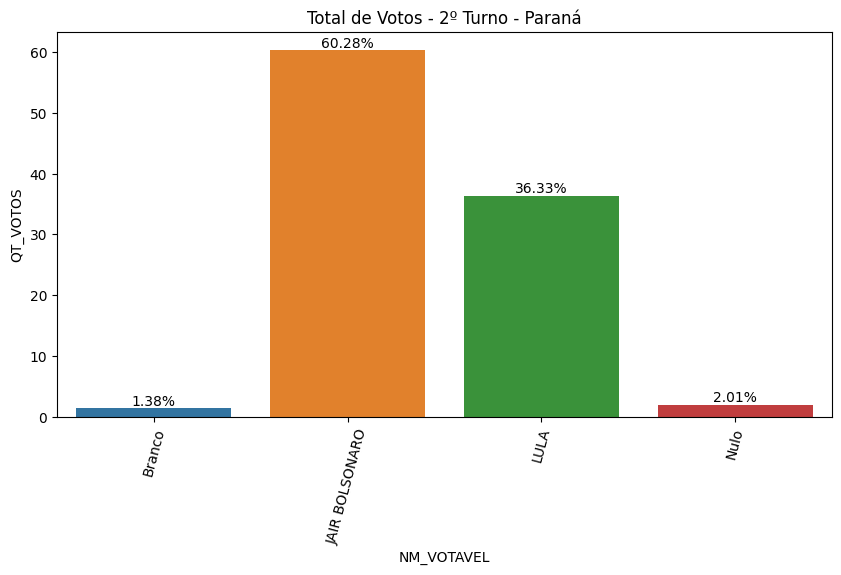

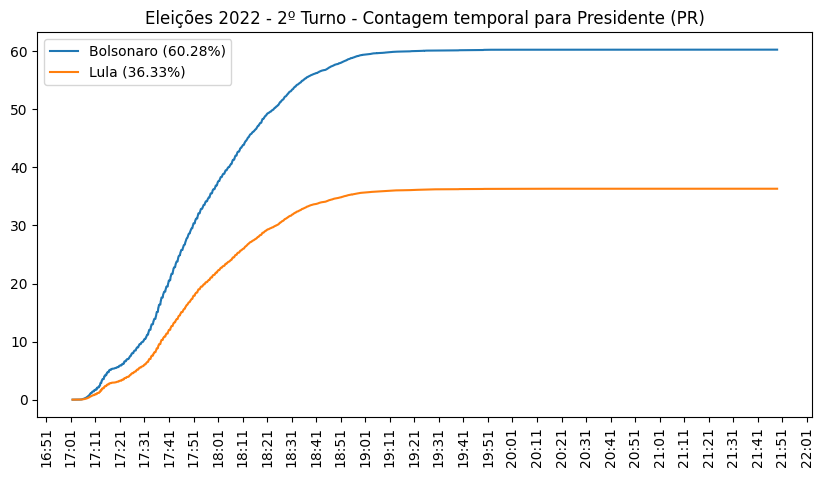

In [92]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2pr, 'Total de Votos - 2º Turno', 'Paraná')
# Total de votos acumulados
gerar_grafico_temporal(df2pr, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'PR')
df2pr_urnas = df2pr[df2pr['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2pr_urnas[df2pr_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2pr_urnas[df2pr_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2pr_urnas_22 = df2pr_urnas[df2pr_urnas['NR_VOTAVEL'] == 22]
print(df2pr_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2pr, df2pr_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2pr_urnas_22, 'Paraná')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2pr_sub = df2pr[~((df2pr['CD_MUNICIPIO'].isin(df2pr_urnas_22['CD_MUNICIPIO'])) & 
                 (df2pr['NR_ZONA'].isin(df2pr_urnas_22['NR_ZONA'])) & 
                 (df2pr['NR_SECAO'].isin(df2pr_urnas_22['NR_SECAO'])) & 
                 (df2pr['NR_LOCAL_VOTACAO'].isin(df2pr_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2pr_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Paraná')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2pr_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'PR')

##### 2.5.1.2 - SANTA CATARINA


Urnas com 1 voto no candidato 13: 0
Urnas com 1 voto no candidato 22: 0
Empty DataFrame
Columns: [NM_MUNICIPIO, NR_ZONA, NR_SECAO, NR_LOCAL_VOTACAO]
Index: []


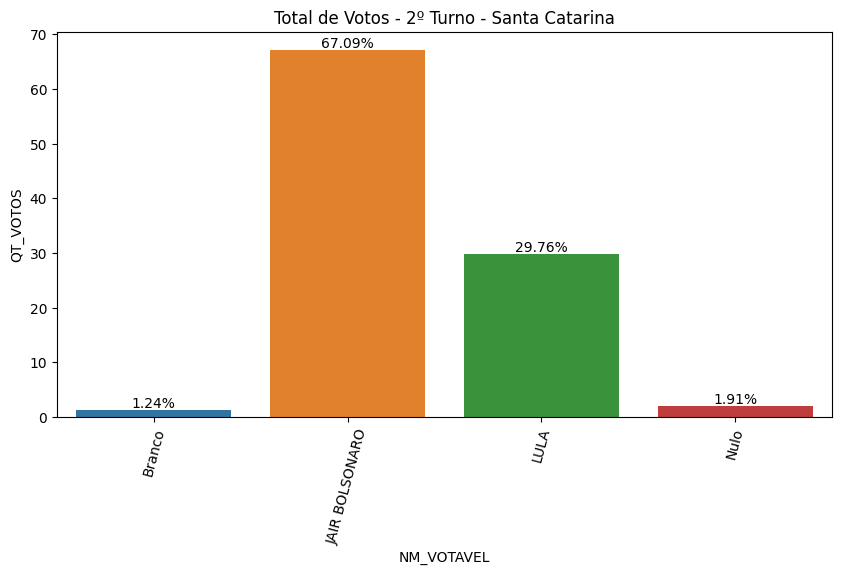

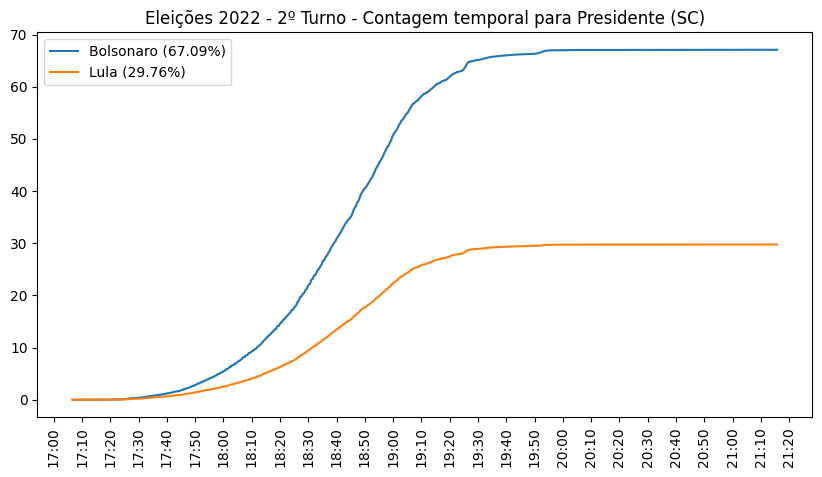

In [93]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2sc, 'Total de Votos - 2º Turno', 'Santa Catarina')
# Total de votos acumulados
gerar_grafico_temporal(df2sc, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'SC')
df2sc_urnas = df2sc[df2sc['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2sc_urnas[df2sc_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2sc_urnas[df2sc_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2sc_urnas_22 = df2sc_urnas[df2sc_urnas['NR_VOTAVEL'] == 22]
print(df2sc_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2sc, df2sc_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2sc_urnas_22, 'Santa Catarina')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2sc_sub = df2sc[~((df2sc['CD_MUNICIPIO'].isin(df2sc_urnas_22['CD_MUNICIPIO'])) & 
                 (df2sc['NR_ZONA'].isin(df2sc_urnas_22['NR_ZONA'])) & 
                 (df2sc['NR_SECAO'].isin(df2sc_urnas_22['NR_SECAO'])) & 
                 (df2sc['NR_LOCAL_VOTACAO'].isin(df2sc_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2sc_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Santa Catarina')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2sc_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'SC')

##### 2.5.1.3 - RIO GRANDE DE SUL


Urnas com 1 voto no candidato 13: 1
Urnas com 1 voto no candidato 22: 3
       NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
30120       ERECHIM       20       352              1910
86566       PELOTAS       60       506              2585
203093   RIO GRANDE      163         3              1392


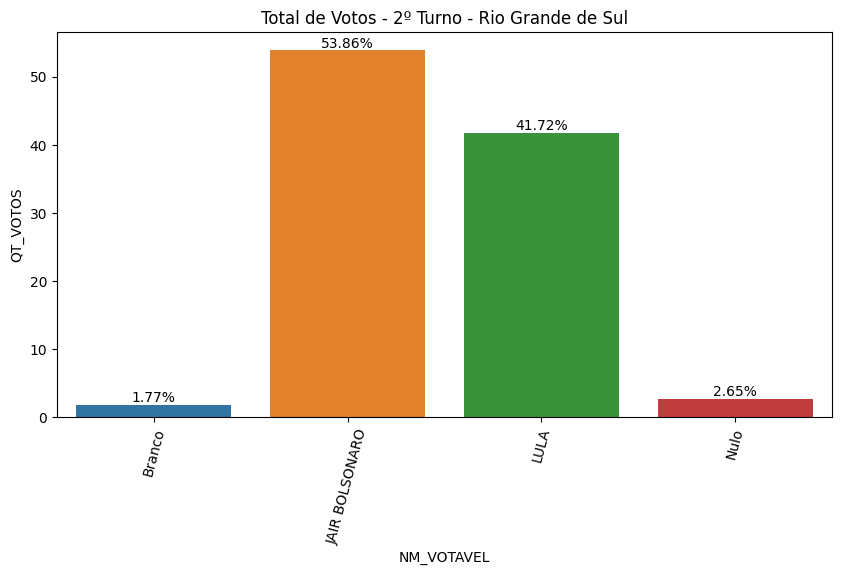

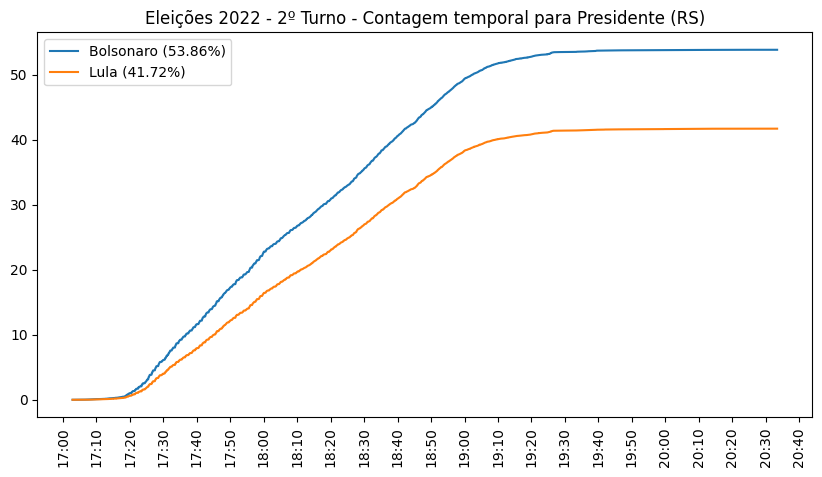

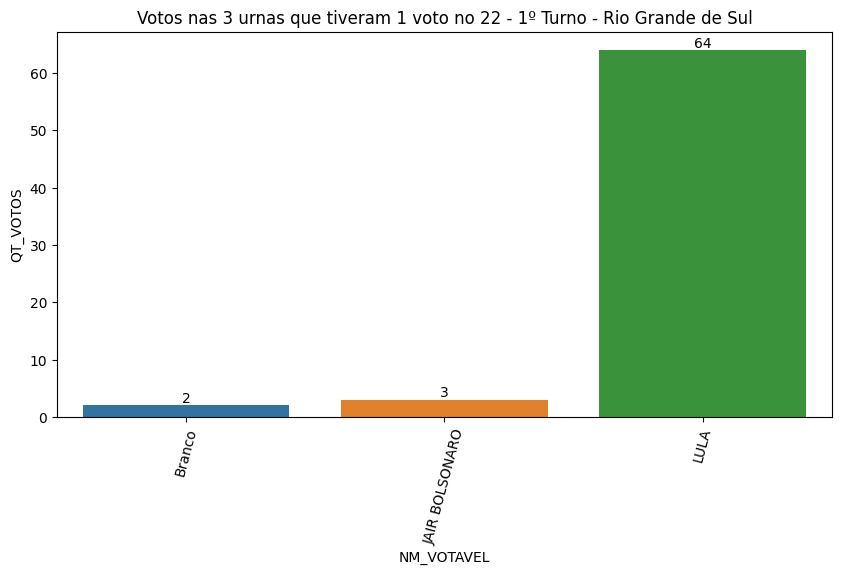

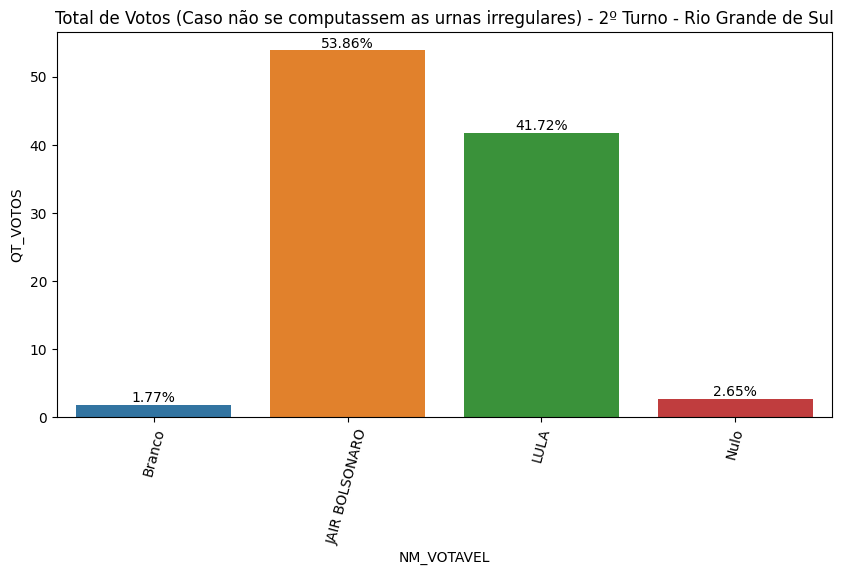

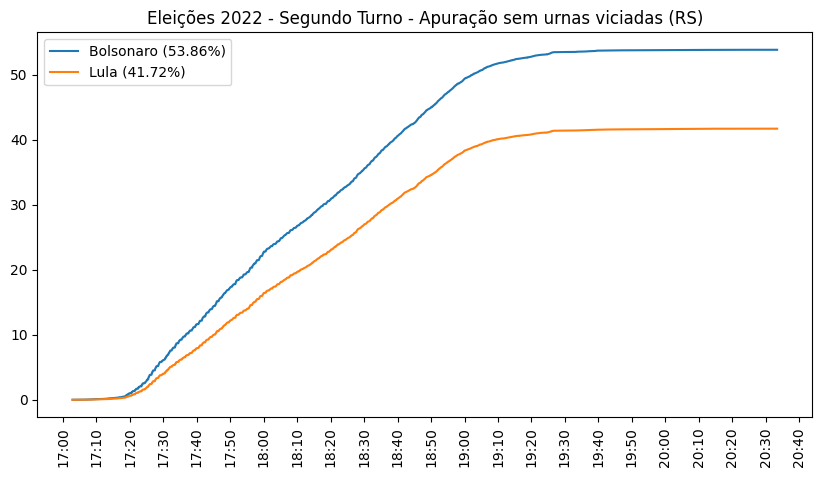

In [94]:
# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2rs, 'Total de Votos - 2º Turno', 'Rio Grande de Sul')
# Total de votos acumulados
gerar_grafico_temporal(df2rs, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'RS')
df2rs_urnas = df2rs[df2rs['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2rs_urnas[df2rs_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2rs_urnas[df2rs_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2rs_urnas_22 = df2rs_urnas[df2rs_urnas['NR_VOTAVEL'] == 22]
print(df2rs_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2rs, df2rs_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2rs_urnas_22, 'Rio Grande de Sul')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2rs_sub = df2rs[~((df2rs['CD_MUNICIPIO'].isin(df2rs_urnas_22['CD_MUNICIPIO'])) & 
                 (df2rs['NR_ZONA'].isin(df2rs_urnas_22['NR_ZONA'])) & 
                 (df2rs['NR_SECAO'].isin(df2rs_urnas_22['NR_SECAO'])) & 
                 (df2rs['NR_LOCAL_VOTACAO'].isin(df2rs_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2rs_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Rio Grande de Sul')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2rs_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'RS')

#### 2.5.2 - Resultados da Região

Urnas com 1 voto no candidato 13: 2
Urnas com 1 voto no candidato 22: 3
       NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
179642      ERECHIM       20       352              1910
207726      PELOTAS       60       506              2585
265801   RIO GRANDE      163         3              1392


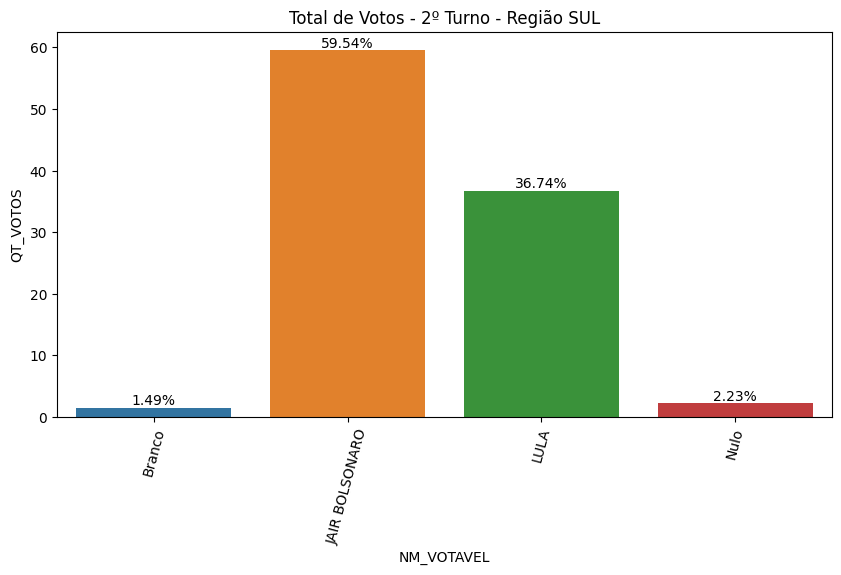

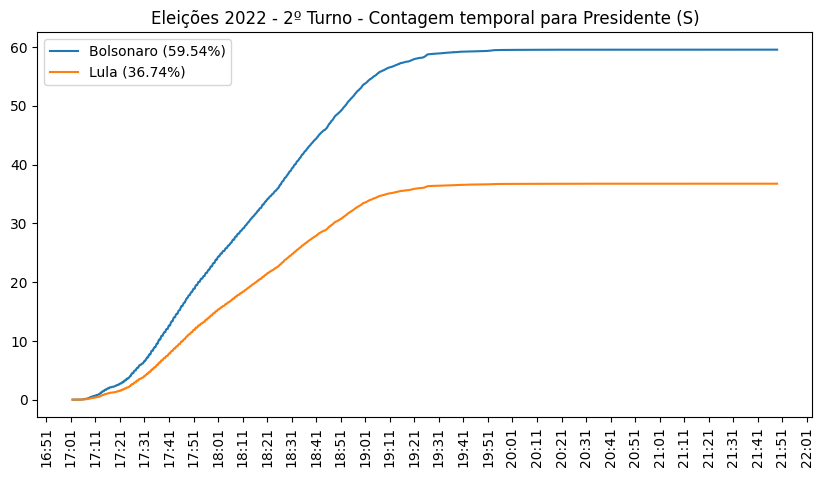

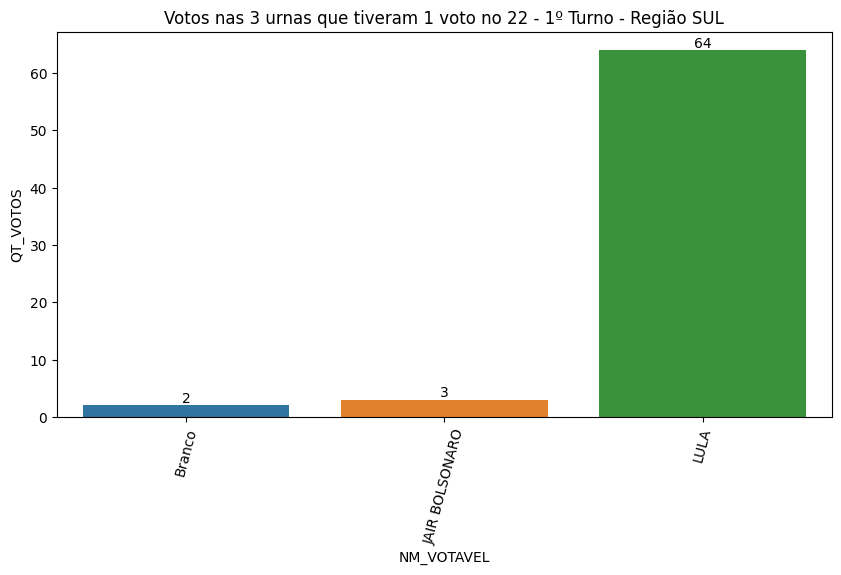

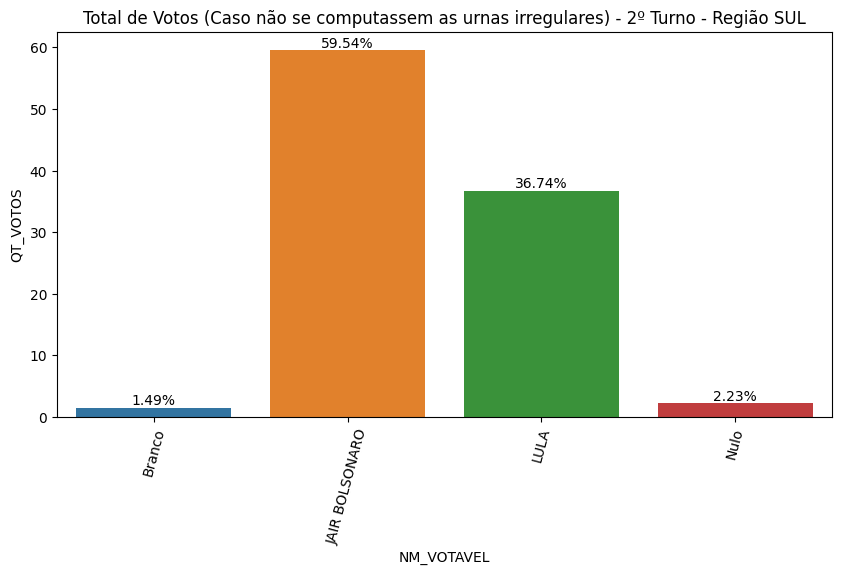

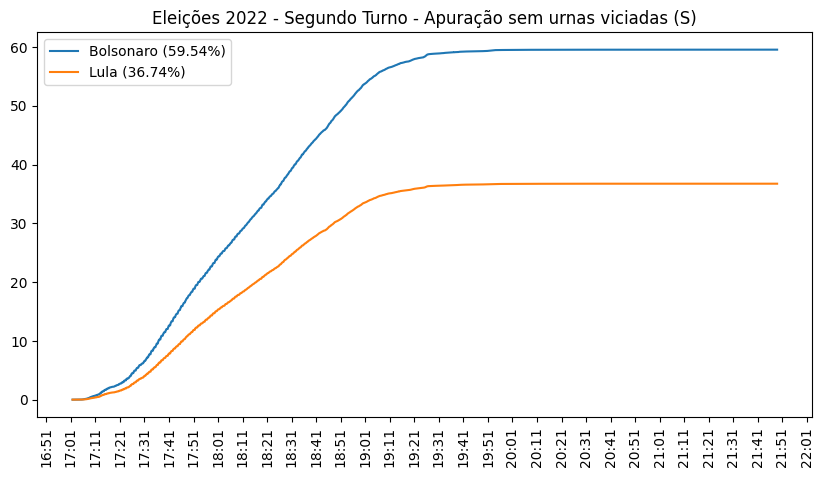

In [96]:
df2s = pd.concat([df2pr, df2sc, df2rs], ignore_index=True)

# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2s, 'Total de Votos - 2º Turno', 'Região SUL')
# Total de votos acumulados
gerar_grafico_temporal(df2s, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'S')
df2s_urnas = df2s[df2s['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2s_urnas[df2s_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2s_urnas[df2s_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2s_urnas_22 = df2s_urnas[df2s_urnas['NR_VOTAVEL'] == 22]
print(df2s_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2s, df2s_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2s_urnas_22, 'Região SUL')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2s_sub = df2s[~((df2s['CD_MUNICIPIO'].isin(df2s_urnas_22['CD_MUNICIPIO'])) & 
                 (df2s['NR_ZONA'].isin(df2s_urnas_22['NR_ZONA'])) & 
                 (df2s['NR_SECAO'].isin(df2s_urnas_22['NR_SECAO'])) & 
                 (df2s['NR_LOCAL_VOTACAO'].isin(df2s_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2s_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Região SUL')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2s_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'S')

### 2.6 - Resultado BRASIL

Urnas com 1 voto no candidato 13: 3
Urnas com 1 voto no candidato 22: 231
              NM_MUNICIPIO  NR_ZONA  NR_SECAO  NR_LOCAL_VOTACAO
39216     SENHOR DO BONFIM       45       310              1872
42425             JANDAÍRA       49       155              1171
44692          PARIPIRANGA       52       182              1155
50986           LAGOA REAL       63       111              1210
52796              BOQUIRA       65       228              1090
...                    ...      ...       ...               ...
1510416  SÃO JOÃO DA PONTE      255       146              1325
1520024        TRÊS PONTAS      273       168              1244
1749776            ERECHIM       20       352              1910
1777860            PELOTAS       60       506              2585
1835935         RIO GRANDE      163         3              1392

[231 rows x 4 columns]


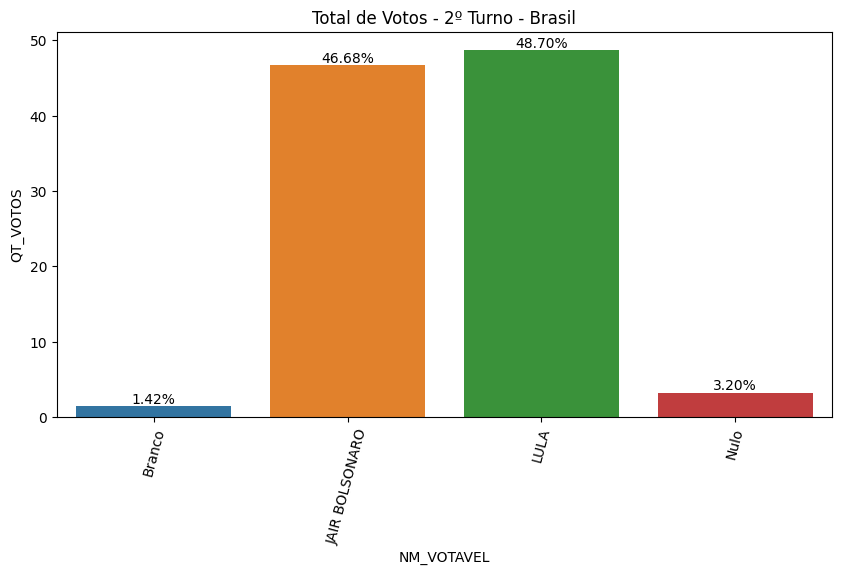

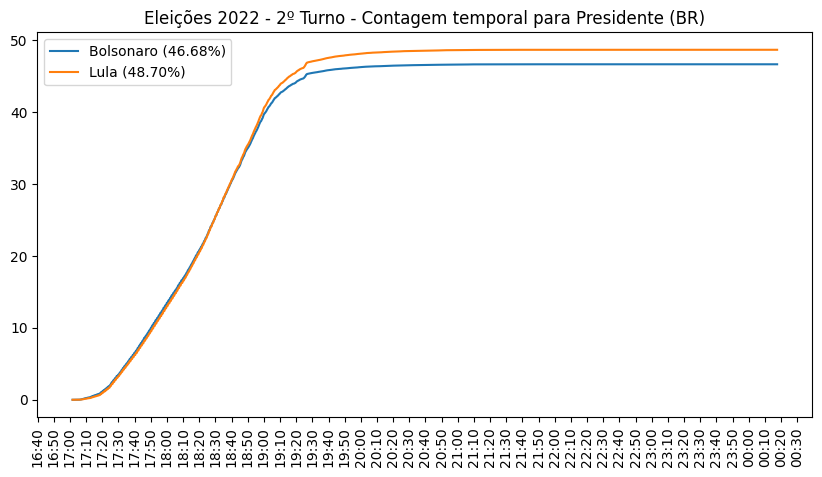

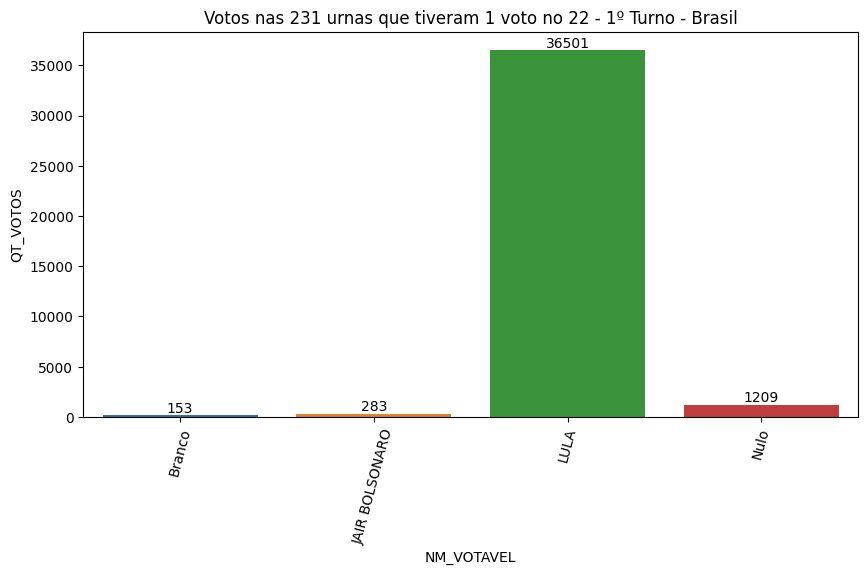

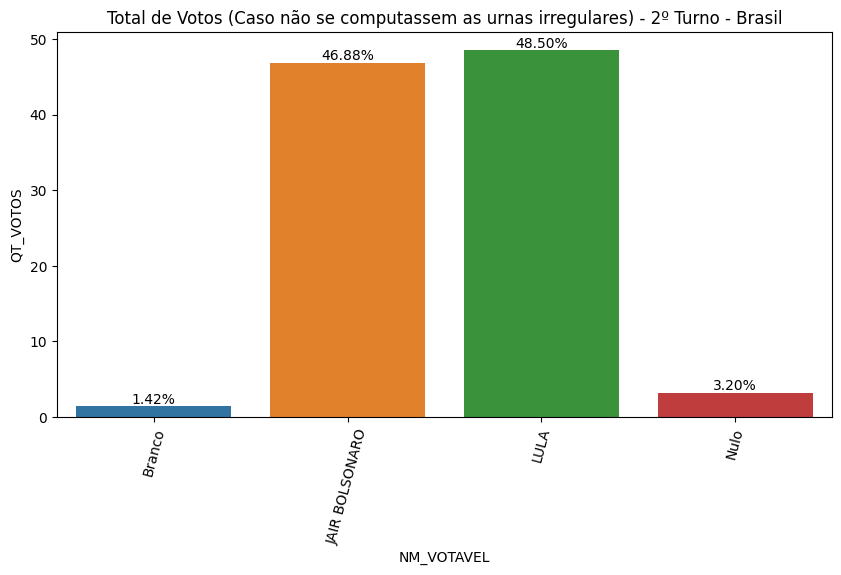

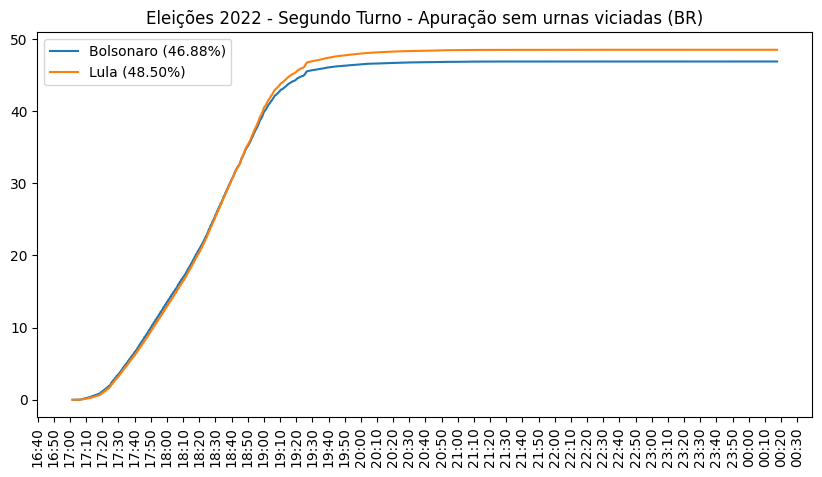

In [99]:
df2br = pd.concat([df2ne, df2n, df2co, df2sue, df2s], ignore_index=True)

# Graficos - Total no 2º turno
gerar_grafico_porcentagem(df2br, 'Total de Votos - 2º Turno', 'Brasil')
# Total de votos acumulados
gerar_grafico_temporal(df2br, 'Eleições 2022 - 2º Turno - Contagem temporal para Presidente', 'BR')
df2br_urnas = df2br[df2br['QT_VOTOS'] == 1]
print(f"Urnas com 1 voto no candidato 13: {df2br_urnas[df2br_urnas['NR_VOTAVEL'] == 13]['NR_VOTAVEL'].count()}")
print(f"Urnas com 1 voto no candidato 22: {df2br_urnas[df2br_urnas['NR_VOTAVEL'] == 22]['NR_VOTAVEL'].count()}")
df2br_urnas_22 = df2br_urnas[df2br_urnas['NR_VOTAVEL'] == 22]
print(df2br_urnas_22[['NM_MUNICIPIO', 'NR_ZONA', 'NR_SECAO', 'NR_LOCAL_VOTACAO']])
df_soma = df_diff_group(df2br, df2br_urnas_22)
if df_soma is not None:
     gerar_grafico_urnas_suspeitas(df_soma, df2br_urnas_22, 'Brasil')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     df2br_sub = df2br[~((df2br['CD_MUNICIPIO'].isin(df2br_urnas_22['CD_MUNICIPIO'])) & 
                 (df2br['NR_ZONA'].isin(df2br_urnas_22['NR_ZONA'])) & 
                 (df2br['NR_SECAO'].isin(df2br_urnas_22['NR_SECAO'])) & 
                 (df2br['NR_LOCAL_VOTACAO'].isin(df2br_urnas_22['NR_LOCAL_VOTACAO'])))]
     gerar_grafico_porcentagem(df2br_sub, 'Total de Votos (Caso não se computassem as urnas irregulares) - 2º Turno', 'Brasil')
      # Total de votos acumulados, caso as urnas em que o candidato 22 recebeu 1 voto não fossem computadas
     gerar_grafico_temporal(df2br_sub, 'Eleições 2022 - Segundo Turno - Apuração sem urnas viciadas', 'BR')